In [39]:
from import_src import import_src
import_src()

Append /home/ubuntu/sinhnq/MLOpsVN/src to sys.path


In [40]:
from raw_data_processor import RawDataProcessor

In [41]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import os
import json
from plotly import express as px

In [42]:
import warnings
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)

In [43]:
SRC_DIR = '../../../../share/data/captured_data/phase-2/prob-2/'

In [44]:
test_data = pd.read_parquet(SRC_DIR+'0348f5f5-42cf-43a7-996e-1ec98591e7c9.parquet')

In [45]:
df_prob2 = pd.read_parquet('../../data/raw_data/phase-2/prob-2/raw_train.parquet')

In [46]:
test_data = test_data.reindex(columns=df_prob2.drop(['label'], axis=1).columns)
test_data

,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,feature10,...,feature32,feature33,feature34,feature35,feature36,feature37,feature38,feature39,feature40,feature41
0,0.000005,118,2,-1,2.0,0.0,114.0,0.0,254.0,0.0,...,13.0,13.0,13.0,17.0,0.0,0.0,0.0,13.0,17.0,0.0
1,17.236902,112,5,3,1600.0,244.0,2161302.0,10502.0,254.0,252.0,...,2.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0
2,0.970114,112,-1,-1,10.0,6.0,590.0,268.0,254.0,252.0,...,2.0,1.0,1.0,2.0,0.0,0.0,0.0,1.0,3.0,0.0
3,0.006765,-1,-1,-1,18.0,18.0,4216.0,2456.0,31.0,29.0,...,5.0,1.0,1.0,3.0,0.0,0.0,0.0,4.0,6.0,0.0
4,0.000003,118,-1,-1,2.0,0.0,114.0,0.0,254.0,0.0,...,18.0,17.0,17.0,33.0,0.0,0.0,0.0,17.0,33.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.653993,112,-1,-1,10.0,8.0,1550.0,354.0,254.0,252.0,...,2.0,1.0,1.0,5.0,0.0,0.0,0.0,2.0,5.0,0.0
996,1.064049,112,5,3,12.0,18.0,1580.0,10168.0,31.0,29.0,...,2.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,2.0,0.0
997,0.000009,118,2,-1,2.0,0.0,114.0,0.0,254.0,0.0,...,21.0,21.0,11.0,21.0,0.0,0.0,0.0,22.0,21.0,0.0
998,0.000002,-1,2,4,2.0,0.0,114.0,0.0,254.0,0.0,...,18.0,18.0,18.0,18.0,0.0,0.0,0.0,18.0,18.0,0.0


In [47]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

df_num = df_prob2.select_dtypes(include='float64')
df_cat = df_prob2.select_dtypes(exclude=numerics)

In [48]:
files = os.listdir(SRC_DIR)

In [83]:
count = 0
test_data = pd.DataFrame()
df['label'] = [1]*len(df)
for file in files:
    if file == 'processed': continue
    tmp = pd.read_parquet(SRC_DIR+file)
    tmp = tmp.reindex(columns=df_prob2.drop(['label'], axis=1).columns)
    tmp['label'] = [0]*len(tmp)
    test_data = pd.concat([test_data, tmp], axis=0)


In [85]:
df = test_data.sample(frac=0.5)

In [88]:
tmp = df_prob2.drop(['label'], axis=1)
tmp['label'] = [1]*len(tmp)

In [89]:
df = pd.concat([df, tmp], axis=0)

In [90]:
df.drop(['feature2', 'feature3', 'feature4'], axis=1, inplace=True)

In [92]:
df.reset_index(inplace=True, drop=True)
df = df.sample(frac=1)

In [93]:
from sklearn.model_selection import train_test_split
x_train = df[df.columns[:-1]]
y_train = df[df.columns[-1]]


In [ ]:
from pycaret.classification import *

s = setup(df, target = 'label', session_id = 123)
s.compare_models()

In [94]:
import lightgbm as lgb
clf = lgb.LGBMClassifier()
clf.fit(x_train, y_train)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [99]:
for file in files:
    if file == 'processed': continue
    test_data = pd.read_parquet(SRC_DIR+file)
    test_data = test_data.reindex(columns=df_prob2.drop(['label'], axis=1).columns)
    test_data.drop(['feature2', 'feature3', 'feature4'], axis=1, inplace=True)
    y_pred = clf.predict(test_data)
    print(f'LightGBM Model accuracy score {file}: {sum(y_pred)/len(y_pred)}')

LightGBM Model accuracy score c31f5368-7e08-4843-8e32-aa3e3820a392.parquet: 0.722
LightGBM Model accuracy score f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet: 0.7413249211356467
LightGBM Model accuracy score 68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet: 0.7148692810457516
LightGBM Model accuracy score 2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet: 0.725
LightGBM Model accuracy score 33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet: 0.723
LightGBM Model accuracy score a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet: 0.723
LightGBM Model accuracy score d53579d1-3851-480d-9acf-81b31714bcc4.parquet: 0.733
LightGBM Model accuracy score 53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet: 0.7413249211356467
LightGBM Model accuracy score 66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet: 0.7413249211356467
LightGBM Model accuracy score 123.parquet: 0.9445
LightGBM Model accuracy score 636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet: 0.722
LightGBM Model accuracy score 8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet: 0.

In [48]:
from sklearn.metrics import accuracy_score
accuracy=accuracy_score(y_pred, y_test)
print('LightGBM Model accuracy score: {0:0.4f}'.format(accuracy_score(y_test, y_pred)))

LightGBM Model accuracy score: 0.6236


In [49]:
def calculate_psi(expected, actual, buckettype='bins', buckets=10, axis=0):

    def psi(expected_array, actual_array, buckets):
        def scale_range (input, min, max):
            input += -(np.min(input))
            input /= np.max(input) / (max - min)
            input += min
            return input

        breakpoints = np.arange(0, buckets + 1) / (buckets) * 100

        if buckettype == 'bins':
            breakpoints = scale_range(breakpoints, np.min(expected_array), np.max(expected_array))
        elif buckettype == 'quantiles':
            breakpoints = np.stack([np.percentile(expected_array, b) for b in breakpoints])



        expected_percents = np.histogram(expected_array, breakpoints)[0] / len(expected_array)
        actual_percents = np.histogram(actual_array, breakpoints)[0] / len(actual_array)

        def sub_psi(e_perc, a_perc):
            '''Calculate the actual PSI value from comparing the values.
               Update the actual value to a very small number if equal to zero
            '''
            if a_perc == 0:
                a_perc = 0.0001
            if e_perc == 0:
                e_perc = 0.0001

            value = (e_perc - a_perc) * np.log(e_perc / a_perc)
            return(value)

        psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))

        return(psi_value)

    if len(expected.shape) == 1:
        psi_values = np.empty(len(expected.shape))
    else:
        psi_values = np.empty(expected.shape[axis])

    for i in range(0, len(psi_values)):
        if len(psi_values) == 1:
            psi_values = psi(expected, actual, buckets)
        elif axis == 0:
            psi_values[i] = psi(expected[:,i], actual[:,i], buckets)
        elif axis == 1:
            psi_values[i] = psi(expected[i,:], actual[i,:], buckets)

    return(psi_values)

In [11]:
# def _psi(expected: np.ndarray, actual: np.ndarray, bucket_type: str = "bins", n_bins: int = 10) -> float:
#     """Calculate PSI metric for two arrays.
    
#     Parameters
#     ----------
#         expected : list-like
#             Array of expected values
#         actual : list-like
#             Array of actual values
#         bucket_type : str
#             Binning strategy. Accepts two options: 'bins' and 'quantiles'. Defaults to 'bins'.
#             'bins': input arrays are splitted into bins with equal
#                 and fixed steps based on 'expected' array
#             'quantiles': input arrays are binned according to 'expected' array
#                 with given number of n_bins
#         n_bins : int
#             Number of buckets for binning. Defaults to 10.

#     Returns
#     -------
#         A single float number
#     """
#     breakpoints = np.arange(0, n_bins + 1) / (n_bins) * 100
#     if bucket_type == "bins":
#         breakpoints = np.histogram(expected, n_bins)[1]
#     elif bucket_type == "quantiles":
#         breakpoints = np.percentile(expected, breakpoints)

#     # Calculate frequencies
#     expected_percents = np.histogram(expected, breakpoints)[0] / len(expected)
#     actual_percents = np.histogram(actual, breakpoints)[0] / len(actual)
#     # Clip freaquencies to avoid zero division
#     expected_percents = np.clip(expected_percents, a_min=0.0001, a_max=None)
#     actual_percents = np.clip(actual_percents, a_min=0.0001, a_max=None)
#     # Calculate PSI
#     psi_value = (expected_percents - actual_percents) * np.log(expected_percents / actual_percents)
#     psi_value = sum(psi_value)

#     return psi_value


# def calculate_psi(
#         expected: np.ndarray, actual: np.ndarray, bucket_type: str = "bins", n_bins: int = 10, axis: int = 0
# ) -> np.ndarray:
#     """Apply PSI calculation to 2 1-d or 2-d arrays.

#     Parameters
#     ----------
#     expected : list-like
#         Array of expected values
#     actual : list-like
#         Array of actual values
#     bucket_type : str
#         Binning strategy. Accepts two options: 'bins' and 'quantiles'. Defaults to 'bins'.
#             'bins' - input arrays are splitted into bins with equal
#                 and fixed steps based on ’expected' array
#             'quantiles' - input arrays are binned according to ’expected’ array
#                 with given number of n_bins
#     n_bins : int
#         Number of buckets for binning. Defaults to 10.

#     Returns
#     -------
#         np.ndarray
#     """
#     if len(expected.shape) == 1:
#         psi_values = np.empty(len(expected.shape))
#     else:
#         psi_values = np.empty(expected.shape[axis])

#     for i in range(0, len(psi_values)):
#         if len(psi_values) == 1:
#             psi_values = _psi(expected, actual, bucket_type, n_bins)
#         elif axis == 0:
#             psi_values[i] = _psi(expected[:, i], actual[:, i], bucket_type, n_bins)
#         elif axis == 1:
#             psi_values[i] = _psi(expected[i, :], actual[i, :], bucket_type, n_bins)
#         return np.array(psi_values)

In [12]:
# import seaborn as sns
# sns.set_style("white")
# rs = np.random.RandomState(2332)

# initial = df_prob1.feature1.values
# new = test_data.feature1.values

In [13]:
# import torch
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# def MMD(x, y, kernel='rbf'):
#     """Emprical maximum mean discrepancy. The lower the result
#        the more evidence that distributions are the same.

#     Args:
#         x: first sample, distribution P
#         y: second sample, distribution Q
#         kernel: kernel type such as "multiscale" or "rbf"
#     """
#     xx, yy, zz = torch.mm(x, x.t()), torch.mm(y, y.t()), torch.mm(x, y.t())
#     rx = (xx.diag().unsqueeze(0).expand_as(xx))
#     ry = (yy.diag().unsqueeze(0).expand_as(yy))
    
#     dxx = rx.t() + rx - 2. * xx # Used for A in (1)
#     dyy = ry.t() + ry - 2. * yy # Used for B in (1)
#     dxy = rx.t() + ry - 2. * zz # Used for C in (1)
    
#     XX, YY, XY = (torch.zeros(xx.shape).to(device),
#                   torch.zeros(xx.shape).to(device),
#                   torch.zeros(xx.shape).to(device))
    
#     if kernel == "multiscale":
        
#         bandwidth_range = [0.2, 0.5, 0.9, 1.3]
#         for a in bandwidth_range:
#             XX += a**2 * (a**2 + dxx)**-1
#             YY += a**2 * (a**2 + dyy)**-1
#             XY += a**2 * (a**2 + dxy)**-1
            
#     if kernel == "rbf":
      
#         bandwidth_range = [10, 15, 20, 50]
#         for a in bandwidth_range:
#             XX += torch.exp(-0.5*dxx/a)
#             YY += torch.exp(-0.5*dyy/a)
#             XY += torch.exp(-0.5*dxy/a)
      
      

#     return torch.mean(XX + YY - 2. * XY)

In [15]:
from scipy import stats

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


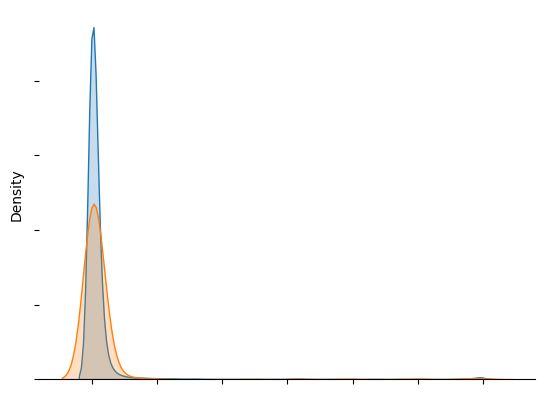

feature5
feature5 0.0005798593113597689


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


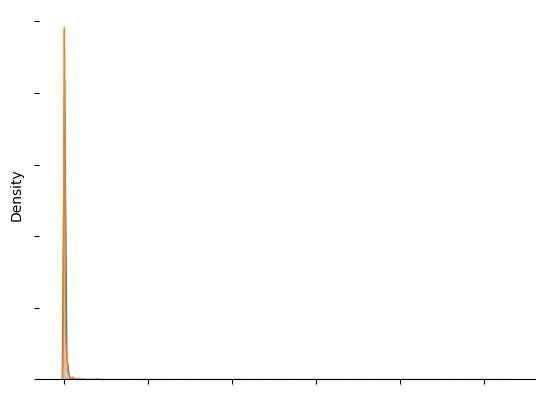

feature6
feature6 0.0006329056219331445


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


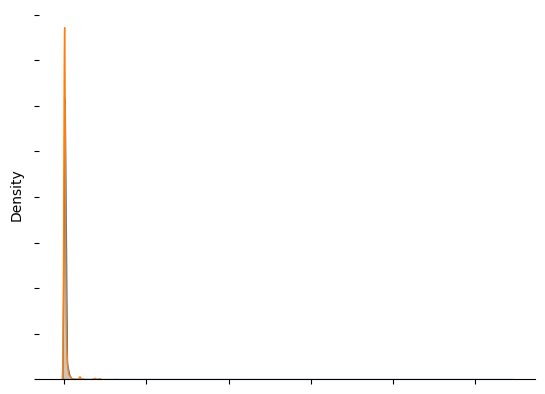

feature7
feature7 0.0022571451817102097


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


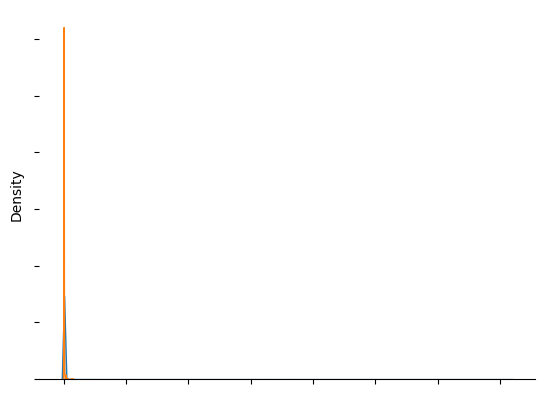

feature8
feature8 0.0011514585726016405


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


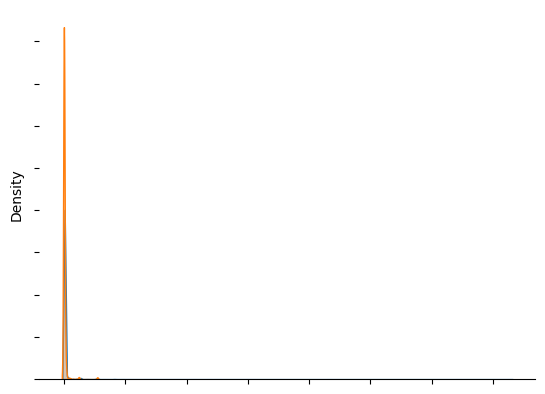

feature9
feature9 0.000606635438327633


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


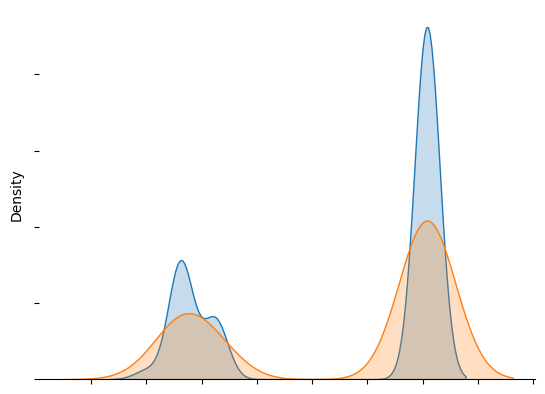

feature10
feature10 0.0014774370361225328


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


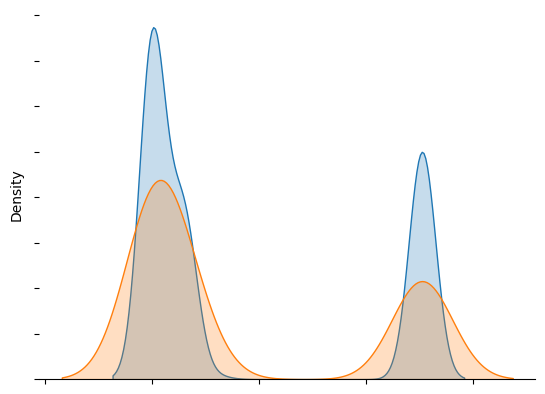

feature11
feature11 0.02331930414991017


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


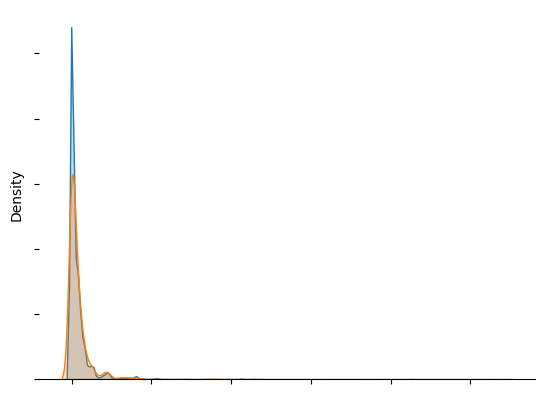

feature12
feature12 0.01510875640612362


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


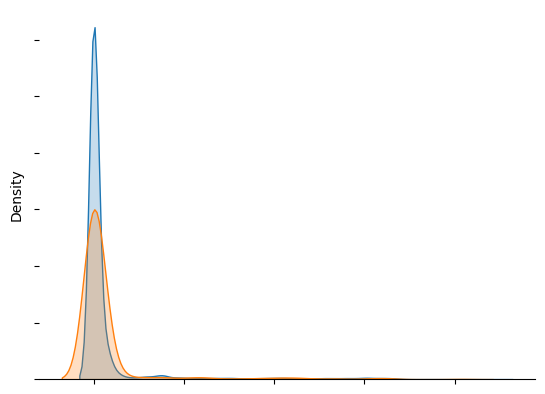

feature13
feature13 0.0005642046473190873


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


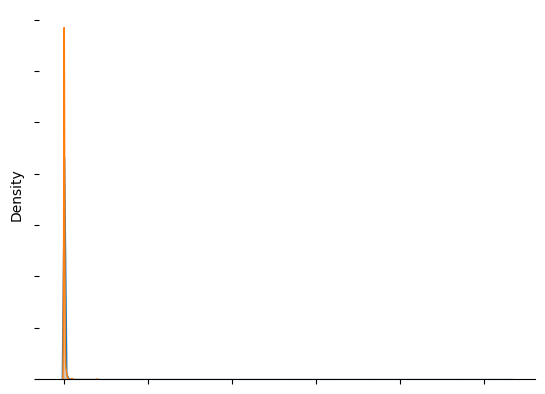

feature14
feature14 0.0011863668899709627


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


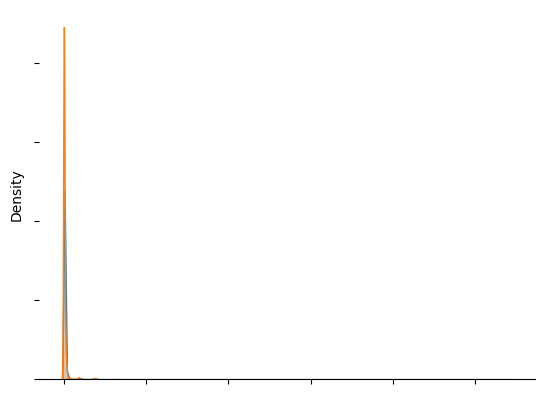

feature15
feature15 0.0023352070159581573


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


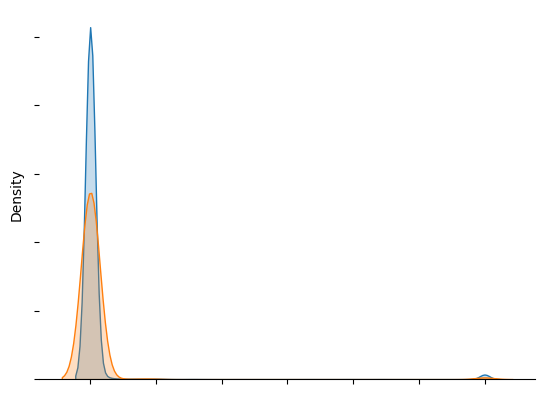

feature16
feature16 0.001709645481072824


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


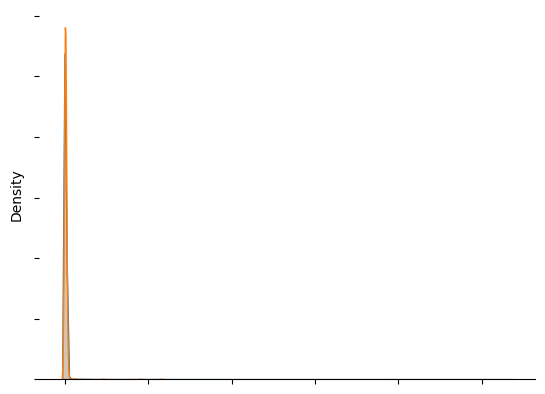

feature17
feature17 0.0063417366894555245


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


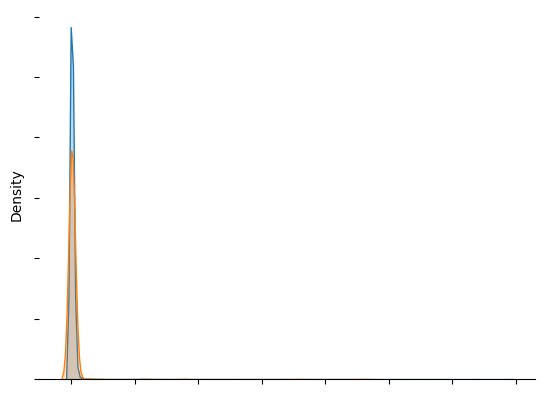

feature18
feature18 0.0026852882859952575


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


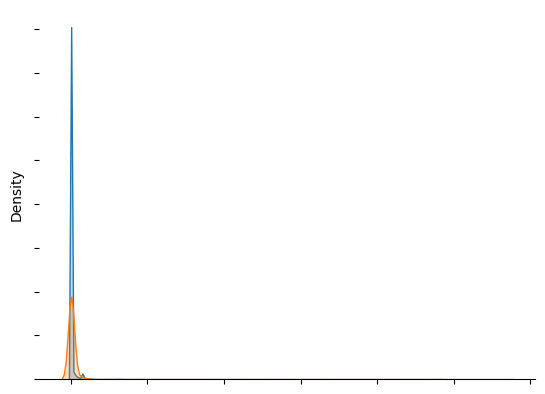

feature19
feature19 0.002357705365602817


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


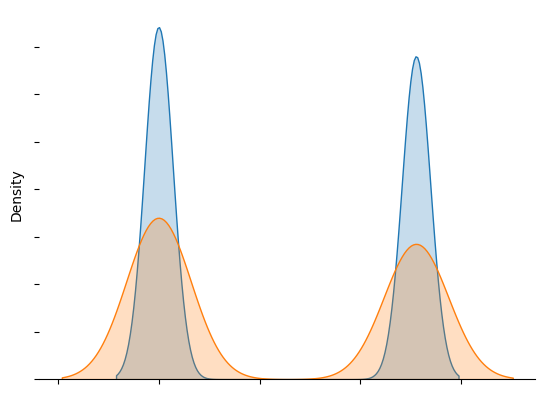

feature20
feature20 0.034505066402860524


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


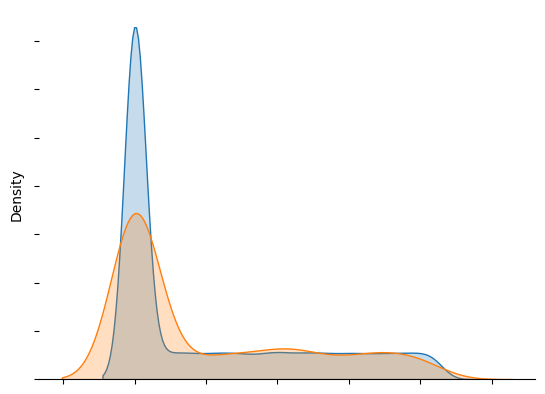

feature21
feature21 0.03831446358719946


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


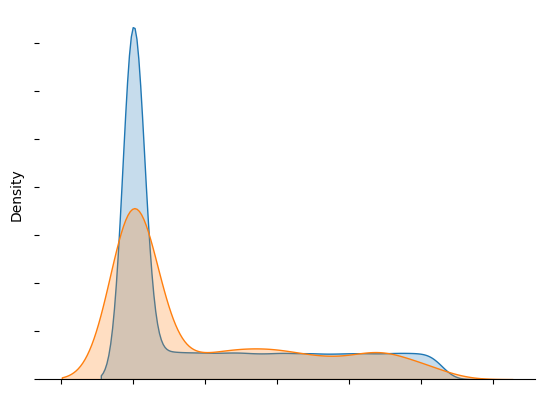

feature22
feature22 0.0011186555899297865


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


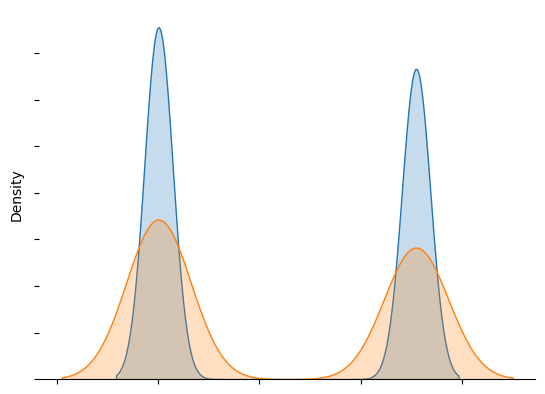

feature23
feature23 0.001560026258396586


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


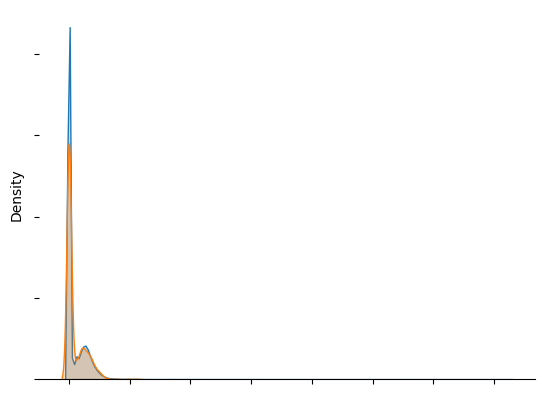

feature24
feature24 0.0024424298242294393


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


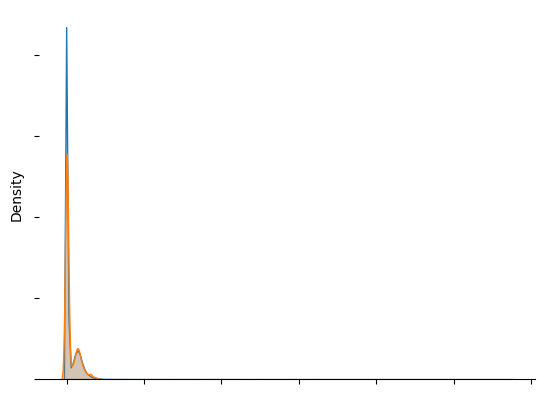

feature25
feature25 0.0007944667615611715


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


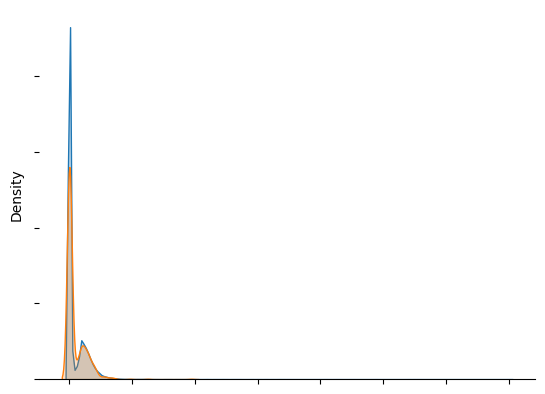

feature26
feature26 0.018139360302783417


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


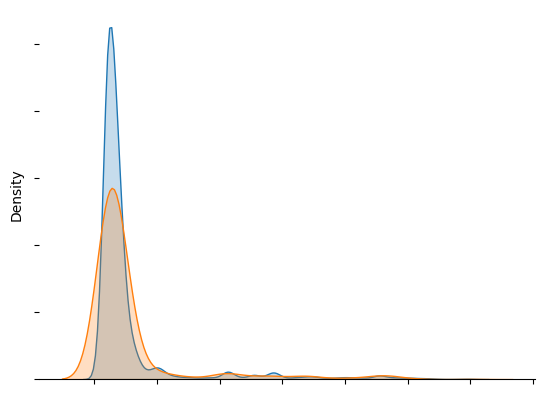

feature27
feature27 0.02555050375782193


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


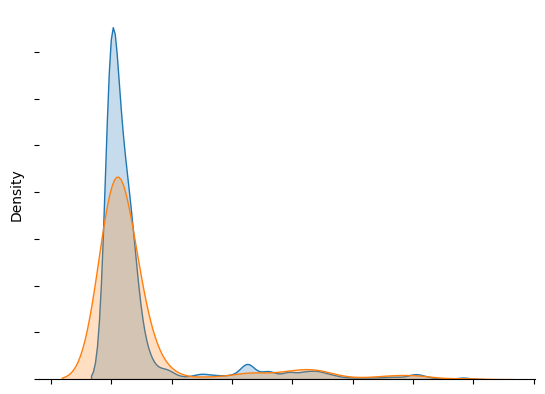

feature28
feature28 0.0015721768068642417


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


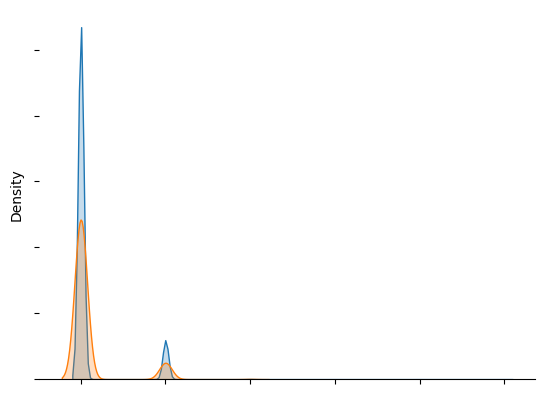

feature29
feature29 0.0006868563677454025


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


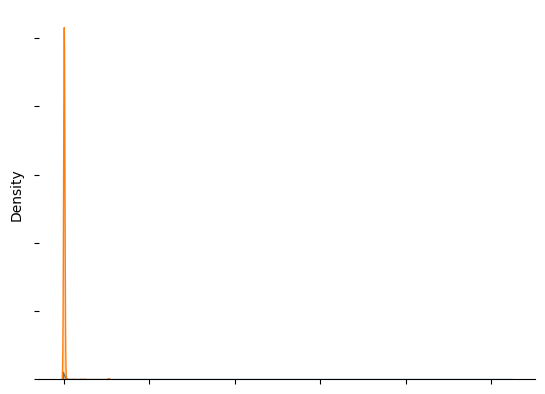

feature30
feature30 0.004802301576464649


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


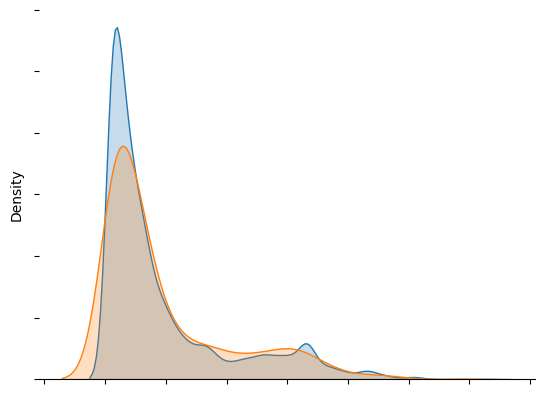

feature31
feature31 0.008580554738083931


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


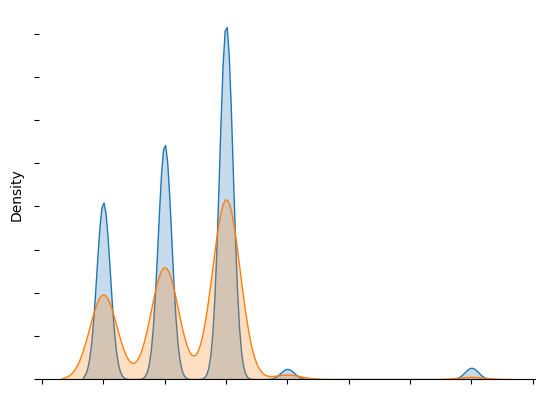

feature32
feature32 0.009554335440928489


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


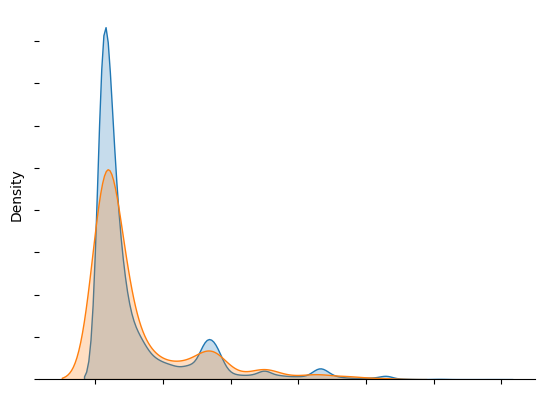

feature33
feature33 0.014867551999726555


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


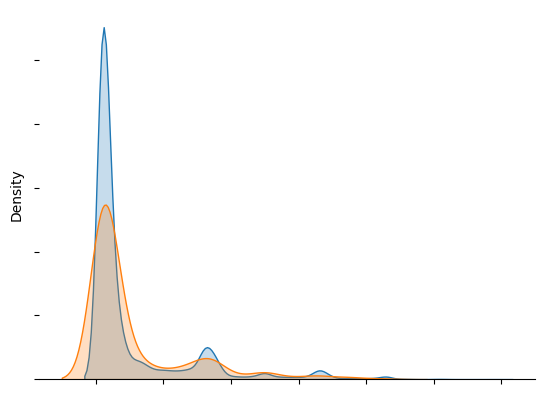

feature34
feature34 0.007109961841965414


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


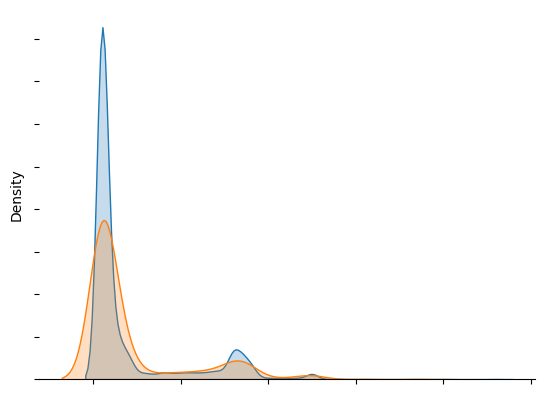

feature35
feature35 0.007354065072239506


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


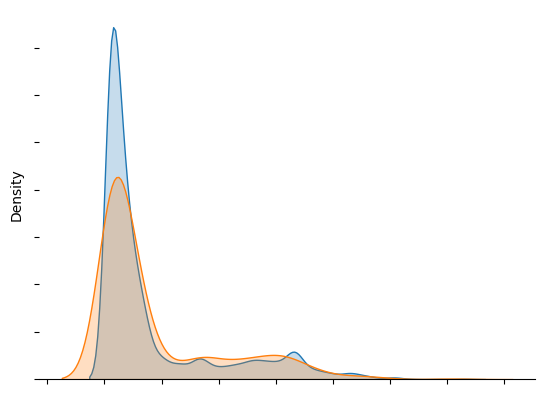

feature36
feature36 0.000246808267609414


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


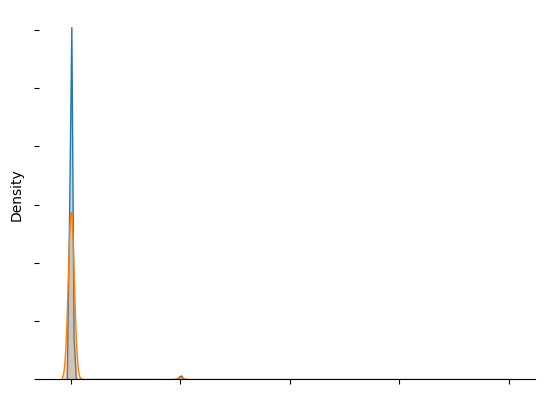

feature37
feature37 0.0001339306583380633


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


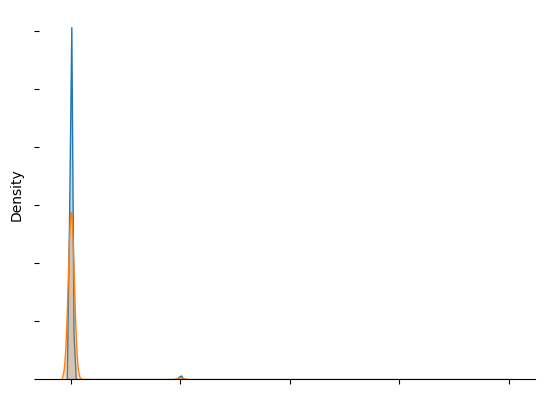

feature38
feature38 0.0021760146353375794


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


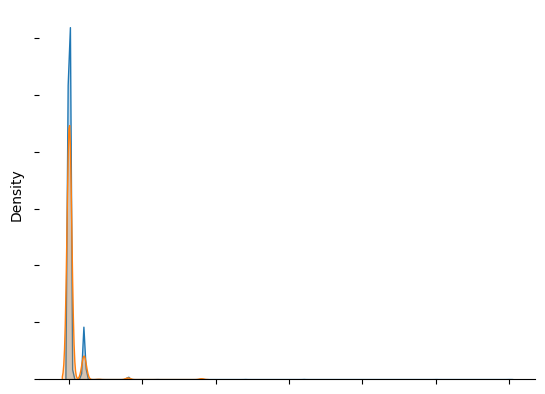

feature39
feature39 0.009101915952711006


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


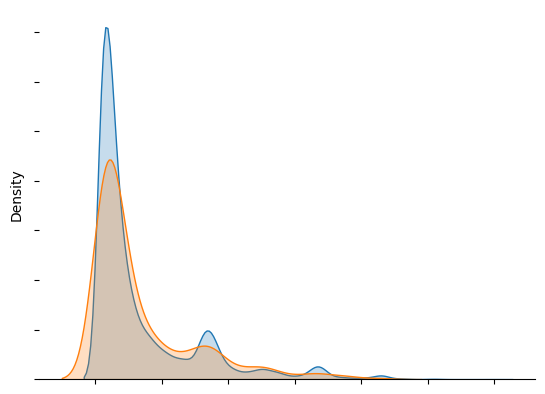

feature40
feature40 0.00415538414672804


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


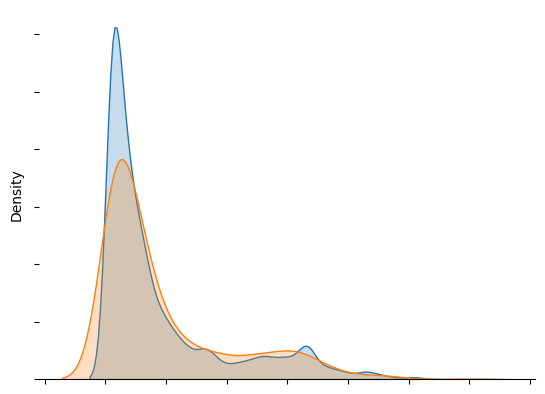

feature41
feature41 0.0006828250623678463


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


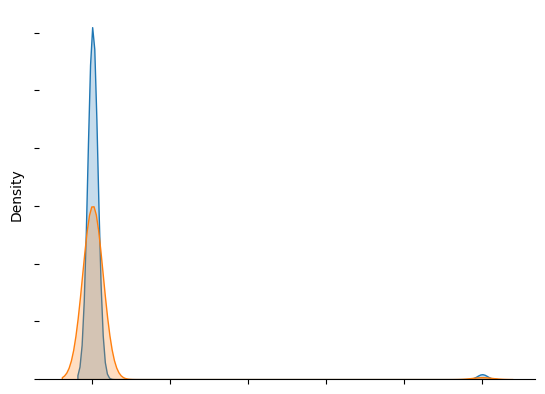

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


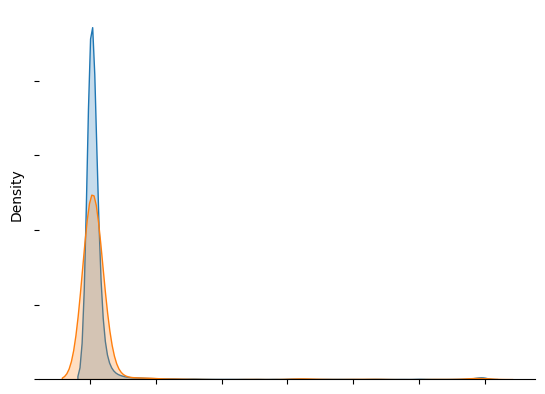

feature5
feature5 0.0005798593113597689


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


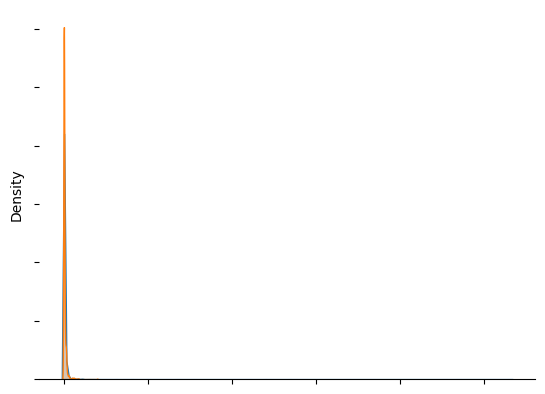

feature6
feature6 0.0016197385998306382


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


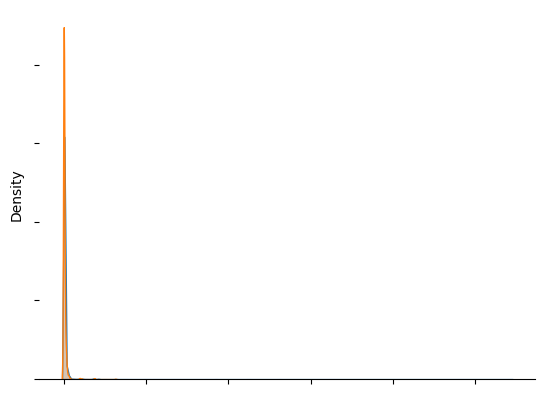

feature7
feature7 0.0022571451817102097


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


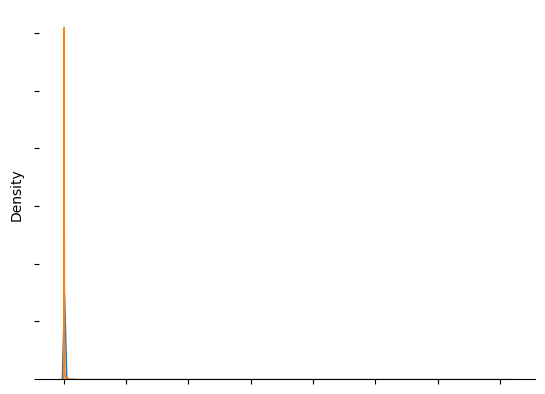

feature8
feature8 0.0027889051461648094


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


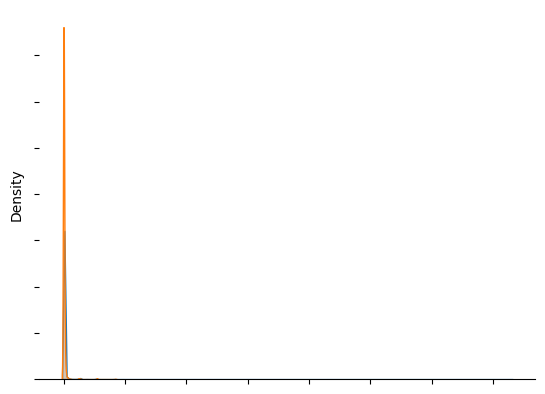

feature9
feature9 0.00030112150768928607


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


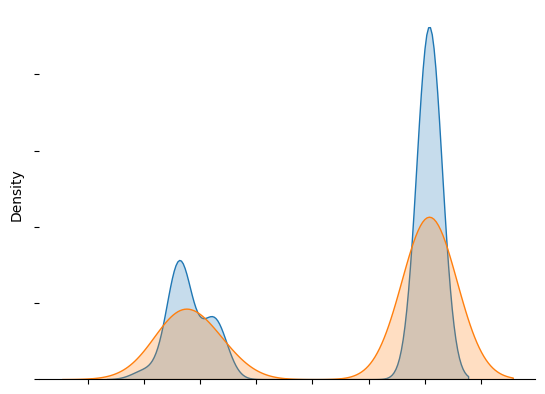

feature10
feature10 0.00042396088483724517


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


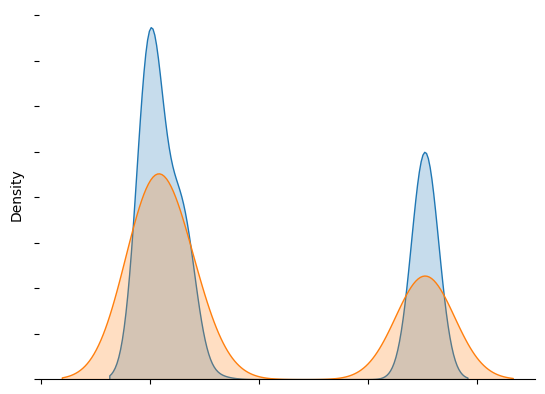

feature11
feature11 0.011508501211153805


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


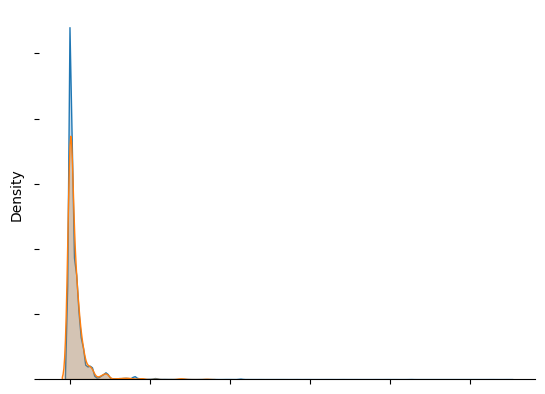

feature12
feature12 0.014203259888383361


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


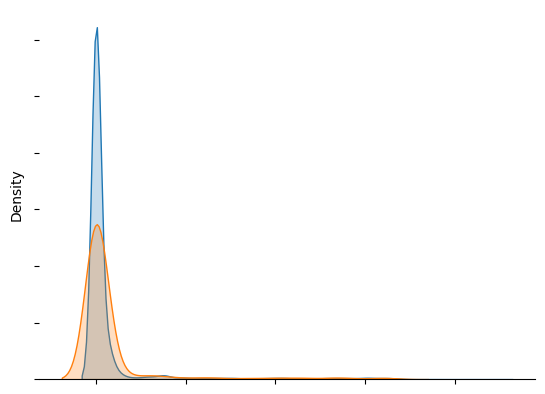

feature13
feature13 0.0005642046473190873


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


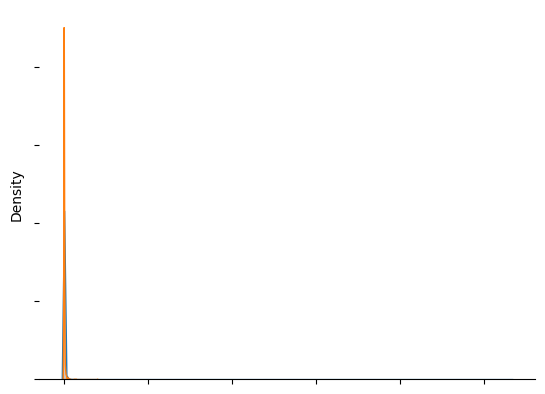

feature14
feature14 0.0007250265828031149


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


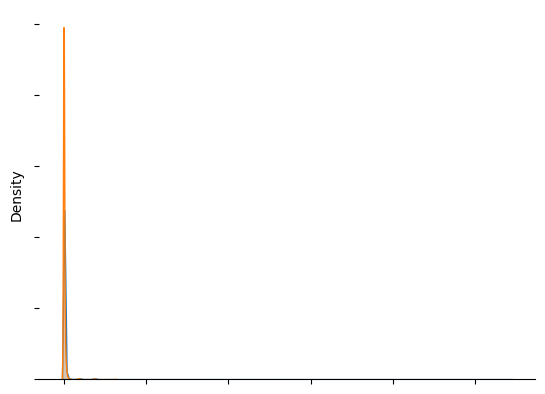

feature15
feature15 0.011305840903371002


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


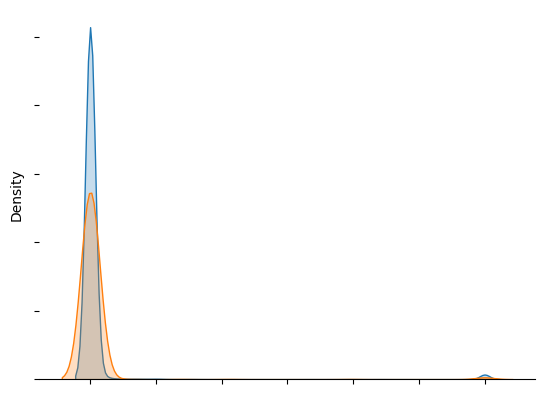

feature16
feature16 0.01022654368841924


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


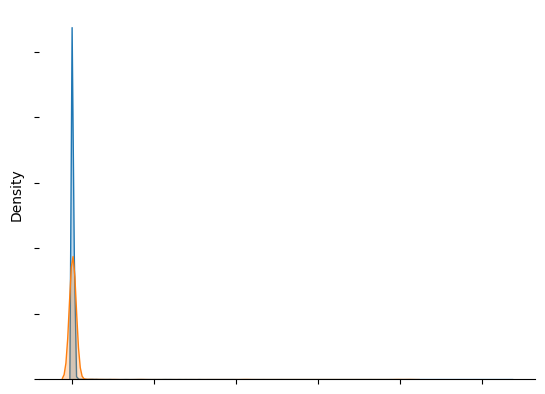

feature17
feature17 0.0051542938397418055


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


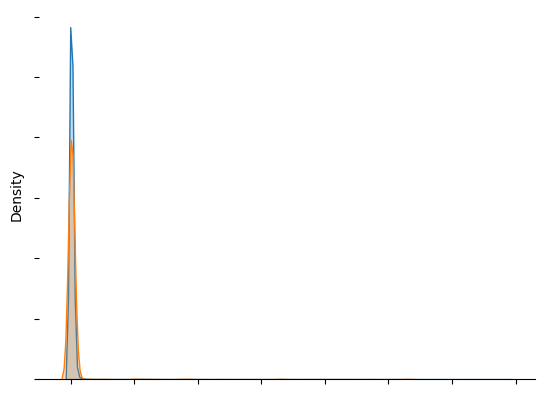

feature18
feature18 0.0016900162524534218


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


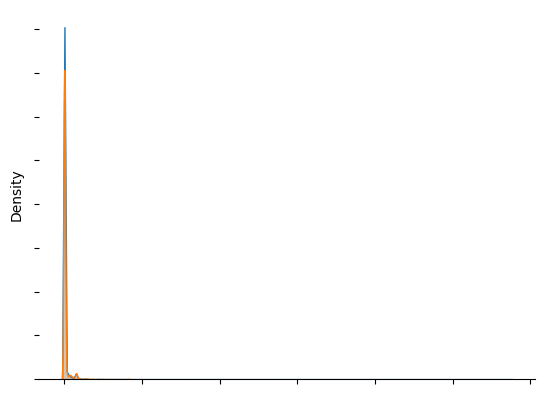

feature19
feature19 0.0007254195813879124


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


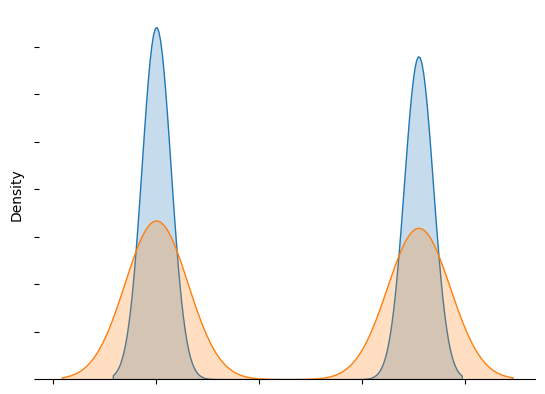

feature20
feature20 0.02780553592536586


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


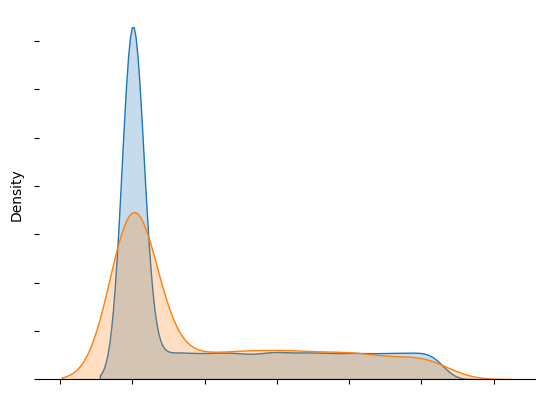

feature21
feature21 0.034834870467515745


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


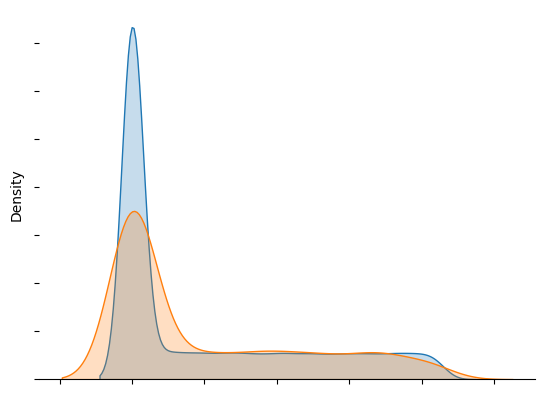

feature22
feature22 0.0006978161045659973


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


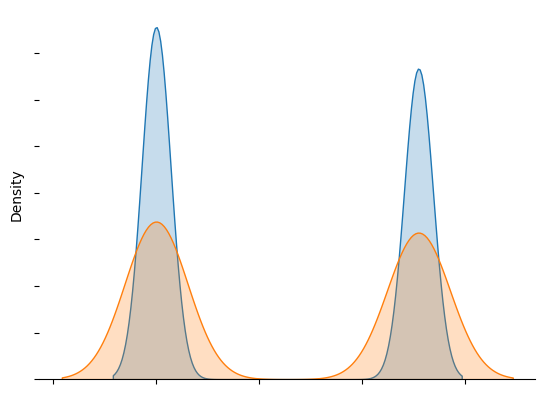

feature23
feature23 0.0009738895099359788


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


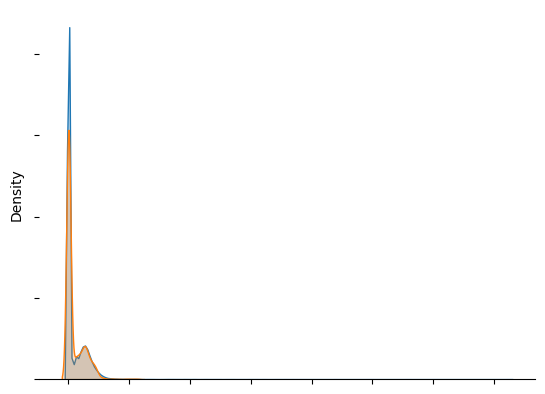

feature24
feature24 0.0024424298242294393


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


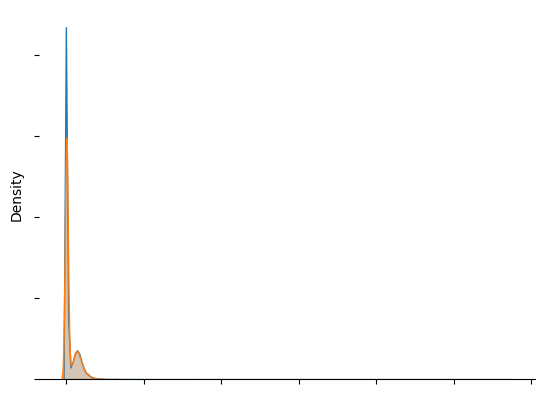

feature25
feature25 0.002105881835793178


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


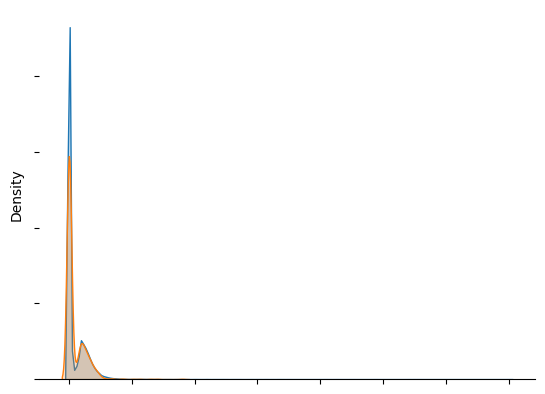

feature26
feature26 0.007528381977825894


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


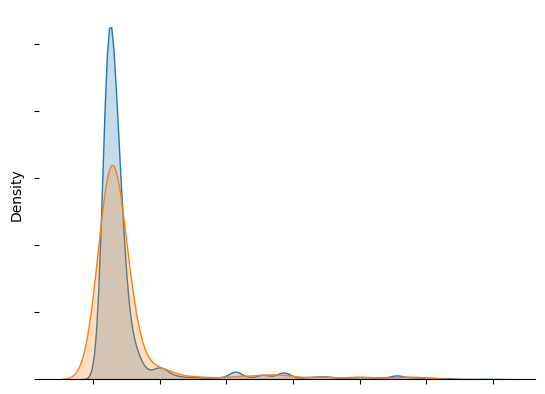

feature27
feature27 0.006428921485613068


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


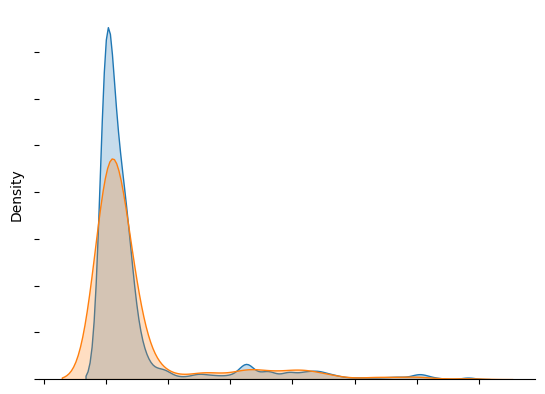

feature28
feature28 0.0006659217102040719


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


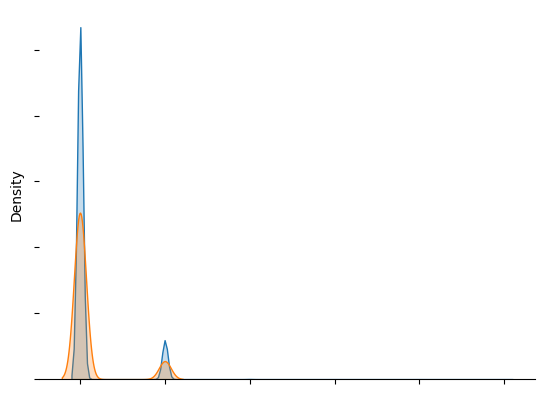

feature29
feature29 0.00038966130659964776


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


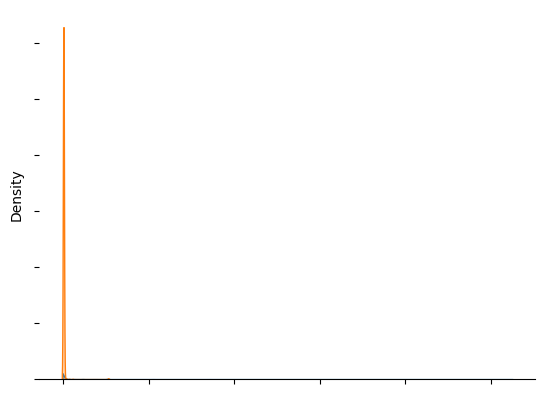

feature30
feature30 0.007083530455201889


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


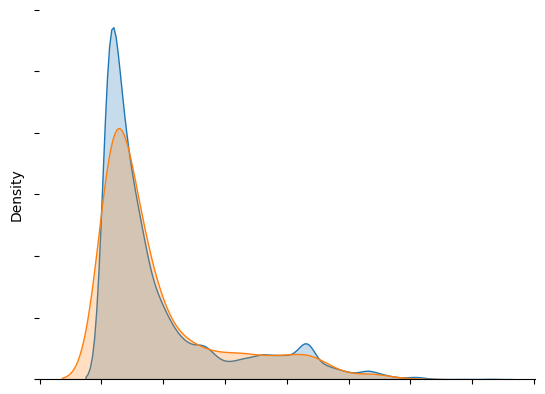

feature31
feature31 0.0008221850455581832


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


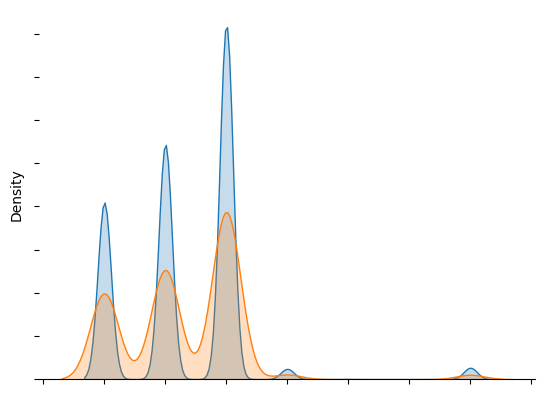

feature32
feature32 0.0026884066846879196


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


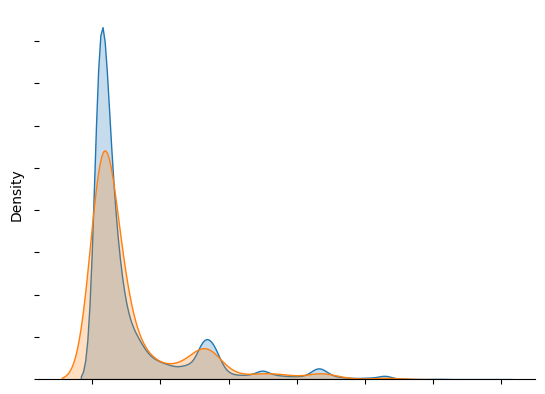

feature33
feature33 0.0049254287150458


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


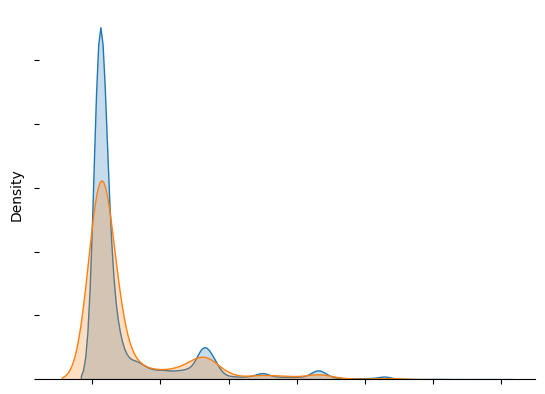

feature34
feature34 0.0008557083296899714


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


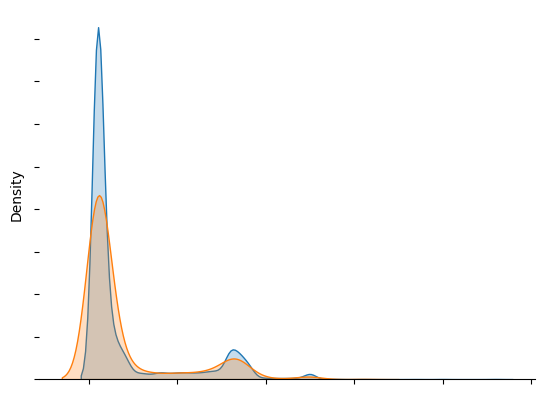

feature35
feature35 0.00845498707504458


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


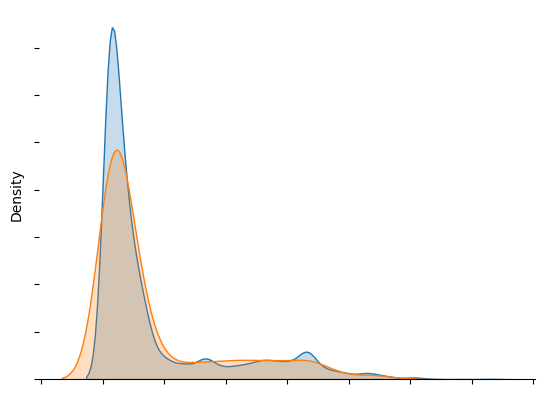

feature36
feature36 0.004668231472658243


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


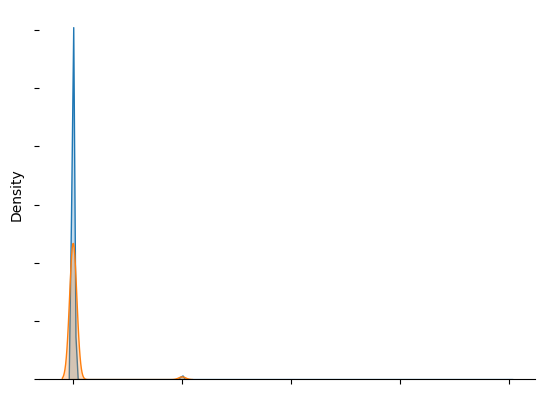

feature37
feature37 0.004593056108234334


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


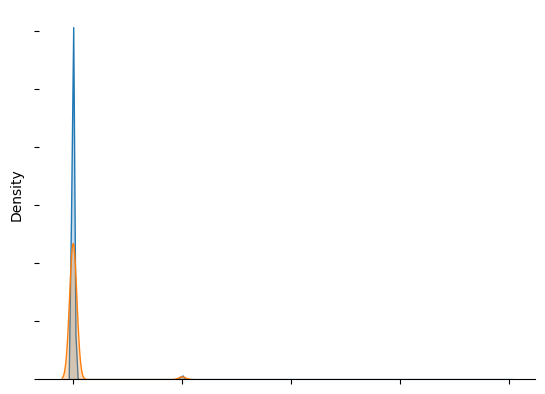

feature38
feature38 0.0033321492930878664


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


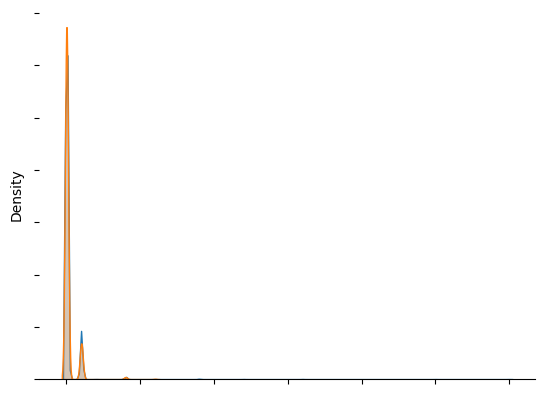

feature39
feature39 0.00430862249472693


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


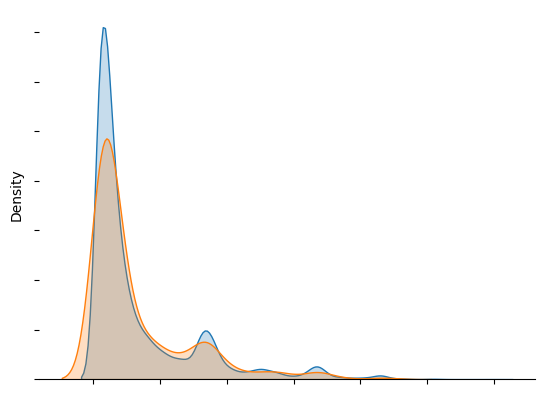

feature40
feature40 0.005842381920493912


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


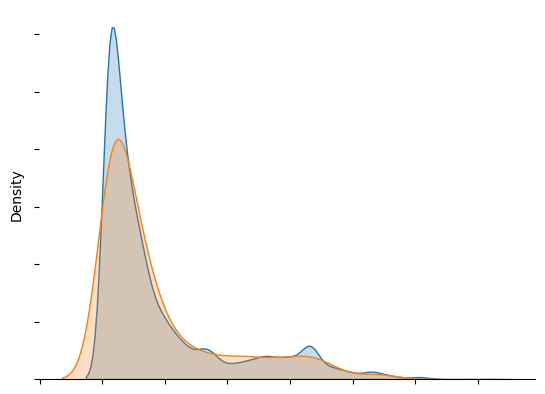

feature41
feature41 0.0011182645660917144


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


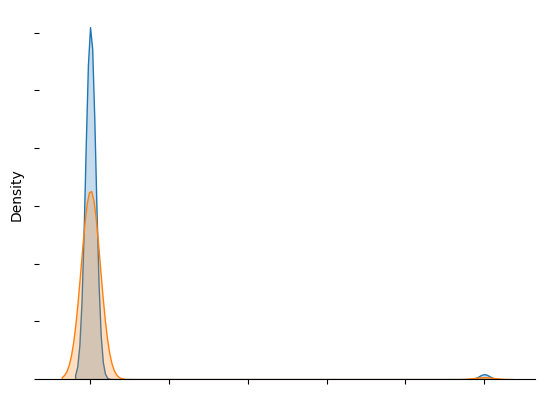

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


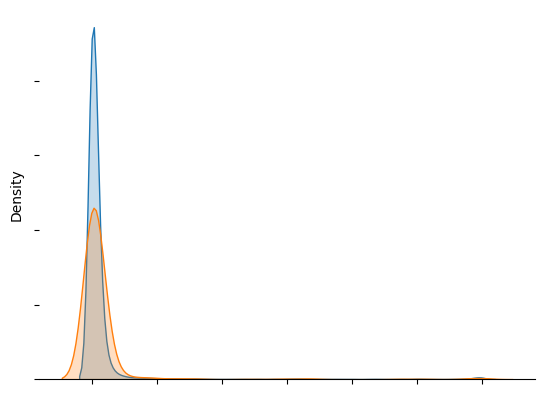

feature5
feature5 0.0005798593113597689


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


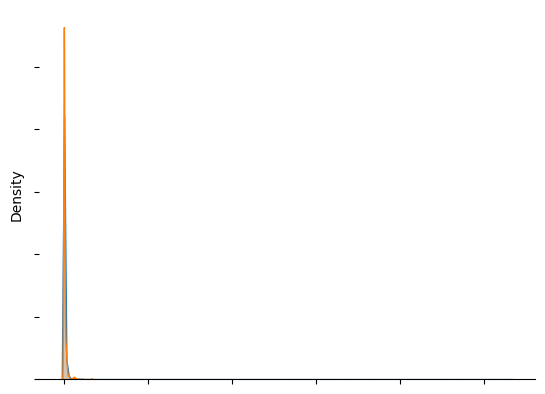

feature6
feature6 0.005965122909471142


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


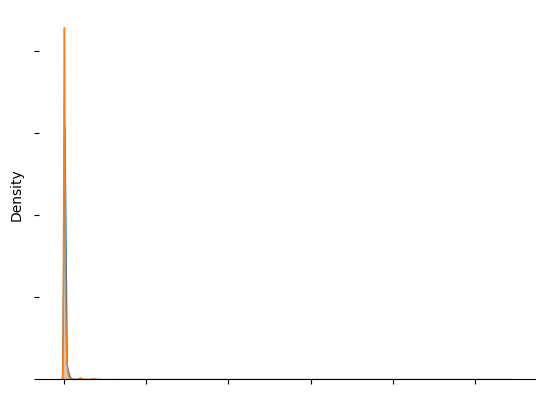

feature7
feature7 0.003239404844724344


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


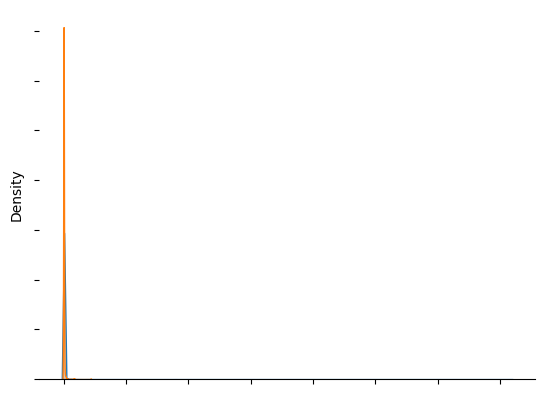

feature8
feature8 0.0013263398069834082


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


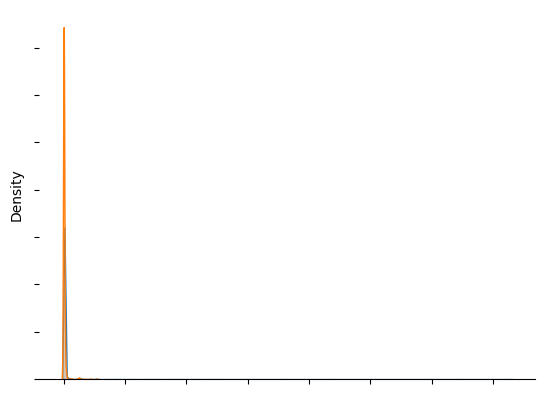

feature9
feature9 0.0017451379259026019


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


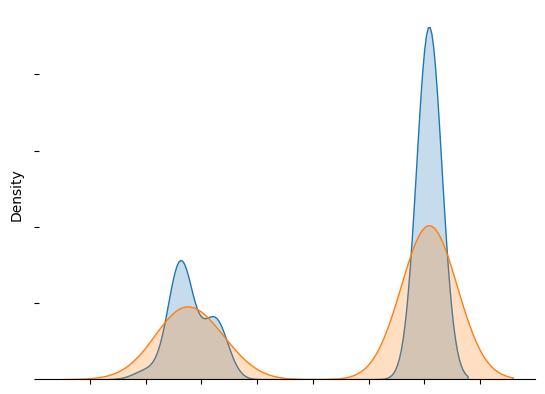

feature10
feature10 0.0005517925551930914


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


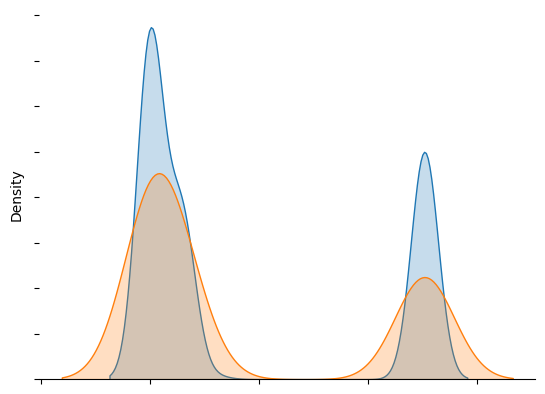

feature11
feature11 0.0146740672555466


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


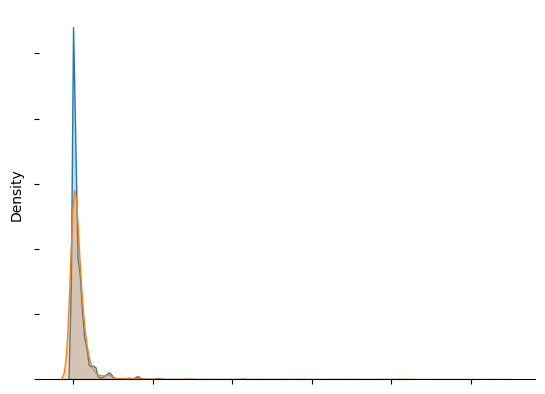

feature12
feature12 0.01712129206489261


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


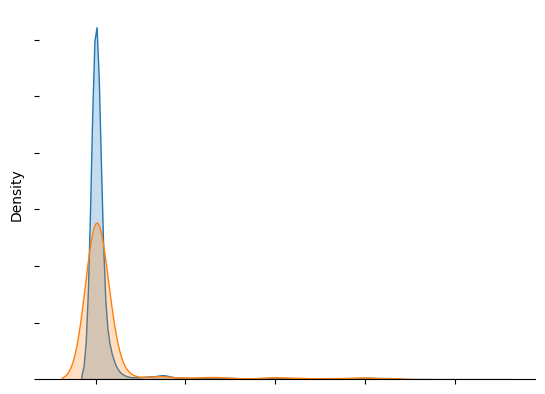

feature13
feature13 0.0005642046473190873


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


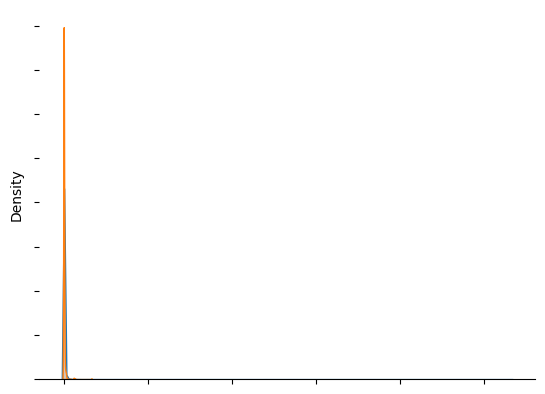

feature14
feature14 0.0011863668899709627


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


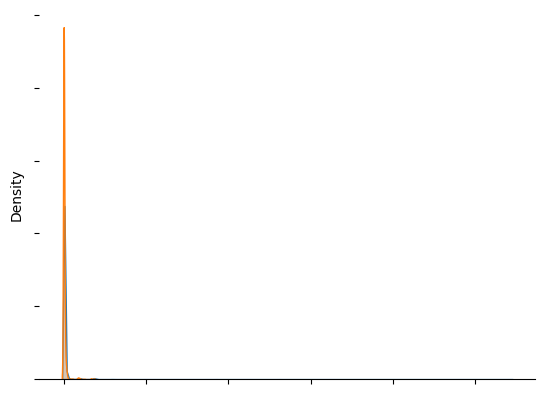

feature15
feature15 0.004836549899410718


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


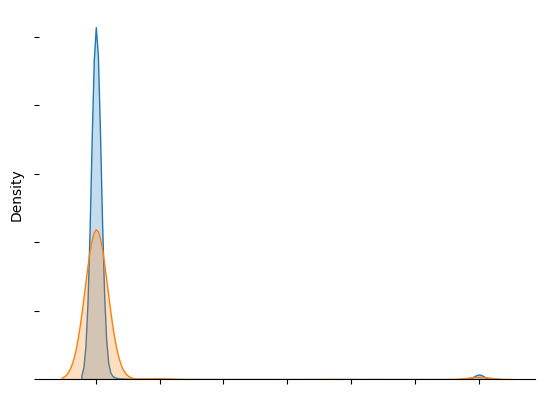

feature16
feature16 0.007374581865076258


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


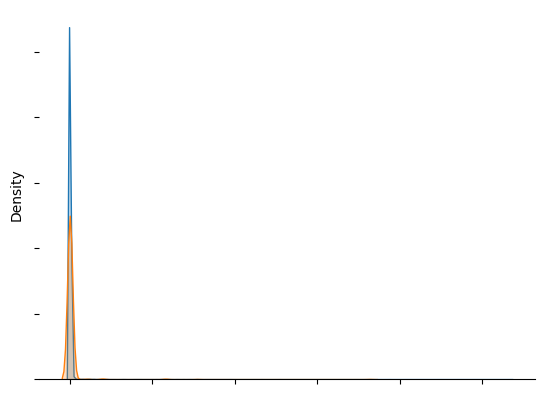

feature17
feature17 0.008298871767299985


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


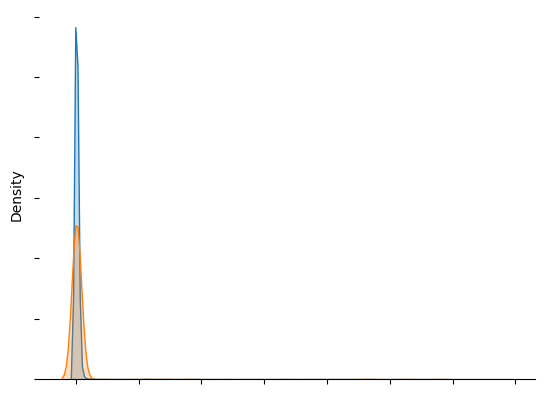

feature18
feature18 0.002793864385639242


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


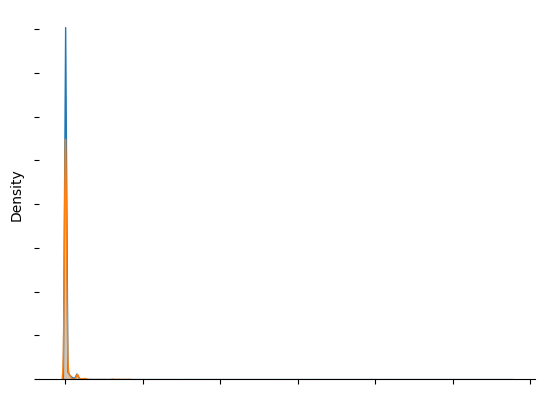

feature19
feature19 0.0003483091758672892


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


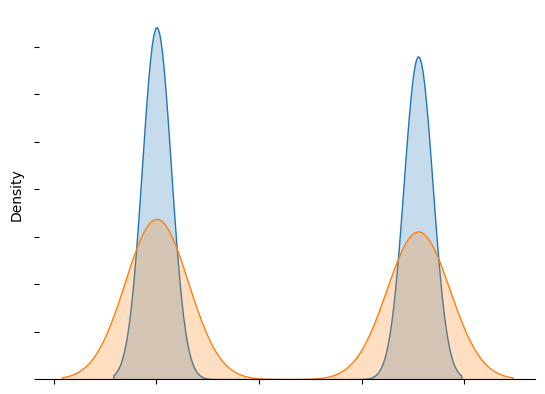

feature20
feature20 0.04668404739124457


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


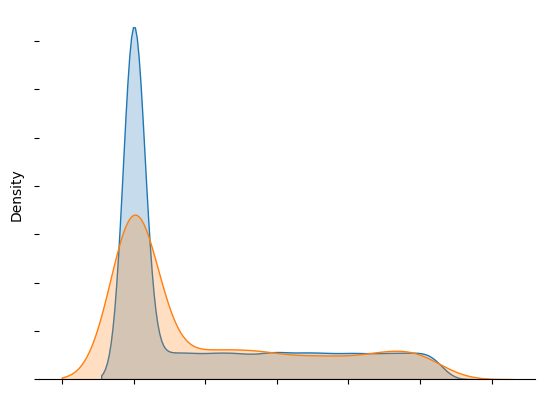

feature21
feature21 0.028105446284250733


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


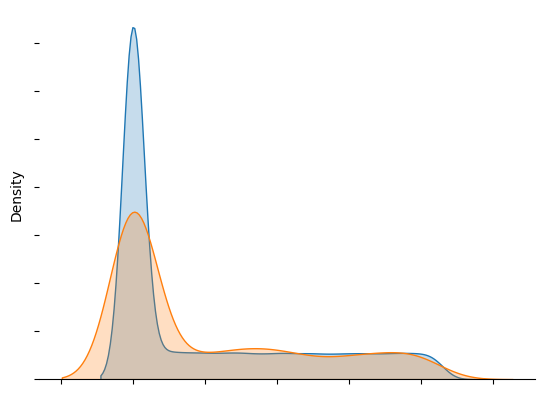

feature22
feature22 1.1383360725476544e-06


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


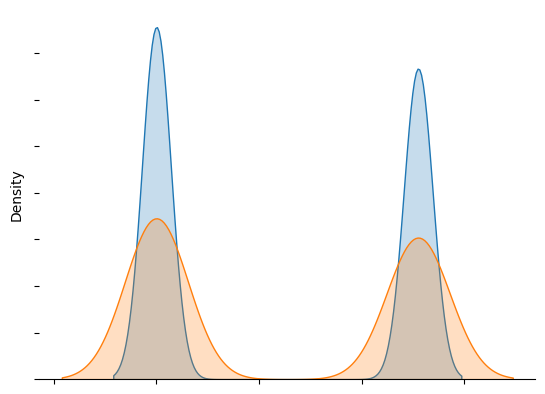

feature23
feature23 0.009867385339095888


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


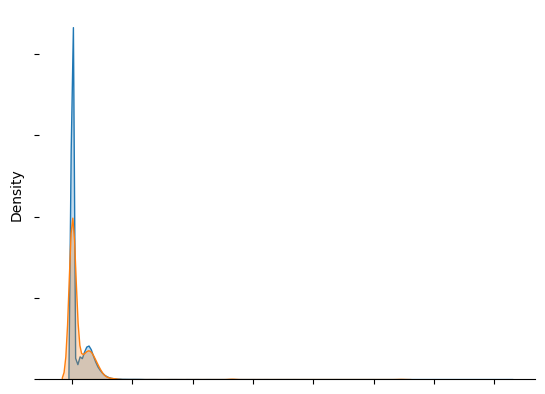

feature24
feature24 0.005429190796696235


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


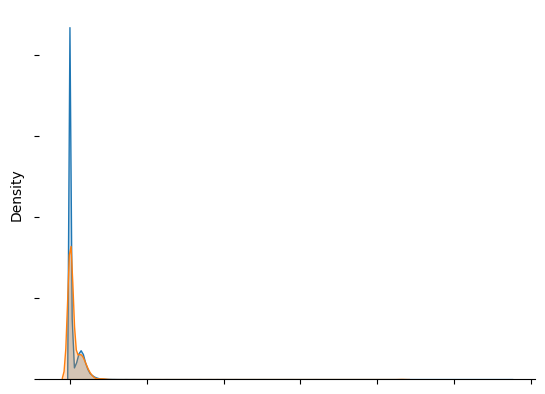

feature25
feature25 0.0116680578160306


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


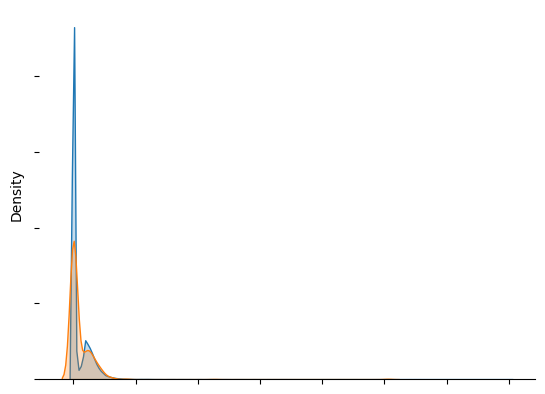

feature26
feature26 0.009855803755602448


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


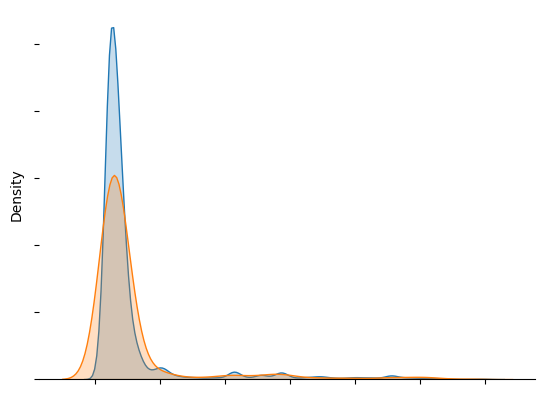

feature27
feature27 0.00765608593588279


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


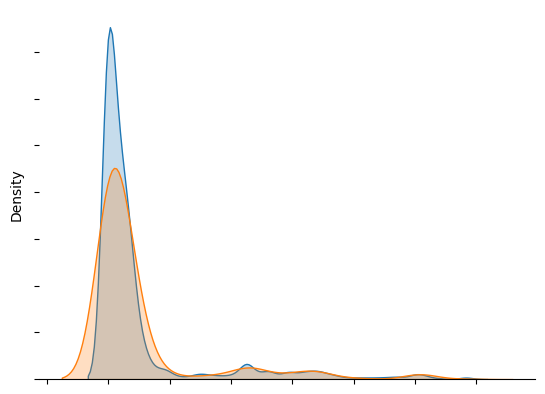

feature28
feature28 0.000841103023579012


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


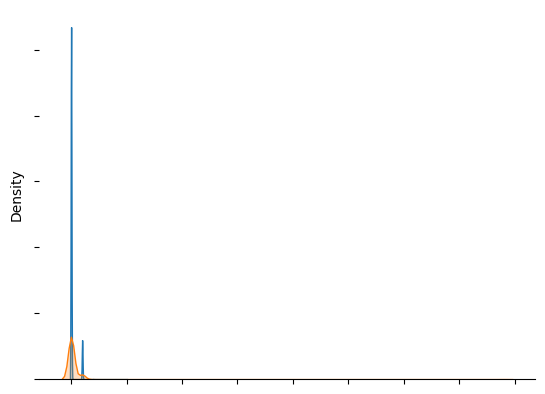

feature29
feature29 0.007319630417712235


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


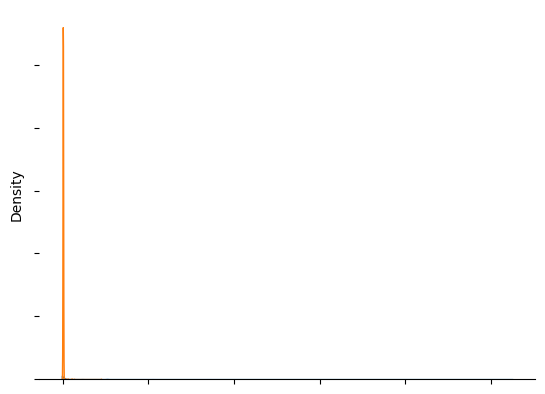

feature30
feature30 0.0016289246958244045


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


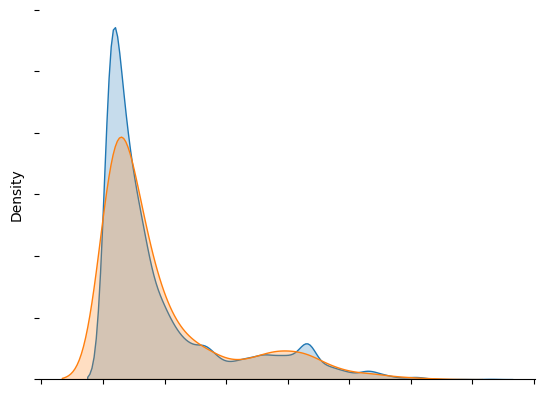

feature31
feature31 0.002681770944417819


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


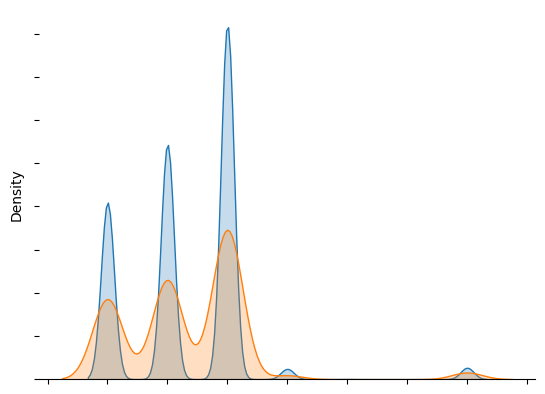

feature32
feature32 0.007626353262418749


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


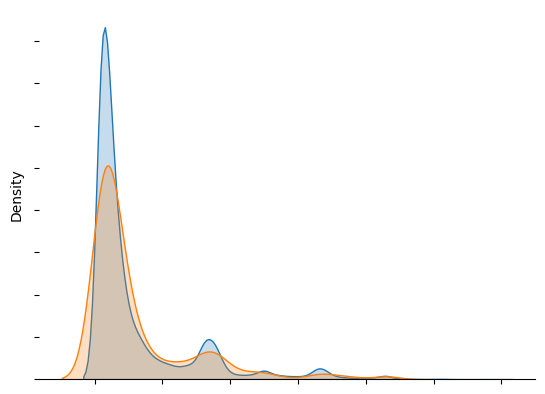

feature33
feature33 0.0051470957175893135


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


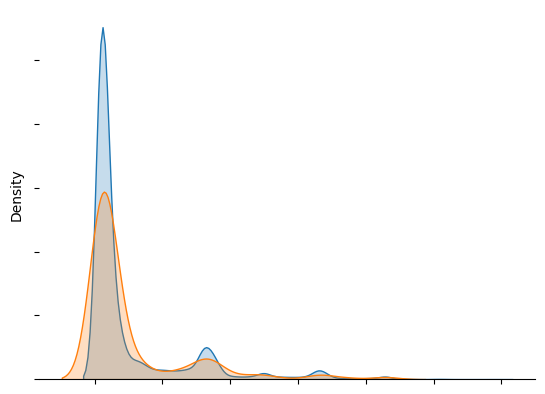

feature34
feature34 0.00219347149682593


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


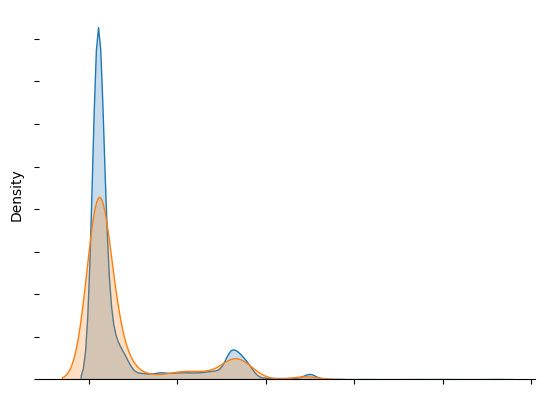

feature35
feature35 0.0017650252249706835


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


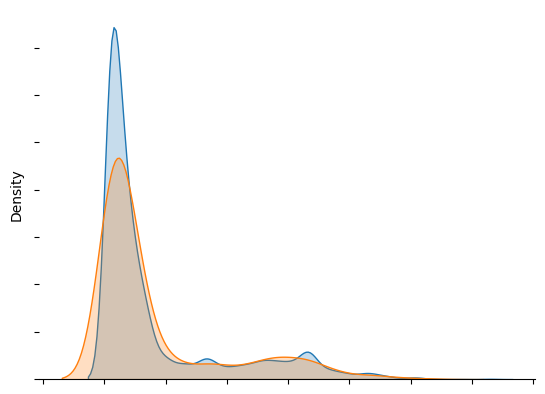

feature36
feature36 0.0005171976449227664


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


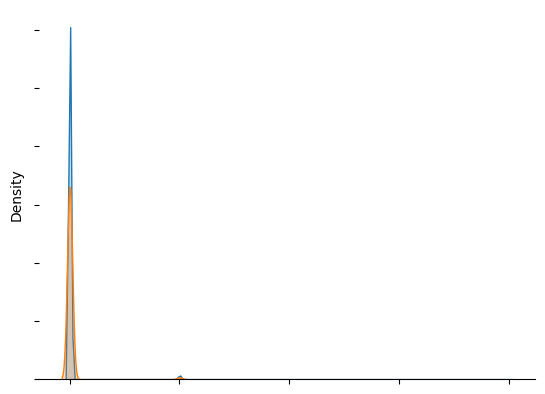

feature37
feature37 0.0003916230248569431


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


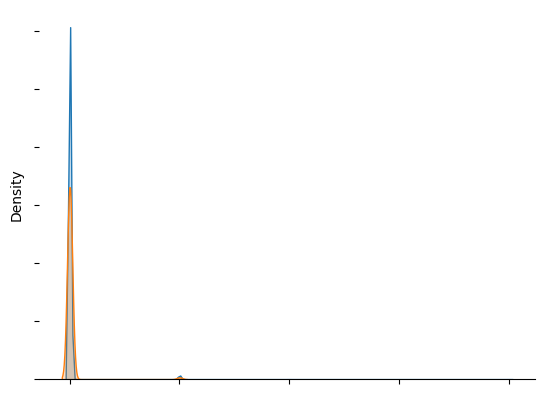

feature38
feature38 0.002370427409959685


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


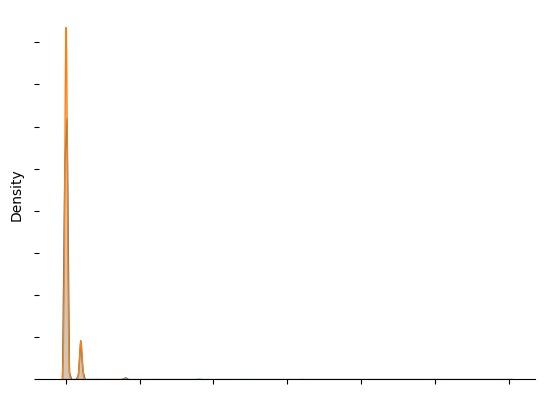

feature39
feature39 0.005144948046799148


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


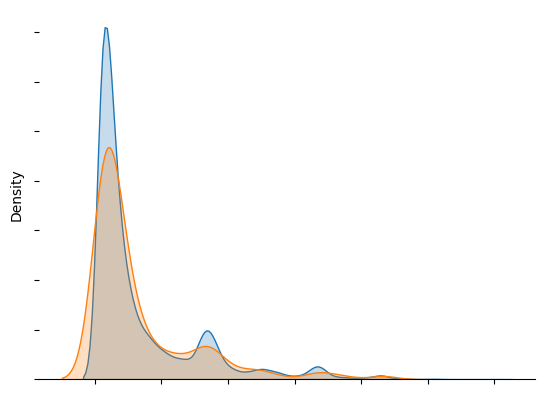

feature40
feature40 0.0006829526915516892


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


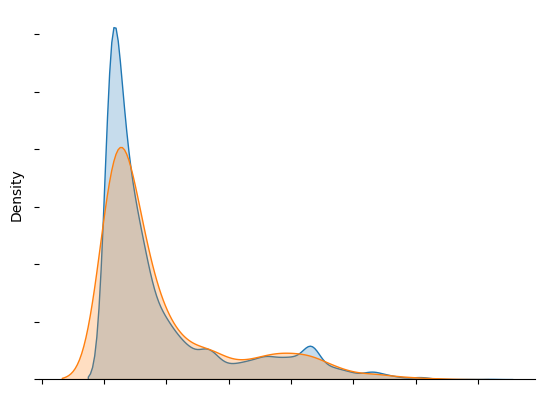

feature41
feature41 4.7190451680676626e-05


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


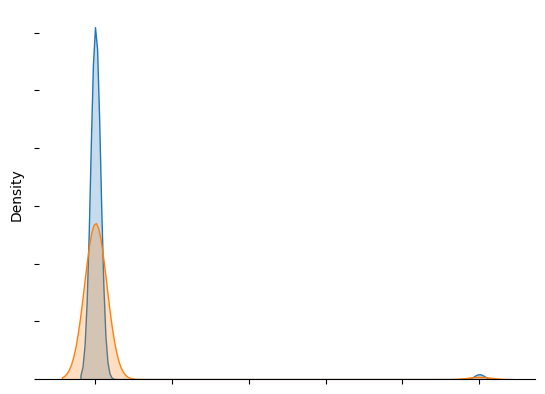

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


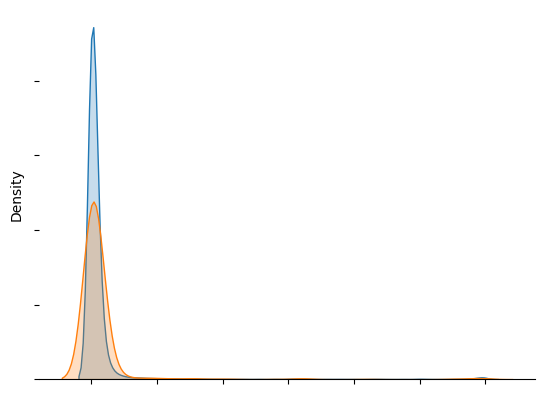

feature5
feature5 0.006349845820307627


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


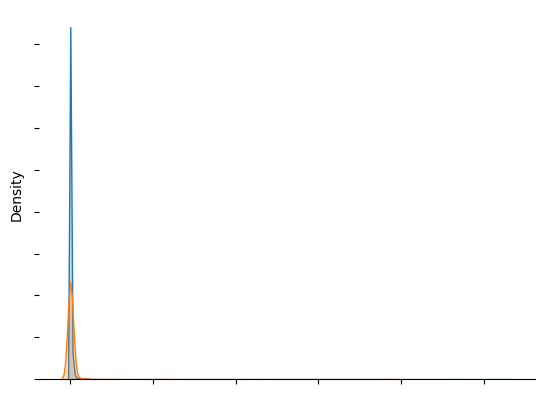

feature6
feature6 0.0006329056219331445


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


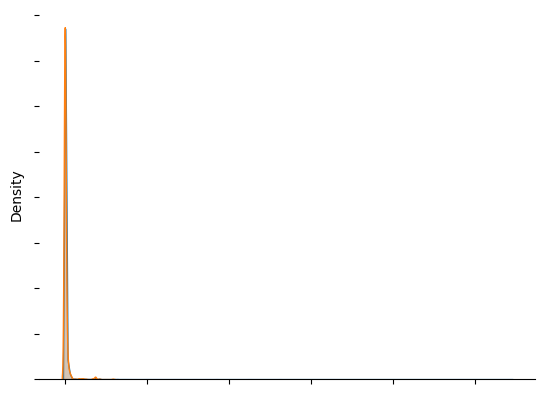

feature7
feature7 0.010544719948968509


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


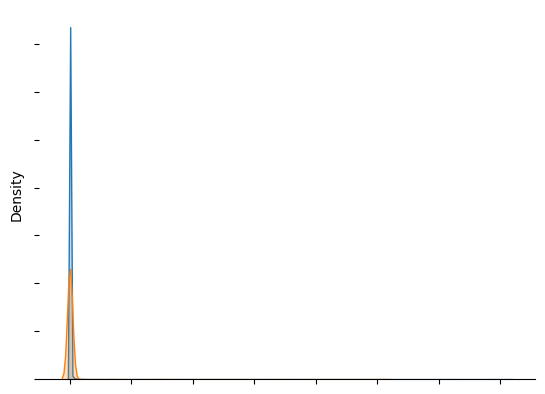

feature8
feature8 0.003906982282125515


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


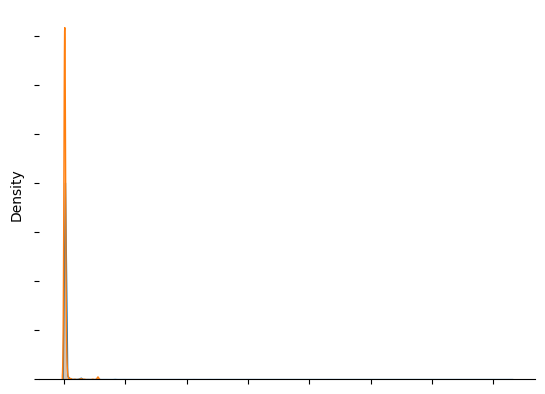

feature9
feature9 0.001462369781642994


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


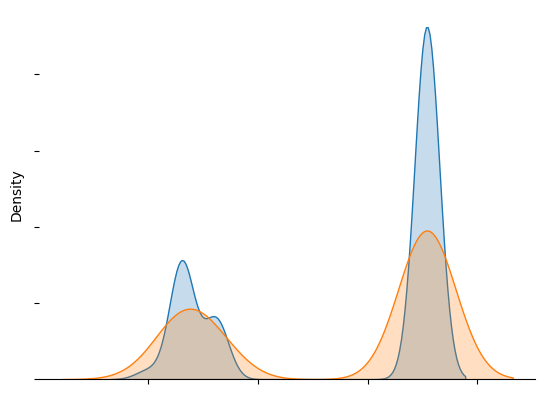

feature10
feature10 0.0005454124055017861


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


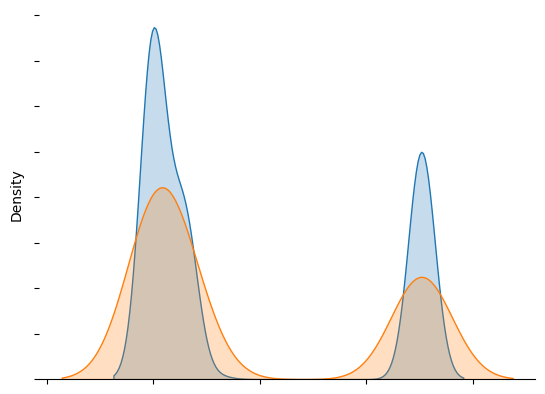

feature11
feature11 0.011833516136100496


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


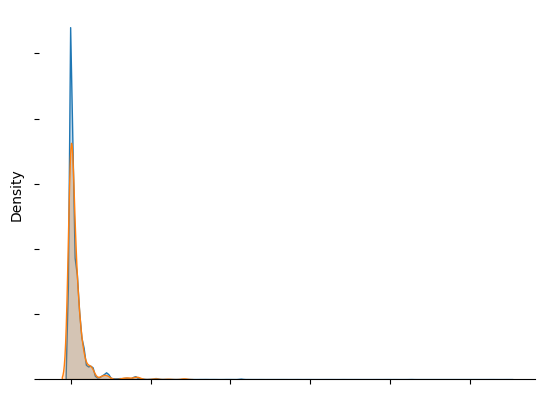

feature12
feature12 0.02743319401607023


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


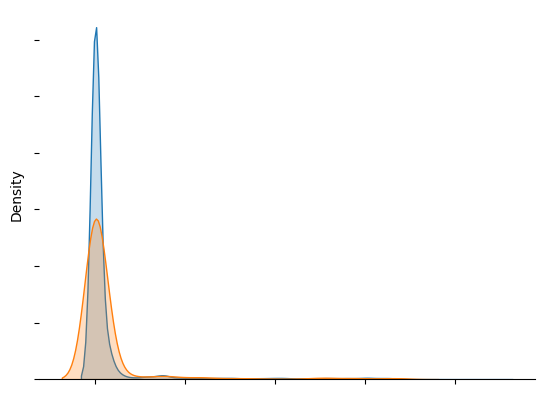

feature13
feature13 0.008868214548145991


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


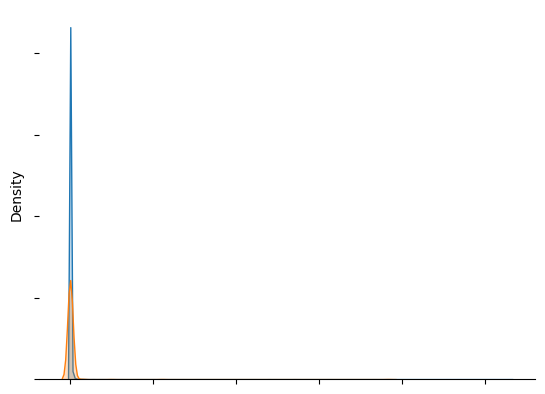

feature14
feature14 0.0011863668899709627


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


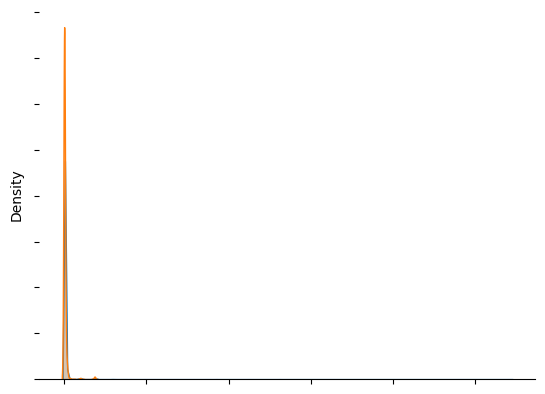

feature15
feature15 0.003115862683479768


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


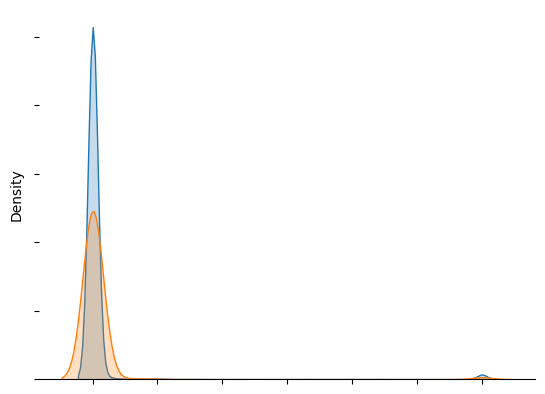

feature16
feature16 0.006957892765883199


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


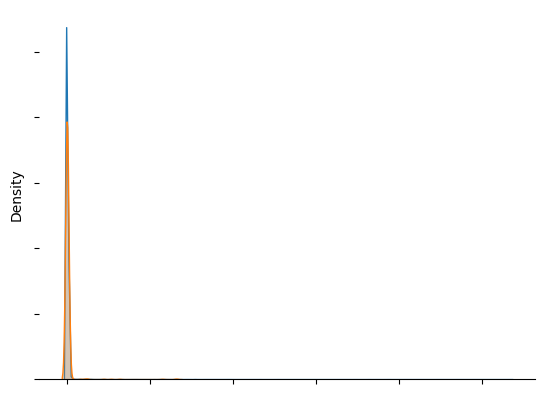

feature17
feature17 0.009813541377255382


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


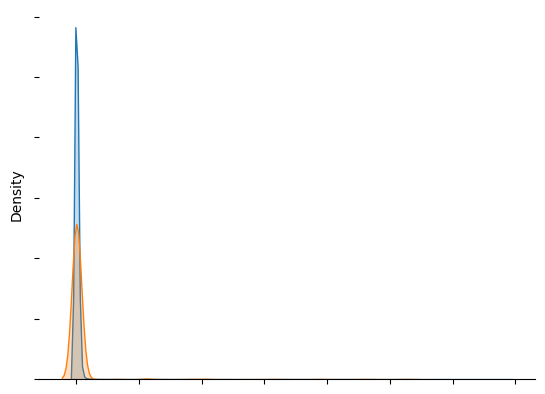

feature18
feature18 0.004490673376127115


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


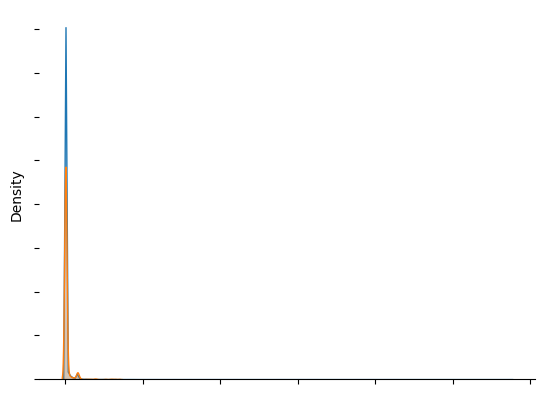

feature19
feature19 0.003175477701502693


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


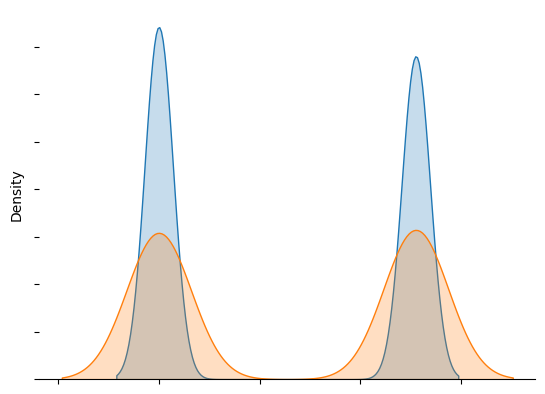

feature20
feature20 0.020154351069840662


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


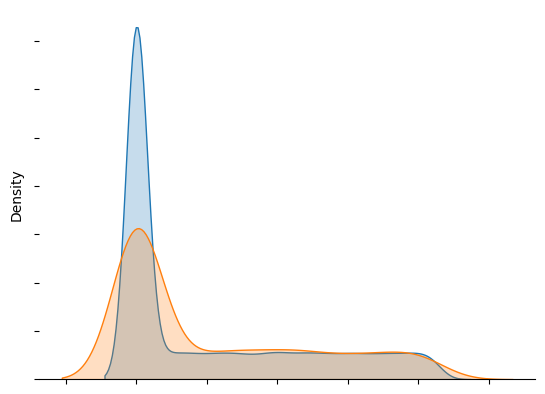

feature21
feature21 0.025768135156560255


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


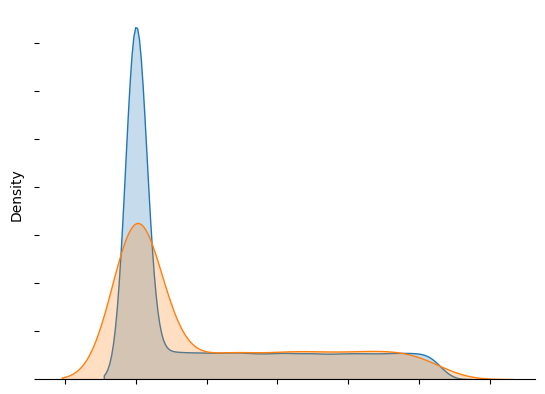

feature22
feature22 0.002570641245284489


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


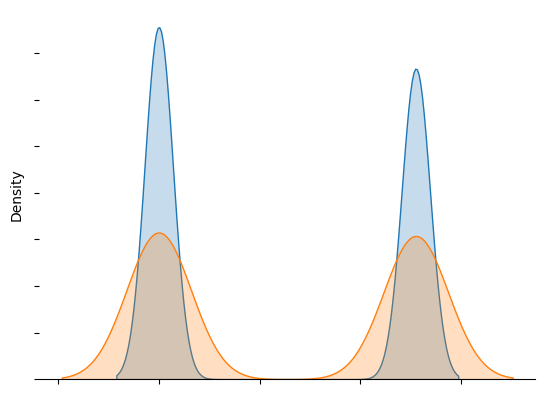

feature23
feature23 0.0008777447742587534


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


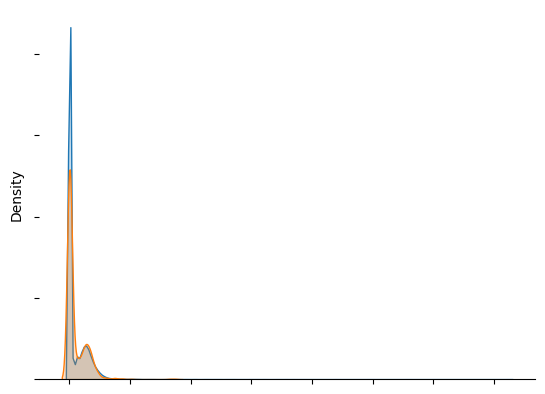

feature24
feature24 0.0012884732468615753


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


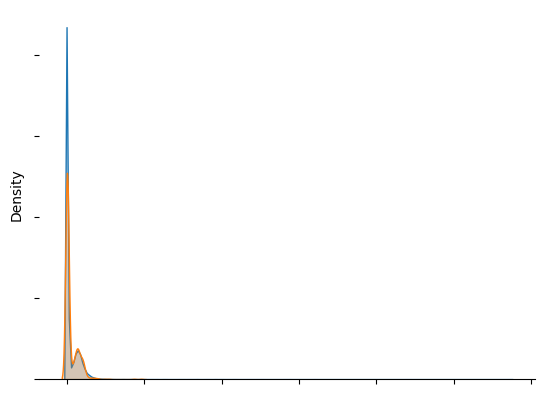

feature25
feature25 0.003535253566557718


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


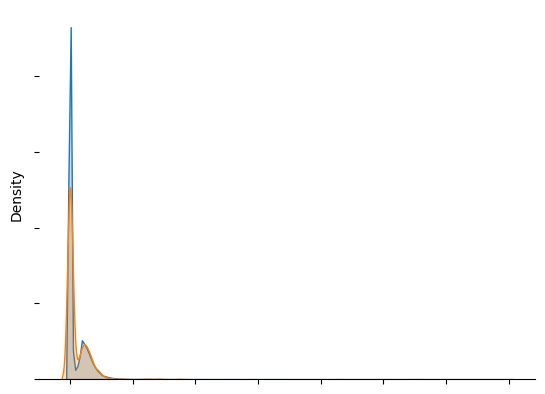

feature26
feature26 0.0056082143004631095


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


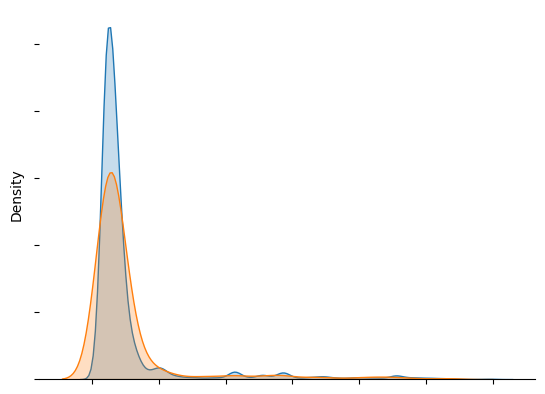

feature27
feature27 0.011872220330609197


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


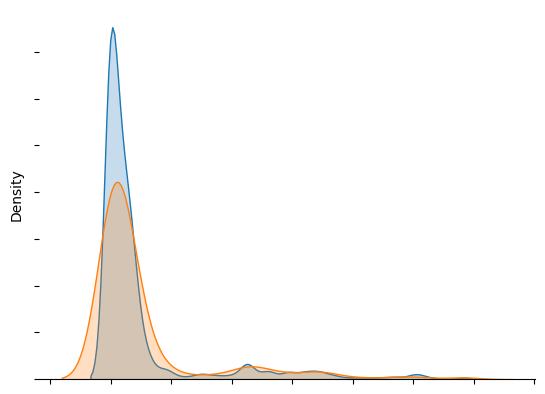

feature28
feature28 0.0021309641289347153


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


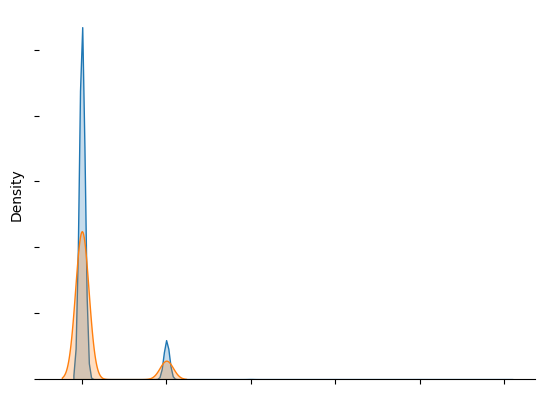

feature29
feature29 0.005885320246804818


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


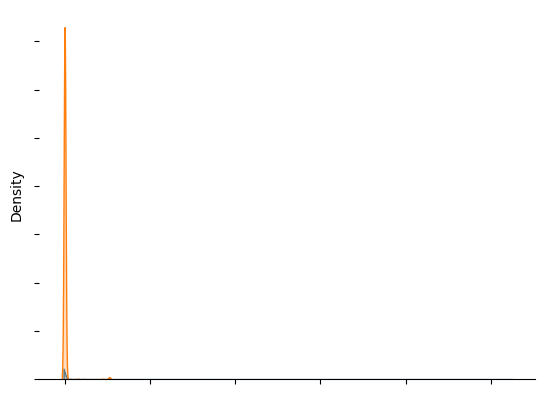

feature30
feature30 0.006356935812443646


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


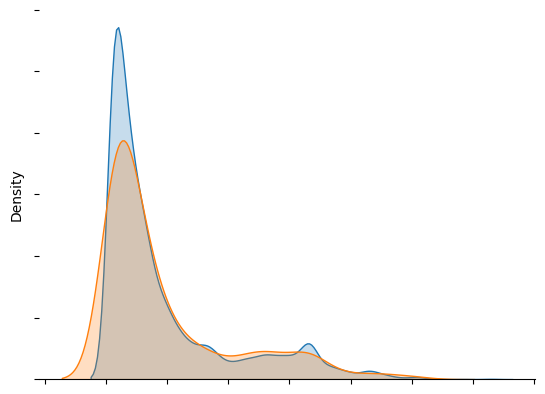

feature31
feature31 0.0016114146335645231


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


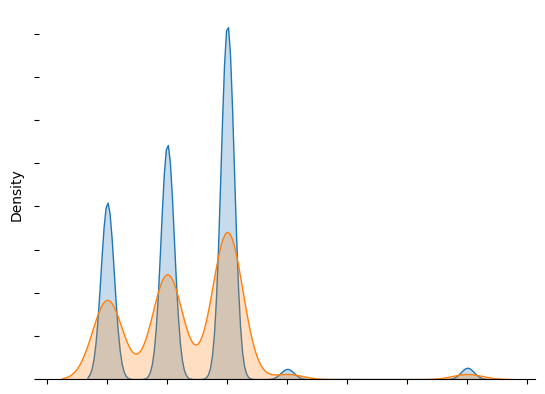

feature32
feature32 0.0031591309008534682


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


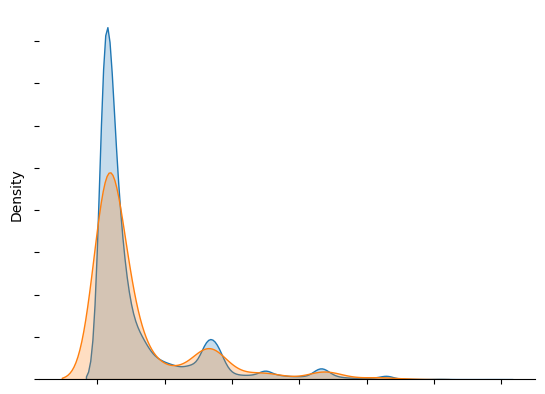

feature33
feature33 0.004857648149900314


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


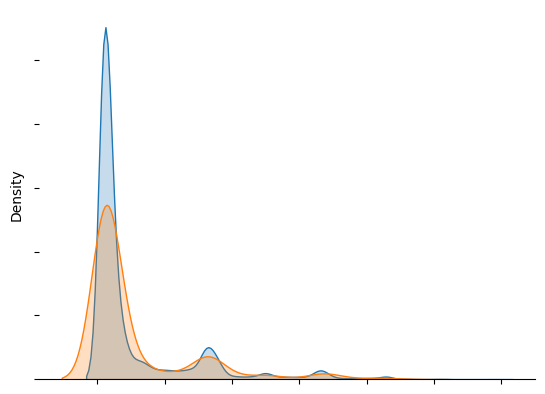

feature34
feature34 0.004077092579380773


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


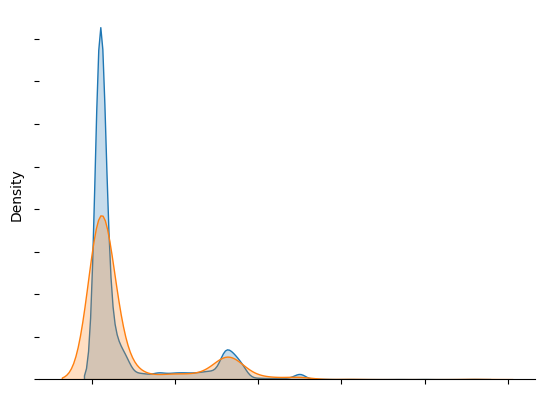

feature35
feature35 0.006366045176342522


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


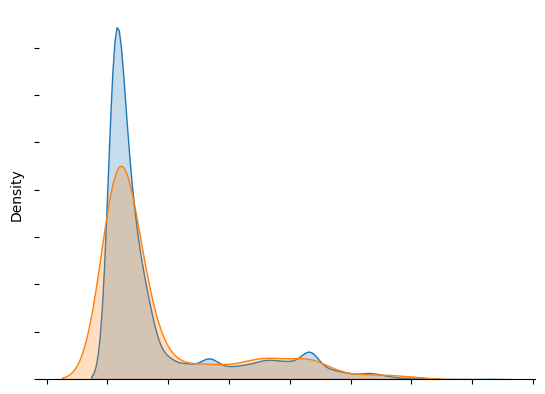

feature36
feature36 0.001702096191292536


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


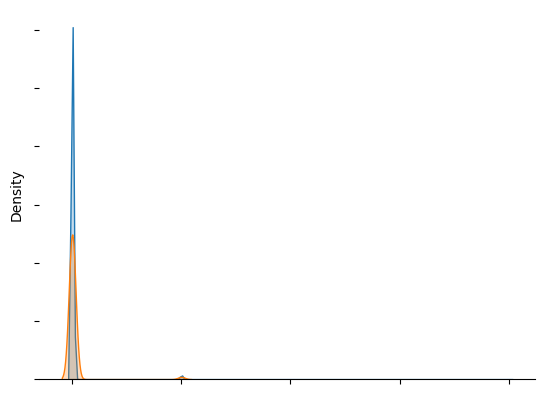

feature37
feature37 0.001609742712655563


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


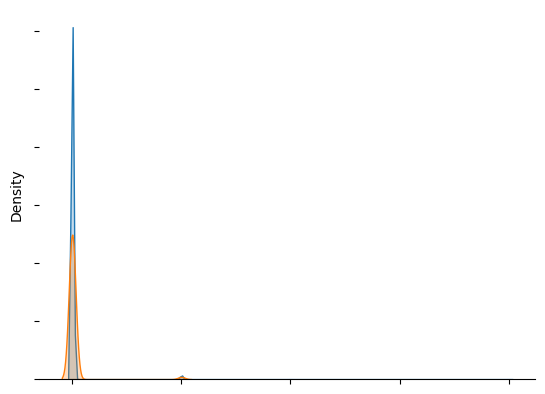

feature38
feature38 0.003517934761599484


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


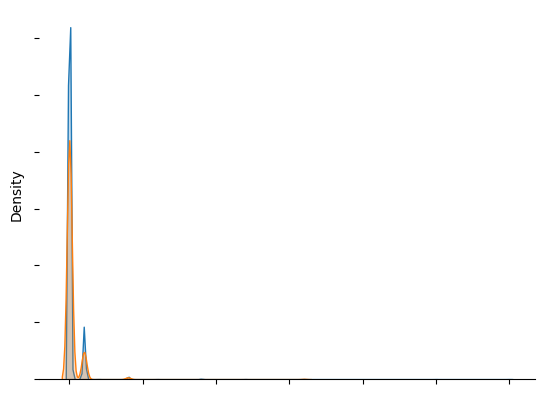

feature39
feature39 0.004797997172021234


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


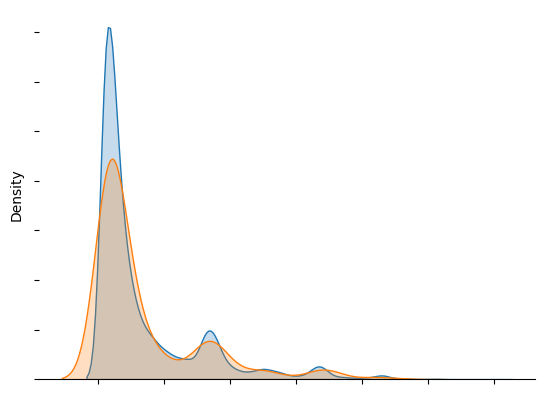

feature40
feature40 0.009117571961064677


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


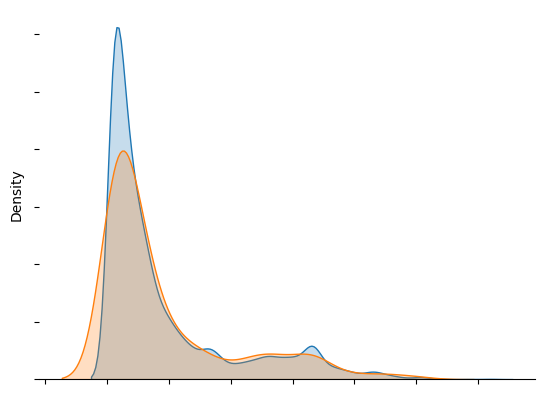

feature41
feature41 8.651481021052377e-05


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


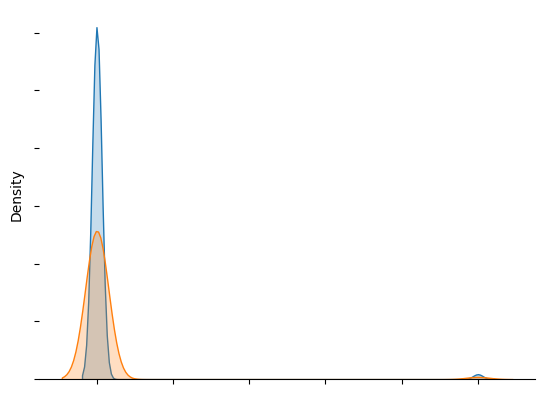

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


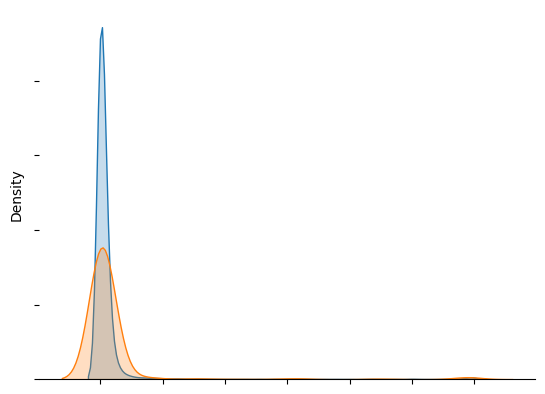

feature5
feature5 0.005529117826820716


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


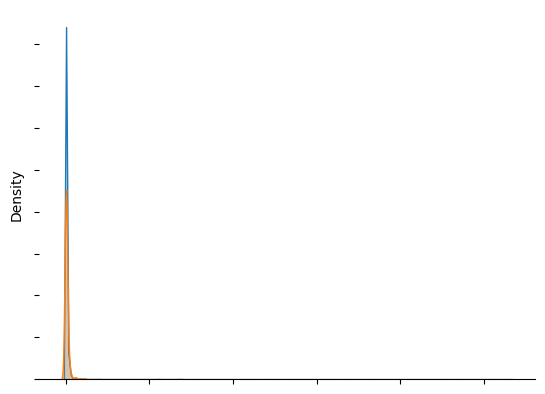

feature6
feature6 0.004730351361922211


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


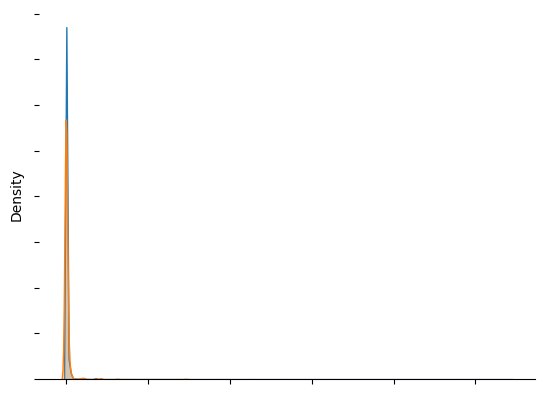

feature7
feature7 0.008469586392759597


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


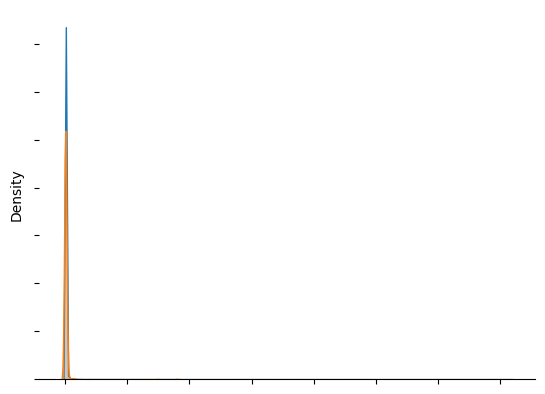

feature8
feature8 0.005399767105943899


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


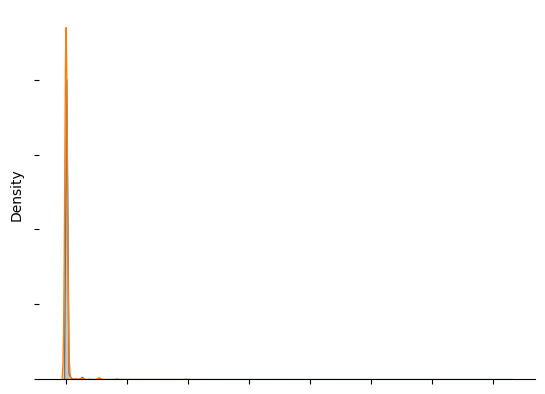

feature9
feature9 0.0021102565350211667


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


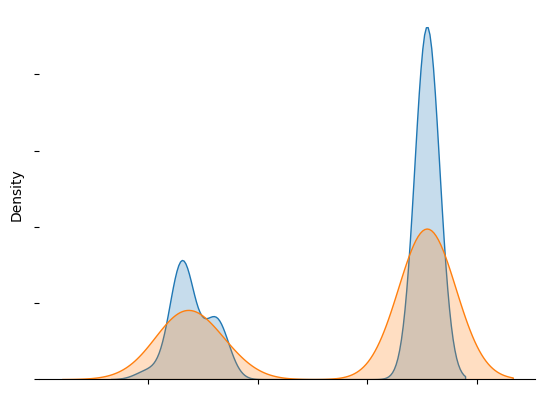

feature10
feature10 0.0028740104156953646


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


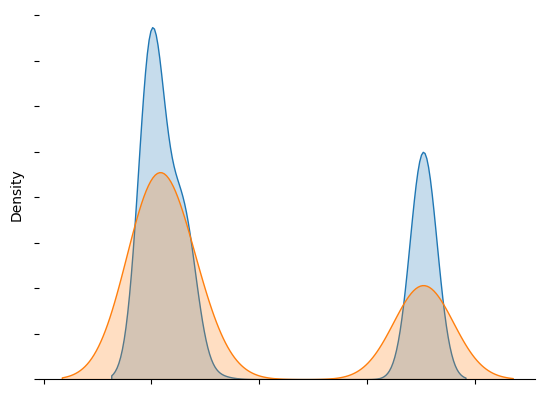

feature11
feature11 0.012511830637858953


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


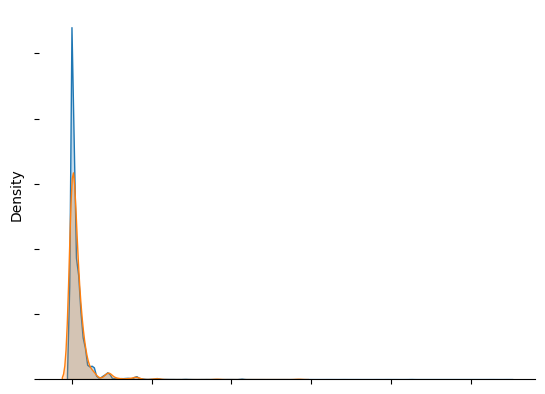

feature12
feature12 0.014849606891591647


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


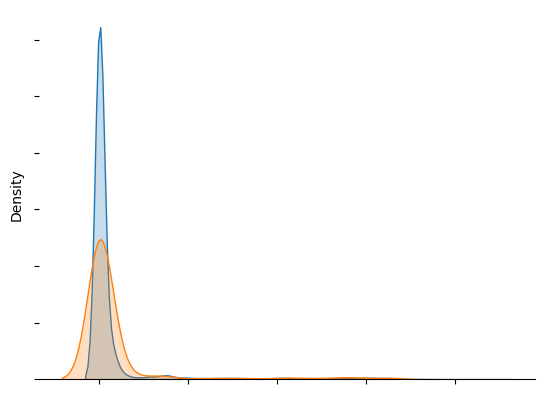

feature13
feature13 0.0061172627622398225


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


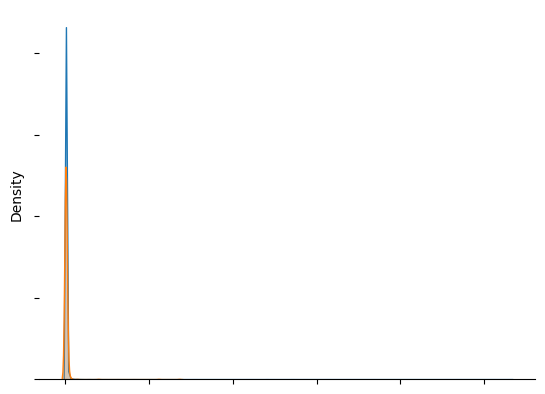

feature14
feature14 0.0037933221131544056


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


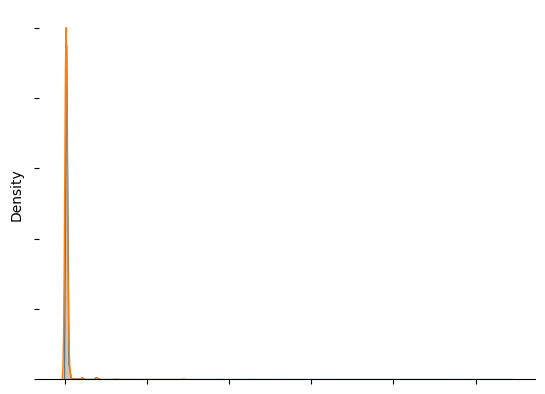

feature15
feature15 0.005454253307008852


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


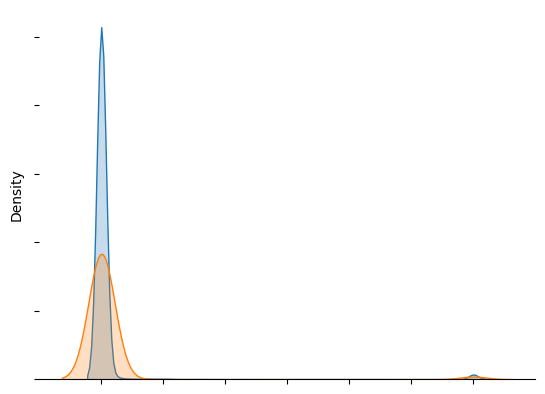

feature16
feature16 0.004933463994715275


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


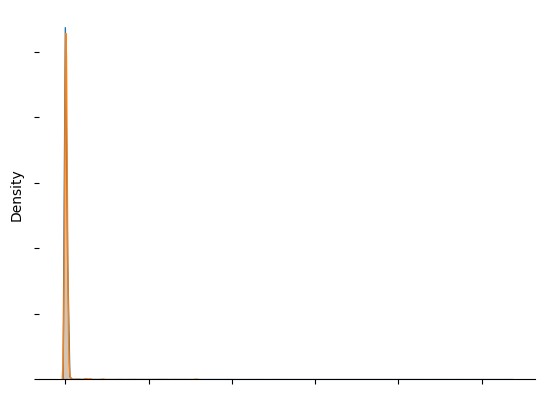

feature17
feature17 0.008771344268543929


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


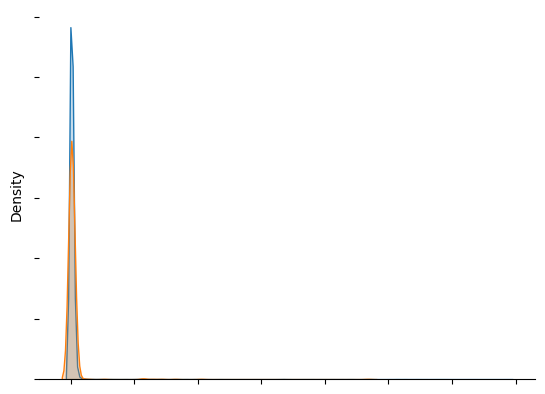

feature18
feature18 0.002973030254276337


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


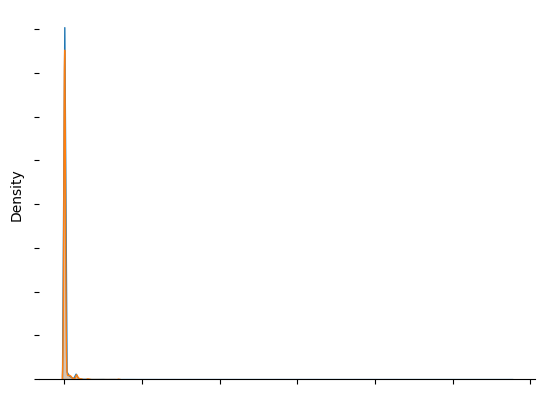

feature19
feature19 0.0005066790223761871


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


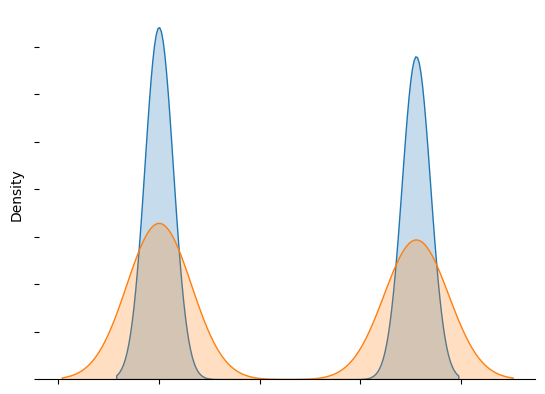

feature20
feature20 0.03133211639025489


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


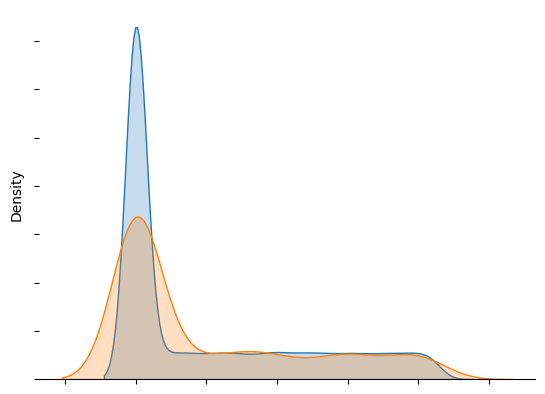

feature21
feature21 0.033017914848533565


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


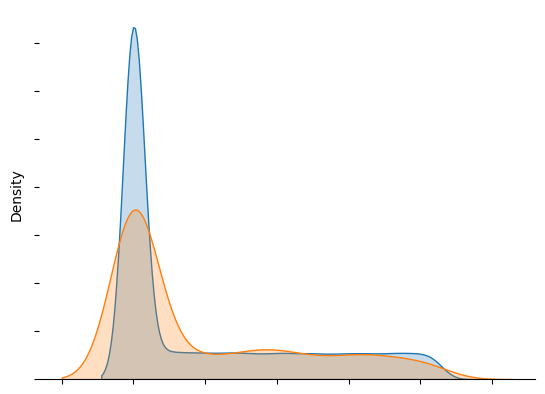

feature22
feature22 0.0001291844293582125


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


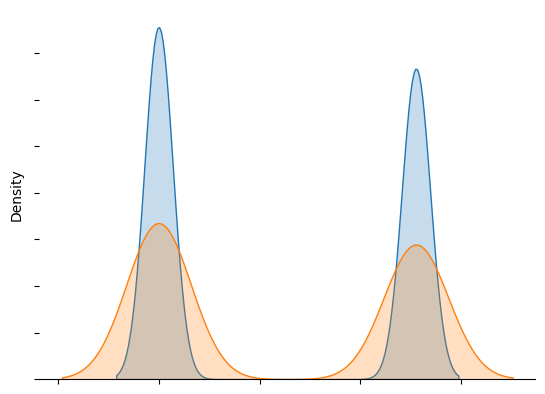

feature23
feature23 0.0025296769573389583


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


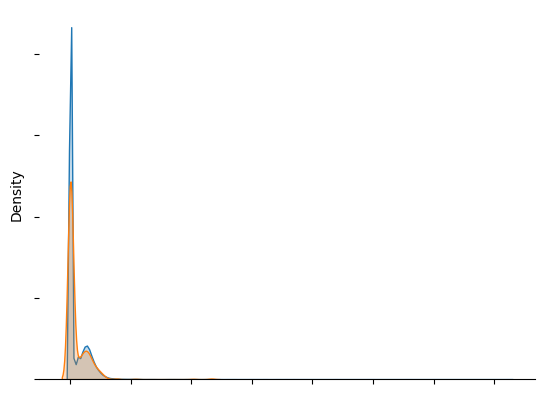

feature24
feature24 0.0012884732468615753


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


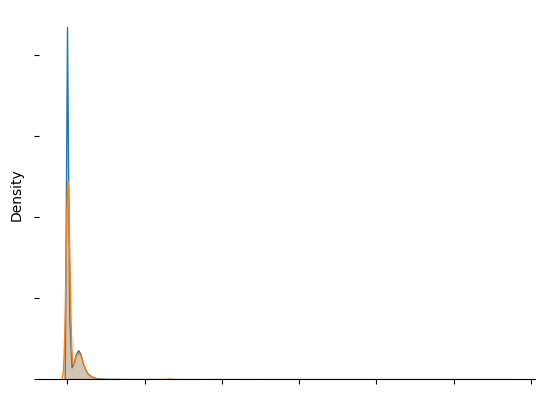

feature25
feature25 0.004642861590667818


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


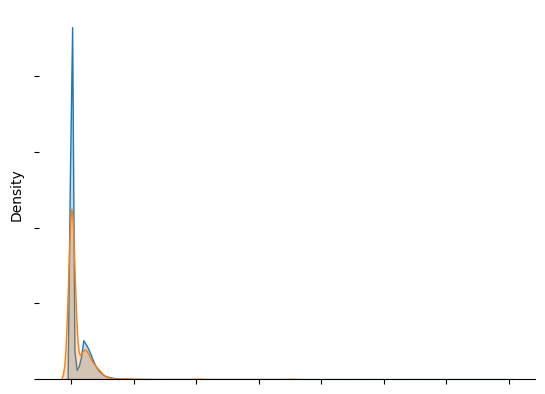

feature26
feature26 0.005079636880541518


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


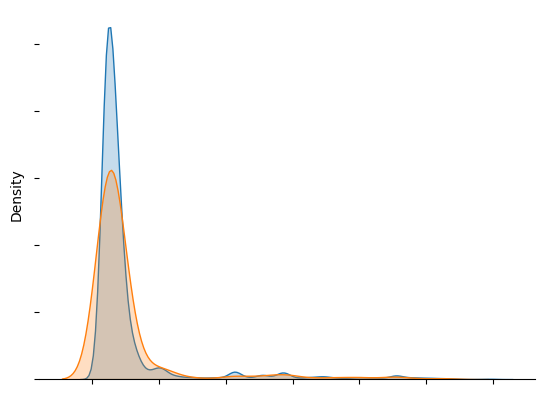

feature27
feature27 0.008571183732643388


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


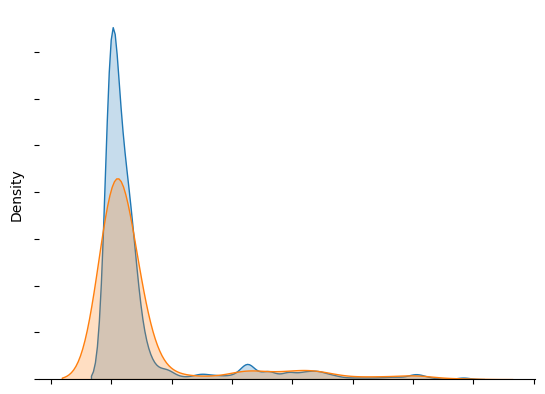

feature28
feature28 0.0061387068071970105


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


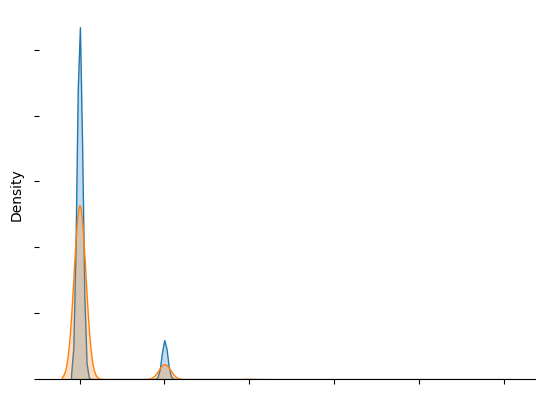

feature29
feature29 0.001154915494029155


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


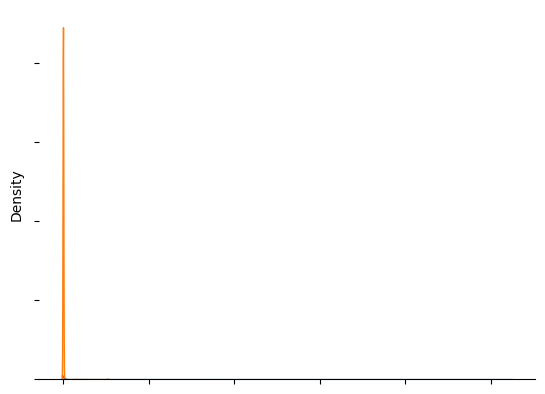

feature30
feature30 0.009697227063181576


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


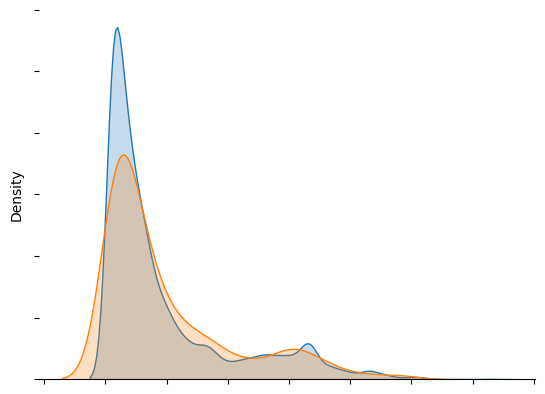

feature31
feature31 0.004045804591584766


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


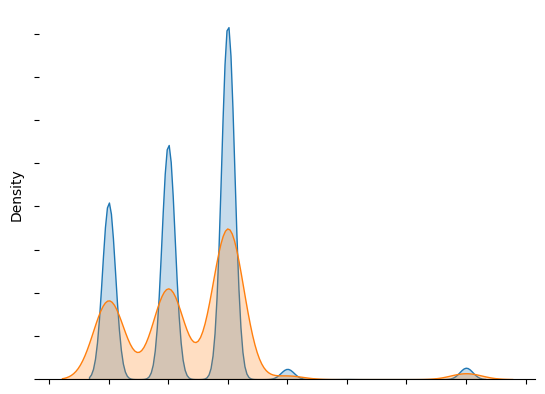

feature32
feature32 0.012994615864424785


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


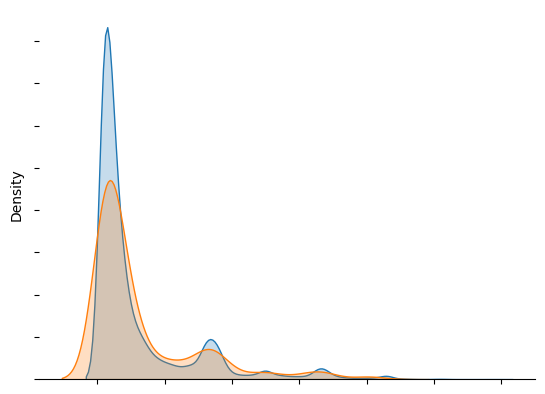

feature33
feature33 0.01455402665189621


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


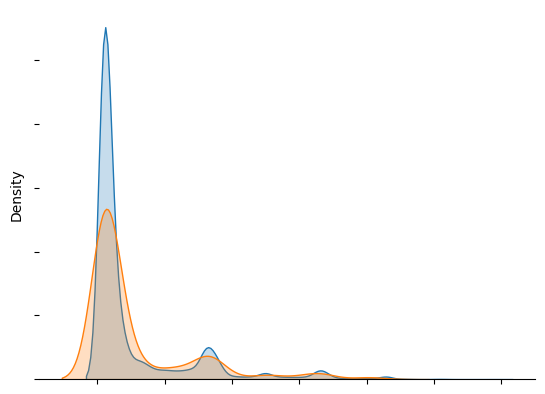

feature34
feature34 0.006365132892028435


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


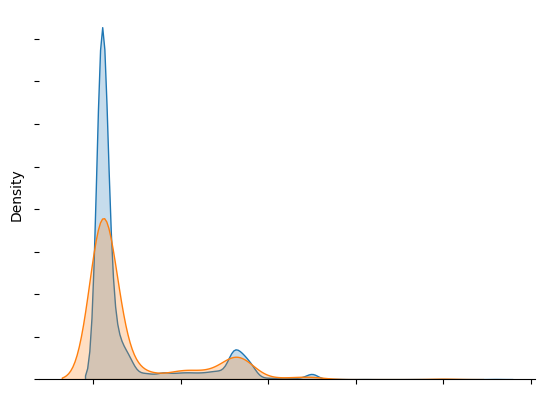

feature35
feature35 0.004741024367224636


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


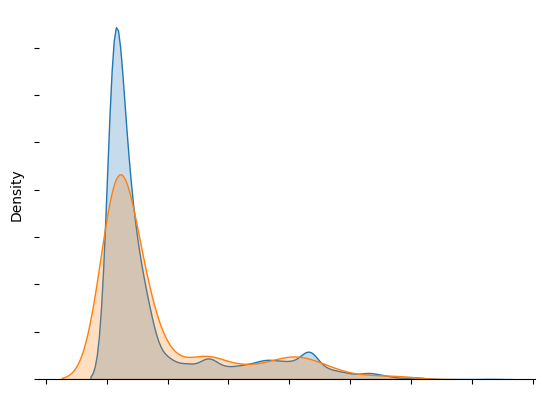

feature36
feature36 0.00964380698541843


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


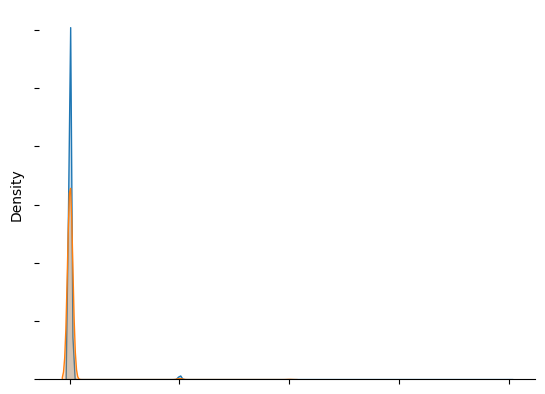

feature37
feature37 0.008419761509670668


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


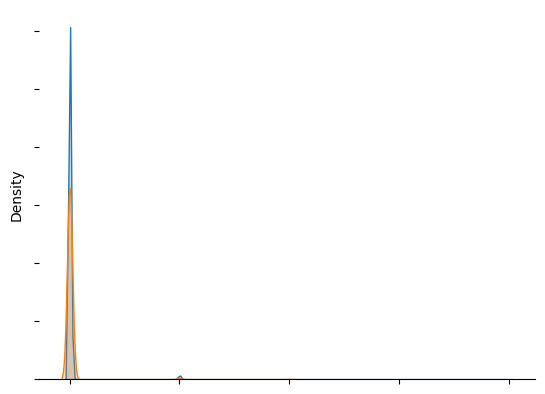

feature38
feature38 0.00013327491159311568


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


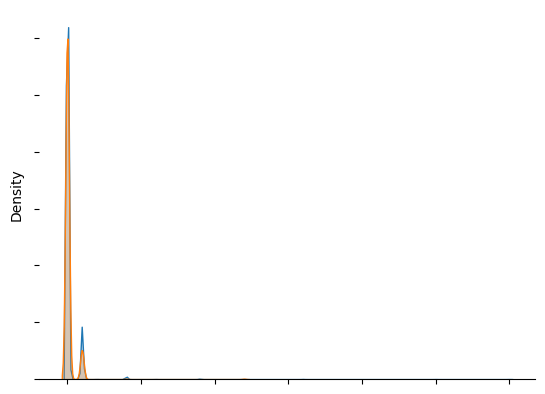

feature39
feature39 0.008323712237259357


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


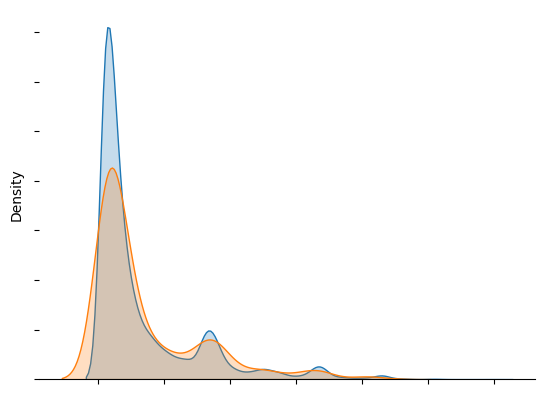

feature40
feature40 0.007583246817189792


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


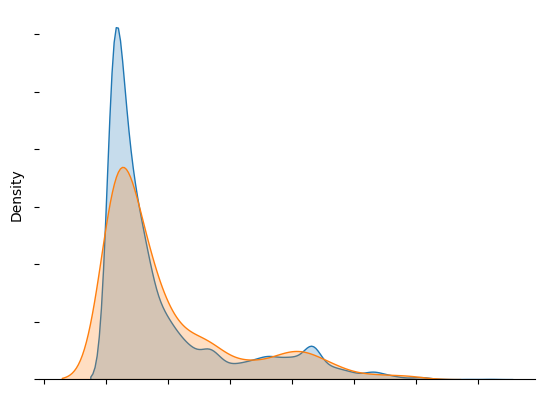

feature41
feature41 0.0029899584988555164


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


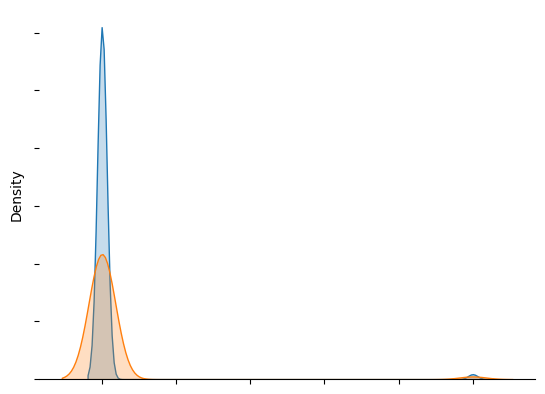

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


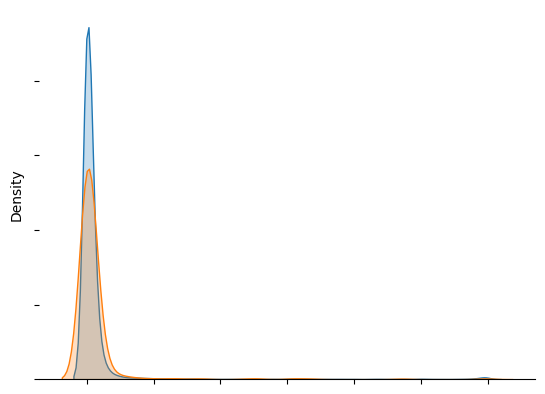

feature5
feature5 0.003991052048350413


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


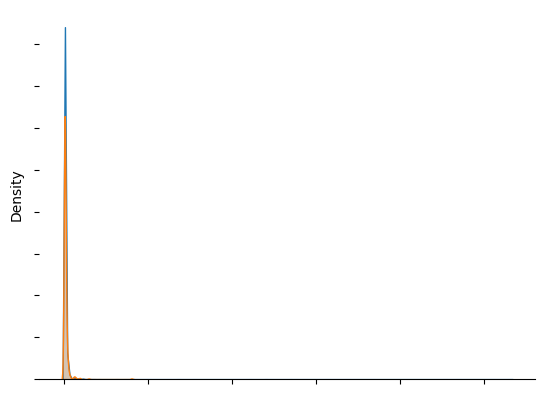

feature6
feature6 0.005965122909471142


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


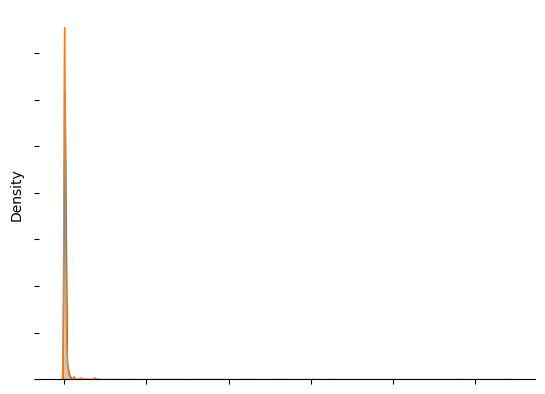

feature7
feature7 0.009788251641549143


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


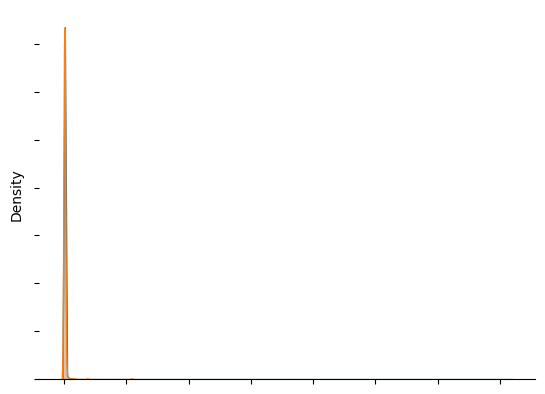

feature8
feature8 0.0020344064122328784


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


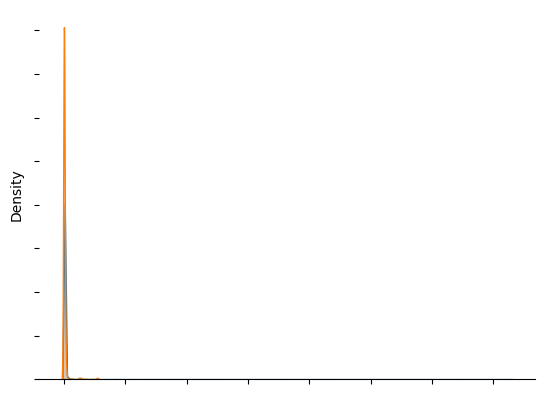

feature9
feature9 0.0077209671790948444


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


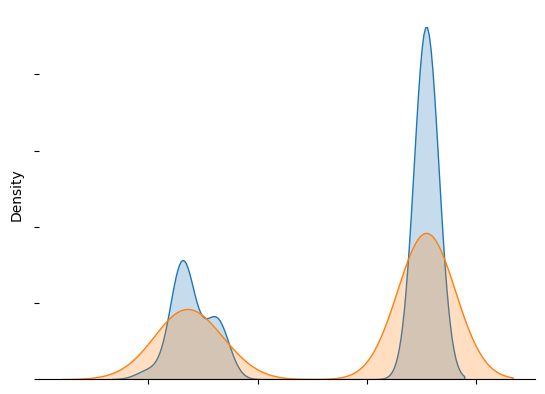

feature10
feature10 0.006049869383281958


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


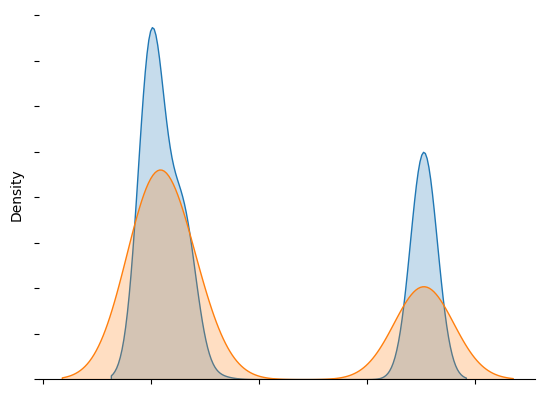

feature11
feature11 0.010572347469181214


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


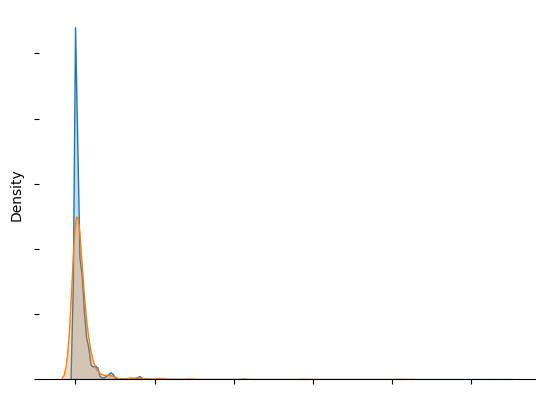

feature12
feature12 0.030726748834944407


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


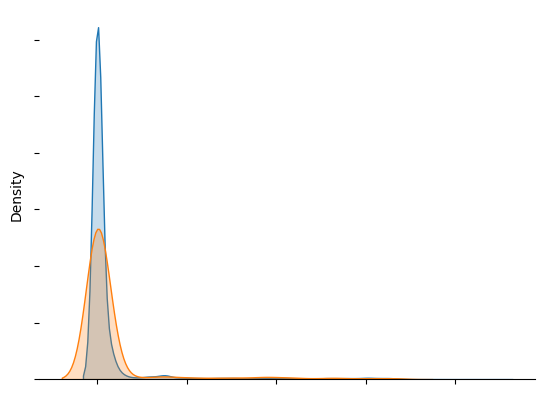

feature13
feature13 0.004515563347891395


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


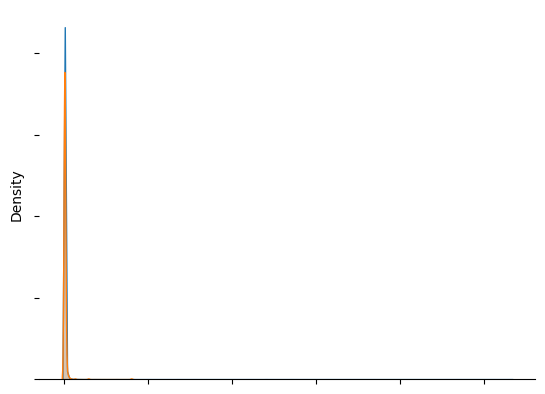

feature14
feature14 0.0011863668899709627


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


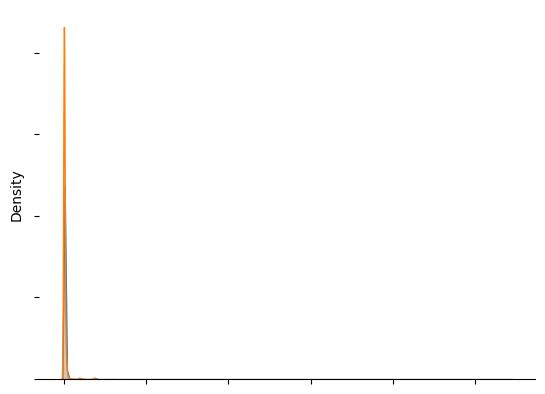

feature15
feature15 0.016712143752484112


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


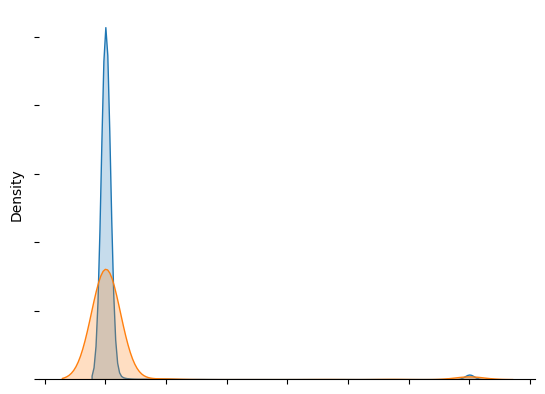

feature16
feature16 0.016854281061383928


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


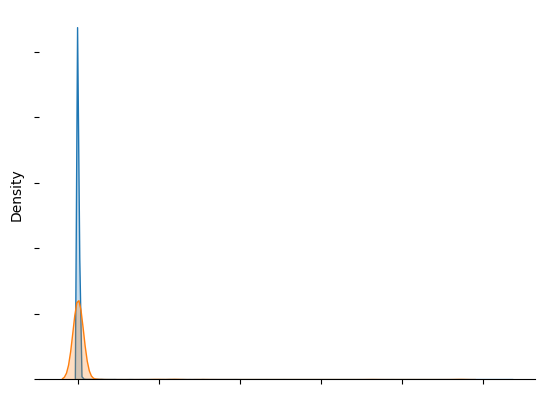

feature17
feature17 0.01579146068243352


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


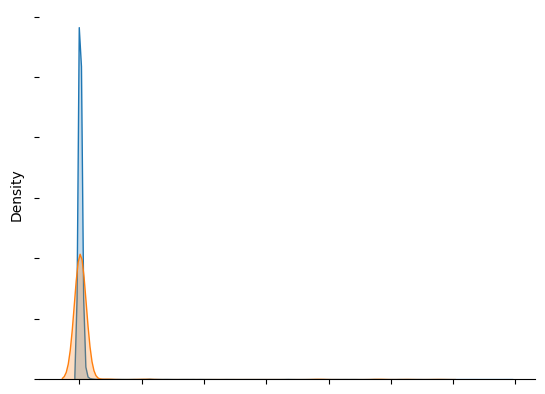

feature18
feature18 0.0029907119930291564


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


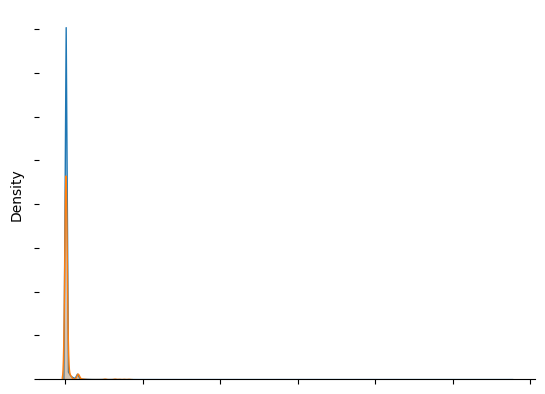

feature19
feature19 0.0008636134243482088


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


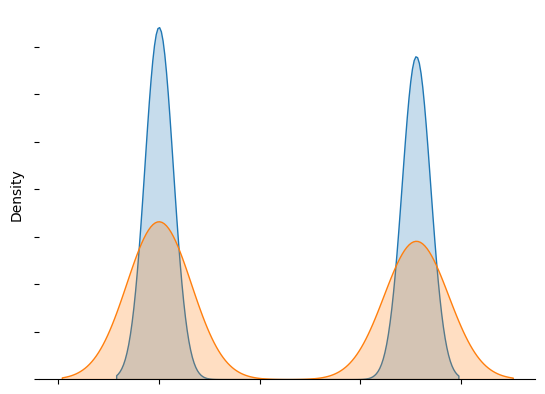

feature20
feature20 0.03789290082756566


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


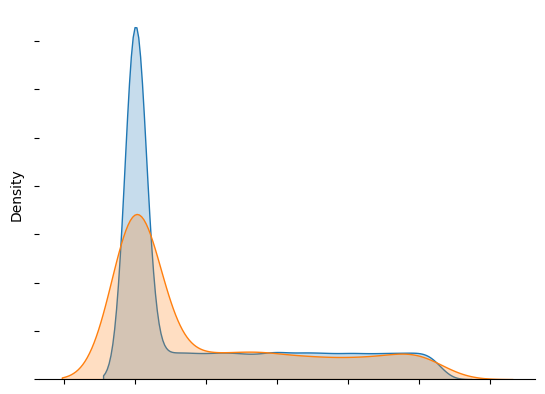

feature21
feature21 0.038811909648001686


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


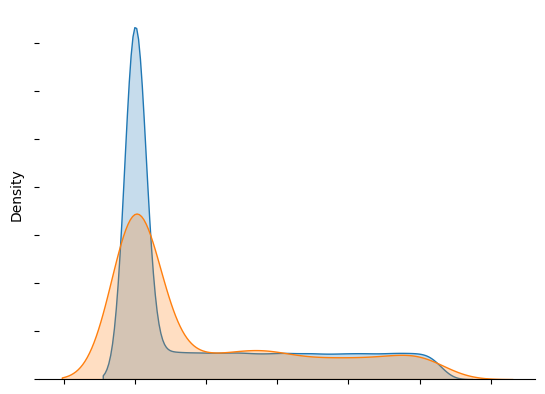

feature22
feature22 0.0003759877552749298


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


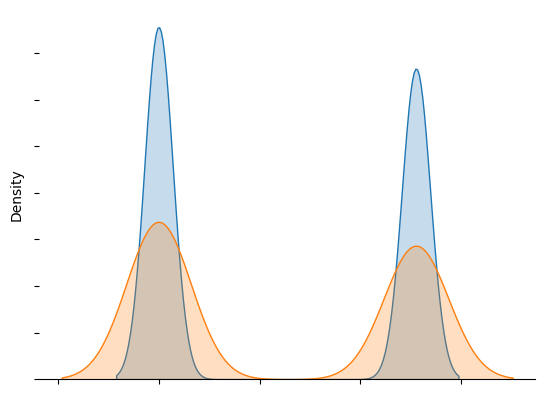

feature23
feature23 0.009772468430856602


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


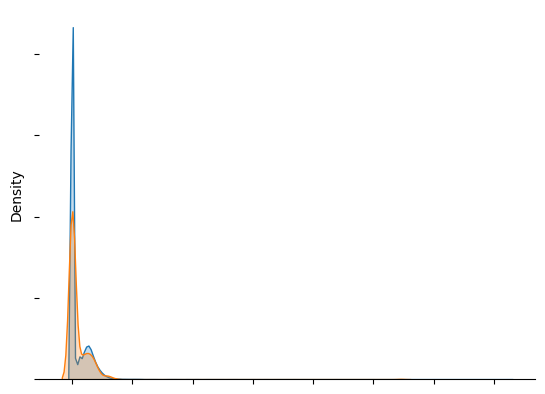

feature24
feature24 0.00634568468897043


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


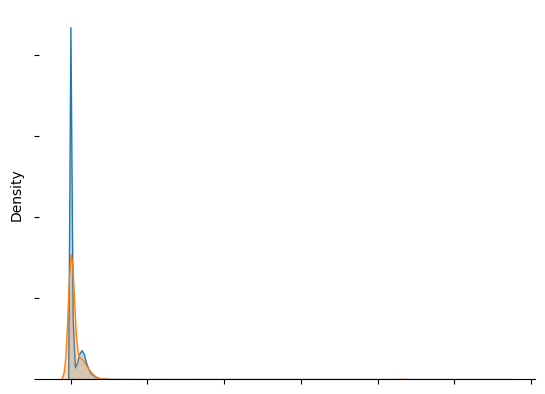

feature25
feature25 0.006341226281190069


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


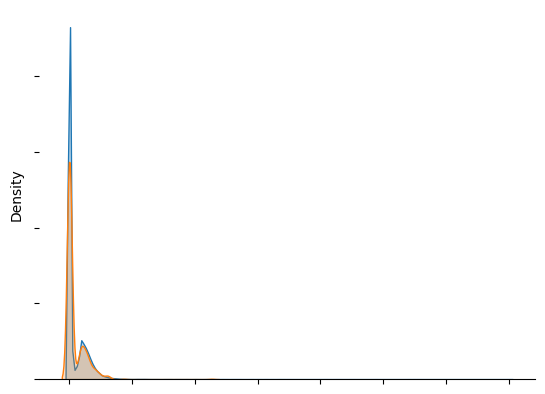

feature26
feature26 0.012764124709544312


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


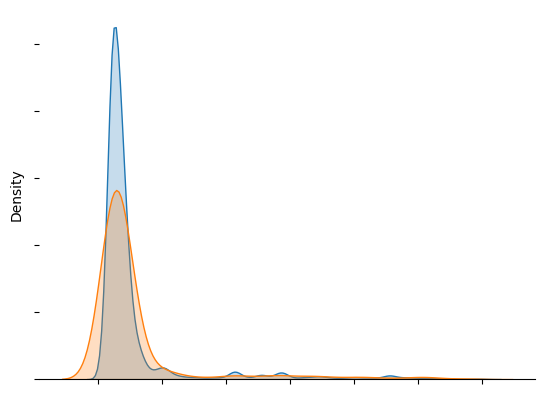

feature27
feature27 0.019310138276036514


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


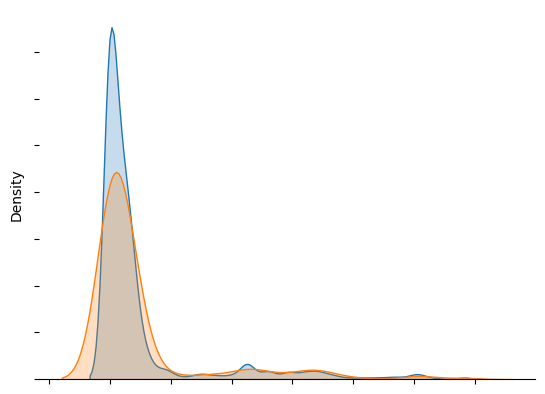

feature28
feature28 0.006097098962186629


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


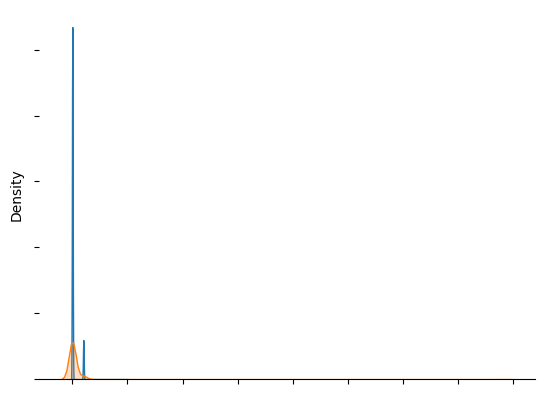

feature29
feature29 0.0017330469320256023


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


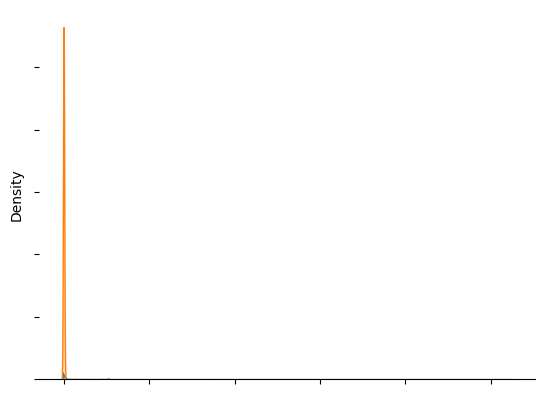

feature30
feature30 0.008156444903421734


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


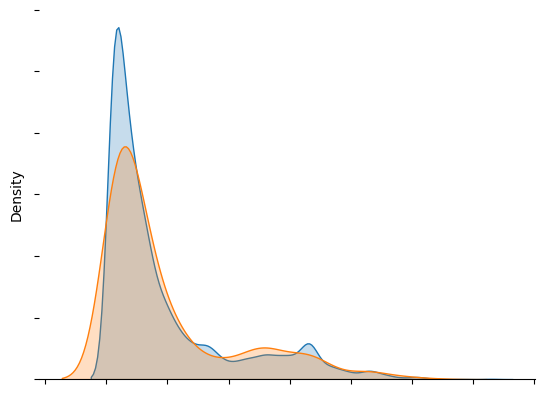

feature31
feature31 0.008396760353813868


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


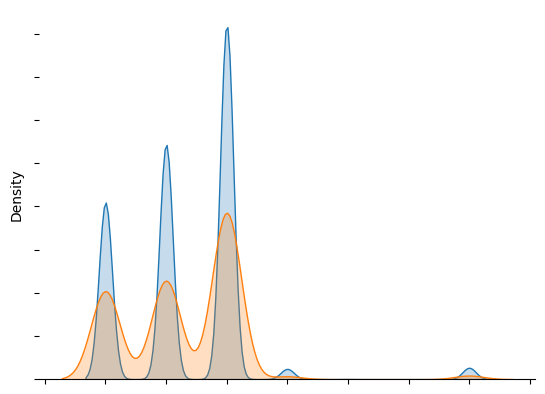

feature32
feature32 0.01742547635361633


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


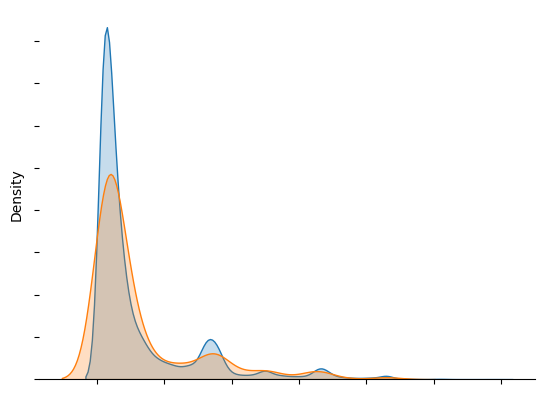

feature33
feature33 0.013404743547018497


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


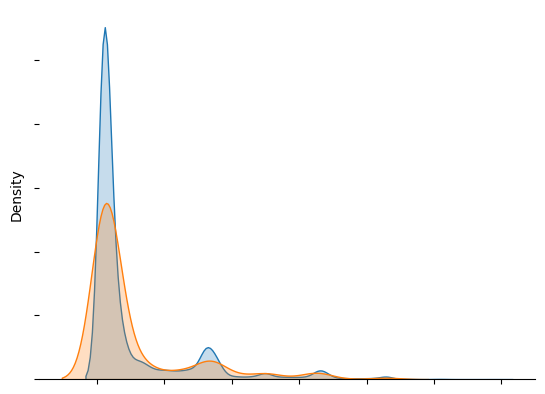

feature34
feature34 0.002638469924846316


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


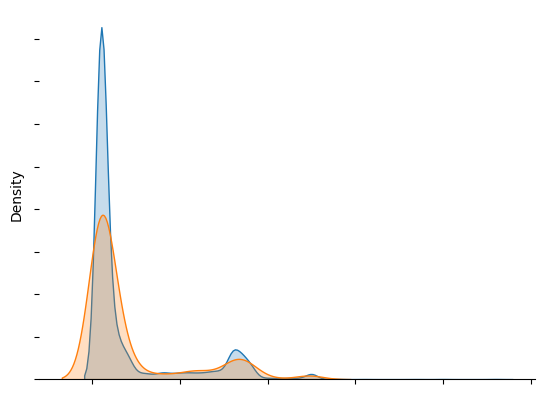

feature35
feature35 0.011517833271790961


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


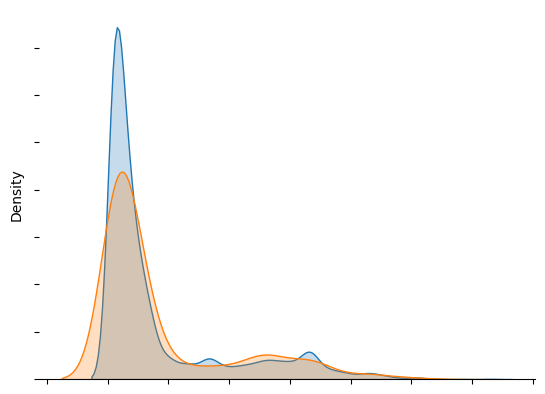

feature36
feature36 0.000246808267609414


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


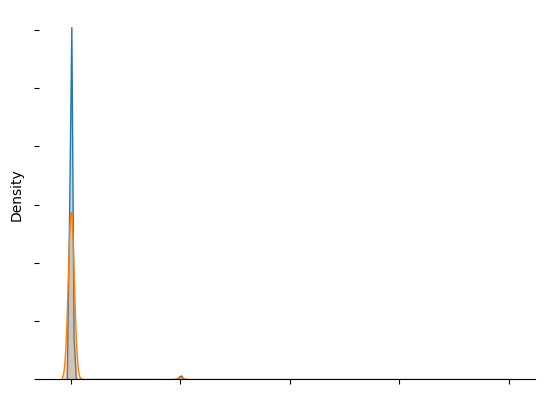

feature37
feature37 0.0001339306583380633


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


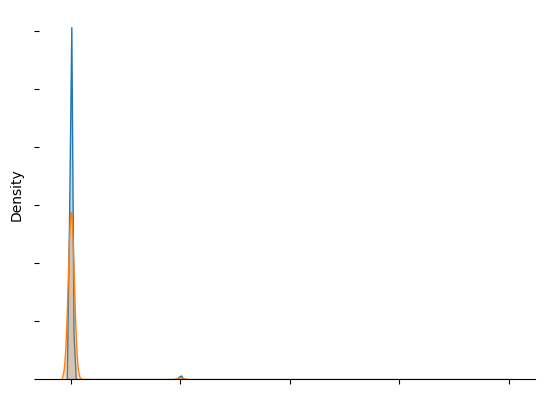

feature38
feature38 0.0007408297249532032


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


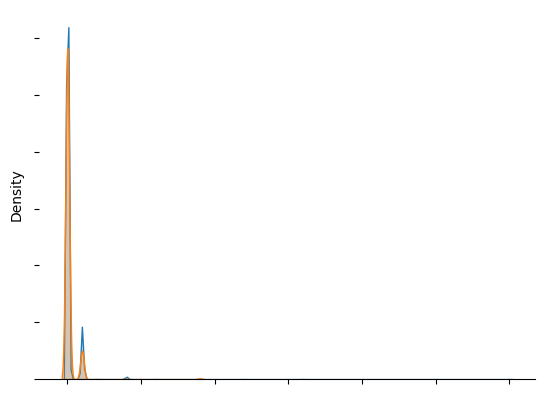

feature39
feature39 0.01164532959323919


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


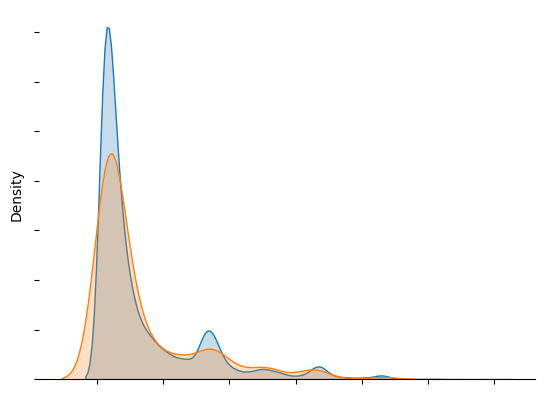

feature40
feature40 0.009672126863173355


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


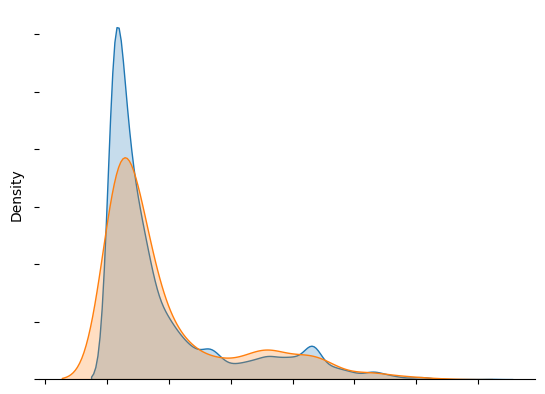

feature41
feature41 0.0056325937325152325


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


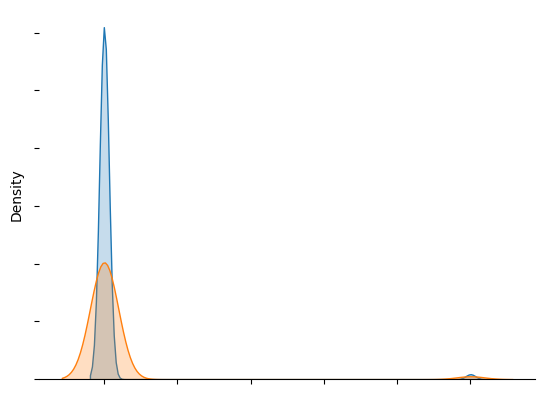

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


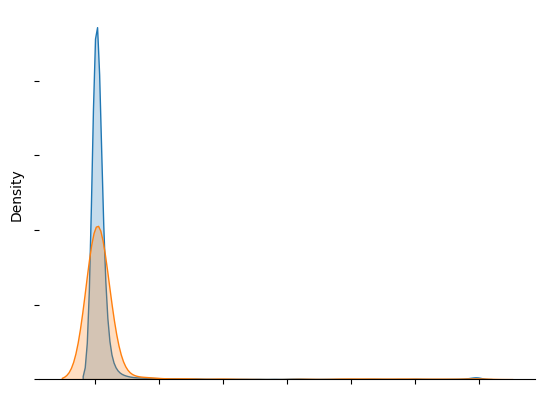

feature5
feature5 0.0062079308349194725


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


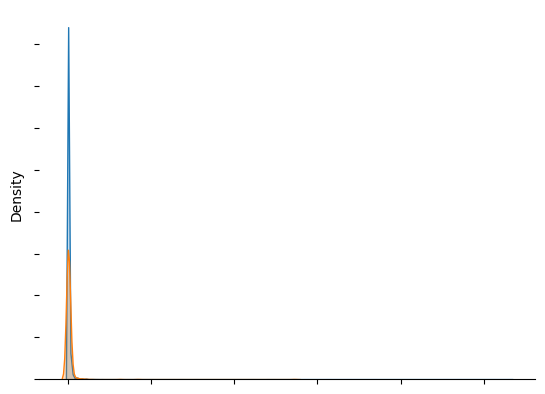

feature6
feature6 0.0006329056219331445


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


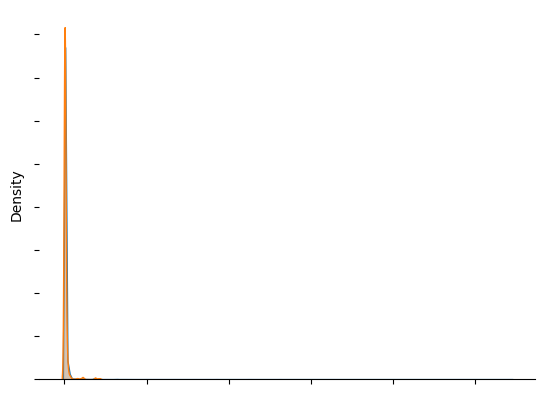

feature7
feature7 0.008886993078873629


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


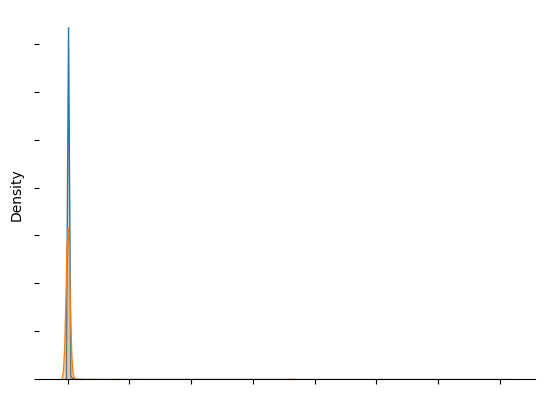

feature8
feature8 0.0020344064122328784


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


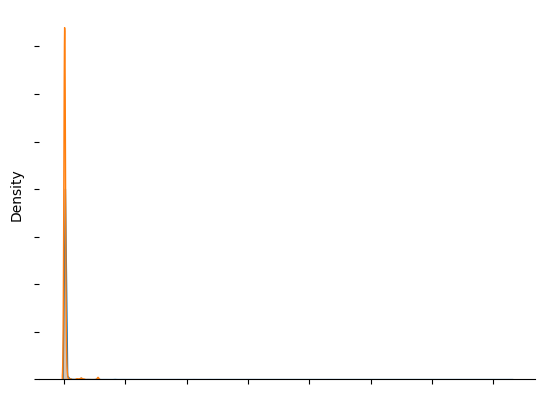

feature9
feature9 0.0014798098369652147


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


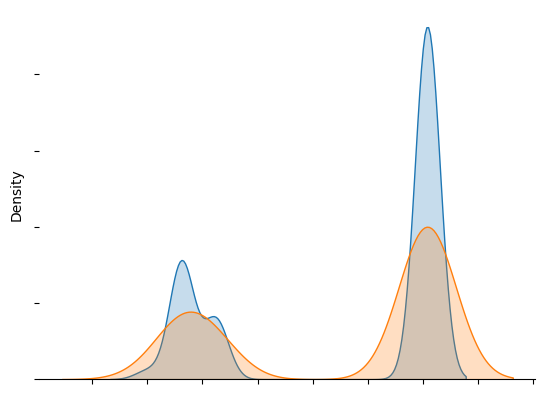

feature10
feature10 0.0007341351527501336


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


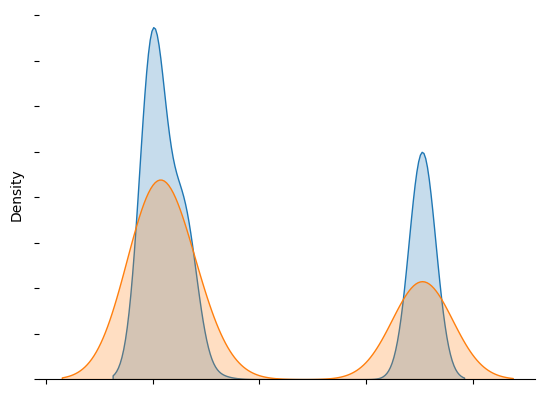

feature11
feature11 0.008095857602708577


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


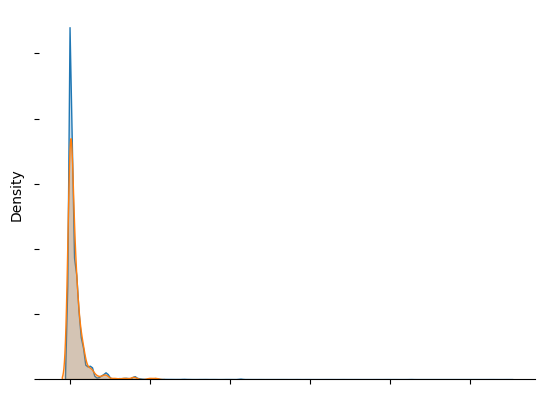

feature12
feature12 0.032501841550785955


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


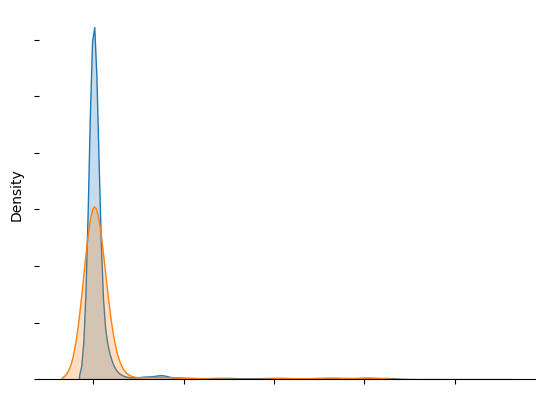

feature13
feature13 0.006625593780987142


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


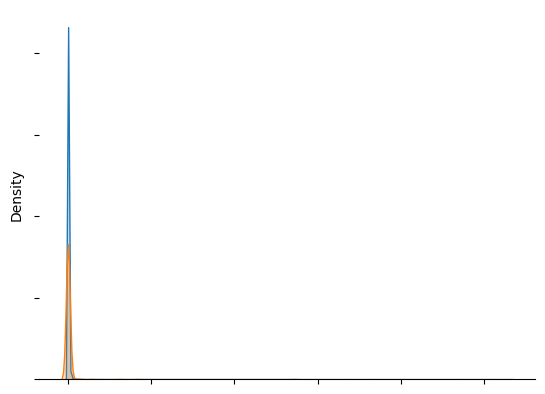

feature14
feature14 0.0011863668899709627


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


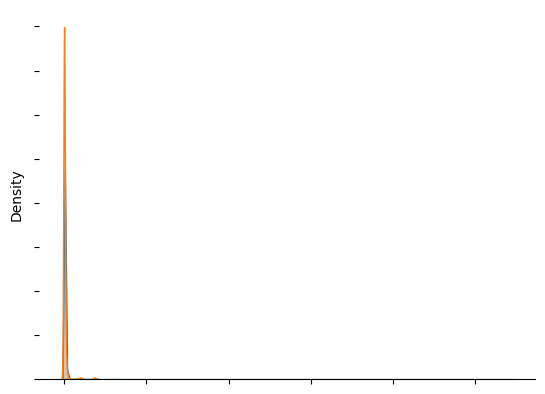

feature15
feature15 0.003798270605381786


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


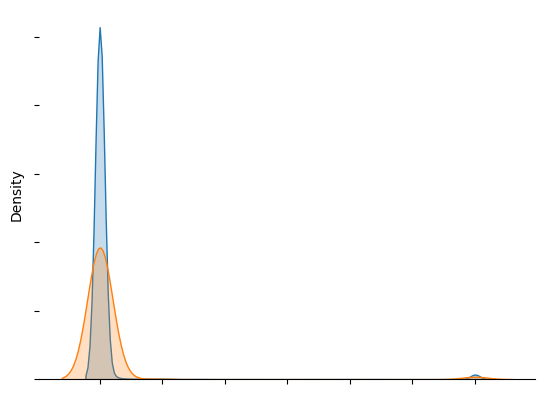

feature16
feature16 0.008468256201602561


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


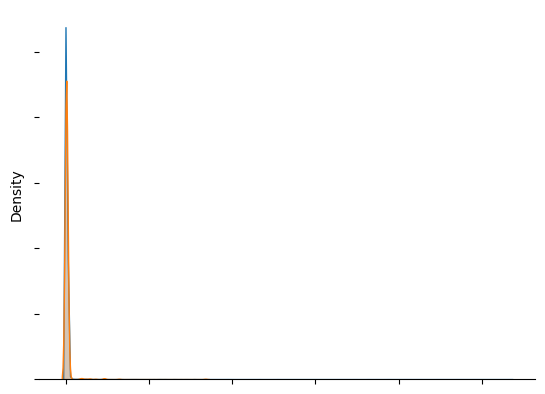

feature17
feature17 0.011928110260109665


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


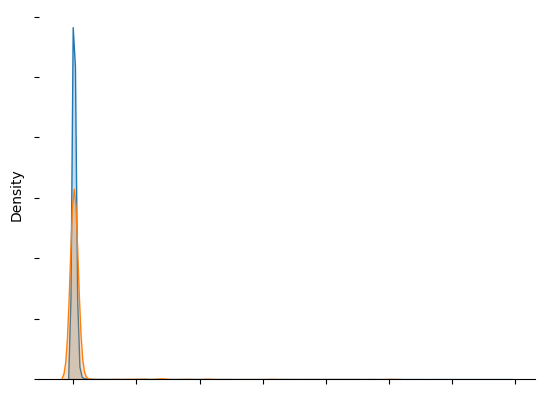

feature18
feature18 0.0015327469764589482


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


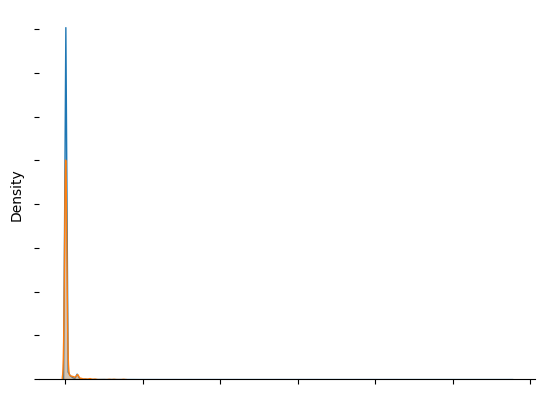

feature19
feature19 0.004203893395566537


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


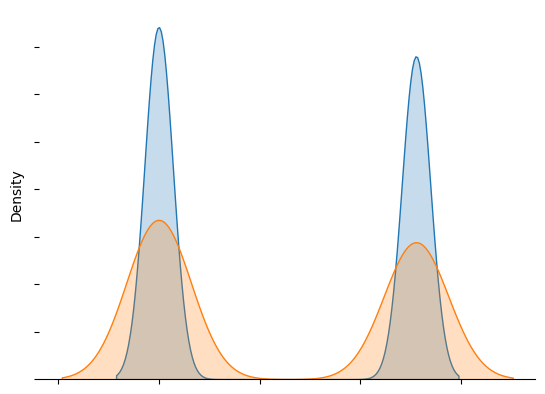

feature20
feature20 0.037212763928259895


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


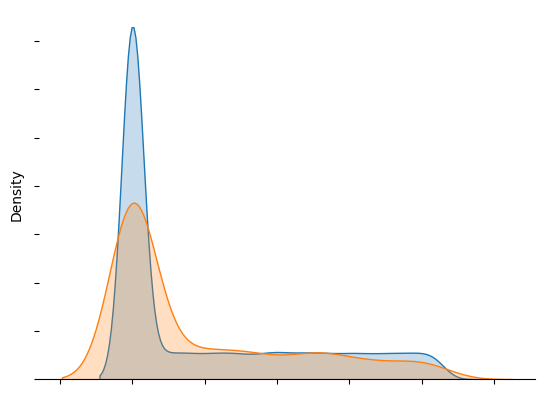

feature21
feature21 0.0303623893917597


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


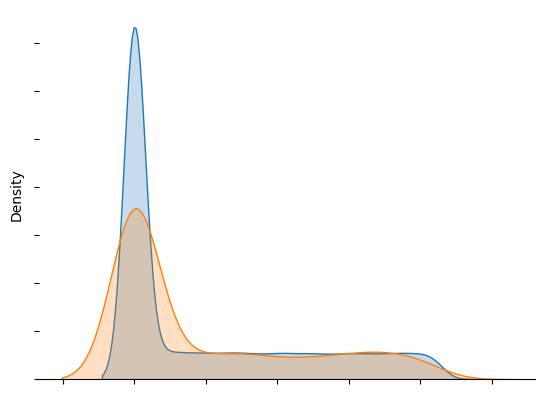

feature22
feature22 0.0014036759836441402


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


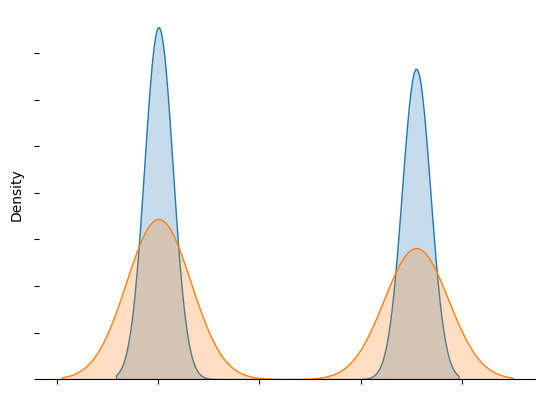

feature23
feature23 0.001560026258396586


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


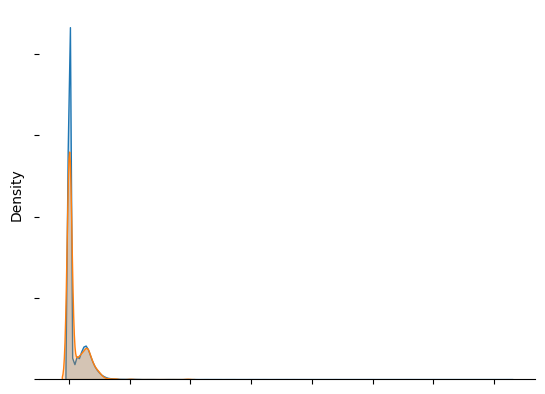

feature24
feature24 0.0024424298242294393


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


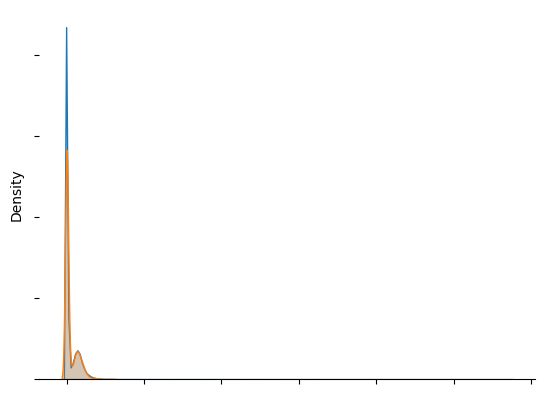

feature25
feature25 0.0006259202309746796


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


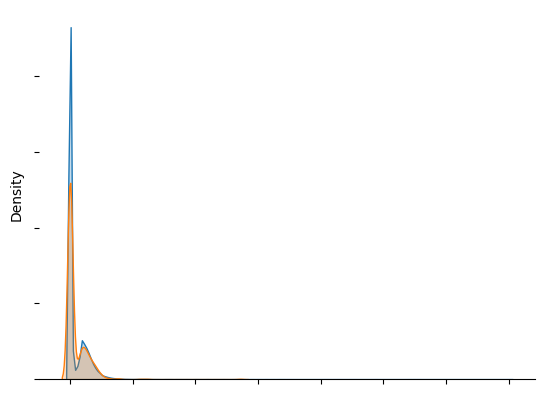

feature26
feature26 0.00809173468682856


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


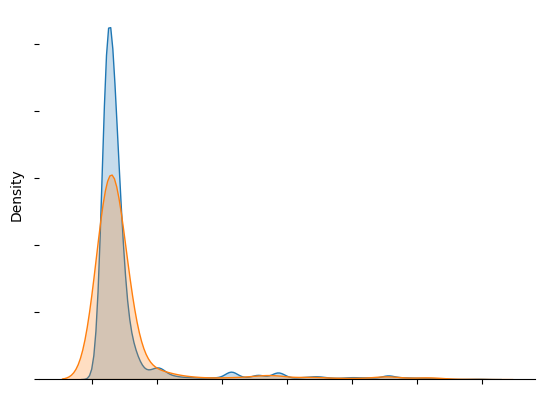

feature27
feature27 0.011338073140461844


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


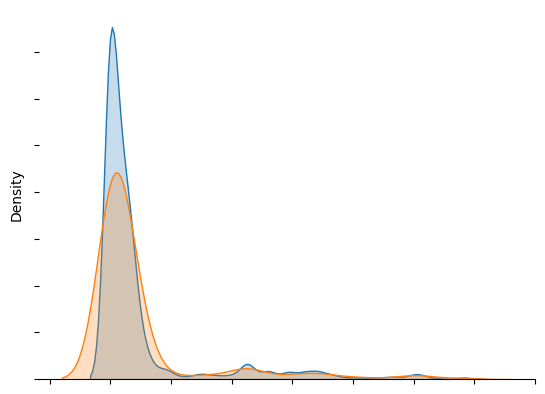

feature28
feature28 0.0006517257526539356


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


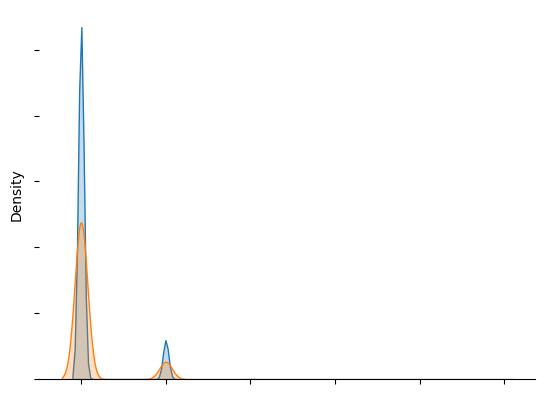

feature29
feature29 0.0006868563677454025


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


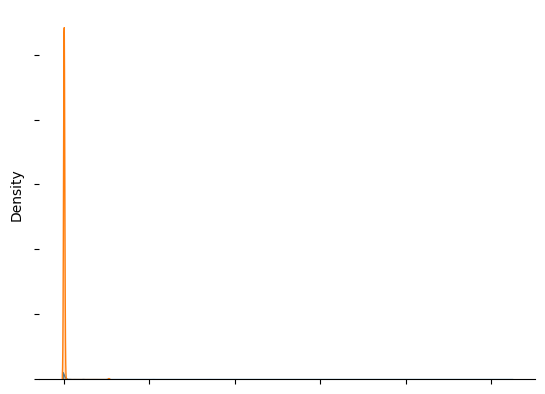

feature30
feature30 0.0043883536615563785


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


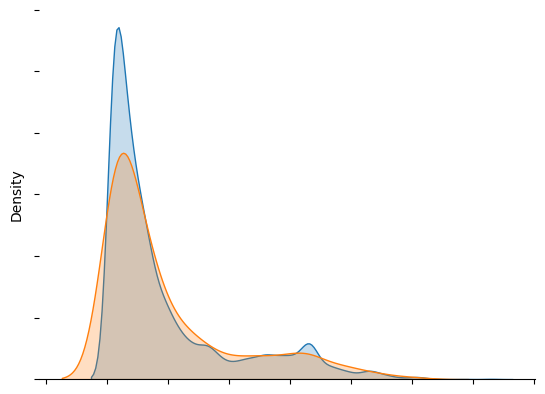

feature31
feature31 0.0018453712953699383


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


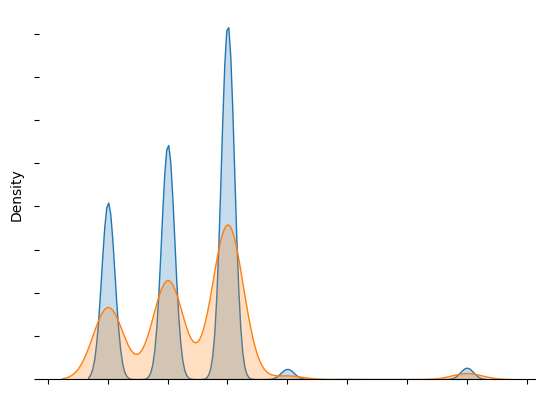

feature32
feature32 0.004990752432598921


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


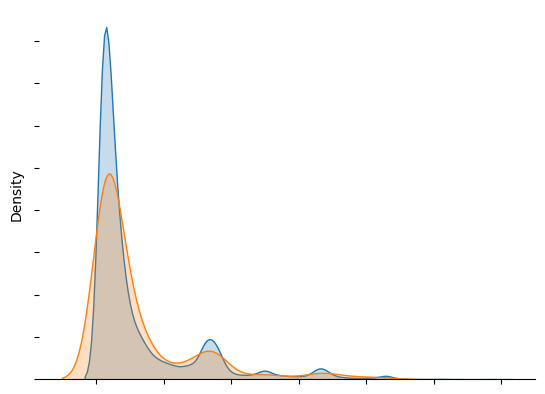

feature33
feature33 0.003844632003427524


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


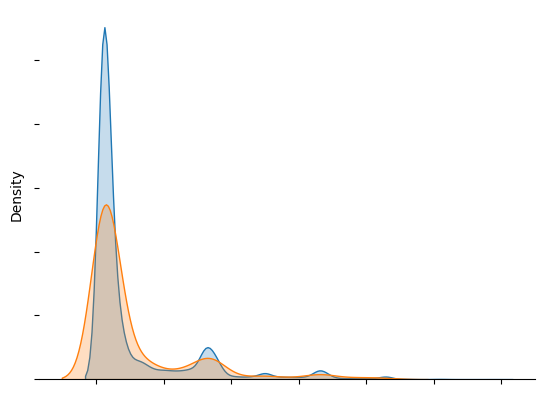

feature34
feature34 0.003335986192106106


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


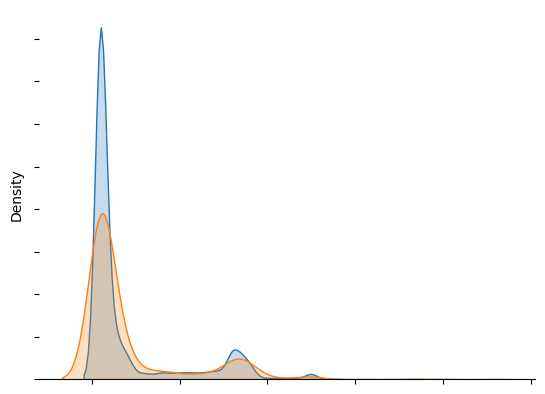

feature35
feature35 0.0039696230090838355


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


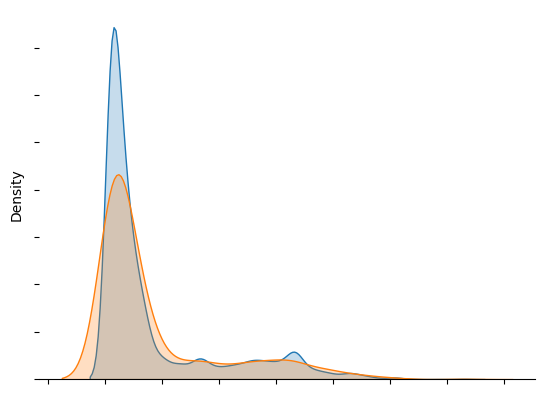

feature36
feature36 0.005625066989232921


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


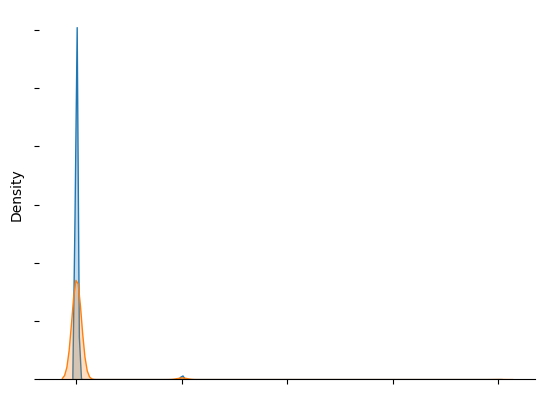

feature37
feature37 0.005537479222632416


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


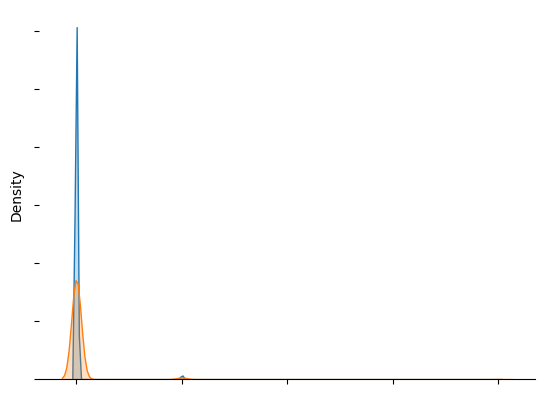

feature38
feature38 0.0007408297249532032


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


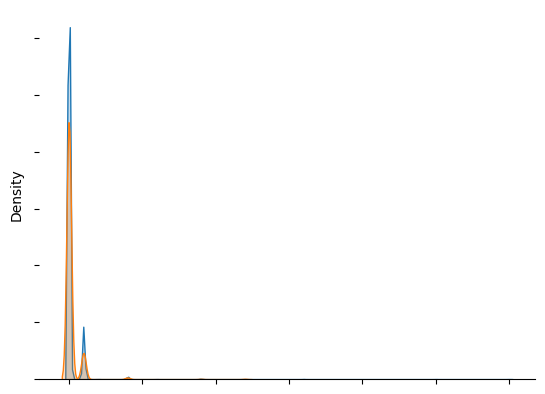

feature39
feature39 0.004677779876576527


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


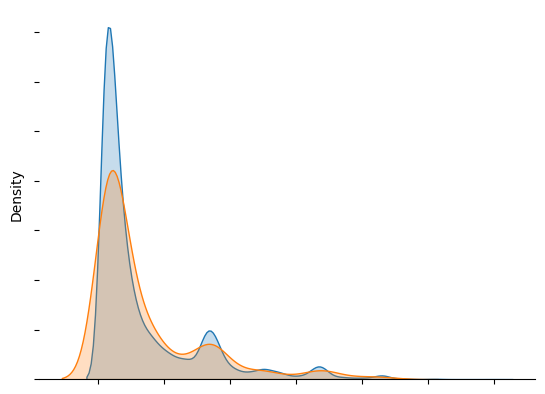

feature40
feature40 0.00330751163154593


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


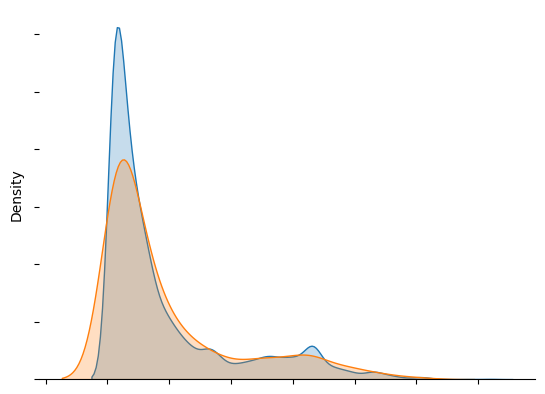

feature41
feature41 0.0029899584988555164


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


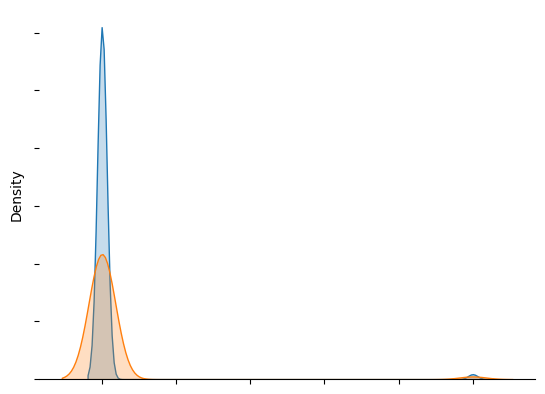

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


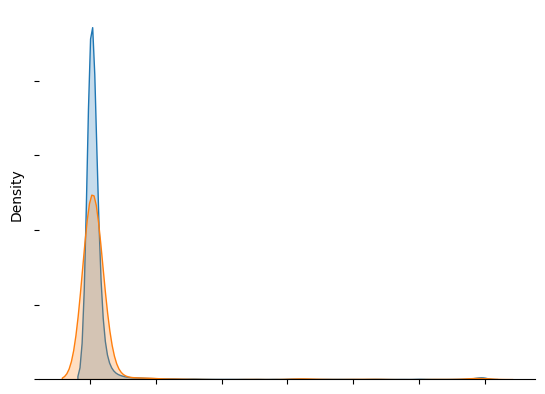

feature5
feature5 0.0005798593113597689


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


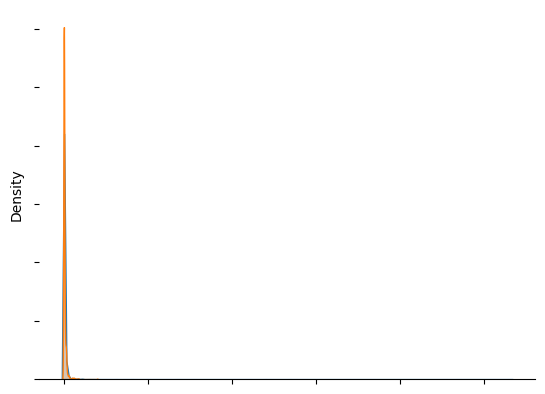

feature6
feature6 0.0016197385998306382


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


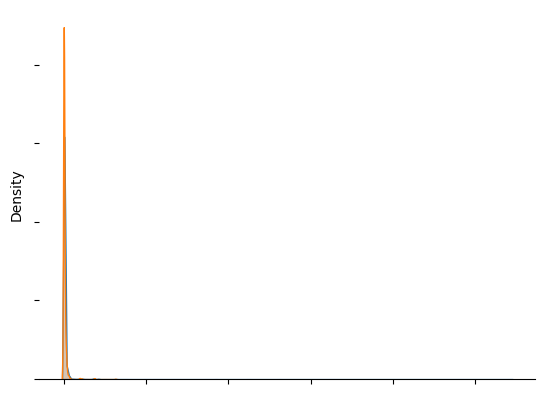

feature7
feature7 0.0022571451817102097


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


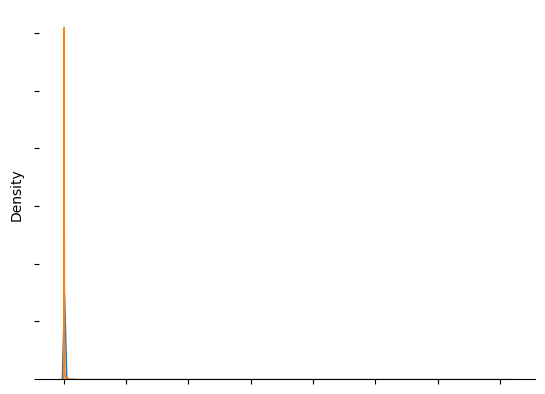

feature8
feature8 0.0027889051461648094


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


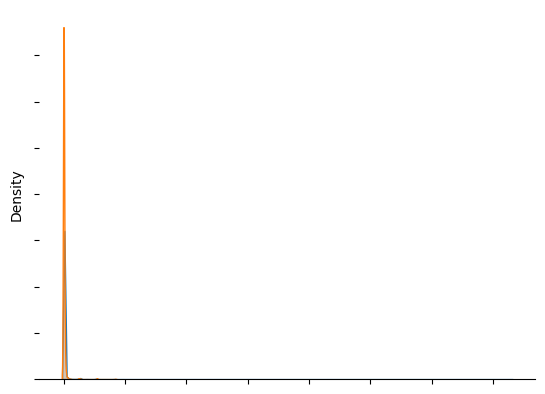

feature9
feature9 0.00030112150768928607


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


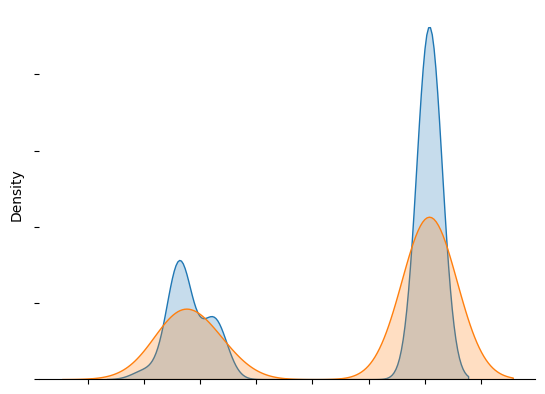

feature10
feature10 0.00042396088483724517


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


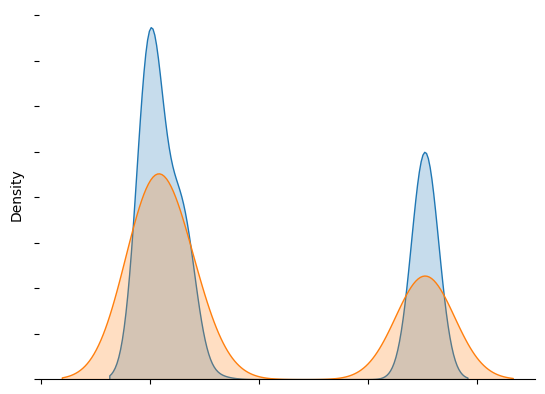

feature11
feature11 0.011508501211153805


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


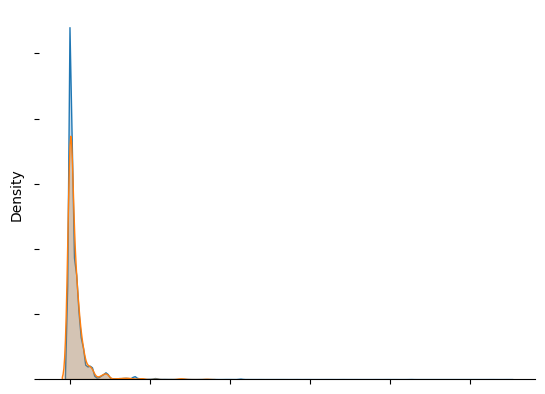

feature12
feature12 0.014203259888383361


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


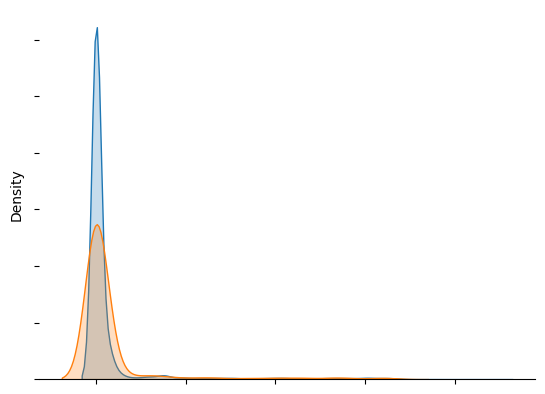

feature13
feature13 0.0005642046473190873


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


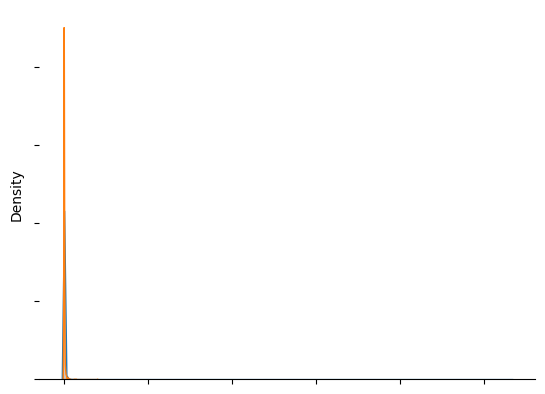

feature14
feature14 0.0007250265828031149


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


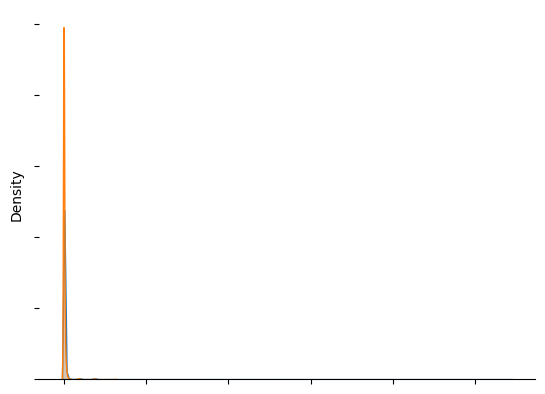

feature15
feature15 0.011305840903371002


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


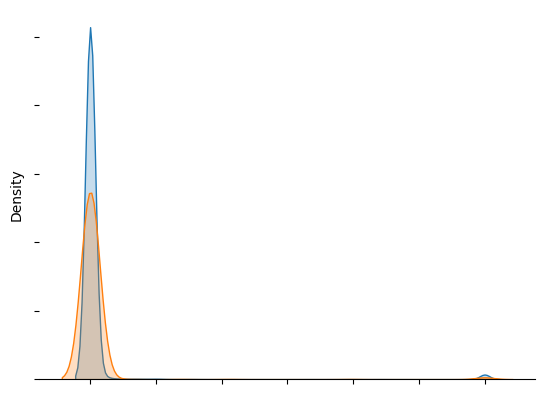

feature16
feature16 0.01022654368841924


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


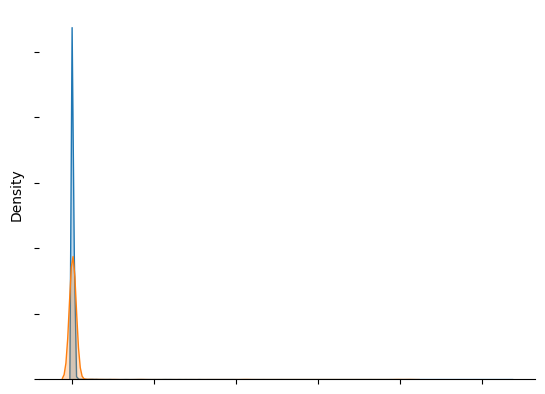

feature17
feature17 0.0051542938397418055


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


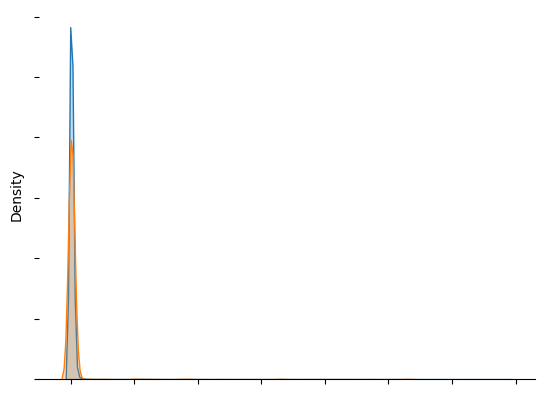

feature18
feature18 0.0016900162524534218


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


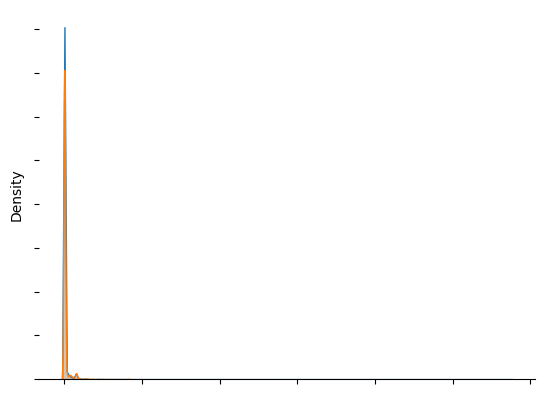

feature19
feature19 0.0007254195813879124


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


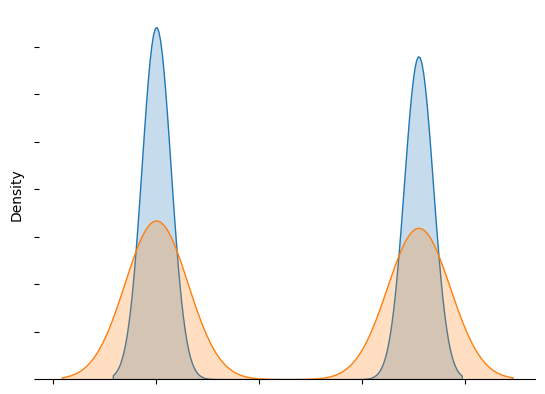

feature20
feature20 0.02780553592536586


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


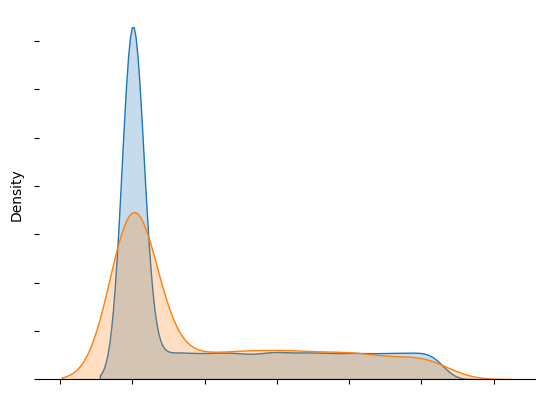

feature21
feature21 0.034834870467515745


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


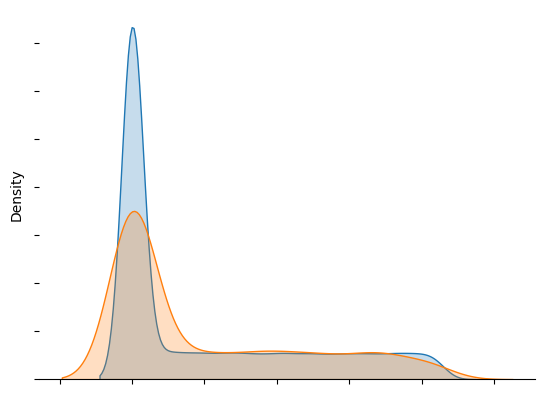

feature22
feature22 0.0006978161045659973


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


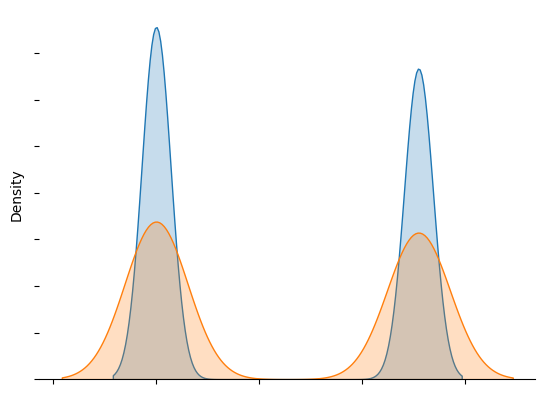

feature23
feature23 0.0009738895099359788


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


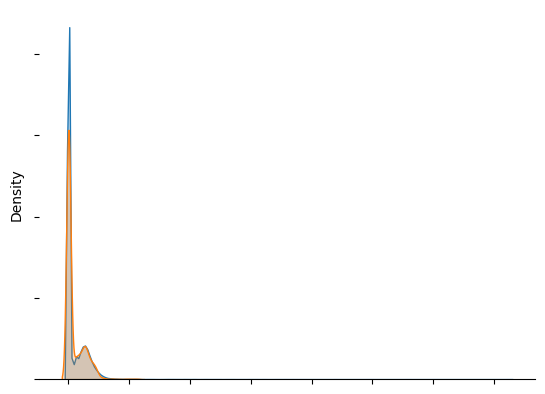

feature24
feature24 0.0024424298242294393


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


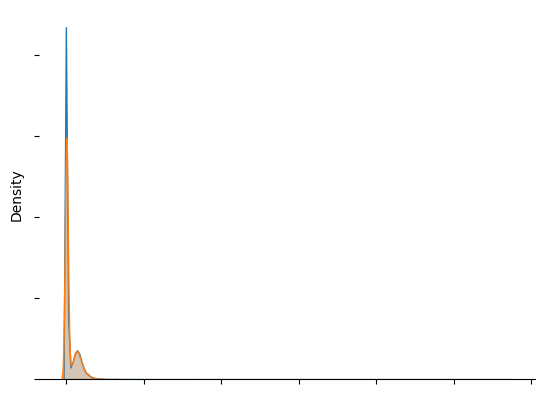

feature25
feature25 0.002105881835793178


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


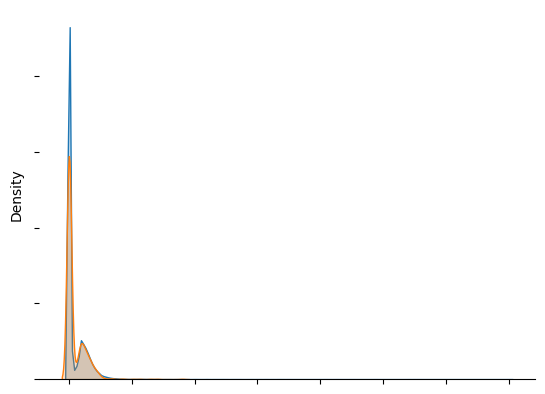

feature26
feature26 0.007528381977825894


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


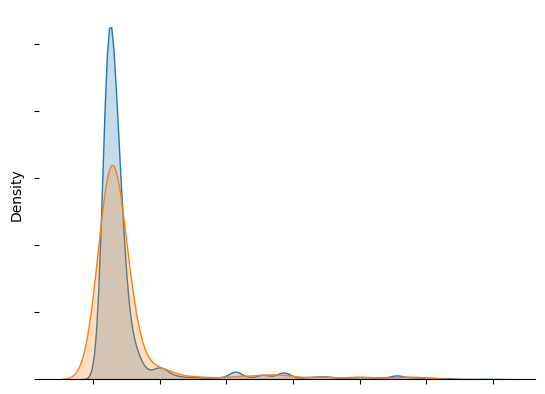

feature27
feature27 0.006428921485613068


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


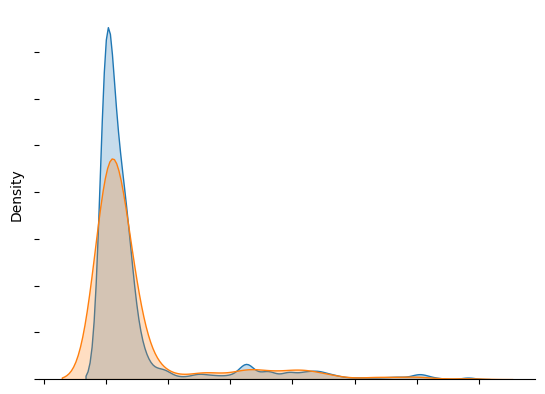

feature28
feature28 0.0006659217102040719


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


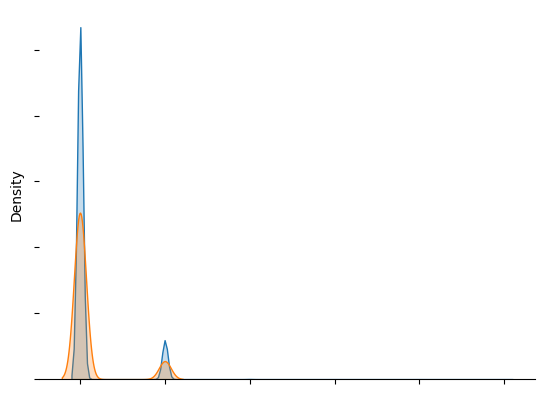

feature29
feature29 0.00038966130659964776


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


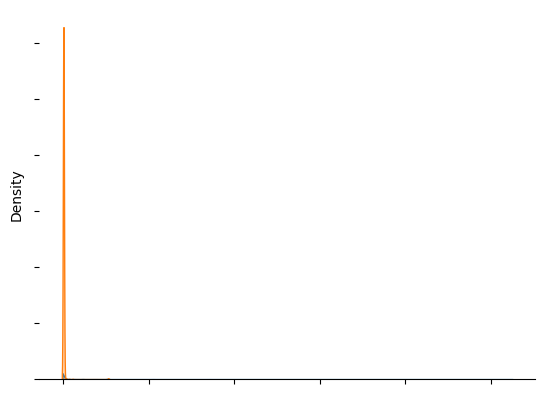

feature30
feature30 0.007083530455201889


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


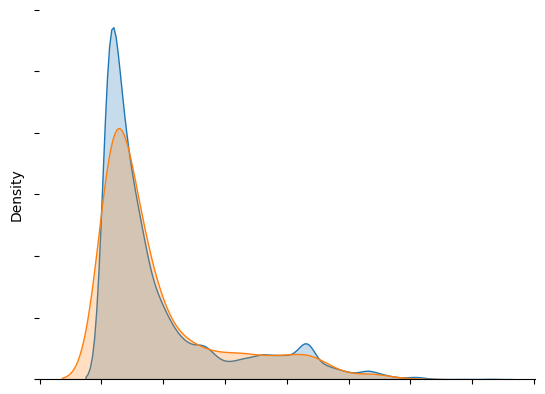

feature31
feature31 0.0008221850455581832


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


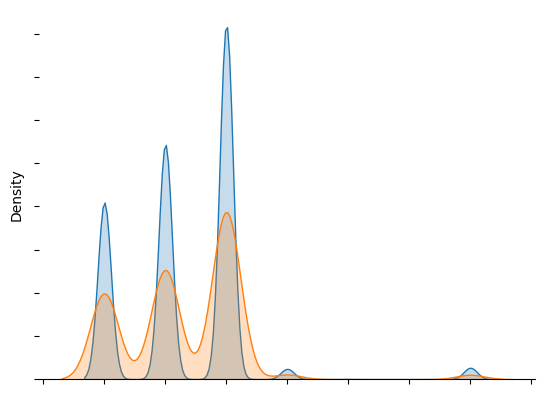

feature32
feature32 0.0026884066846879196


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


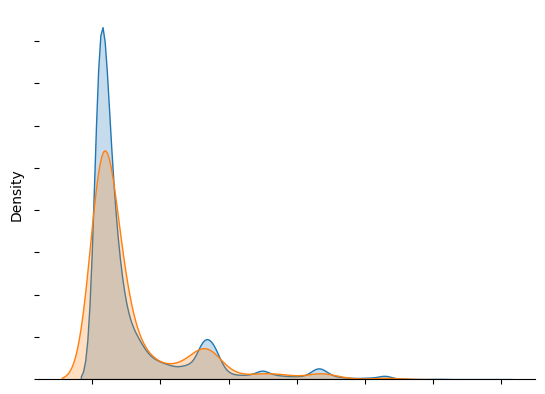

feature33
feature33 0.0049254287150458


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


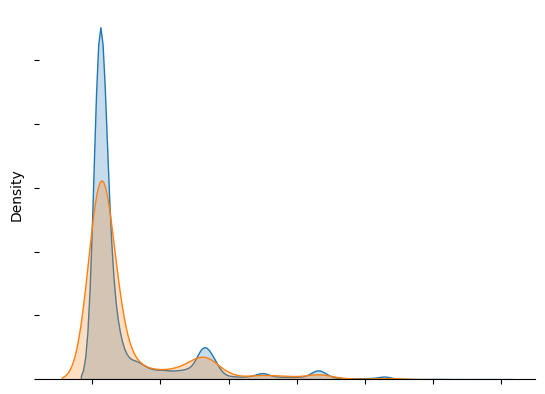

feature34
feature34 0.0008557083296899714


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


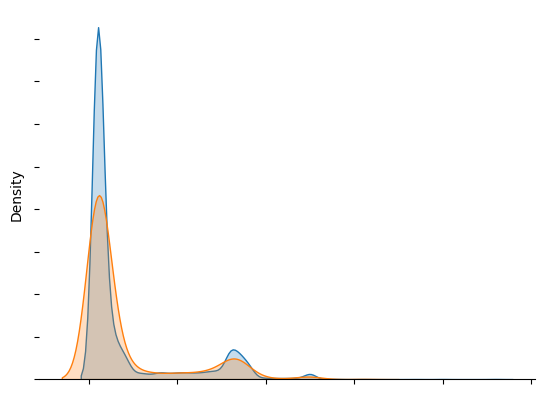

feature35
feature35 0.00845498707504458


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


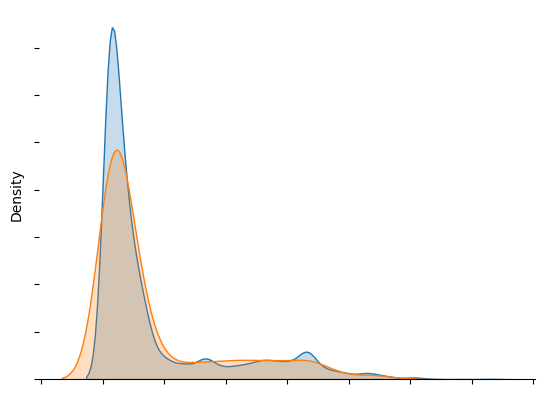

feature36
feature36 0.004668231472658243


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


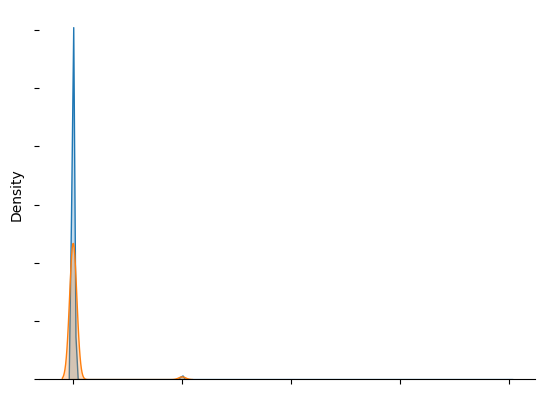

feature37
feature37 0.004593056108234334


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


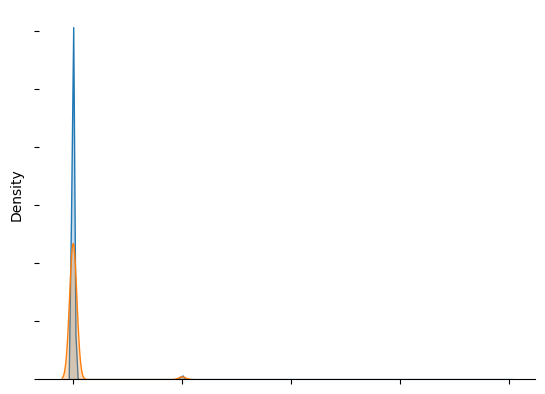

feature38
feature38 0.0033321492930878664


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


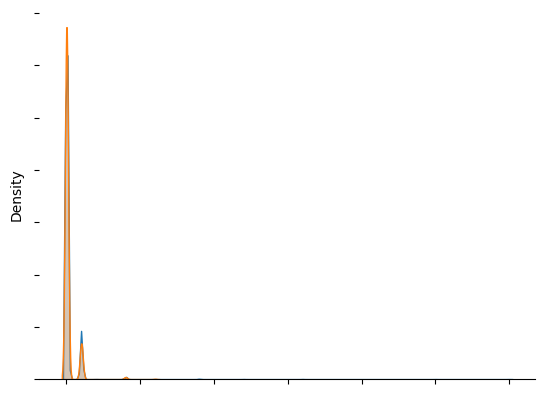

feature39
feature39 0.00430862249472693


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


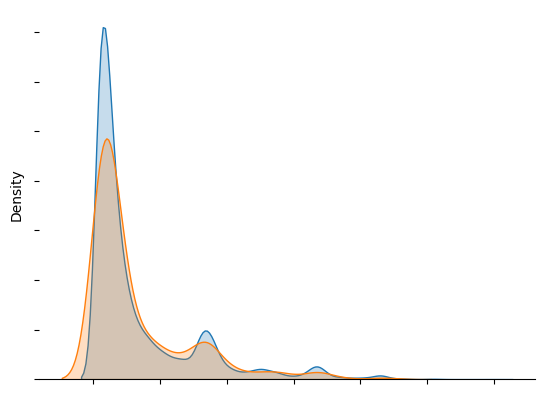

feature40
feature40 0.005842381920493912


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


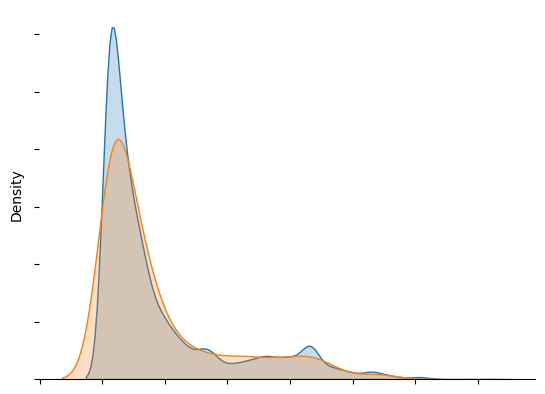

feature41
feature41 0.0011182645660917144


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


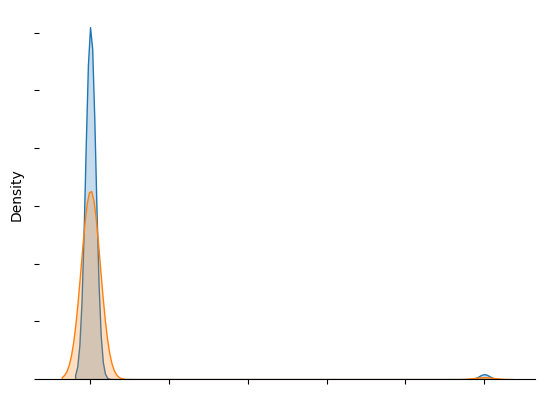

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


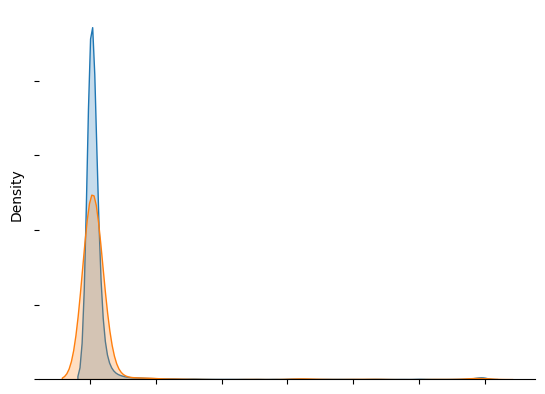

feature5
feature5 0.0005798593113597689


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


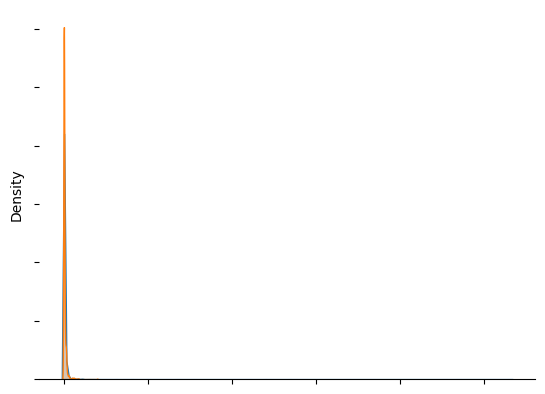

feature6
feature6 0.0016197385998306382


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


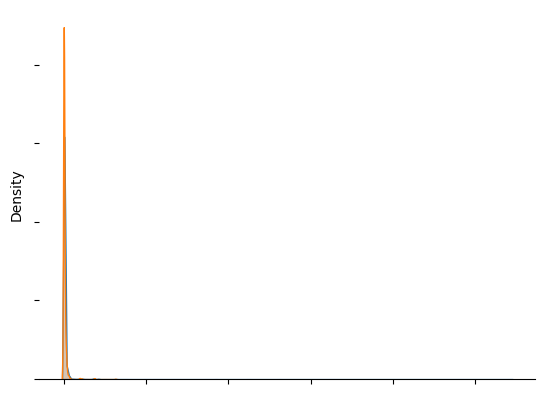

feature7
feature7 0.0022571451817102097


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


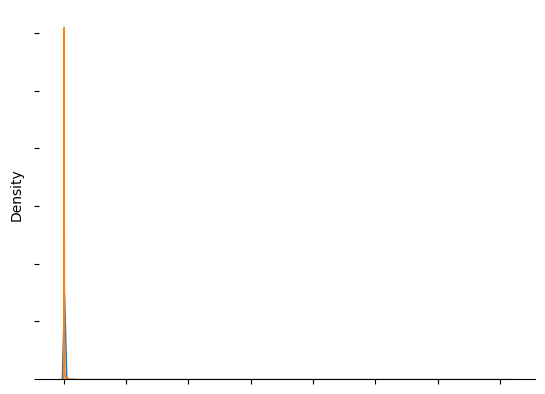

feature8
feature8 0.0027889051461648094


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


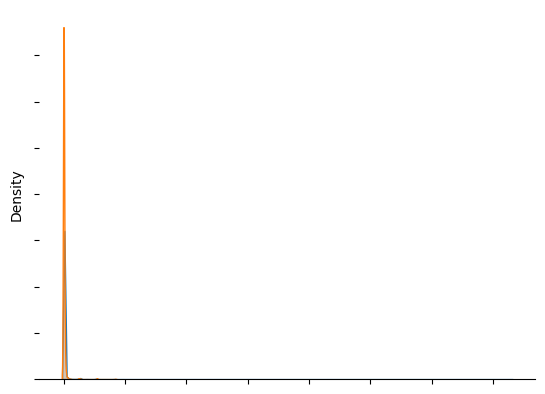

feature9
feature9 0.00030112150768928607


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


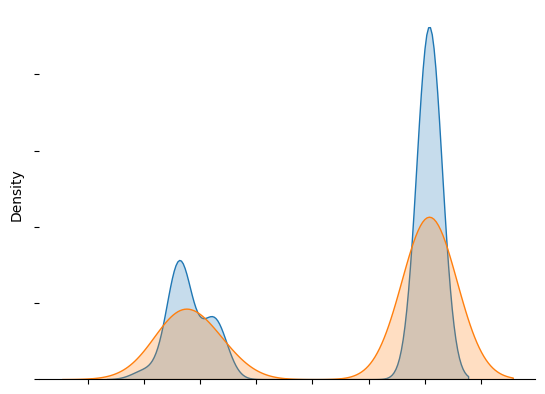

feature10
feature10 0.00042396088483724517


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


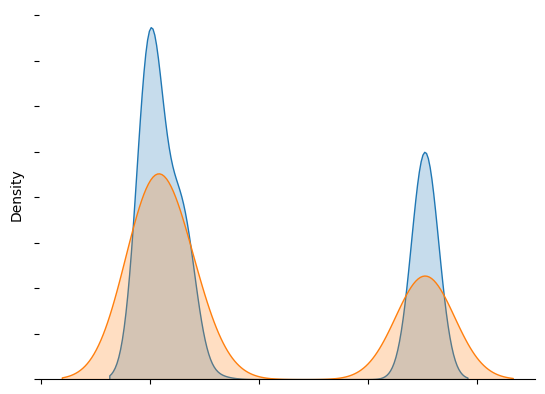

feature11
feature11 0.011508501211153805


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


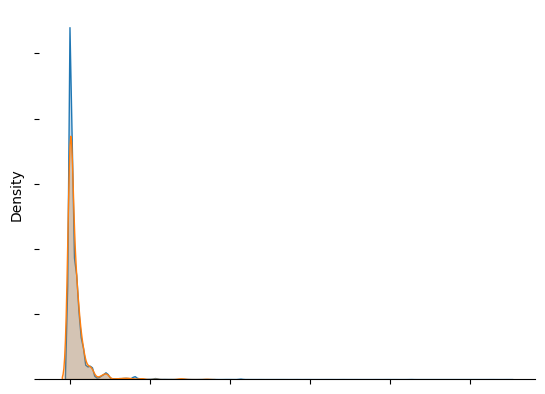

feature12
feature12 0.014203259888383361


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


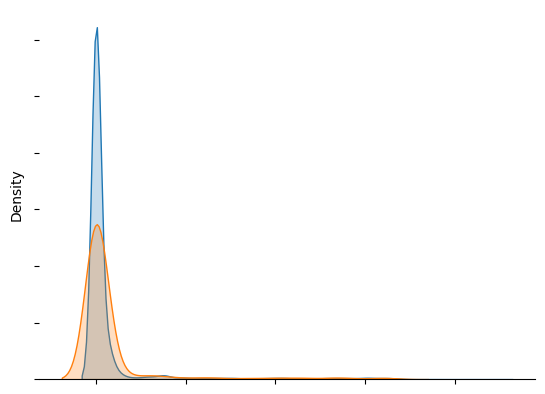

feature13
feature13 0.0005642046473190873


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


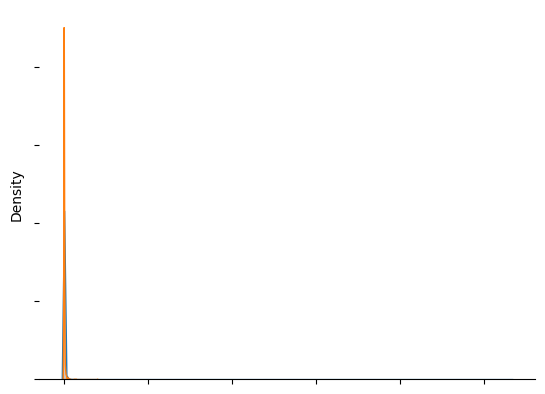

feature14
feature14 0.0007250265828031149


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


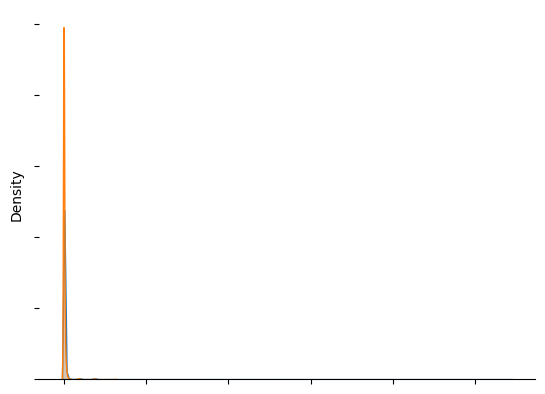

feature15
feature15 0.011305840903371002


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


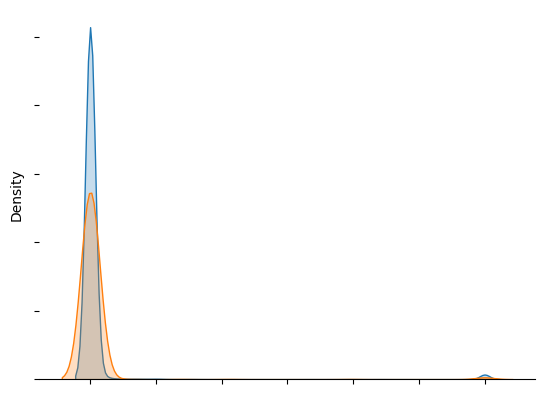

feature16
feature16 0.01022654368841924


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


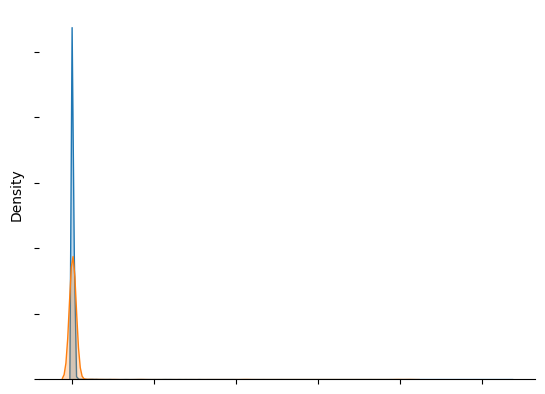

feature17
feature17 0.0051542938397418055


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


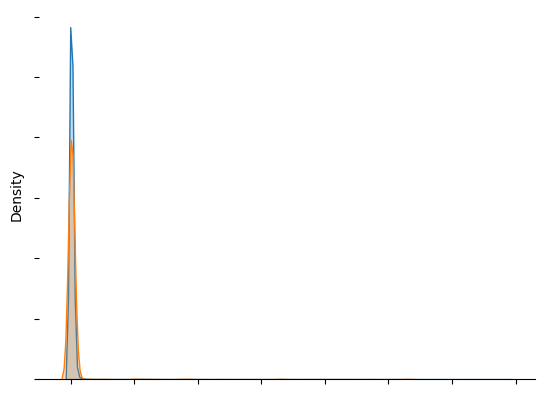

feature18
feature18 0.0016900162524534218


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


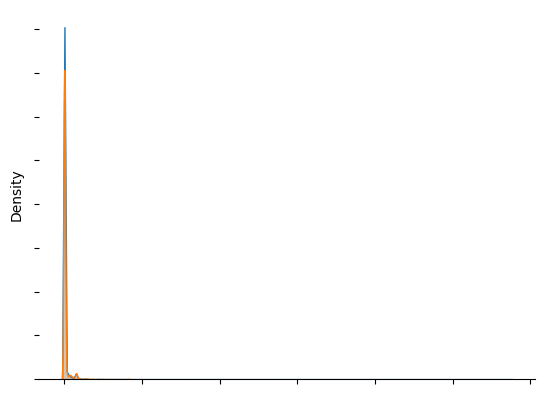

feature19
feature19 0.0007254195813879124


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


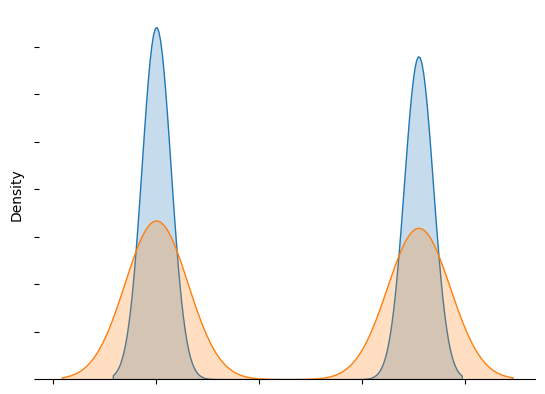

feature20
feature20 0.02780553592536586


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


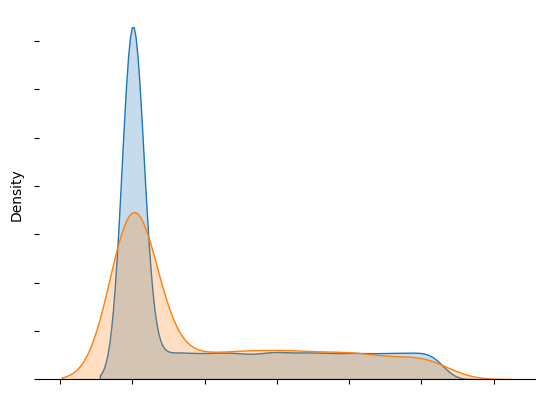

feature21
feature21 0.034834870467515745


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


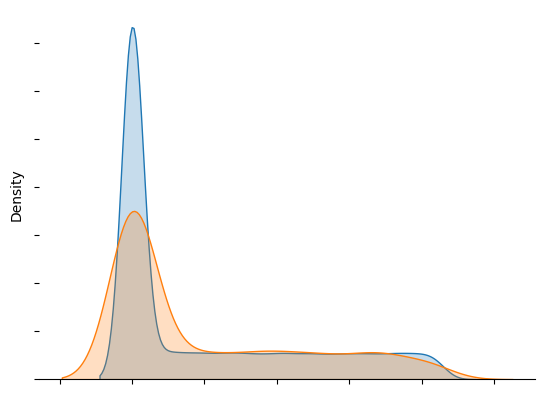

feature22
feature22 0.0006978161045659973


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


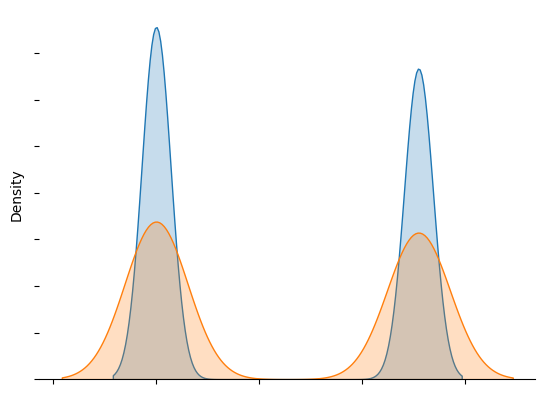

feature23
feature23 0.0009738895099359788


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


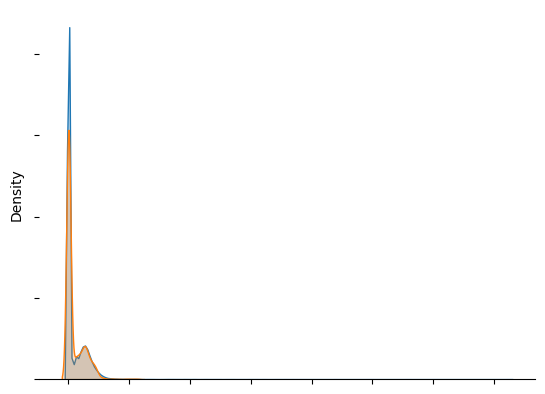

feature24
feature24 0.0024424298242294393


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


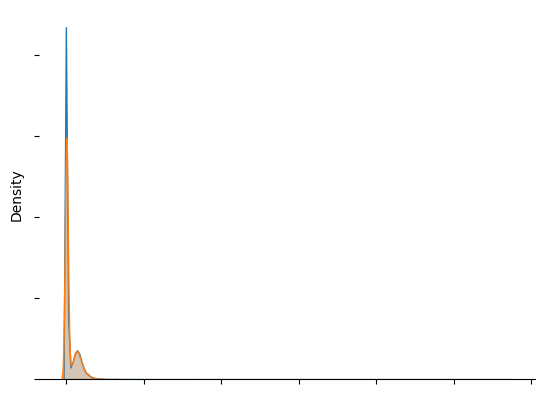

feature25
feature25 0.002105881835793178


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


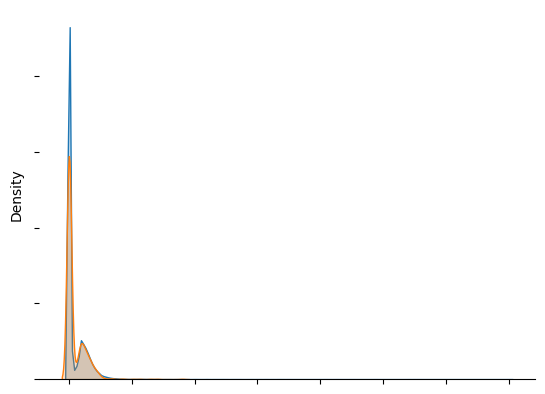

feature26
feature26 0.007528381977825894


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


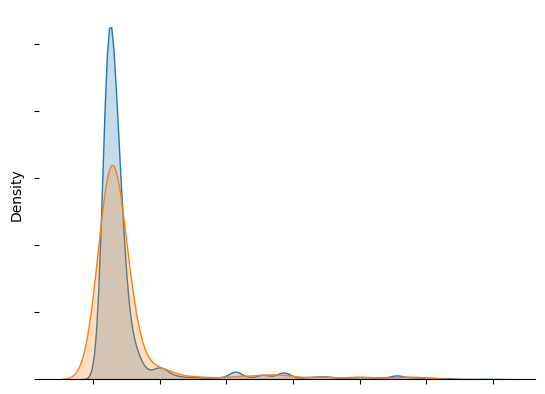

feature27
feature27 0.006428921485613068


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


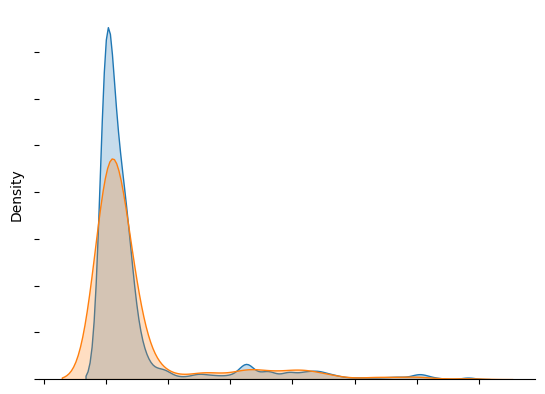

feature28
feature28 0.0006659217102040719


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


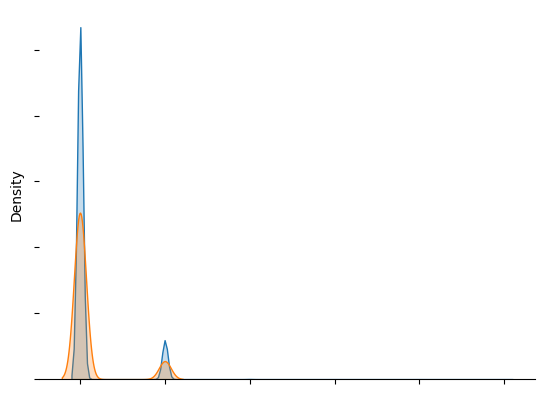

feature29
feature29 0.00038966130659964776


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


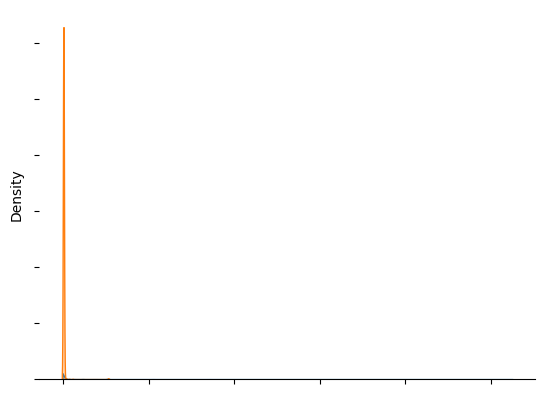

feature30
feature30 0.007083530455201889


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


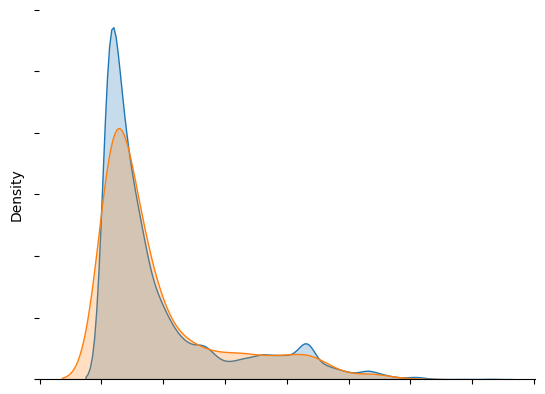

feature31
feature31 0.0008221850455581832


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


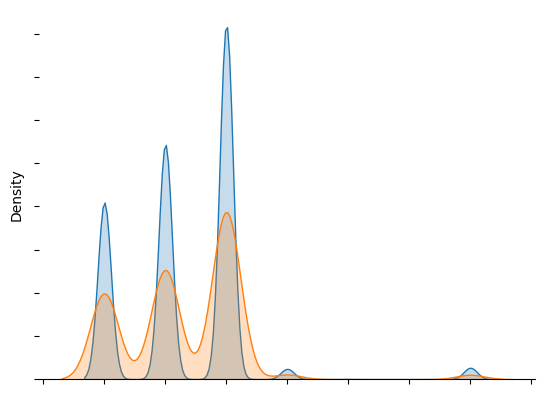

feature32
feature32 0.0026884066846879196


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


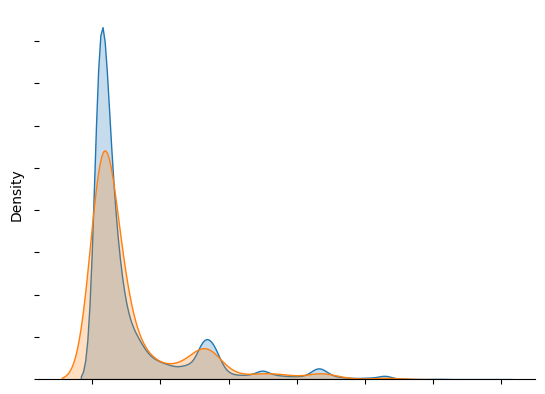

feature33
feature33 0.0049254287150458


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


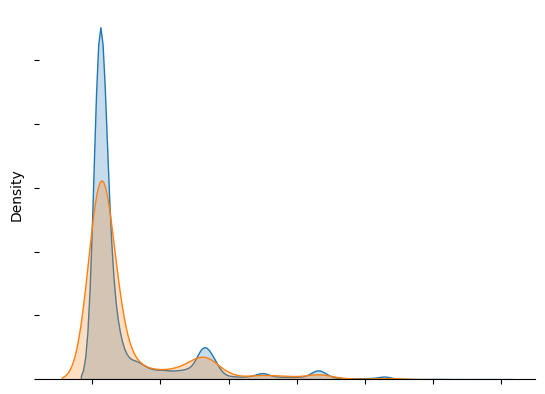

feature34
feature34 0.0008557083296899714


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


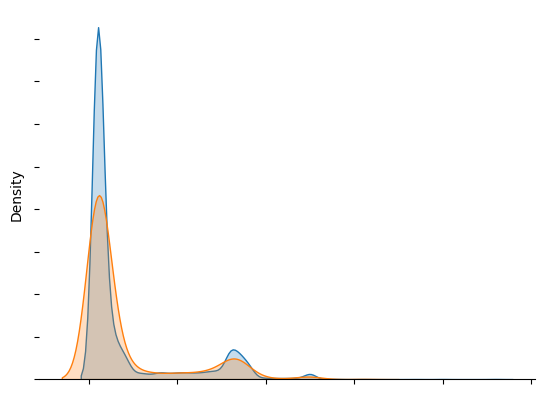

feature35
feature35 0.00845498707504458


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


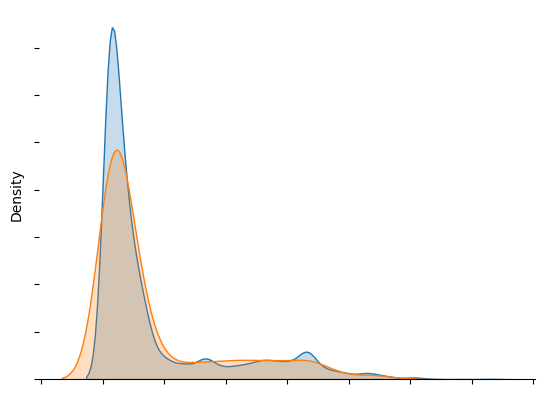

feature36
feature36 0.004668231472658243


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


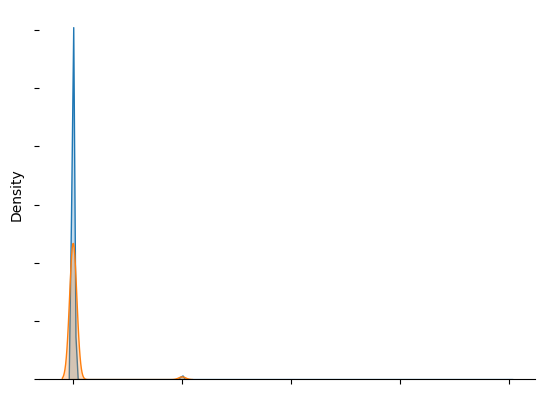

feature37
feature37 0.004593056108234334


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


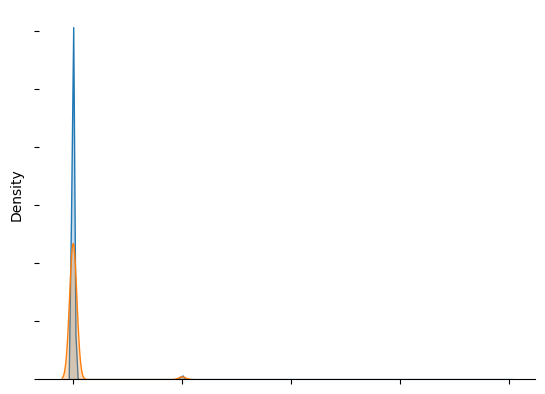

feature38
feature38 0.0033321492930878664


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


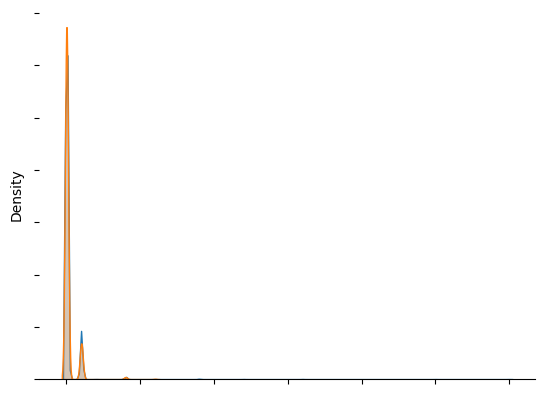

feature39
feature39 0.00430862249472693


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


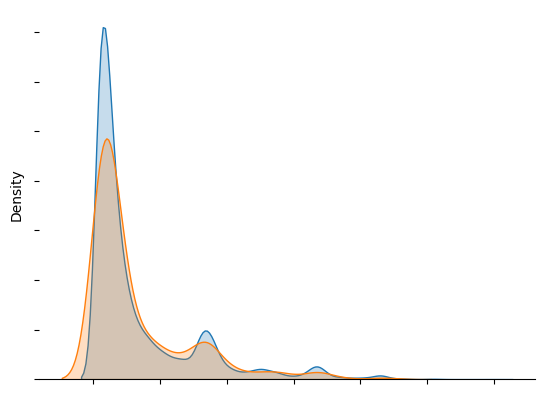

feature40
feature40 0.005842381920493912


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


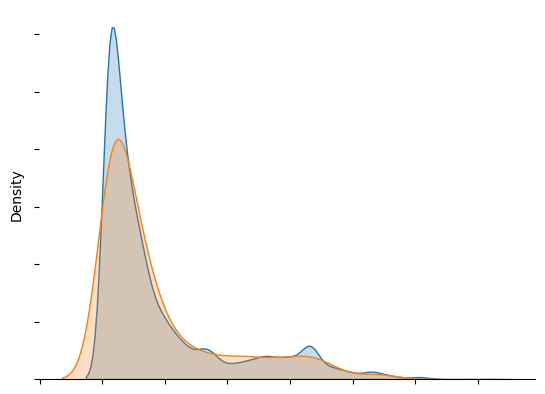

feature41
feature41 0.0011182645660917144


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


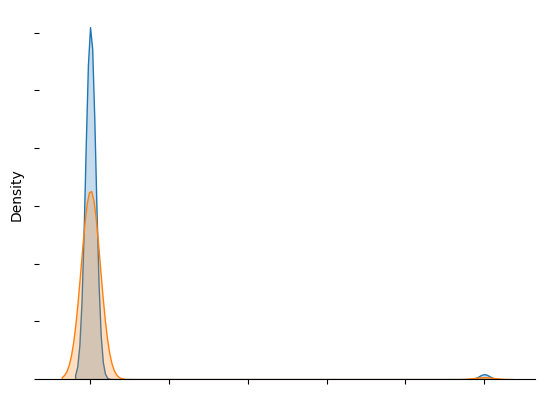

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


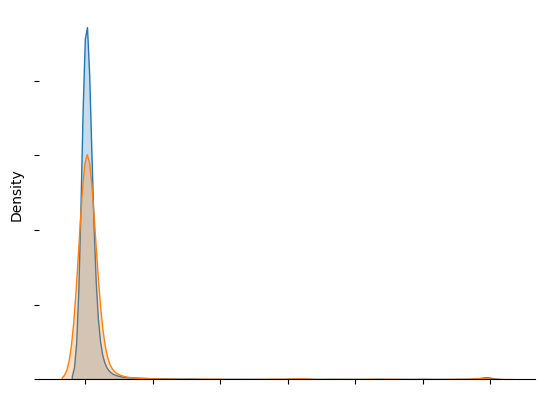

feature5
feature5 0.0005798593113597689


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


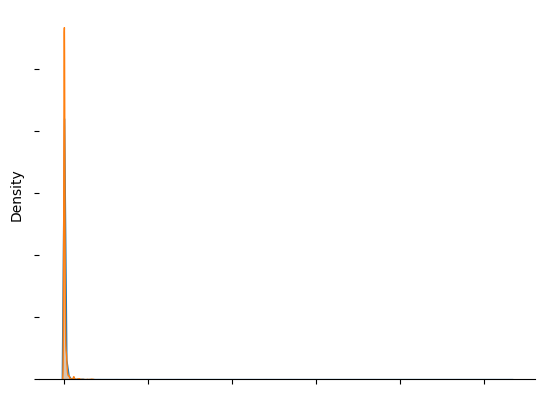

feature6
feature6 0.001123192692594493


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


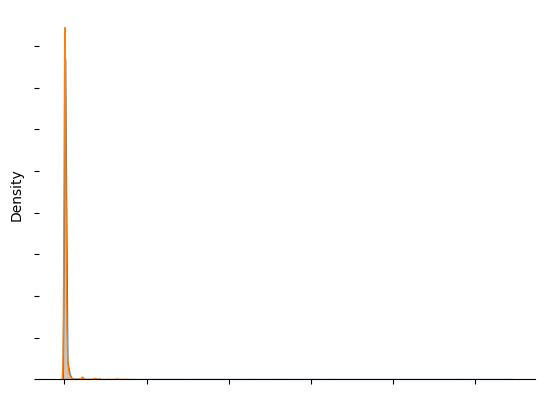

feature7
feature7 0.0017282132338726204


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


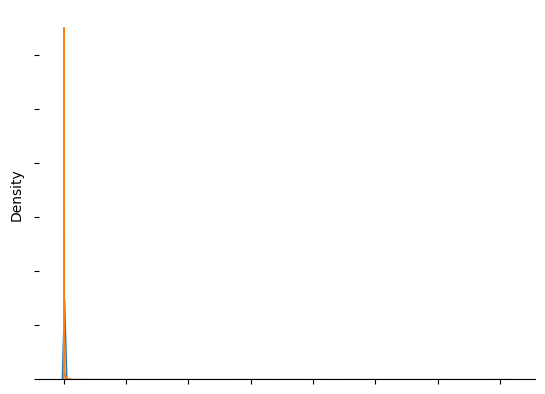

feature8
feature8 0.004156137071259723


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


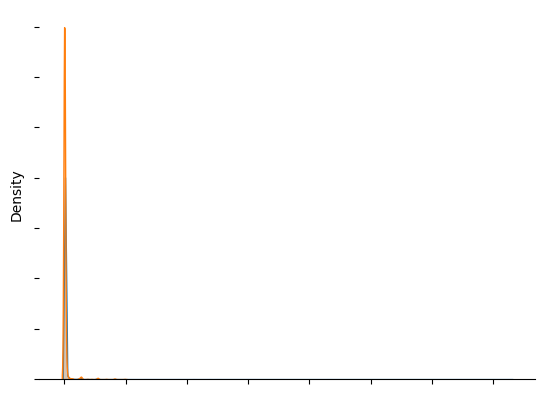

feature9
feature9 0.0036008158675430394


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


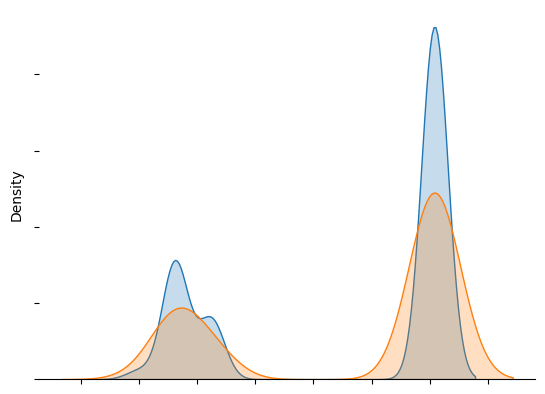

feature10
feature10 0.0022854257398256346


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


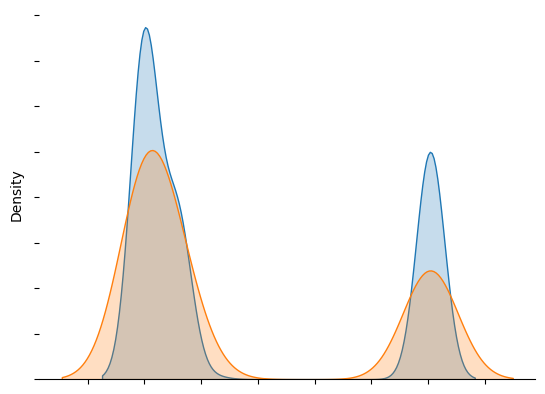

feature11
feature11 0.008043196605623174


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


feature24
feature24 0.0005163315226993337


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


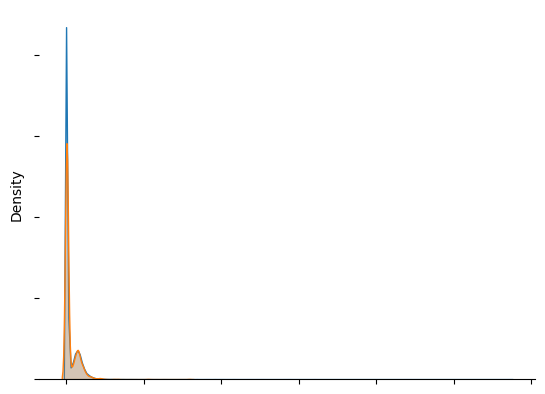

feature25
feature25 0.0013257635136006082


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


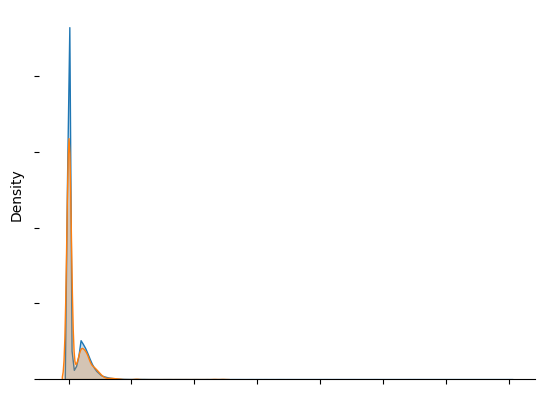

feature26
feature26 0.006264399003293536


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


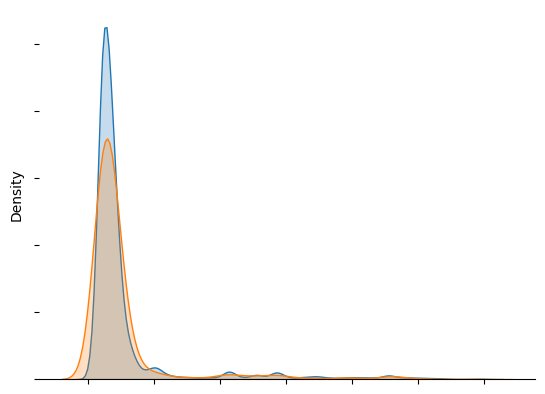

feature27
feature27 0.007512338244144664


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


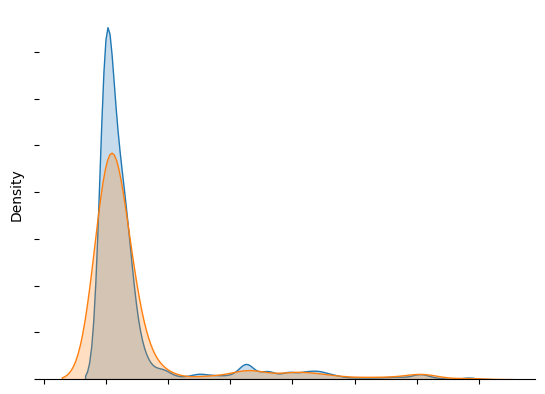

feature28
feature28 0.0035940416642099658


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


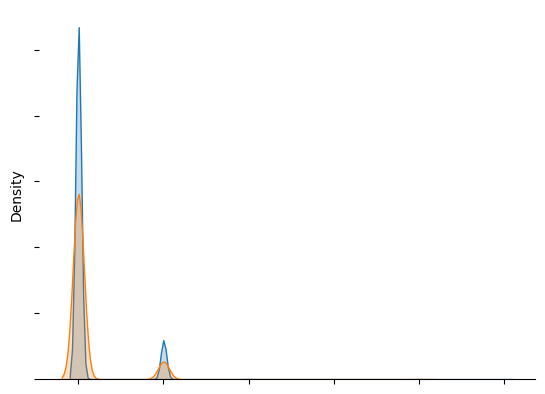

feature29
feature29 0.001848274704184324


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


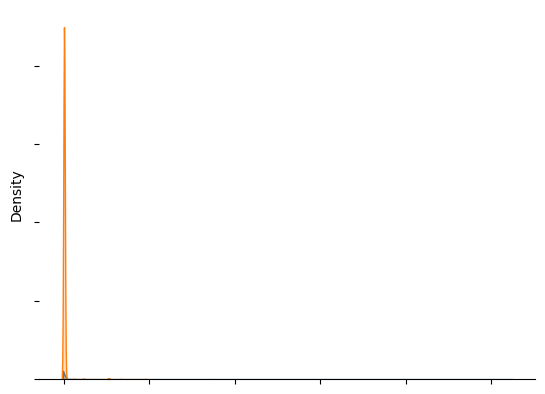

feature30
feature30 0.0041187198704979305


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


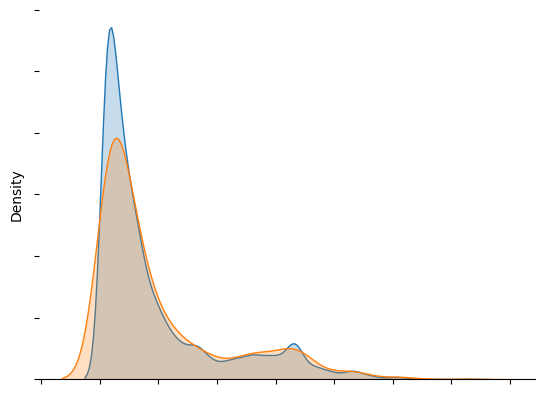

feature31
feature31 0.005047155408625168


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


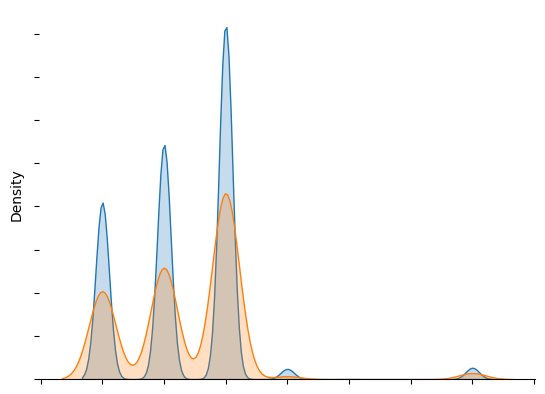

feature32
feature32 0.003036338230311412


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


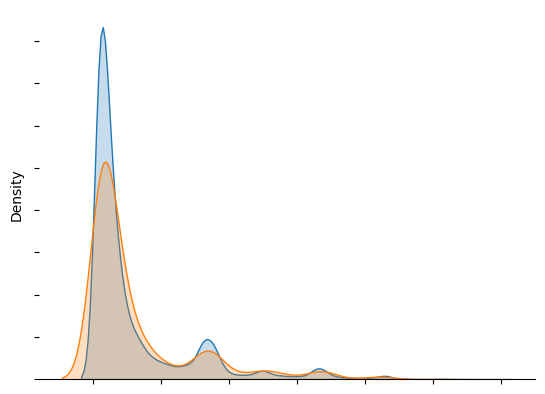

feature33
feature33 0.0027852227733811464


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


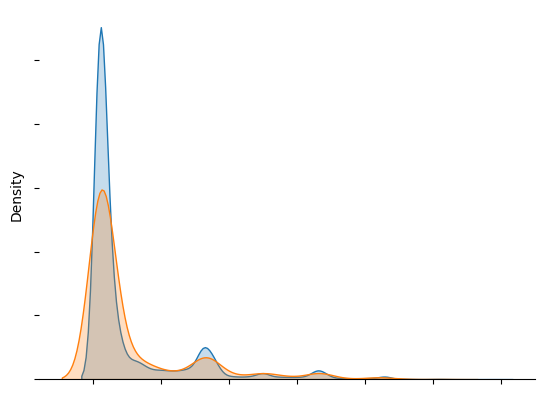

feature34
feature34 0.002517991822594834


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


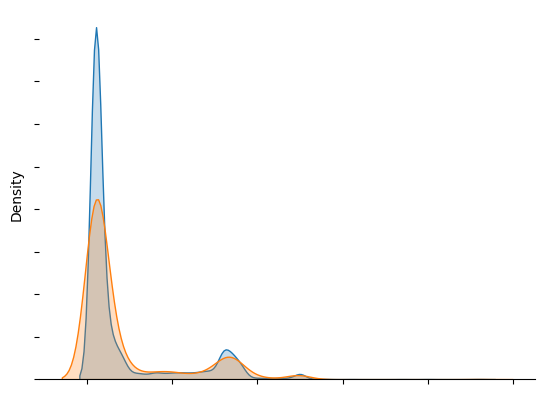

feature35
feature35 0.0037950902196287857


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


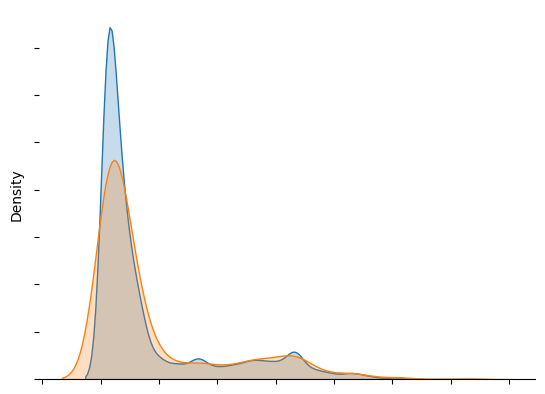

feature36
feature36 0.0005383839760333472


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


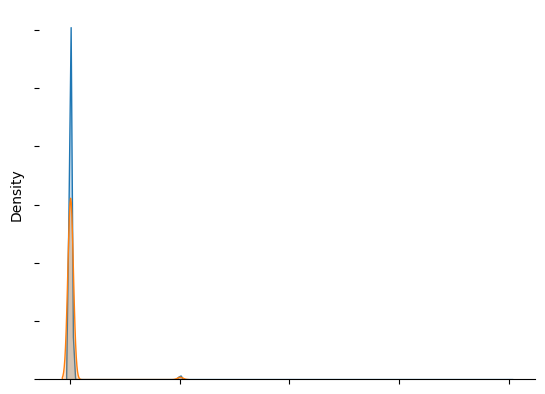

feature37
feature37 0.00043352316472668255


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


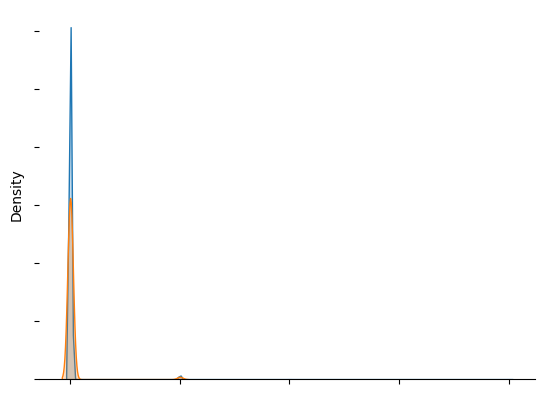

feature38
feature38 0.000705812167071968


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


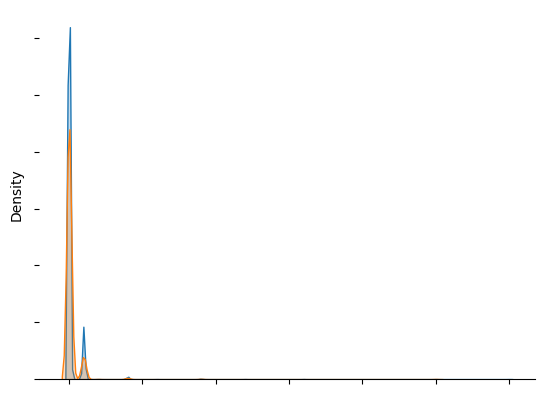

feature39
feature39 0.0020329628001040595


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


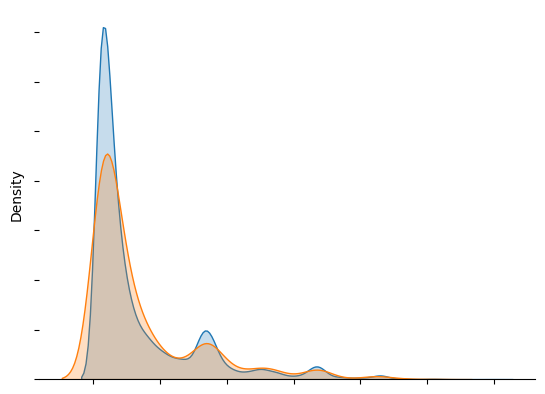

feature40
feature40 0.004761452156515955


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


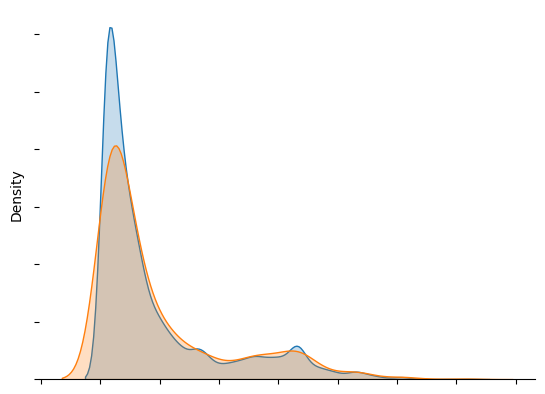

feature41
feature41 0.0009603799959662343


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


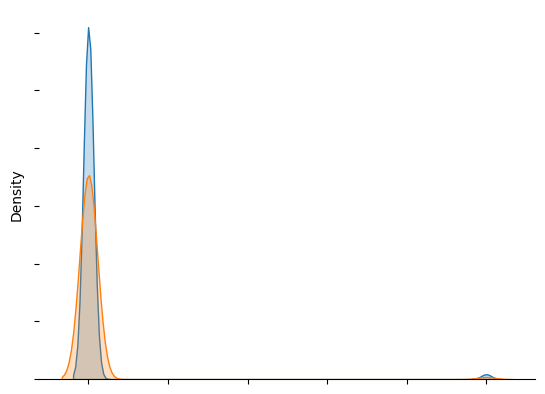

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


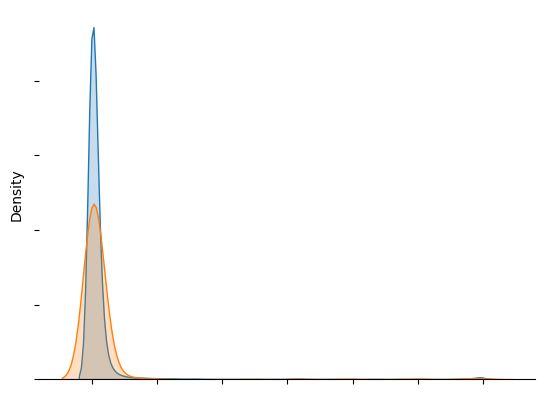

feature5
feature5 0.0005798593113597689


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


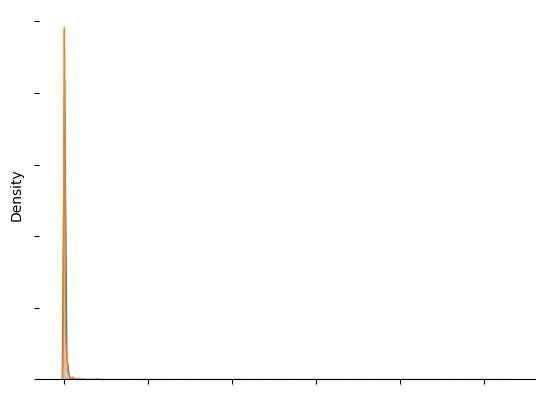

feature6
feature6 0.0006329056219331445


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


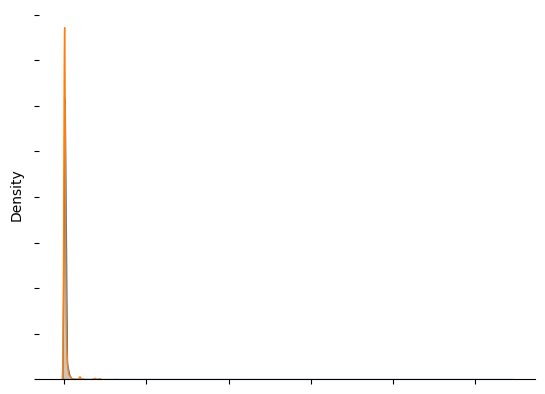

feature7
feature7 0.0022571451817102097


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


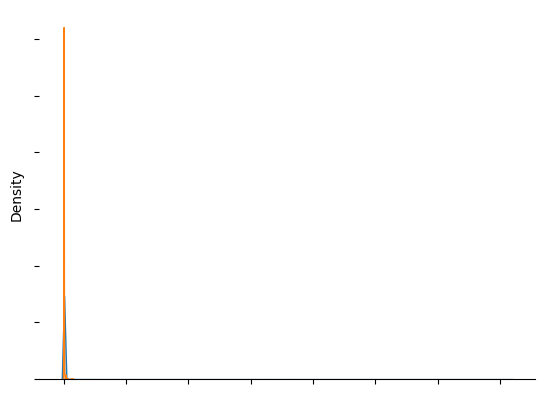

feature8
feature8 0.0011514585726016405


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


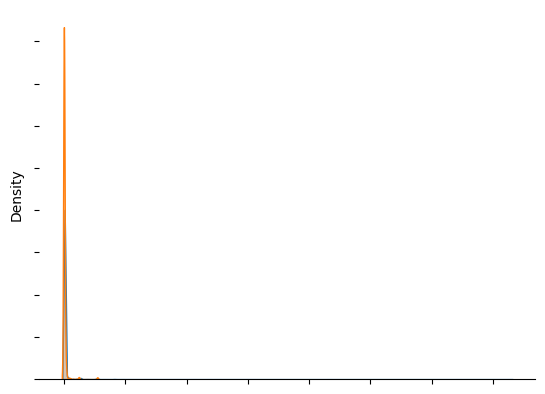

feature9
feature9 0.000606635438327633


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


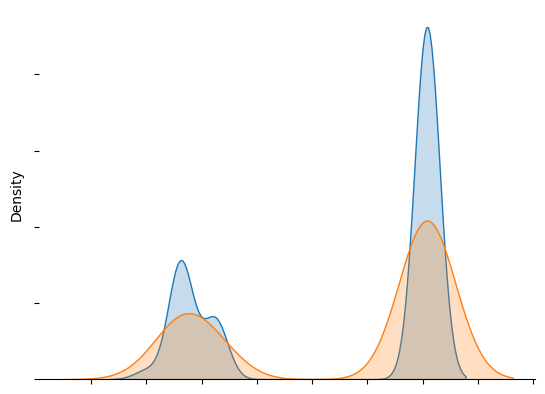

feature10
feature10 0.0014774370361225328


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


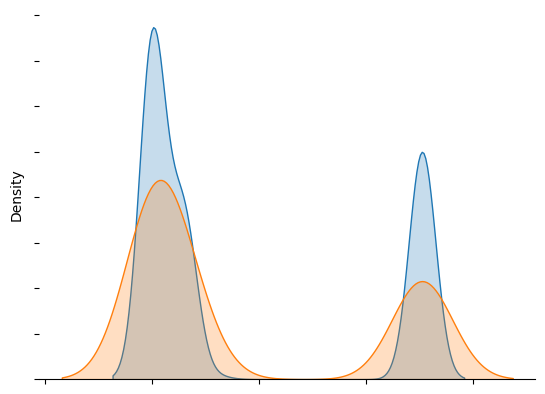

feature11
feature11 0.02331930414991017


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


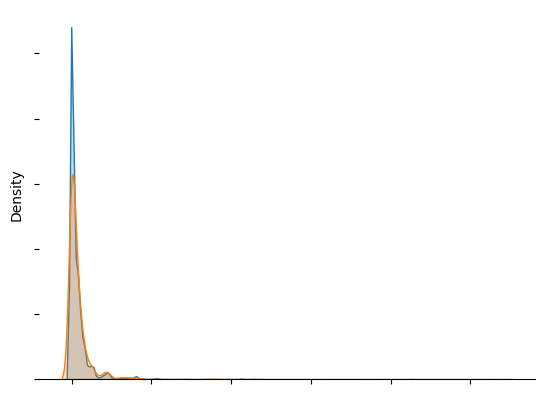

feature12
feature12 0.01510875640612362


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


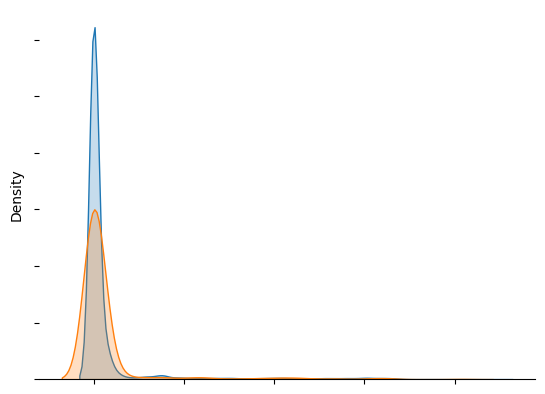

feature13
feature13 0.0005642046473190873


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


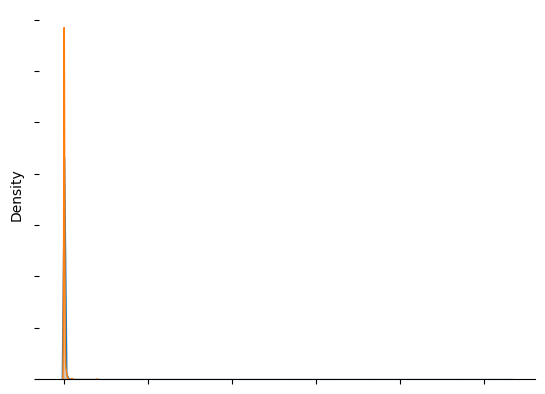

feature14
feature14 0.0011863668899709627


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


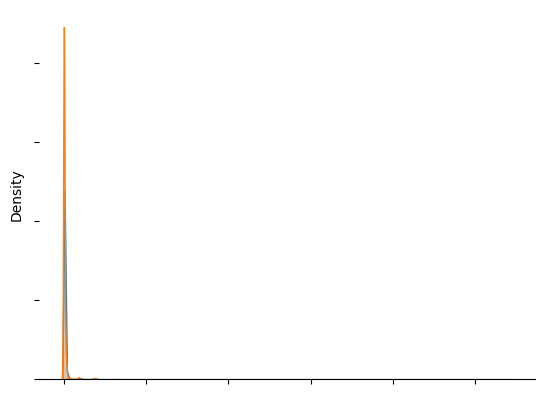

feature15
feature15 0.0023352070159581573


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


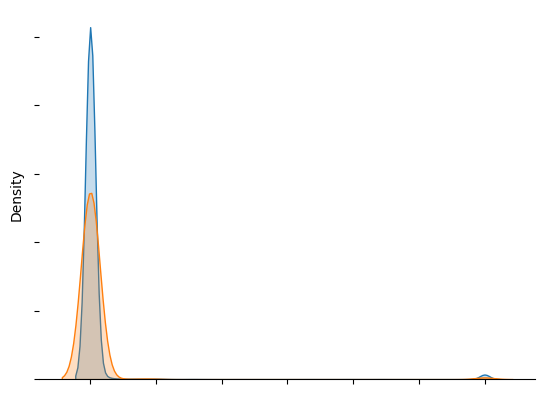

feature16
feature16 0.001709645481072824


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


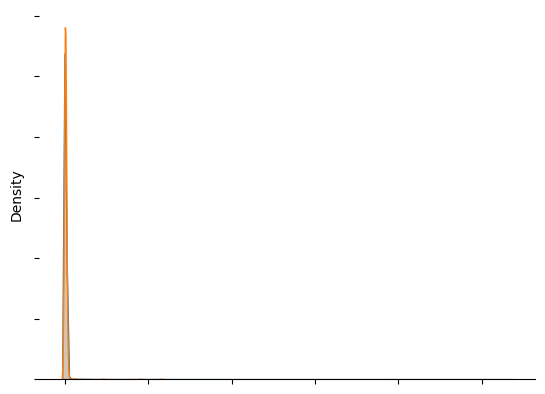

feature17
feature17 0.0063417366894555245


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


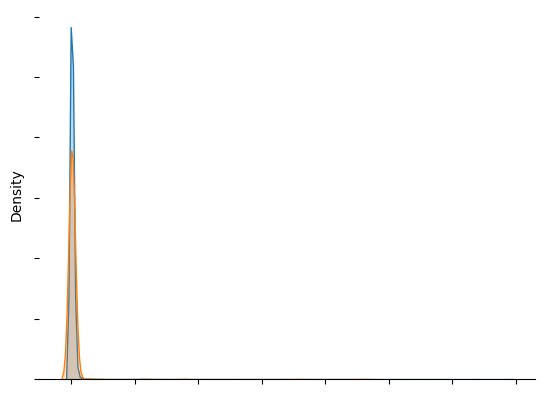

feature18
feature18 0.0026852882859952575


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


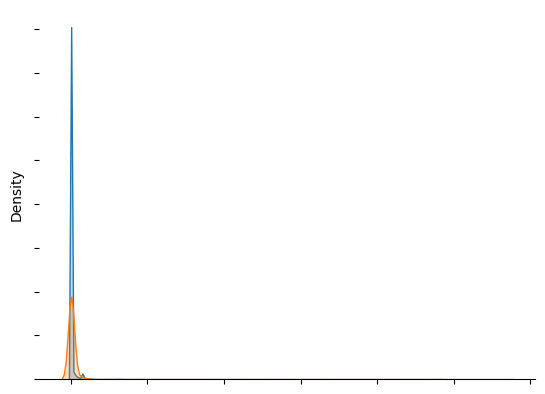

feature19
feature19 0.002357705365602817


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


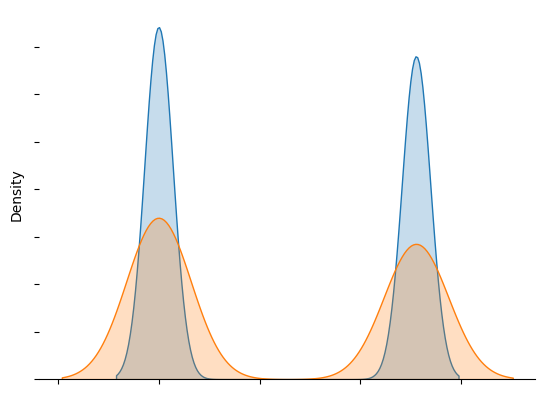

feature20
feature20 0.034505066402860524


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


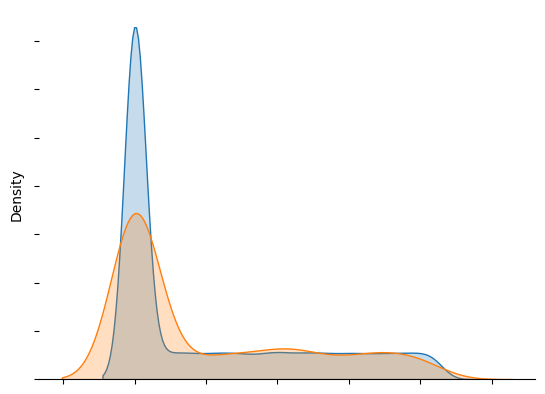

feature21
feature21 0.03831446358719946


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


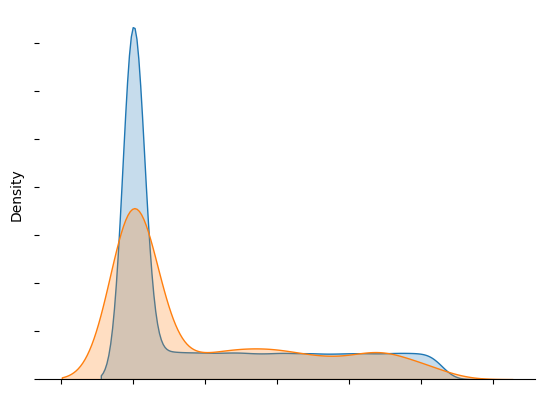

feature22
feature22 0.0011186555899297865


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


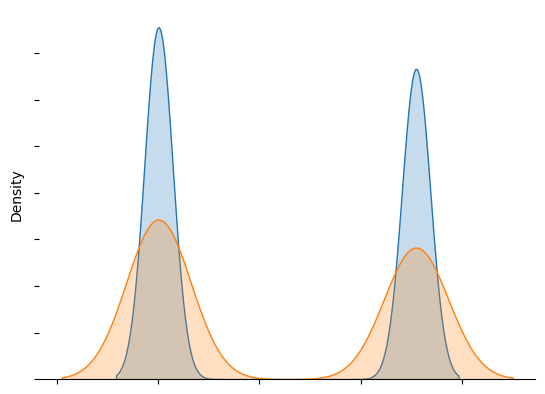

feature23
feature23 0.001560026258396586


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


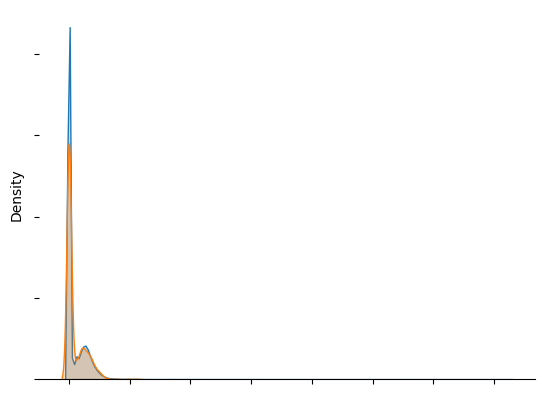

feature24
feature24 0.0024424298242294393


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


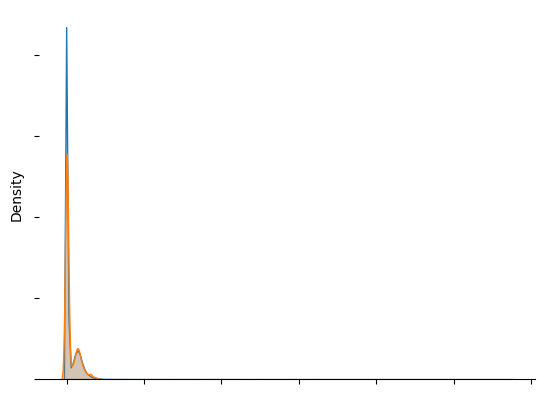

feature25
feature25 0.0007944667615611715


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


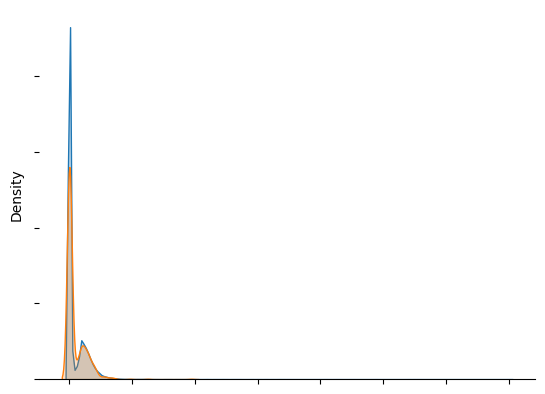

feature26
feature26 0.018139360302783417


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


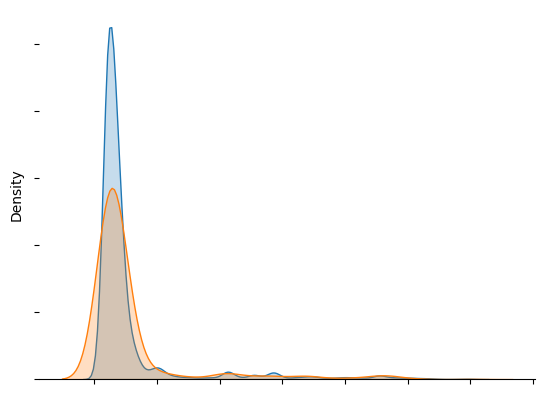

feature27
feature27 0.02555050375782193


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


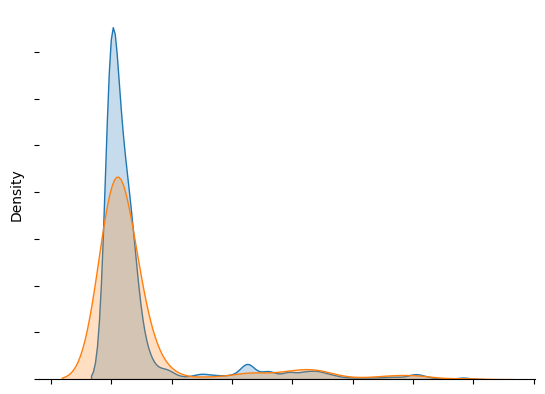

feature28
feature28 0.0015721768068642417


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


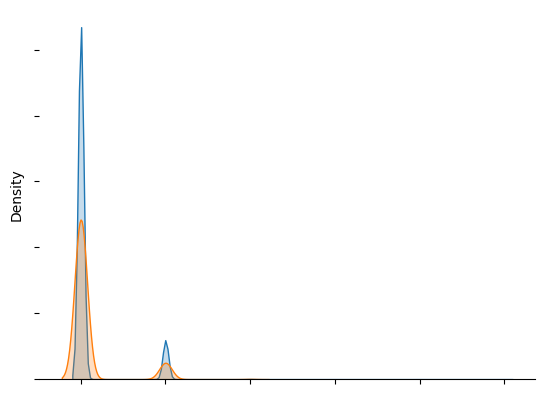

feature29
feature29 0.0006868563677454025


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


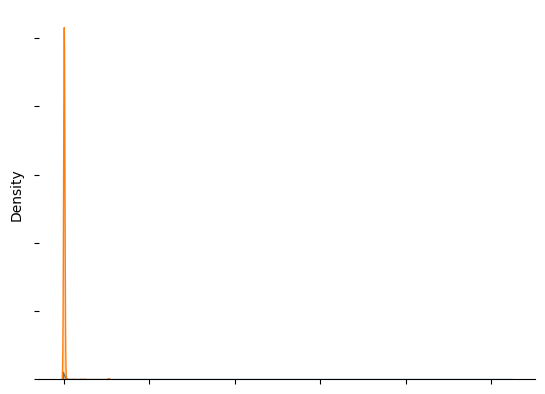

feature30
feature30 0.004802301576464649


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


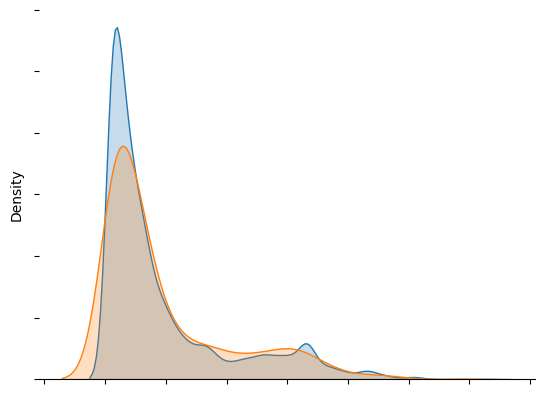

feature31
feature31 0.008580554738083931


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


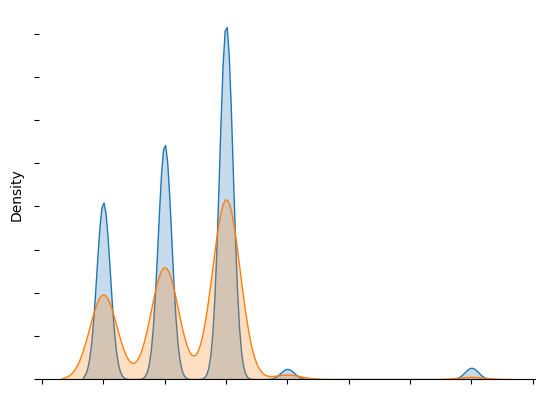

feature32
feature32 0.009554335440928489


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


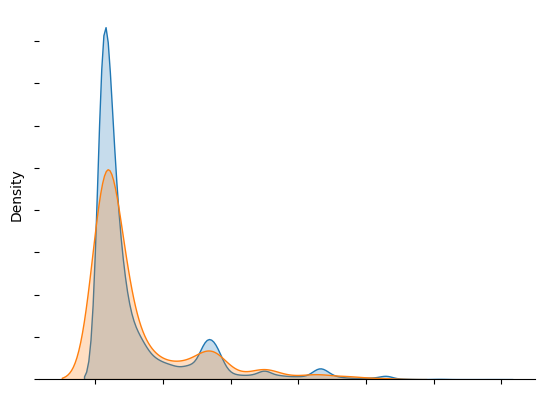

feature33
feature33 0.014867551999726555


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


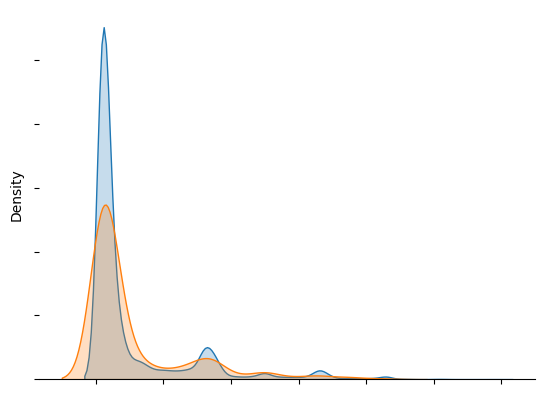

feature34
feature34 0.007109961841965414


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


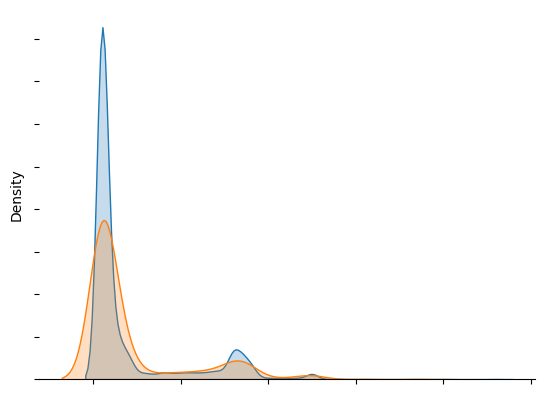

feature35
feature35 0.007354065072239506


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


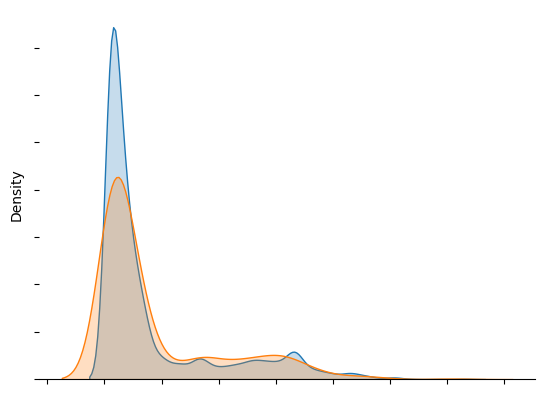

feature36
feature36 0.000246808267609414


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


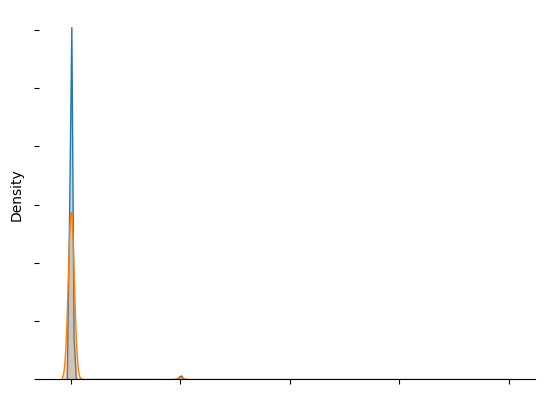

feature37
feature37 0.0001339306583380633


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


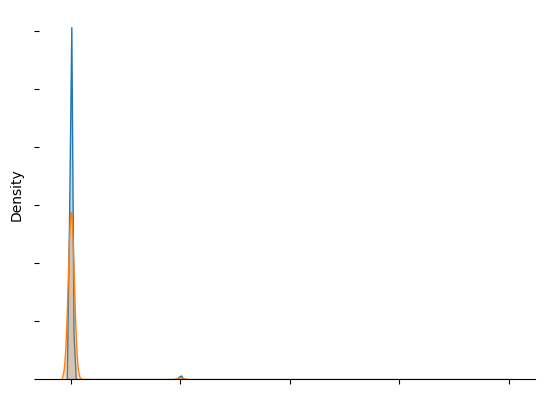

feature38
feature38 0.0021760146353375794


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


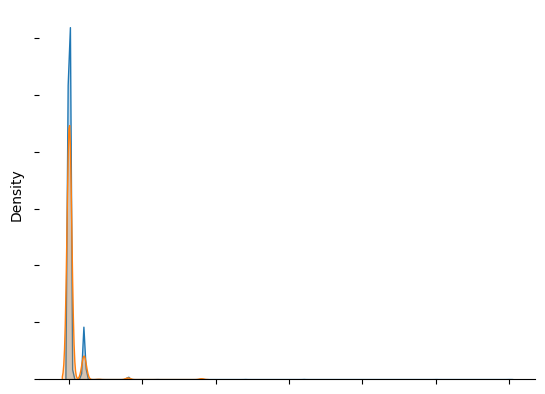

feature39
feature39 0.009101915952711006


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


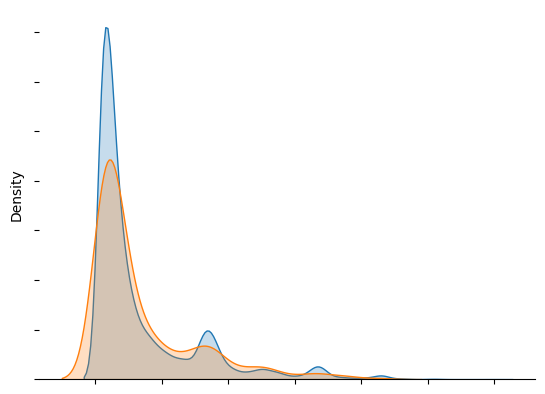

feature40
feature40 0.00415538414672804


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


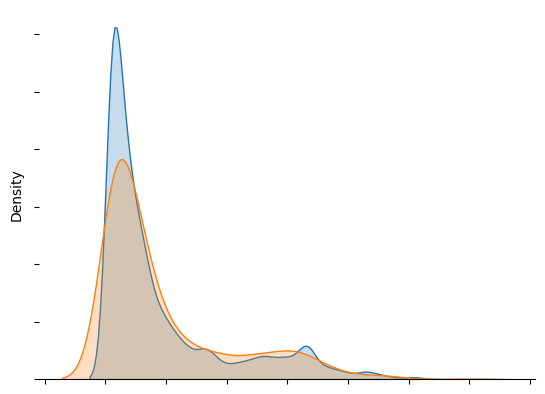

feature41
feature41 0.0006828250623678463


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


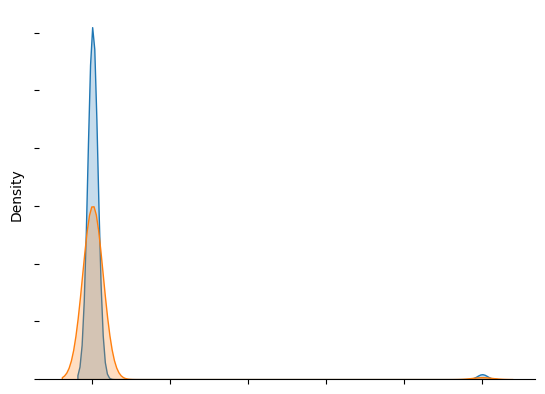

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


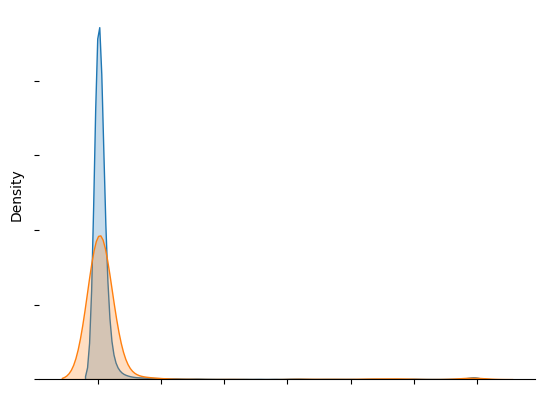

feature5
feature5 0.0026516656990044915


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


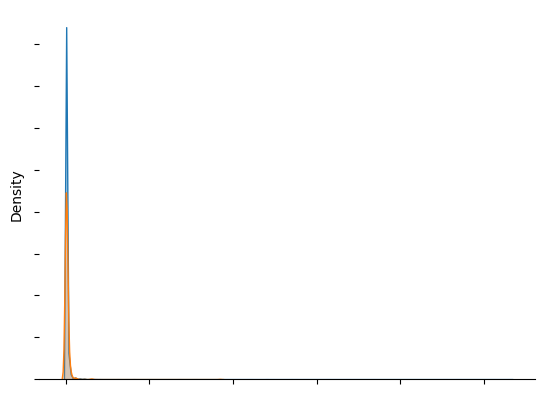

feature6
feature6 0.001216802159777435


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


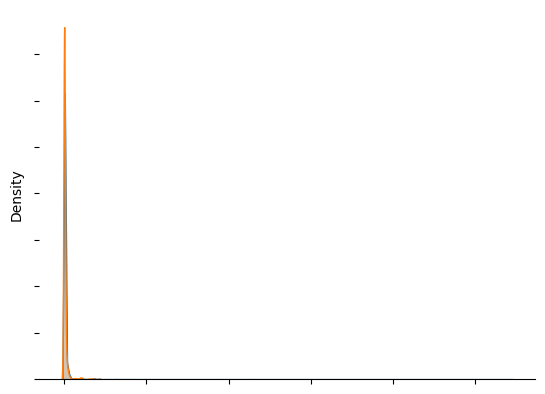

feature7
feature7 0.0043282719223366


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


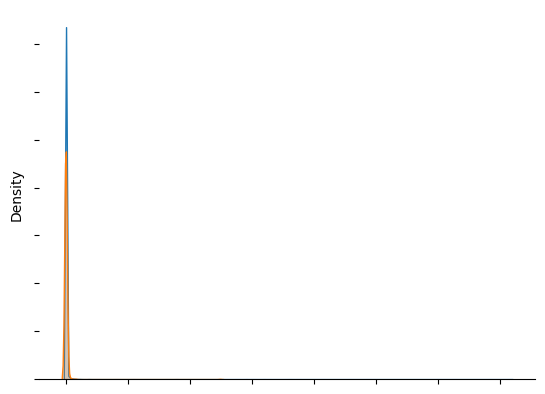

feature8
feature8 0.0019226370598505803


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


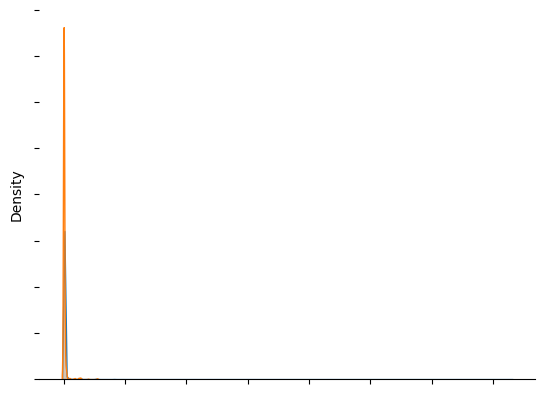

feature9
feature9 0.00027750125145039174


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


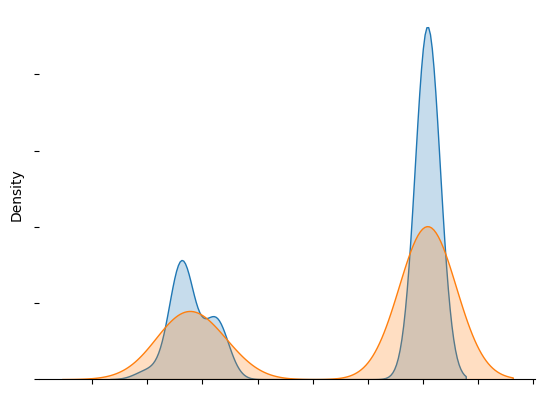

feature10
feature10 0.00249596882385417


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


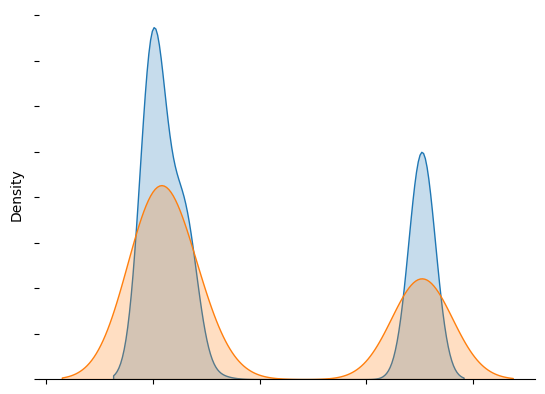

feature11
feature11 0.010512152338940482


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


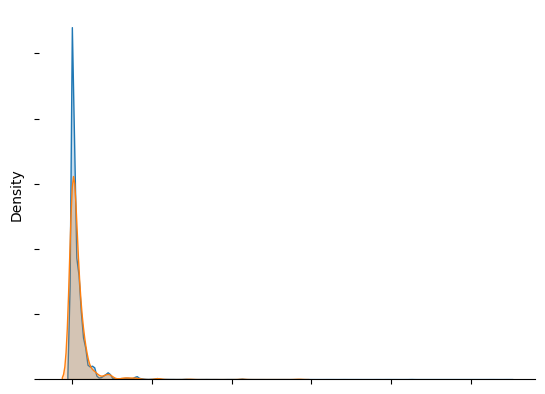

feature12
feature12 0.029769468629375673


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


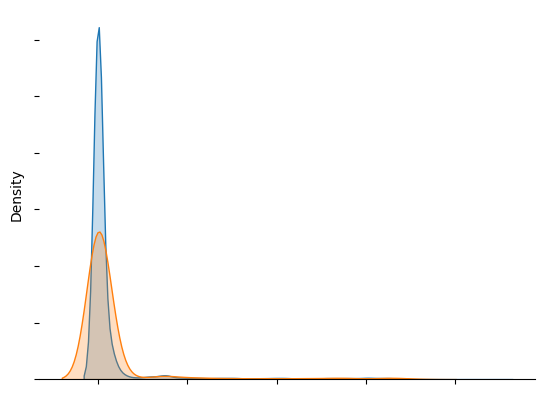

feature13
feature13 0.0031096139313809843


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


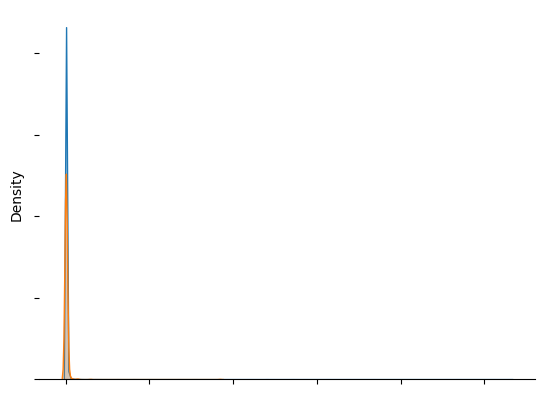

feature14
feature14 0.0011863668899709627


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


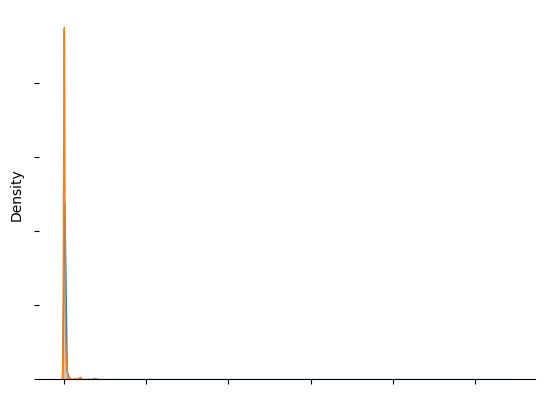

feature15
feature15 0.010448966152197696


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


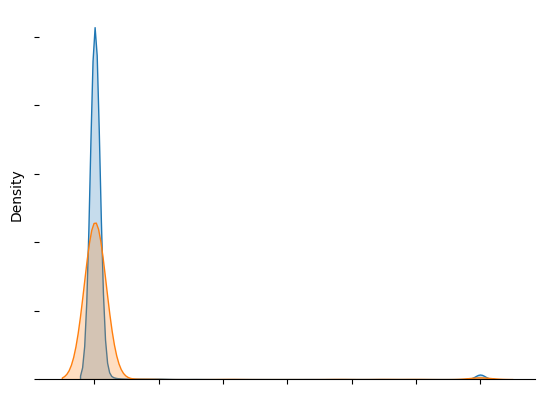

feature16
feature16 0.016067465794682694


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


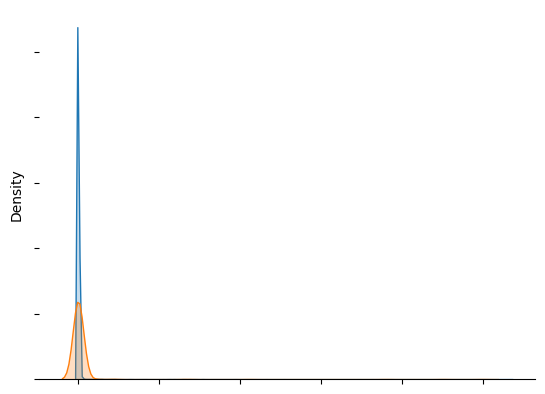

feature17
feature17 0.010364963130038707


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


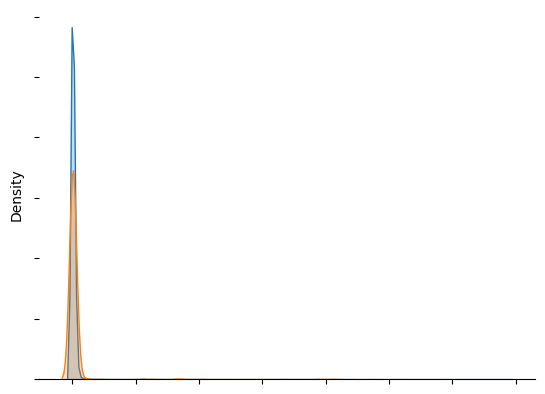

feature18
feature18 0.002978707958652576


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


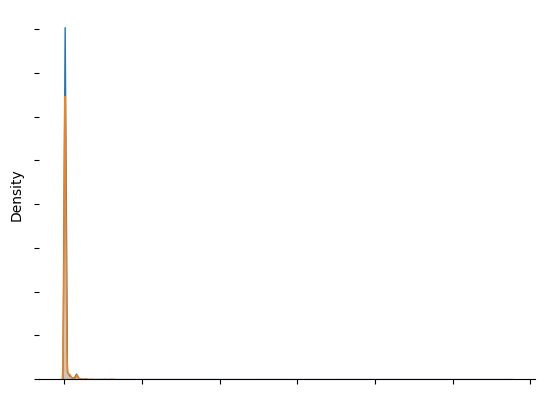

feature19
feature19 0.00038891146483386045


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


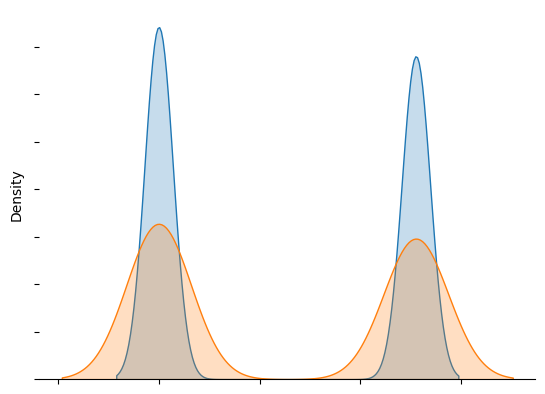

feature20
feature20 0.026097992907381674


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


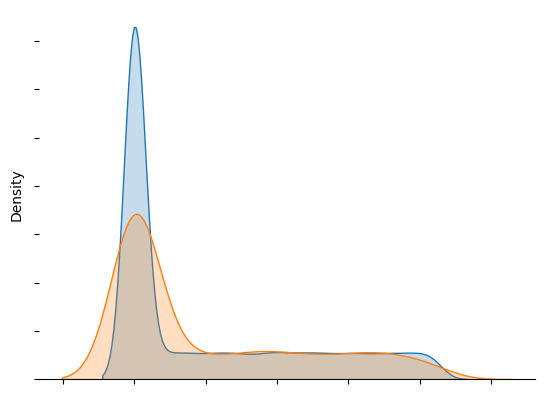

feature21
feature21 0.03633811580228725


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


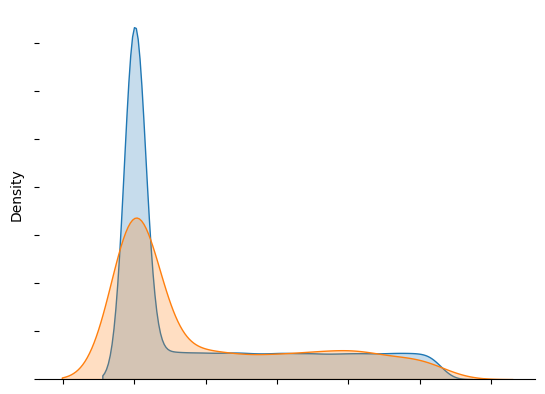

feature22
feature22 7.526418477187777e-05


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


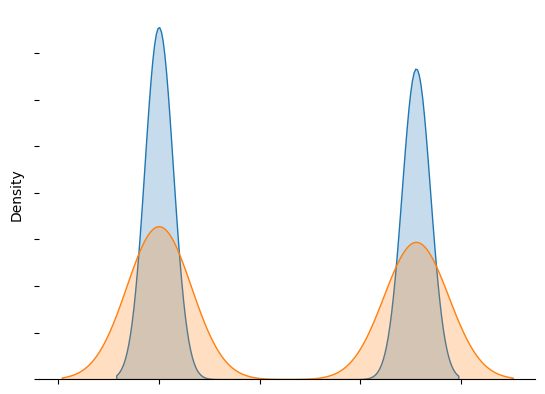

feature23
feature23 0.001560026258396586


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


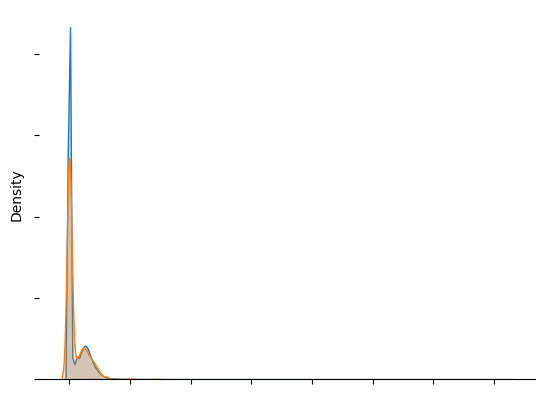

feature24
feature24 0.0005163315226993337


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


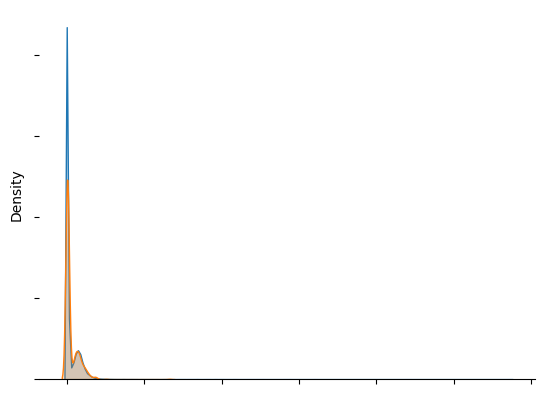

feature25
feature25 0.0011947150919842597


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


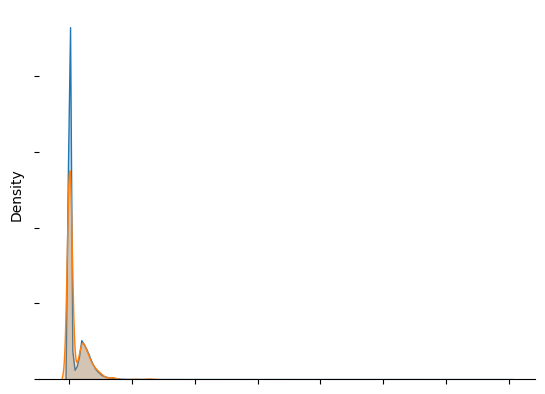

feature26
feature26 0.006679171894802981


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


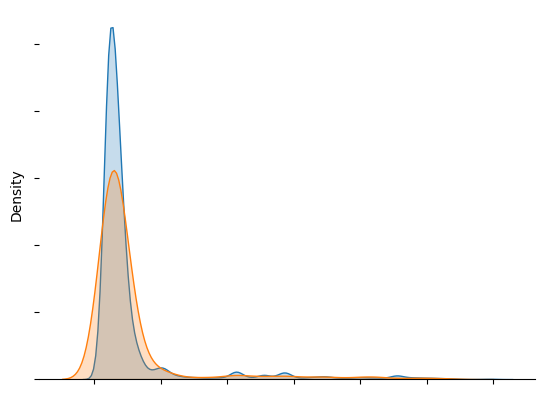

feature27
feature27 0.011650933985927175


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


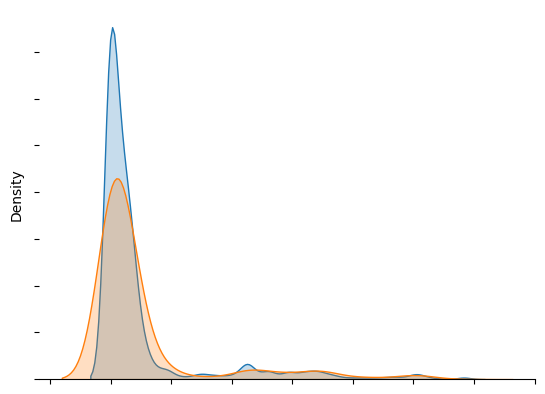

feature28
feature28 0.0006445879465938858


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


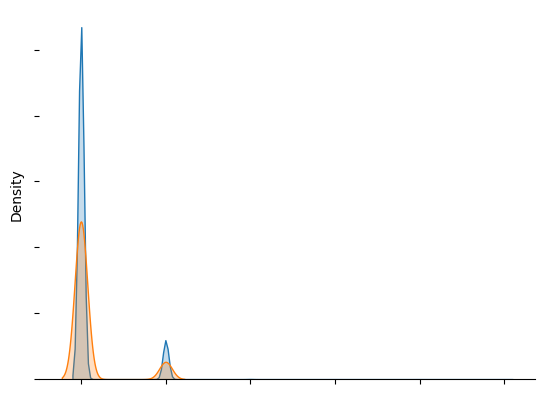

feature29
feature29 0.001154915494029155


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


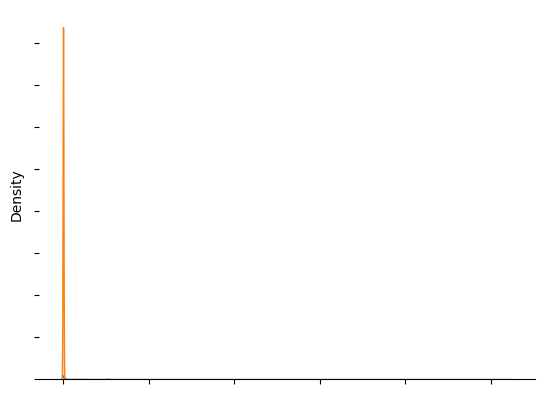

feature30
feature30 0.004090630815290495


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


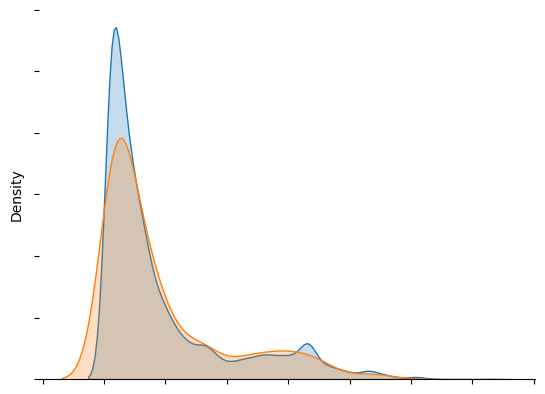

feature31
feature31 0.006548310146060975


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


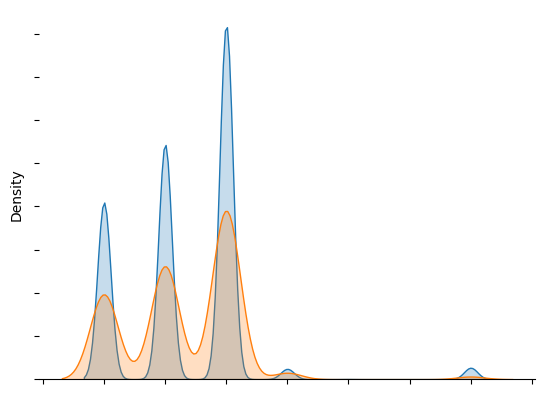

feature32
feature32 0.007695672547717732


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


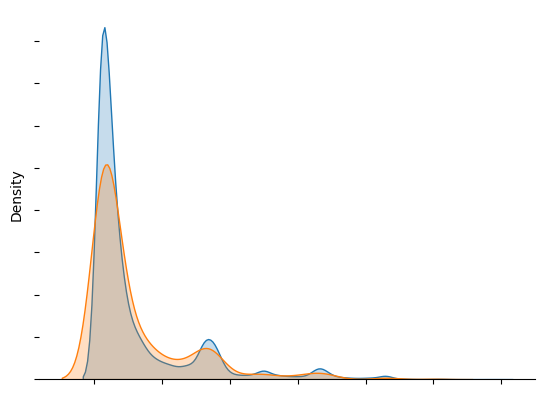

feature33
feature33 0.008092113357148413


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


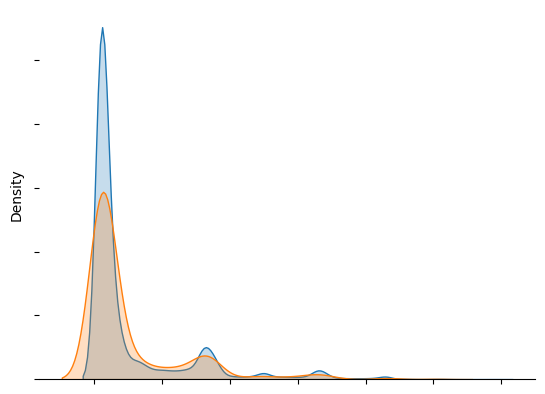

feature34
feature34 0.00333580611131534


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


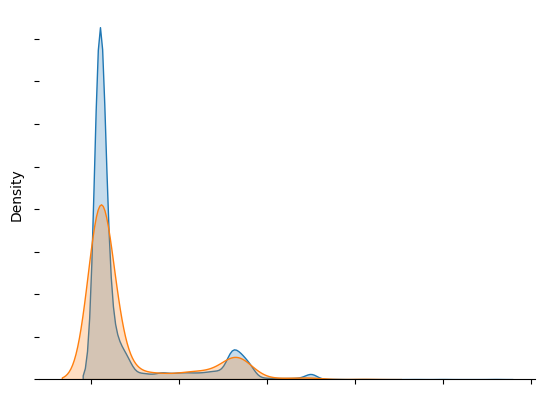

feature35
feature35 0.005561198752566966


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


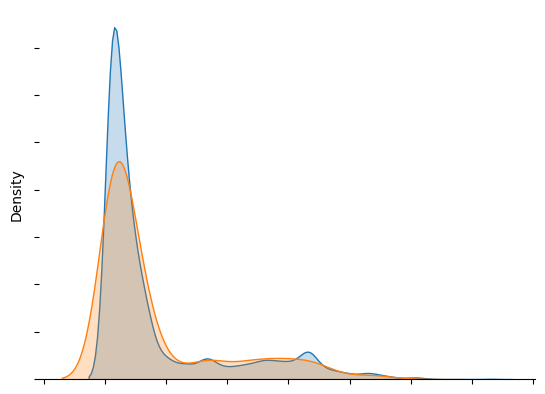

feature36
feature36 0.006422008308672346


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


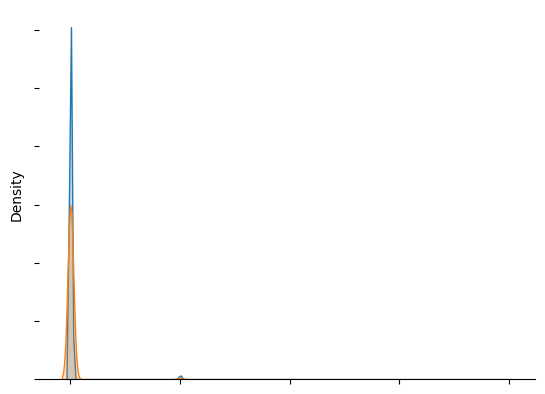

feature37
feature37 0.005214454784575931


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


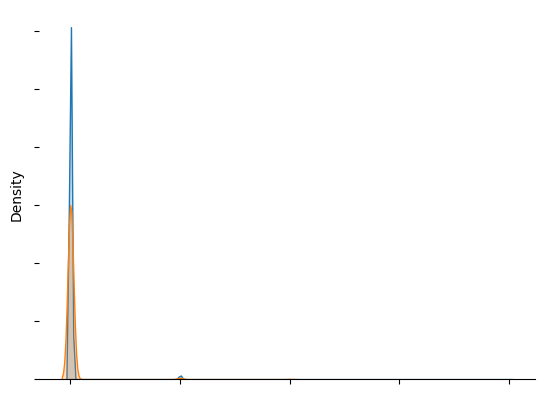

feature38
feature38 0.003997822889005783


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


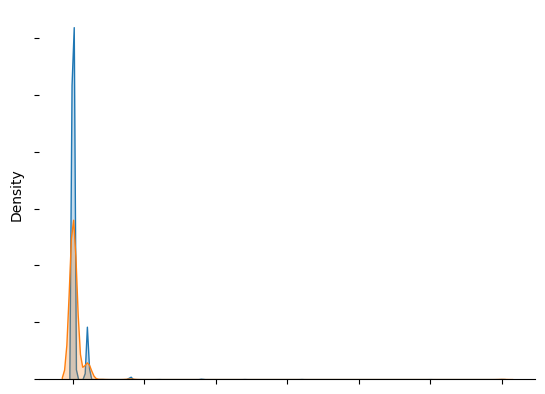

feature39
feature39 0.006821547809283865


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


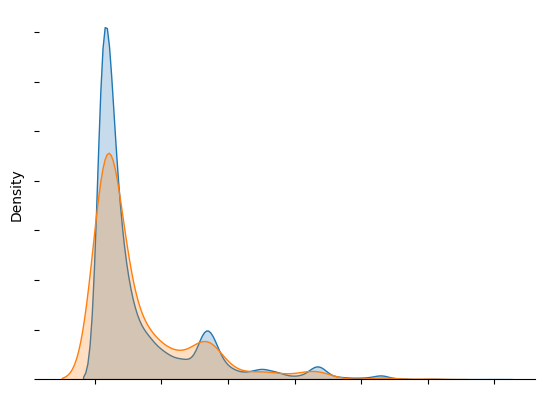

feature40
feature40 0.002947017904119123


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


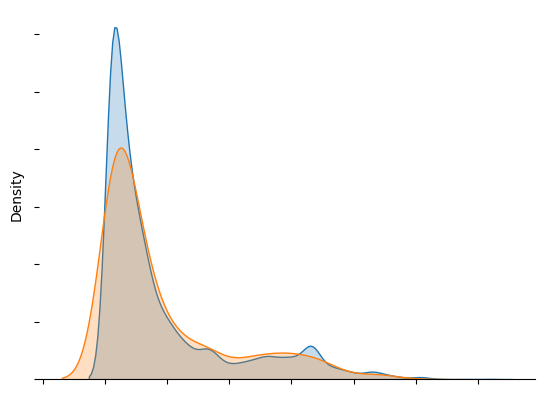

feature41
feature41 5.979943195468739e-05


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


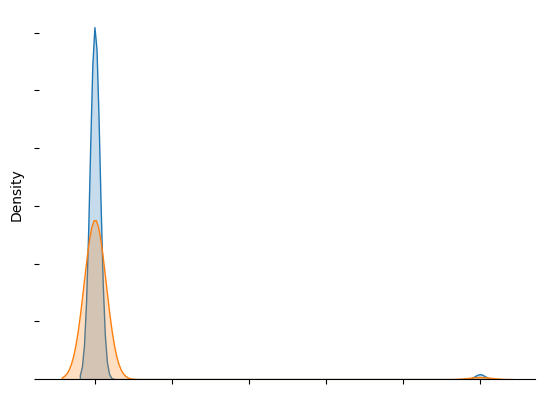

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


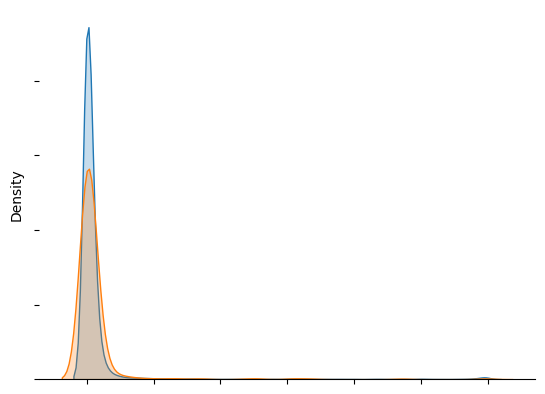

feature5
feature5 0.003991052048350413


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


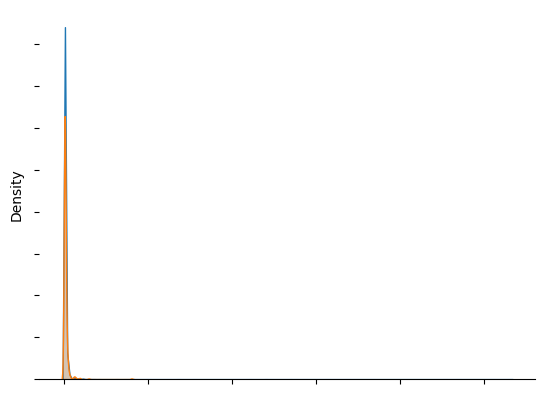

feature6
feature6 0.005965122909471142


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


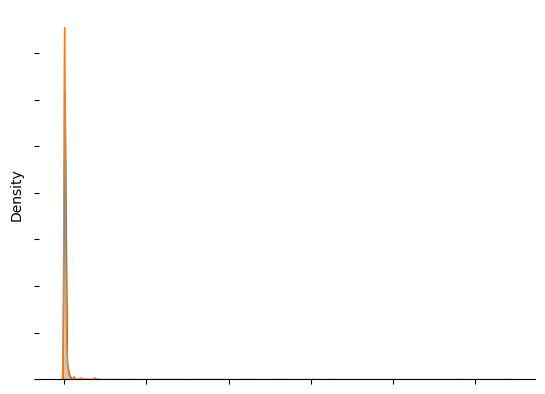

feature7
feature7 0.009788251641549143


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


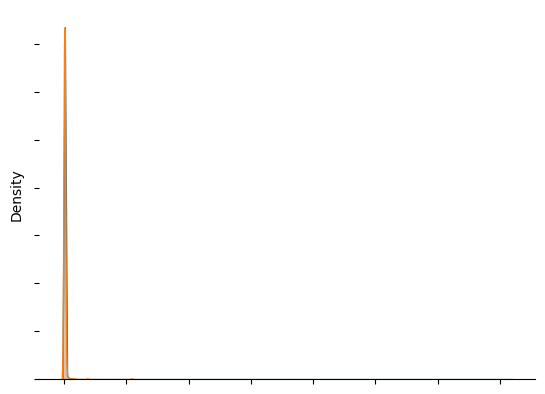

feature8
feature8 0.0020344064122328784


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


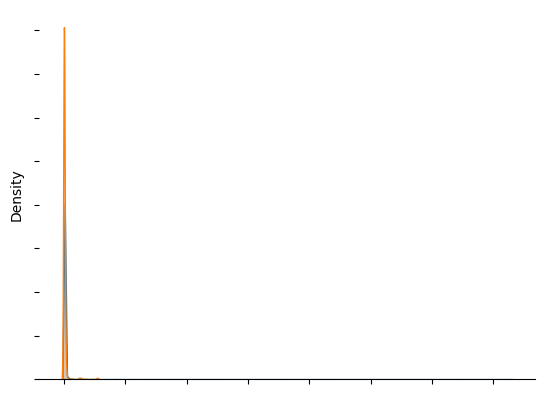

feature9
feature9 0.0077209671790948444


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


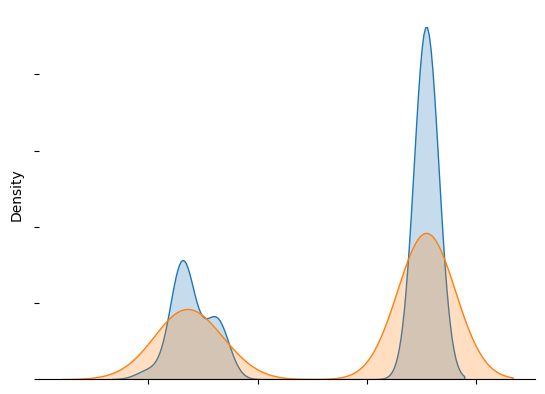

feature10
feature10 0.006049869383281958


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


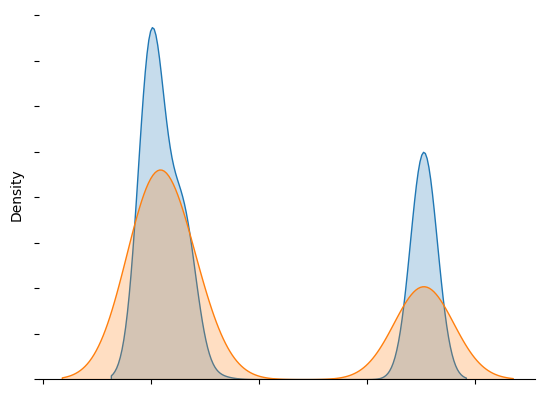

feature11
feature11 0.010572347469181214


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


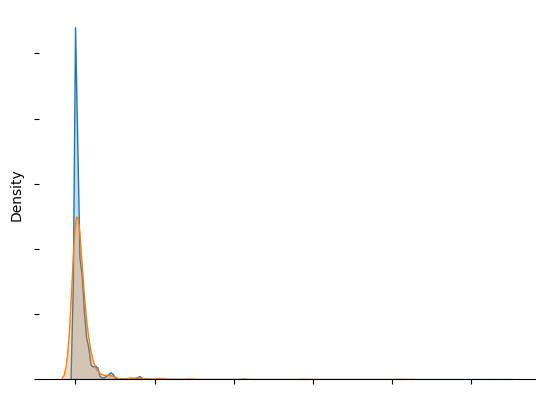

feature12
feature12 0.030726748834944407


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


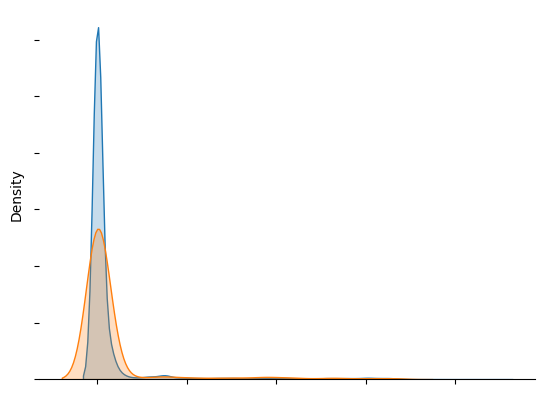

feature13
feature13 0.004515563347891395


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


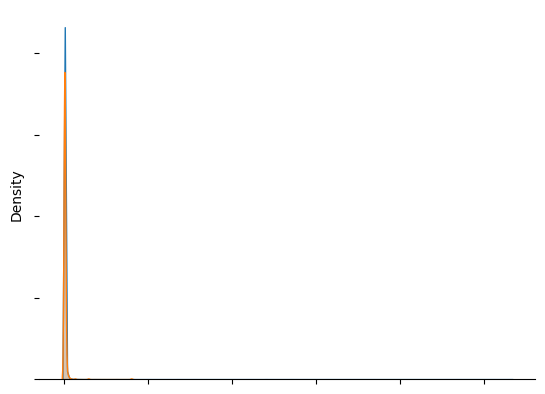

feature14
feature14 0.0011863668899709627


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


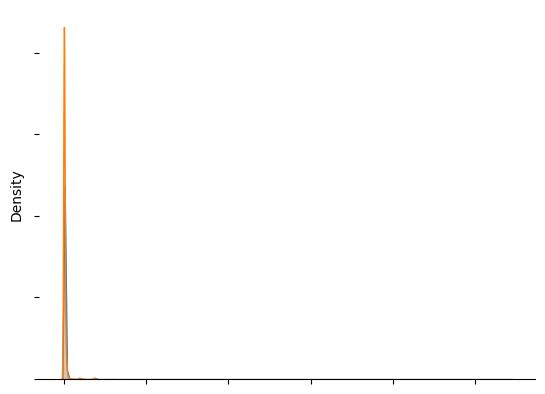

feature15
feature15 0.016712143752484112


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


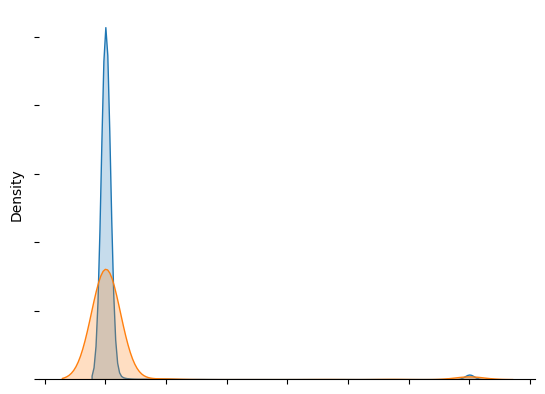

feature16
feature16 0.016854281061383928


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


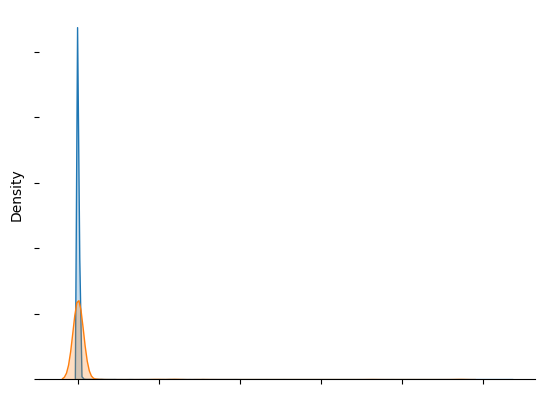

feature17
feature17 0.01579146068243352


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


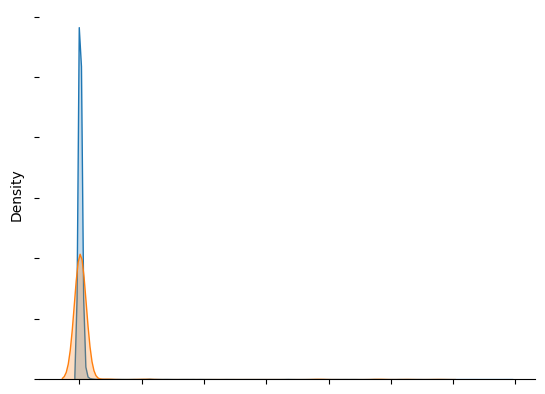

feature18
feature18 0.0029907119930291564


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


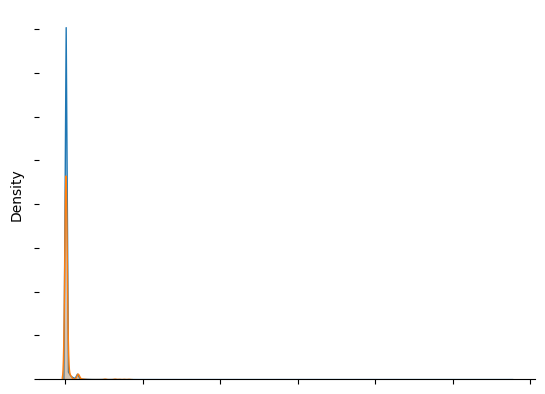

feature19
feature19 0.0008636134243482088


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


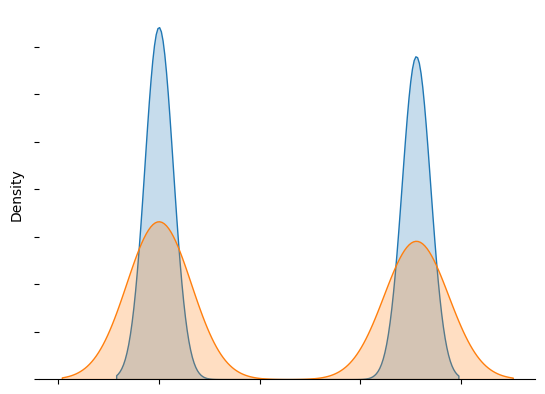

feature20
feature20 0.03789290082756566


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


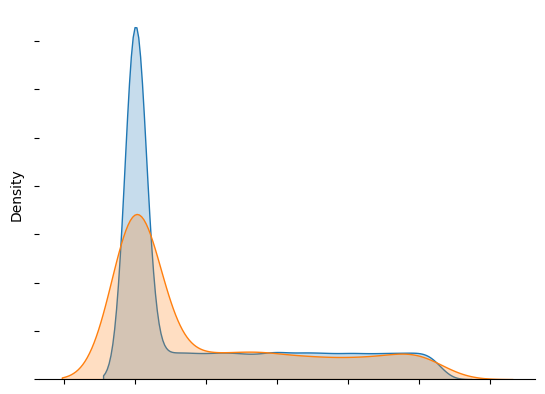

feature21
feature21 0.038811909648001686


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


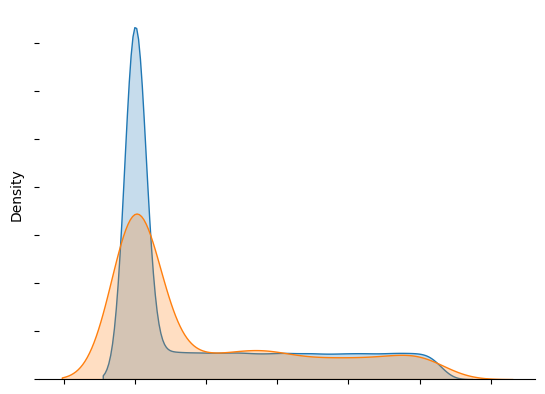

feature22
feature22 0.0003759877552749298


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


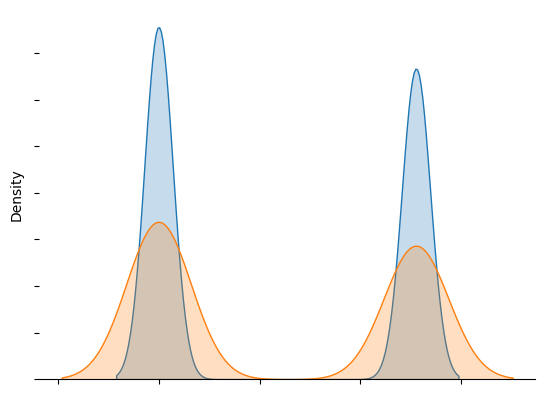

feature23
feature23 0.009772468430856602


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


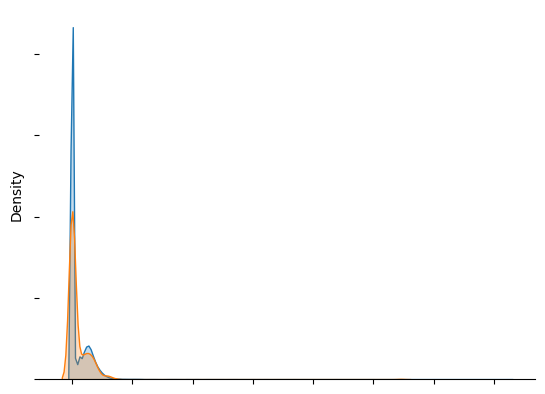

feature24
feature24 0.00634568468897043


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


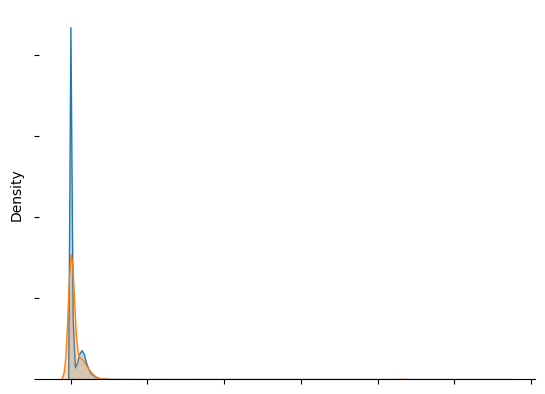

feature25
feature25 0.006341226281190069


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


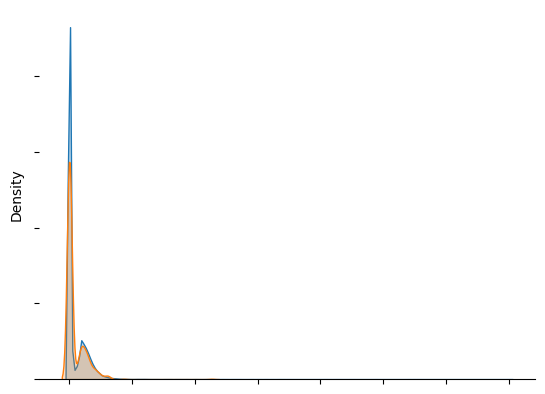

feature26
feature26 0.012764124709544312


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


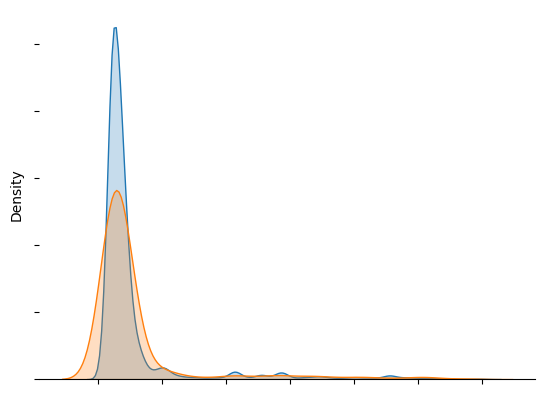

feature27
feature27 0.019310138276036514


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


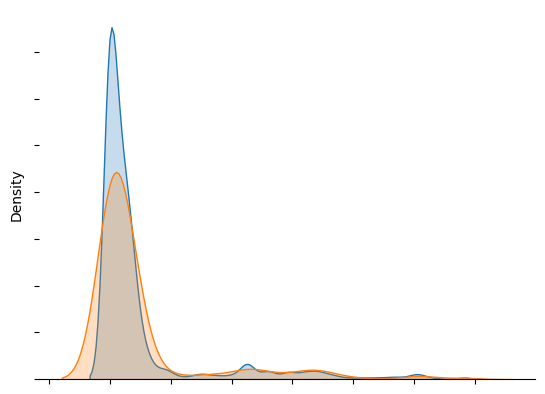

feature28
feature28 0.006097098962186629


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


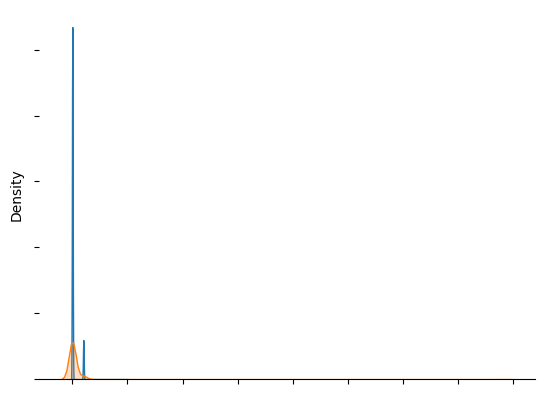

feature29
feature29 0.0017330469320256023


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


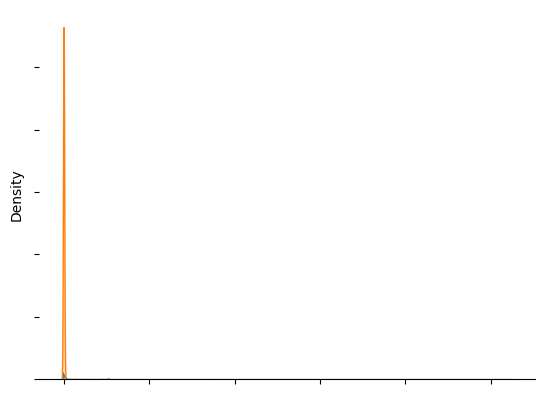

feature30
feature30 0.008156444903421734


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


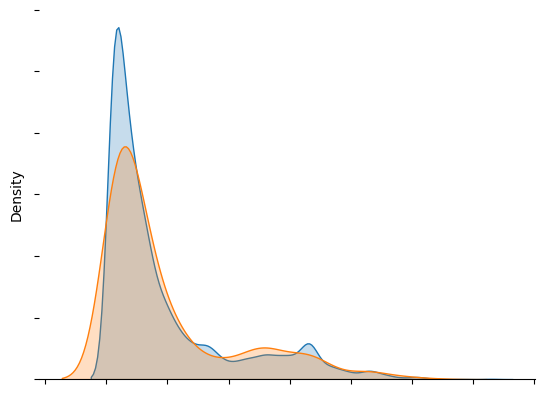

feature31
feature31 0.008396760353813868


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


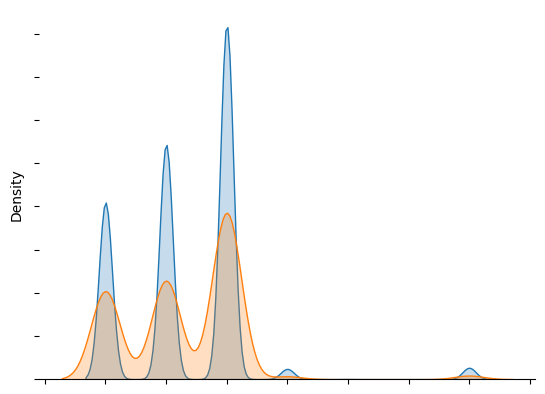

feature32
feature32 0.01742547635361633


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


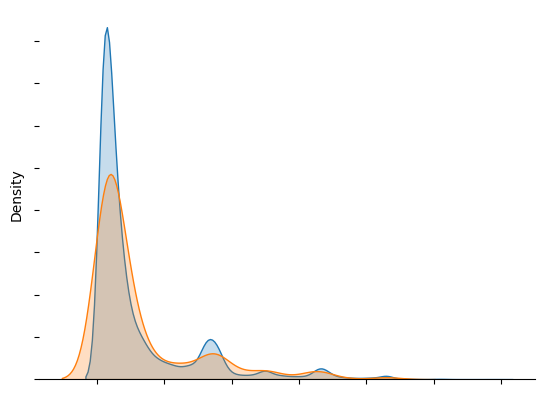

feature33
feature33 0.013404743547018497


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


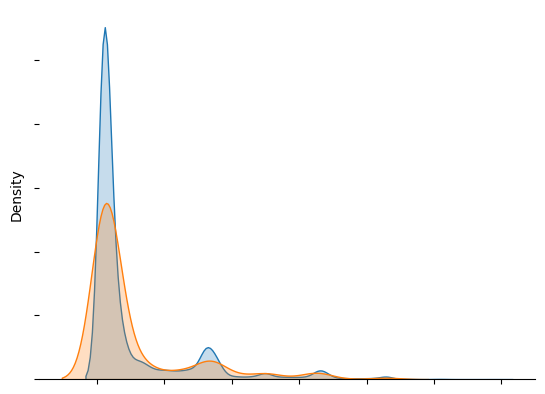

feature34
feature34 0.002638469924846316


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


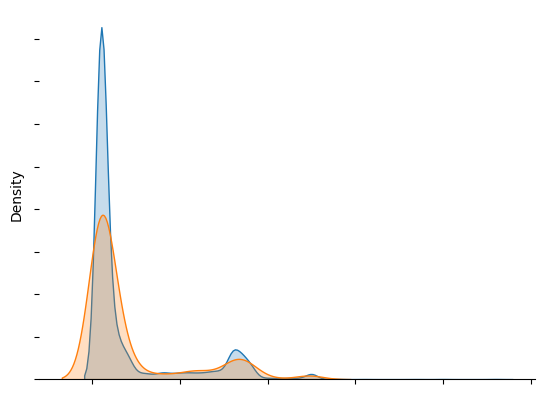

feature35
feature35 0.011517833271790961


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


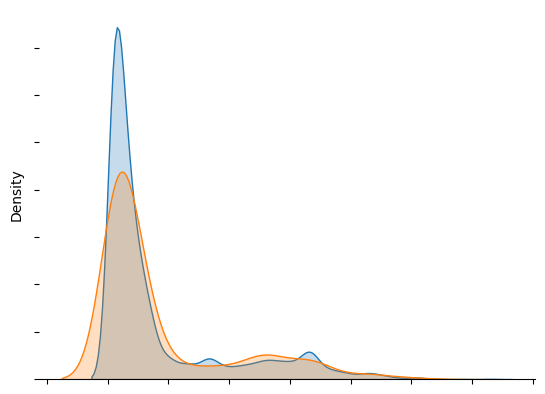

feature36
feature36 0.000246808267609414


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


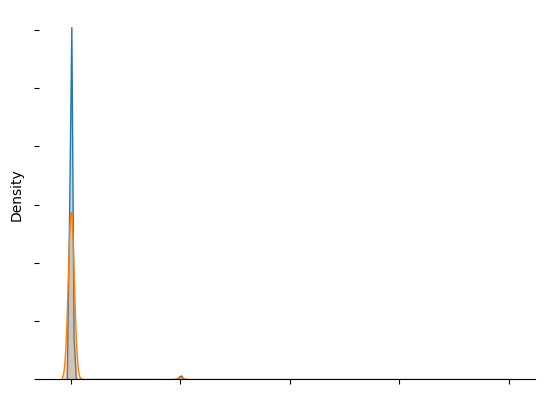

feature37
feature37 0.0001339306583380633


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


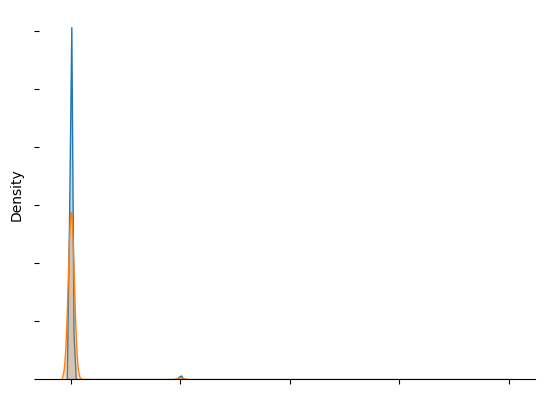

feature38
feature38 0.0007408297249532032


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


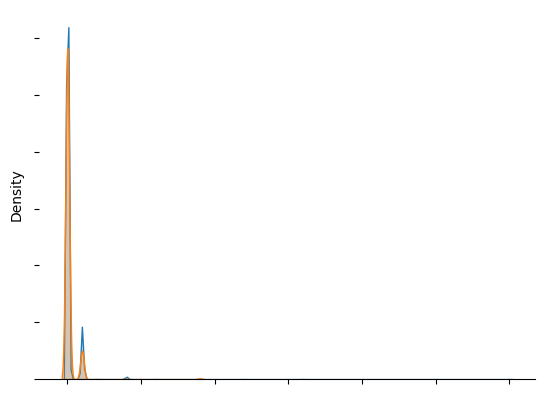

feature39
feature39 0.01164532959323919


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


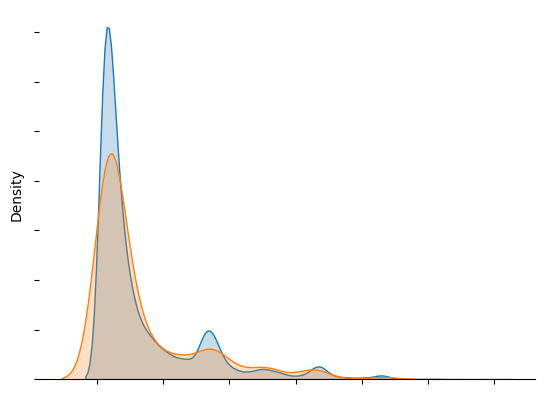

feature40
feature40 0.009672126863173355


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


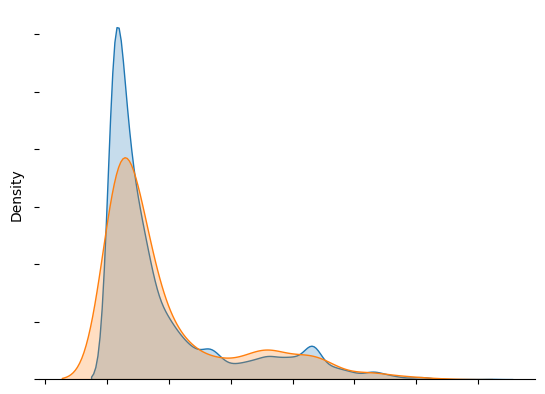

feature41
feature41 0.0056325937325152325


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


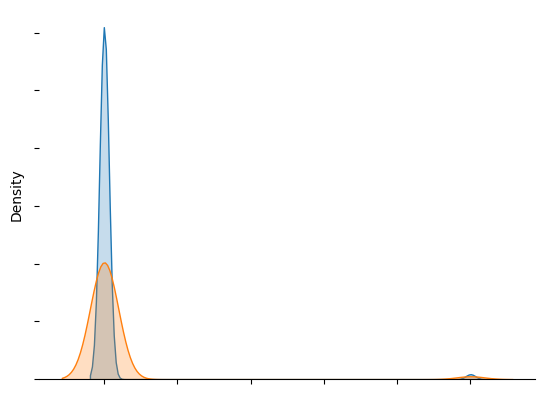

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


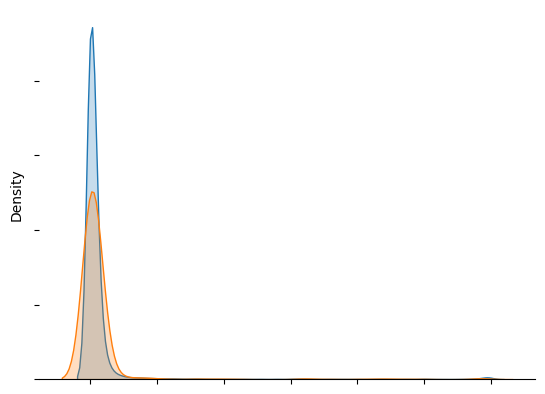

feature5
feature5 0.0005798593113597689


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


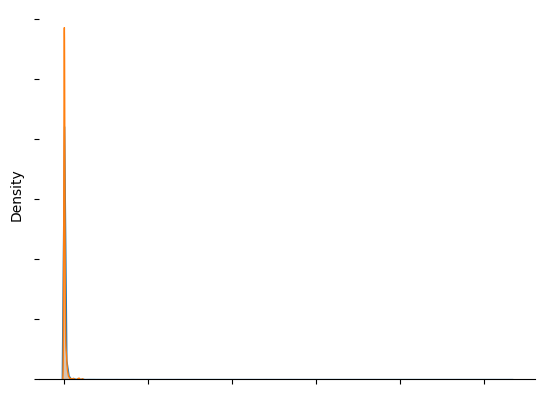

feature6
feature6 0.0006329056219331445


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


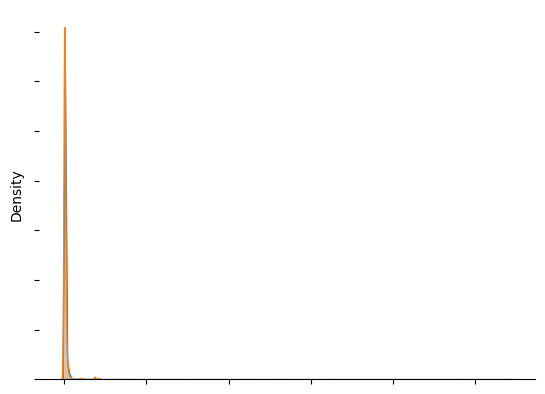

feature7
feature7 0.0022571451817102097


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


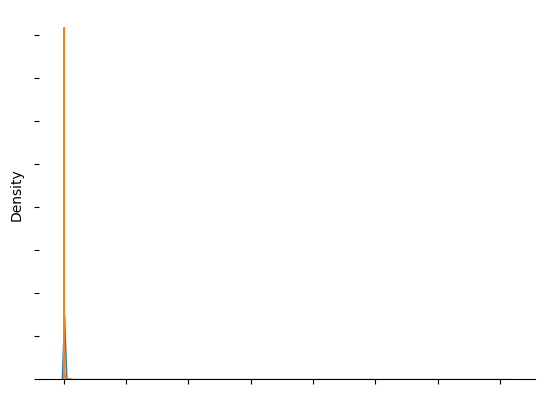

feature8
feature8 0.002869841051412911


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


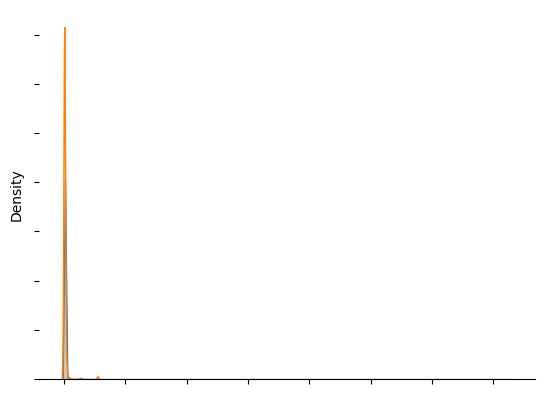

feature9
feature9 0.0007338008041979332


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


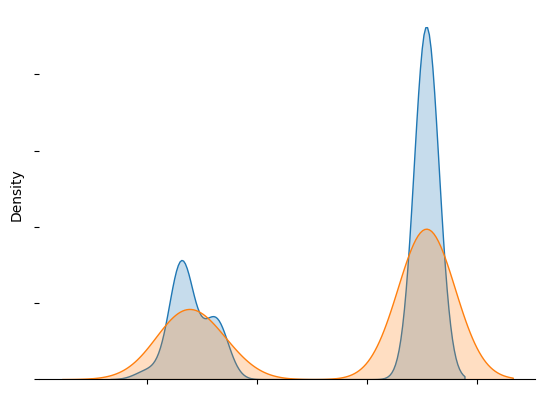

feature10
feature10 0.00011515419008120874


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


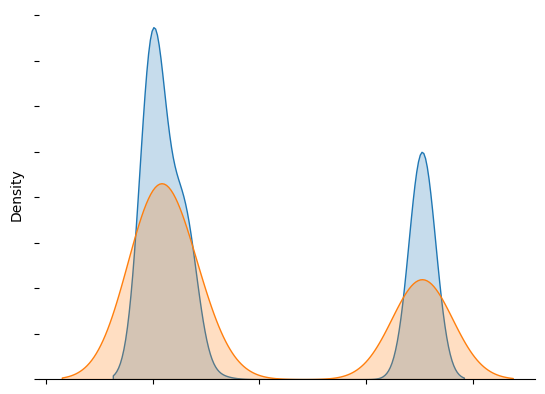

feature11
feature11 0.010999233882119189


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


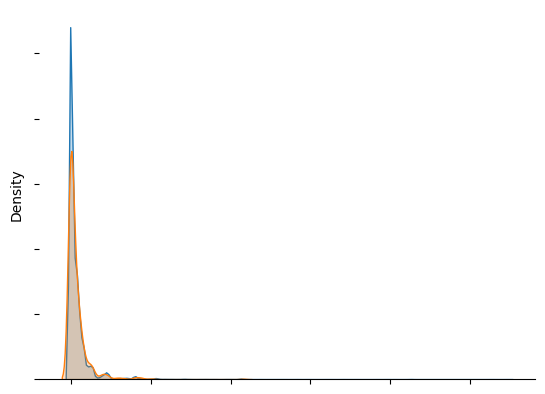

feature12
feature12 0.015645856594678046


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


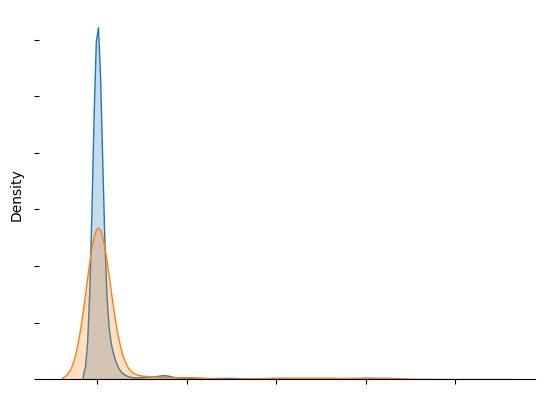

feature13
feature13 0.0005642046473190873


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


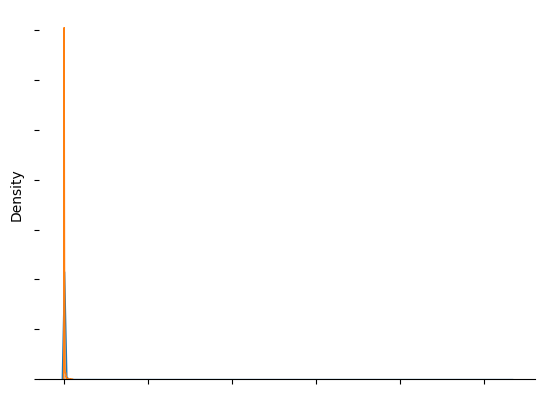

feature14
feature14 0.0011863668899709627


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


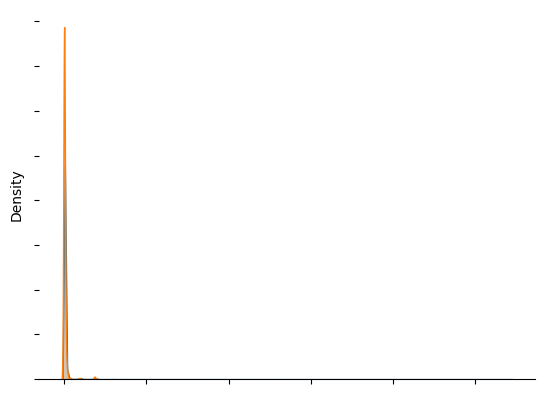

feature15
feature15 0.004255295073286658


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


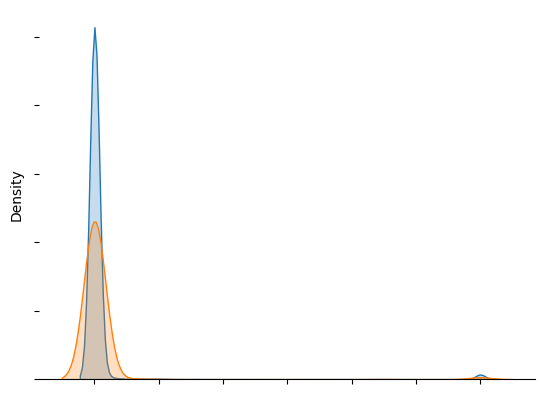

feature16
feature16 0.00915835552780528


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


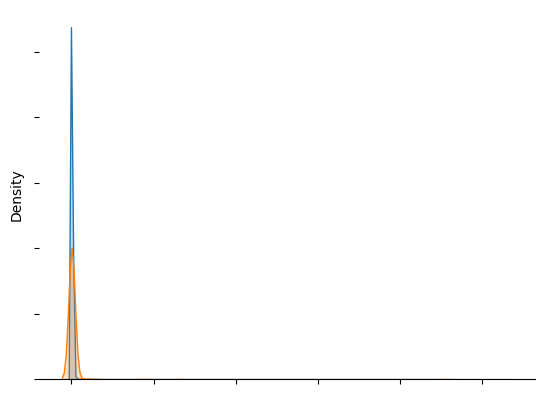

feature17
feature17 0.009534613114503128


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


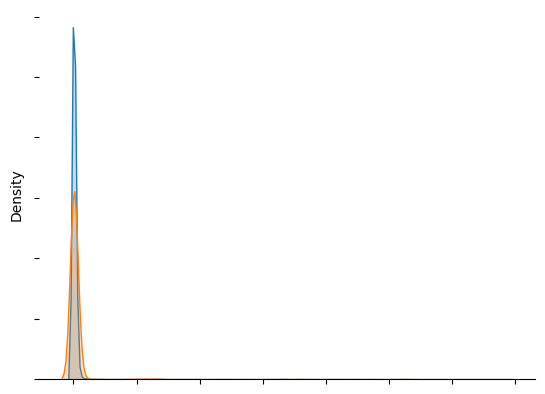

feature18
feature18 0.0015327469764589482


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


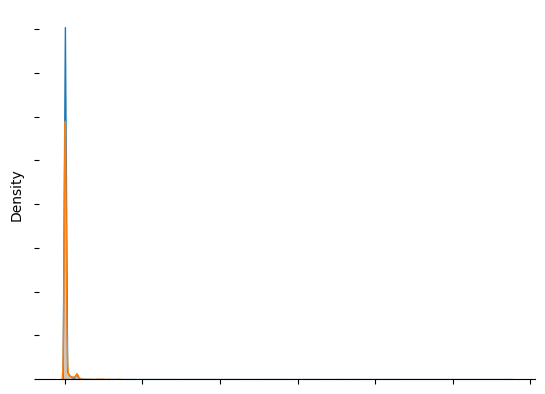

feature19
feature19 0.00079311058537641


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


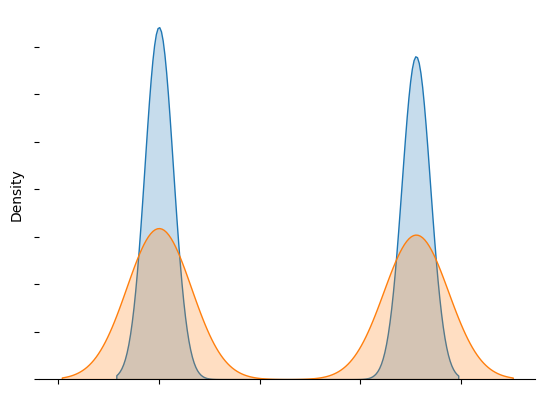

feature20
feature20 0.033835017808614504


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


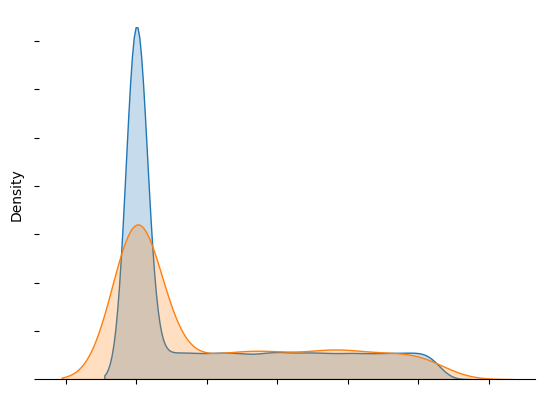

feature21
feature21 0.026388186577470975


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


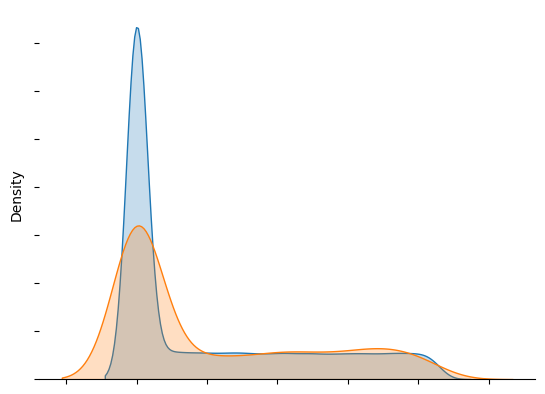

feature22
feature22 0.0006097255845795659


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


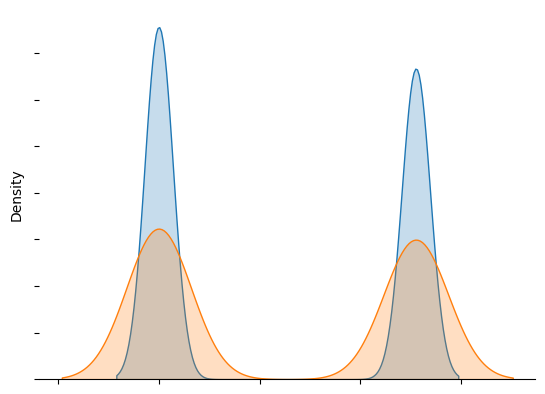

feature23
feature23 0.004801786383570084


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


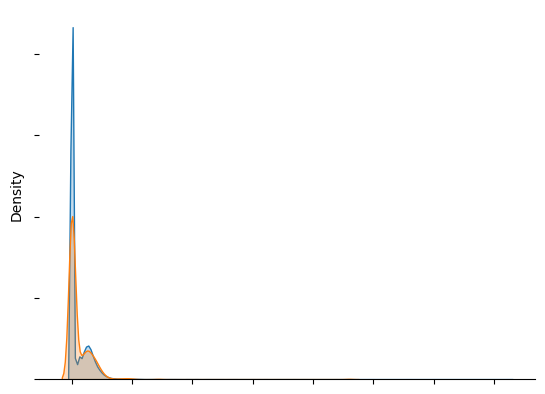

feature24
feature24 0.002824158003572247


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


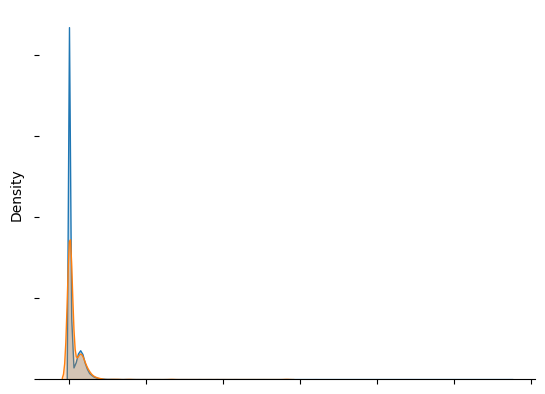

feature25
feature25 0.0050384196613701086


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


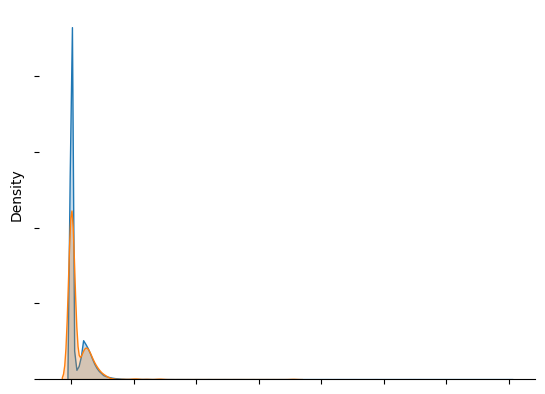

feature26
feature26 0.010455833174833609


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


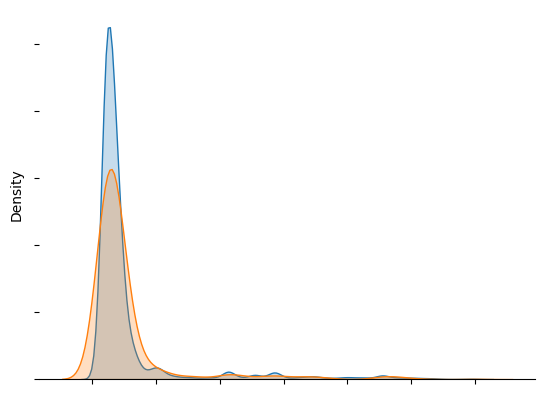

feature27
feature27 0.003948206416936188


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


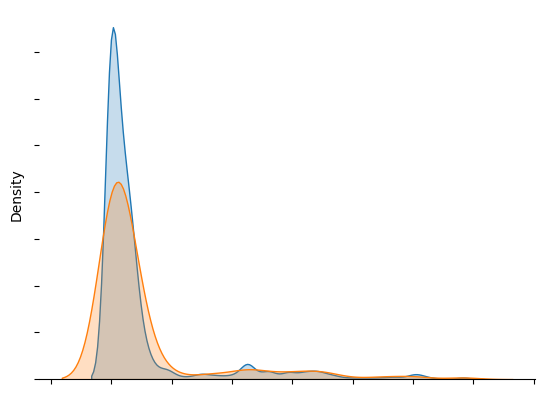

feature28
feature28 0.0011949584422657137


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


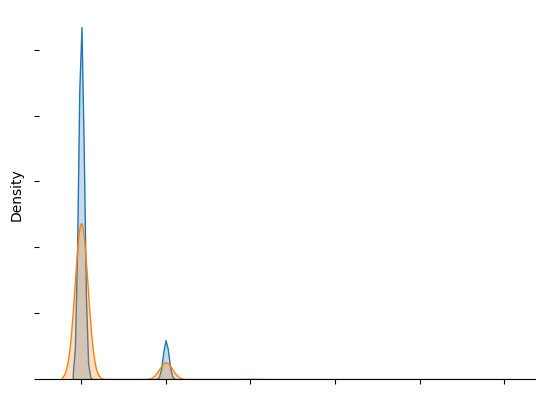

feature29
feature29 0.0029084593505747758


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


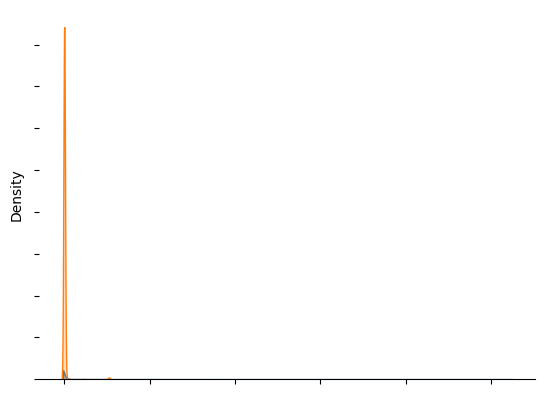

feature30
feature30 0.004966307218814696


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


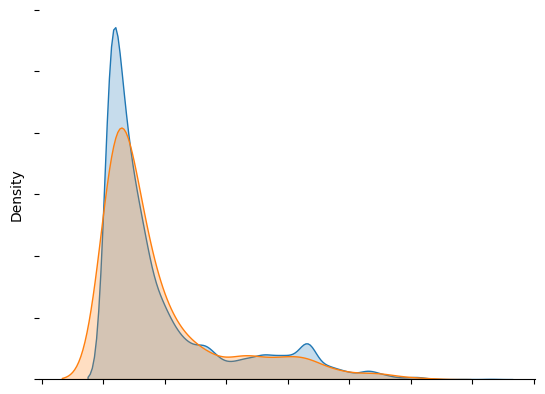

feature31
feature31 0.005925209478847562


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


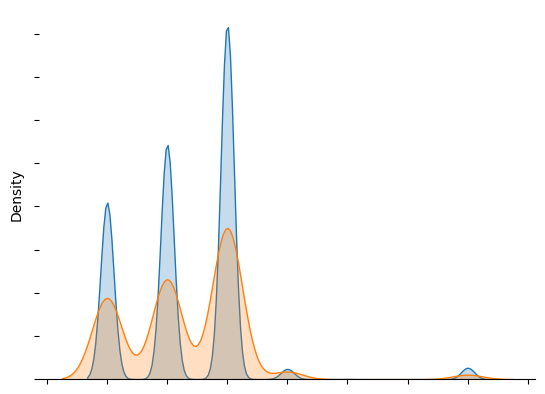

feature32
feature32 0.0015340206001528346


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


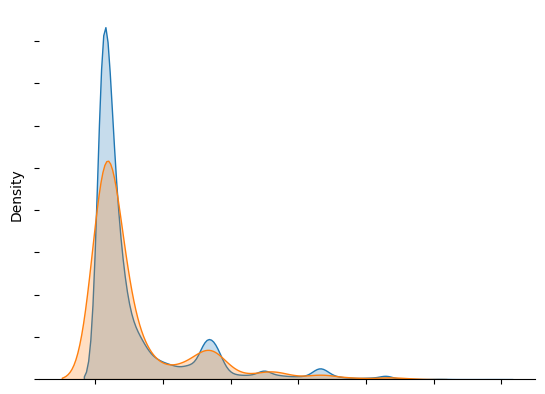

feature33
feature33 0.003711072033975686


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


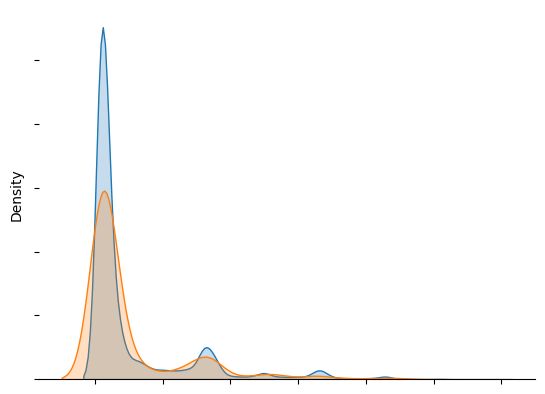

feature34
feature34 0.002405564210032838


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


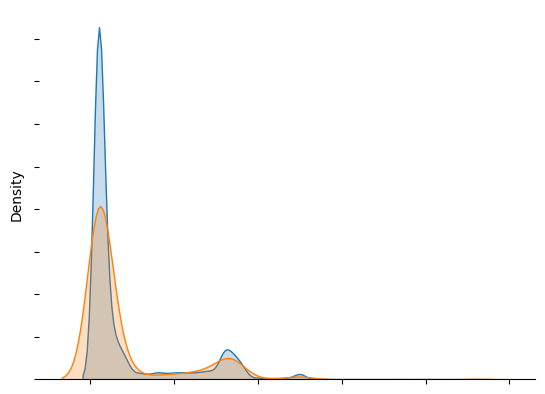

feature35
feature35 0.004396128835877193


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


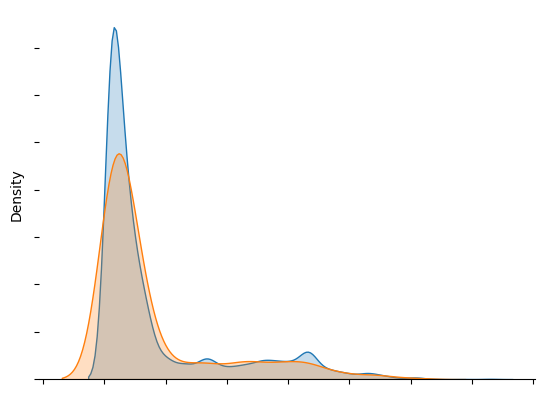

feature36
feature36 0.000246808267609414


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


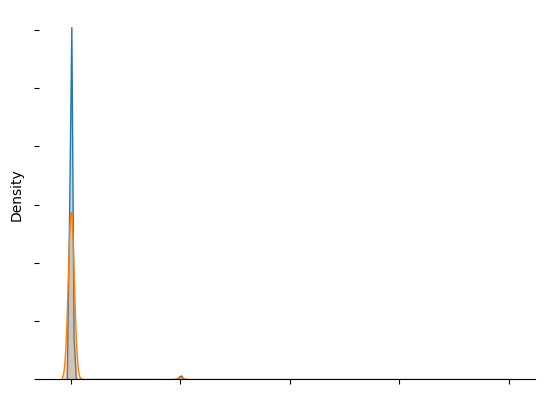

feature37
feature37 0.0001339306583380633


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


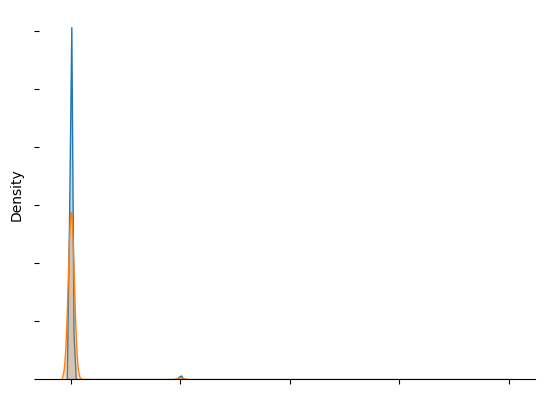

feature38
feature38 0.00013327491159311568


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


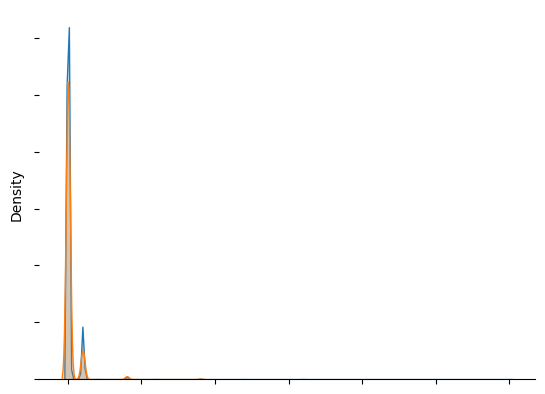

feature39
feature39 0.007106067065144607


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


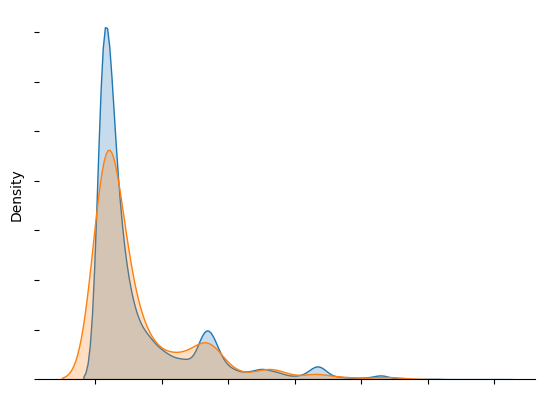

feature40
feature40 0.0053599566658506


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


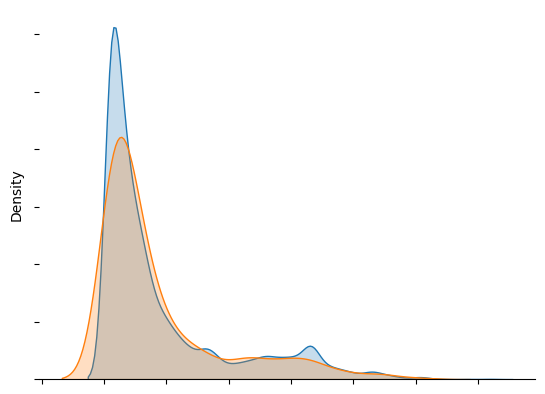

feature41
feature41 8.72595247938178e-07


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


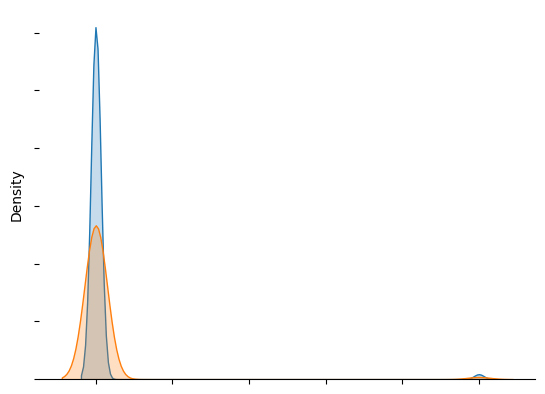

['c31f5368-7e08-4843-8e32-aa3e3820a392.parquet', 'f40156a4-f2a6-471b-bf44-74f4920b1e8e.parquet', '68d557e5-af9a-4d6e-95d5-f8f6bf9e391e.parquet', '2c2b39ba-2aa2-4f9e-b485-f831f92ddad8.parquet', '33f5f759-3dfd-485f-87eb-6e096c2824d0.parquet', 'a5d630e0-c563-48d2-9797-5975f4aa75b2.parquet', 'd53579d1-3851-480d-9acf-81b31714bcc4.parquet', '53494da7-78f1-4be3-9d3f-c2f3279fcd27.parquet', '66fe17ad-0e96-4f45-a699-bd1092ffb52c.parquet', '123.parquet', '636beb0d-50a0-4abd-b07a-4c2569c68e11.parquet', '8476a651-4f9a-4d6c-abfc-4dad67b07ef4.parquet', '4b0d8339-006d-4f61-9fb6-7a66a6f10d68.parquet', '98e7acab-f734-4d2d-ae4b-f22c278c277c.parquet', '40c147b4-53e6-4f8f-bd8f-87de200fea48.parquet', '7cdd1fb7-15a4-40a4-aaa3-08ec2043c9e5.parquet', 'ceff4f23-c42e-412f-9465-921231b28f59.parquet', 'f09b4d7a-cfe4-4d9b-a478-2ec2a243e115.parquet', '4d8e32c8-2dea-42b4-b60d-6b13f34f3897.parquet', '6f2d7ebf-55bd-47c5-80a1-b329202183d7.parquet', 'b9d04eab-0dfa-42b4-a287-9d88525c60e7.parquet', '6e7c75c8-53b6-45fd-9f0b

/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


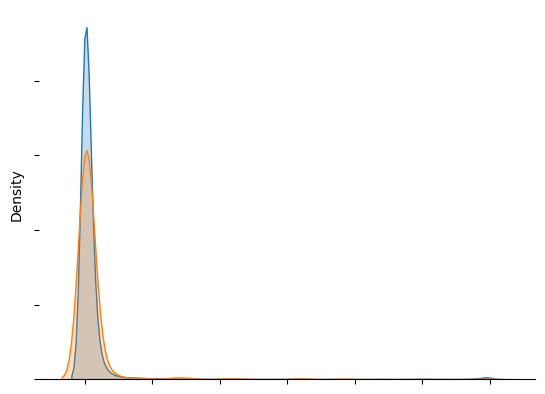

feature5
feature5 0.0014306343908399091


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


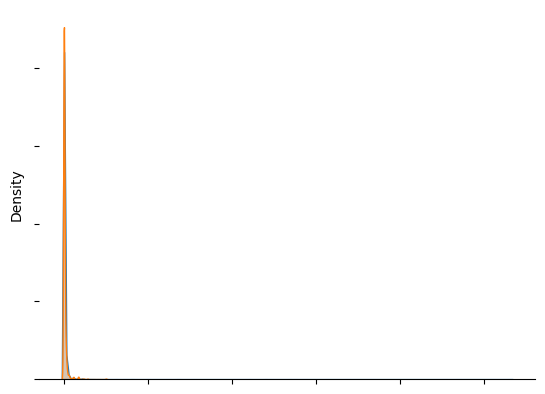

feature6
feature6 0.012585691442161314


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


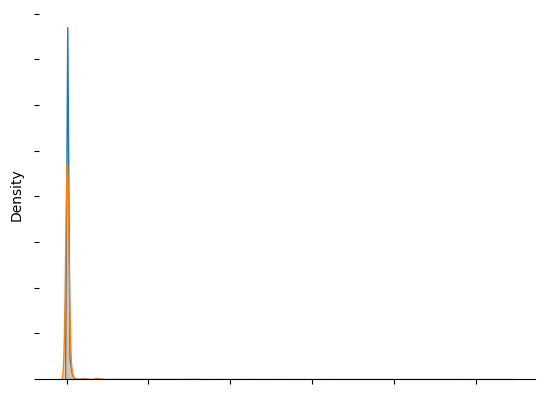

feature7
feature7 0.004465285512870697


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


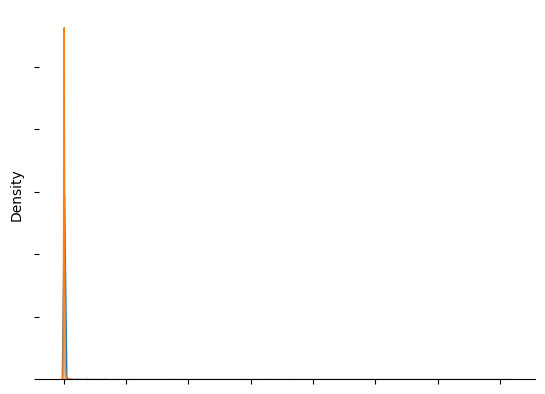

feature8
feature8 0.011449146531910762


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


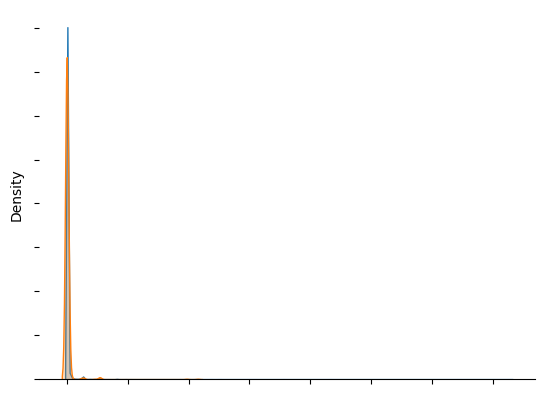

feature9
feature9 0.0002123024785317398


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


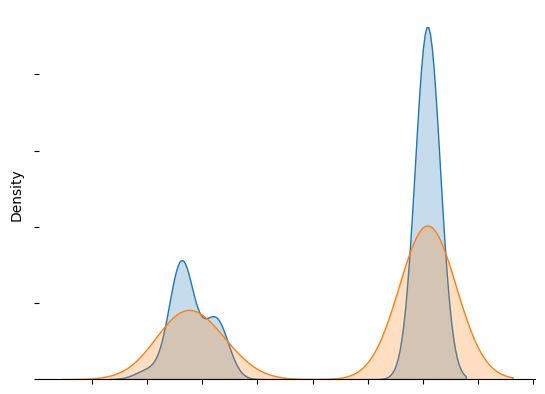

feature10
feature10 0.00073957242662757


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


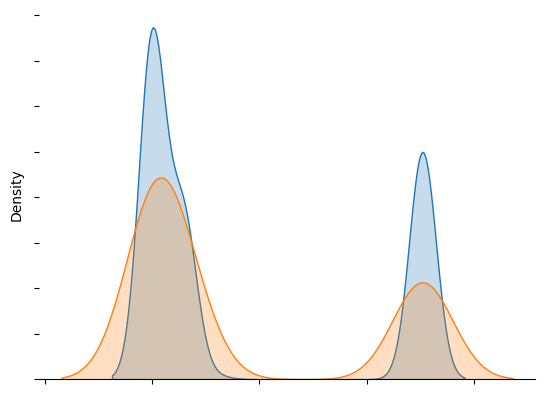

feature11
feature11 0.012324522153689165


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


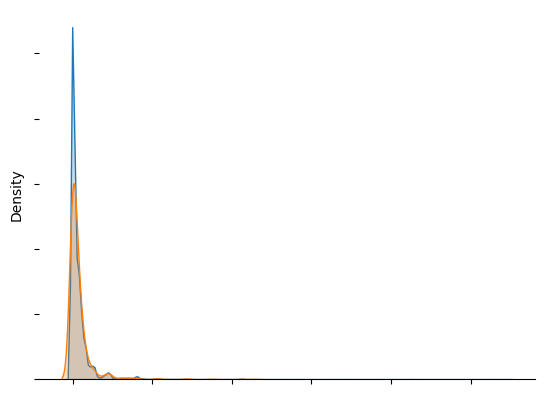

feature12
feature12 0.016383357871471473


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


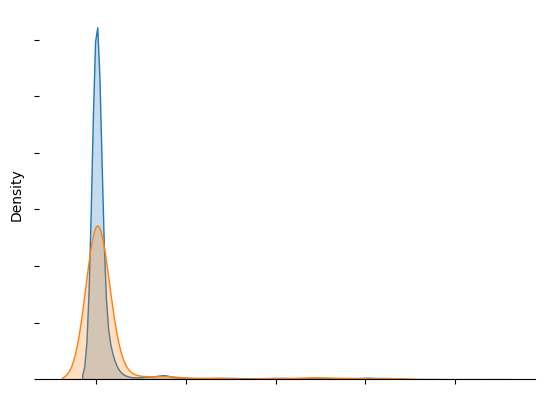

feature13
feature13 0.0017137188277630965


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


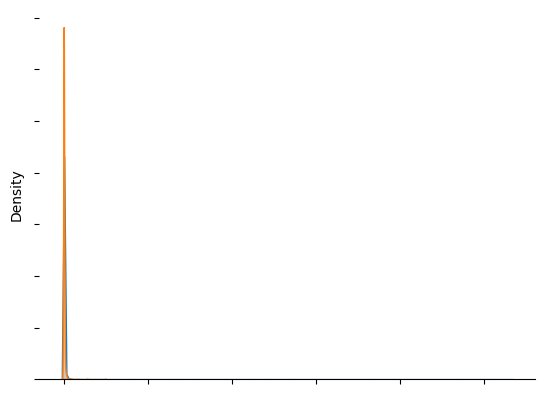

feature14
feature14 0.008407673053863503


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


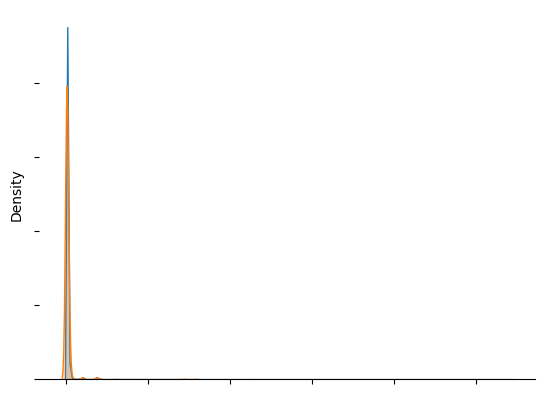

feature15
feature15 0.00156096410367604


/tmp/ipykernel_331661/3469078086.py:34: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))

KeyboardInterrupt



In [31]:
count = 0 
fig, axes = plt.subplots(20, 5, sharex=True, figsize=(16,8))
x = 0
for file in files:
    if file == 'processed': continue
    print(files)
    test_data = pd.read_parquet(SRC_DIR+file)
    for col in df_num.columns:
        print(col)
        initial = df_prob2[col].values
        new = test_data[col].values
        # a = stats.ks_2samp(initial, new)
        bin = max(7, int(np.log2((initial.max() - initial.min()))))
        a = calculate_psi(initial, new, buckettype='bins', buckets=bin, axis=1)
        print(col, a)
        plot = sns.histplot(data=penguins, x="flipper_length_mm")#sns.kdeplot(initial, fill=True)
        plot = sns.histplot(data=penguins, x="flipper_length_mm")#sns.kdeplot(new, fill=True)
        plot.set(yticklabels=[], xticklabels = [])
        sns.despine(left=True)
        plt.show()

count

In [22]:
max_psi

0.03217084487360211

In [42]:
calculate_psi(initial, new, buckettype='quantiles', buckets=10, axis=1)


/tmp/ipykernel_145397/4018828021.py:63: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


0.006238014736525849

In [22]:
df_prob2.feature2.value_counts()

tcp       29587
udp       22189
unas       3754
arp         888
ospf        802
          ...  
idrp         22
isis         22
netblt       22
igmp          5
icmp          3
Name: feature2, Length: 132, dtype: int64

In [28]:
test_data.feature2.value_counts()

-1      428
 112    249
 118    233
 119     39
 6       14
 78       6
 115      3
 67       3
 96       3
 32       2
 35       2
 127      2
 11       2
 71       2
 66       1
 34       1
 38       1
 3        1
 90       1
 22       1
 57       1
 16       1
 64       1
 110      1
 15       1
 129      1
Name: feature2, dtype: int64

In [11]:
df_cat.feature3.value_counts()

-           34063
dns         16321
http         6540
smtp         1707
ftp-data     1260
ftp          1128
pop3          380
ssh           346
dhcp           38
ssl            23
snmp           21
irc             8
radius          6
Name: feature3, dtype: int64

In [12]:
df_num.feature7.value_counts()

114.0        13612
200.0         7402
146.0         1643
168.0         1183
564.0         1171
             ...  
9244.0           1
1634937.0        1
2941.0           1
5903.0           1
5644.0           1
Name: feature7, Length: 3968, dtype: int64

In [14]:
from scipy.stats import kstest

In [ ]:
df

In [188]:
dup = pd.read_parquet('../../data/train_data/phase-2/prob-2/train_x.parquet')
dup_y = pd.read_parquet('../../data/train_data/phase-2/prob-2/train_y.parquet')

In [189]:
dup['label'] = dup_y

In [183]:
dup.reset_index(drop=True, inplace=True)

In [184]:
dup[dup.label != "Normal"].sort_values(by=dup.columns.to_list()).head(20)

,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,feature10,...,feature33,feature34,feature35,feature36,feature37,feature38,feature39,feature40,feature41,label
21960,0.000000,118,0,4,1.0,0.0,24.0,0.0,254.0,0.0,...,1.0,1.0,2.0,0.0,0.0,0.0,3.0,2.0,0.0,Exploits
47489,0.000000,118,0,4,1.0,0.0,1501.0,0.0,255.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,2.0,1.0,0.0,Denial of Service
10885,0.000000,118,0,4,1.0,0.0,1501.0,0.0,255.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,2.0,1.0,0.0,Denial of Service
41262,0.000000,118,0,4,1.0,0.0,1501.0,0.0,255.0,0.0,...,2.0,1.0,1.0,0.0,0.0,0.0,2.0,1.0,0.0,Denial of Service
2925,0.000000,118,0,4,1.0,0.0,1501.0,0.0,255.0,0.0,...,2.0,1.0,2.0,0.0,0.0,0.0,2.0,3.0,0.0,Denial of Service
14707,0.000000,118,0,4,1.0,0.0,1504.0,0.0,255.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,0.0,Denial of Service
38715,0.000000,118,0,4,2.0,0.0,168.0,0.0,254.0,0.0,...,2.0,1.0,5.0,0.0,0.0,0.0,5.0,5.0,0.0,Information Gathering
4946,0.000000,118,2,4,2.0,0.0,114.0,0.0,254.0,0.0,...,14.0,14.0,17.0,0.0,0.0,0.0,14.0,17.0,0.0,Other
32039,0.000000,118,2,4,2.0,0.0,114.0,0.0,254.0,0.0,...,14.0,14.0,17.0,0.0,0.0,0.0,14.0,17.0,0.0,Other
19504,0.000000,118,2,4,2.0,0.0,114.0,0.0,254.0,0.0,...,11.0,11.0,29.0,0.0,0.0,0.0,11.0,29.0,0.0,Other


In [177]:
dup["check"] = ['']*len(dup)

In [178]:
# dup = dup.sort_values(by=dup.columns[:-2].tolist())

In [187]:
dup.groupby(dup.columns.to_list()).count()

Empty DataFrame
Columns: []
Index: [(0.0, 6, 0, 1, 2.0, 2.0, 56.0, 92.0, 0.0, 0.0, 6.1578, 10.116385, 0.0, 0.0, 36376.52, 36376.464, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 46.0, 0.0, 0.0, 2.0, 0.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 2.0, 2.0, 0.0, Normal), (0.0, 6, 0, 1, 2.0, 2.0, 56.0, 92.0, 0.0, 0.0, 6.462646, 10.617205, 0.0, 0.0, 34660.564, 34660.564, 0.0, 8.325931, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 46.0, 0.0, 0.0, 2.0, 0.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 2.0, 2.0, 0.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 2.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, 2.0, 1.0, 1.0, 0.0, 0.0, 0.0, 2.0, 1.0, 0.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 2.0, 4.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60000.008, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60000.04, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60000.08, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60000.104, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60000.332, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60000.368, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60000.424, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60000.424, 0.0, 10.95449, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60000.444, 0.0, 10.954492, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60000.448, 0.0, 15.491991, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, Normal), (0.0, 6, 0, 4, 1.0, 0.0, 46.0, 0.0, 0.0

In [186]:
tmp

,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,feature10,...,feature33,feature34,feature35,feature36,feature37,feature38,feature39,feature40,feature41,label
0,0.000000,6,0,1,2.0,2.0,56.0,92.0,0.0,0.0,...,2.0,2.0,2.0,0.0,0.0,0.0,2.0,2.0,0.0,Normal
1,0.000000,6,0,1,2.0,2.0,56.0,92.0,0.0,0.0,...,2.0,2.0,2.0,0.0,0.0,0.0,2.0,2.0,0.0,Normal
2,0.000000,6,0,4,1.0,0.0,46.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,Normal
3,0.000000,6,0,4,1.0,0.0,46.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,Normal
4,0.000000,6,0,4,1.0,0.0,46.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,2.0,1.0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37921,59.997478,112,0,1,900.0,402.0,432000.0,17286.0,254.0,252.0,...,2.0,2.0,2.0,0.0,0.0,0.0,5.0,2.0,0.0,Denial of Service
37922,59.997837,112,9,1,6262.0,946.0,8294226.0,41232.0,254.0,252.0,...,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,Denial of Service
37923,59.999836,6,0,4,2.0,0.0,92.0,0.0,0.0,0.0,...,2.0,2.0,2.0,0.0,0.0,0.0,2.0,2.0,1.0,Normal
37924,59.999905,6,0,4,2.0,0.0,92.0,0.0,0.0,0.0,...,2.0,2.0,2.0,0.0,0.0,0.0,2.0,2.0,1.0,Normal


In [168]:
tmp = pd.DataFrame(tmp.groupby(['check', 'label']).max()).reset_index()

In [169]:
tmp = tmp[['check', 'label']]

In [165]:
for col in dup.columns[:-2]:
    dup['check'] = dup['check'] + dup[col].astype(str)

In [172]:
tmp

,check,label
0,0.000108118042.00.0503.00.064.00.018666666.00....,Normal
1,0.000108118042.00.0503.00.064.00.018666666.00....,Normal
2,0.000162118242.00.0114.00.0254.00.02814814.750...,Other
3,0.000327112032.02.0104.0104.031.029.01272171.2...,Normal
4,0.000544112002.02.0112.0112.031.029.0823529.37...,Normal
...,...,...
37921,9e-0699042.00.0104.00.0254.00.046222220.00.00....,Denial of Service
37922,9e-0699042.00.0104.00.0254.00.046222220.00.00....,Exploits
37923,9e-0699042.00.0200.00.0254.00.088888888.00.00....,Denial of Service
37924,9e-0699042.00.0200.00.0254.00.088888888.00.00....,Information Gathering


In [170]:
len(dup) - len(tmp)#.merge(tmp, on='check', how='right')

11546

In [156]:
final = dup.merge(tmp, on='check', how='right')

In [157]:
final

,feature1_x,feature2_x,feature3_x,feature4_x,feature5_x,feature6_x,feature7_x,feature8_x,feature9_x,feature10_x,...,feature32_y,feature33_y,feature34_y,feature35_y,feature36_y,feature37_y,feature38_y,feature39_y,feature40_y,feature41_y
0,0.000108,118,0,4,2.0,0.0,503.0,0.0,64.0,0.0,...,2,2,2,2,2,2,2,2,2,2
1,0.000108,118,0,4,2.0,0.0,503.0,0.0,64.0,0.0,...,2,2,2,2,2,2,2,2,2,2
2,0.000108,118,0,4,2.0,0.0,503.0,0.0,64.0,0.0,...,11,11,11,11,11,11,11,11,11,11
3,0.000108,118,0,4,2.0,0.0,503.0,0.0,64.0,0.0,...,11,11,11,11,11,11,11,11,11,11
4,0.000108,118,0,4,2.0,0.0,503.0,0.0,64.0,0.0,...,11,11,11,11,11,11,11,11,11,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61812,0.000009,99,0,4,2.0,0.0,200.0,0.0,254.0,0.0,...,1,1,1,1,1,1,1,1,1,1
61813,0.000009,99,0,4,2.0,0.0,200.0,0.0,254.0,0.0,...,1,1,1,1,1,1,1,1,1,1
61814,0.000009,99,0,4,2.0,0.0,200.0,0.0,254.0,0.0,...,1,1,1,1,1,1,1,1,1,1
61815,0.000009,99,0,4,2.0,0.0,200.0,0.0,254.0,0.0,...,2,2,2,2,2,2,2,2,2,2


In [141]:
sum(final['label_x'] != final['label_y'])

12345

In [60]:
for idx, r in tmp.iterrows():
    if r['check']

,check,label
10689,0.000108udp-INT2.00.0503.00.064.00.018666666.0...,Normal
13099,0.000108udp-INT2.00.0503.00.064.00.018666666.0...,Normal
1684,0.000108udp-INT2.00.0503.00.064.00.018666666.0...,Normal
11445,0.000108udp-INT2.00.0503.00.064.00.018666666.0...,Normal
13450,0.000108udp-INT2.00.0503.00.064.00.018666666.0...,Normal
...,...,...
6119,9e-06zero-INT2.00.0200.00.0254.00.088888888.00...,Denial of Service
8408,9e-06zero-INT2.00.0200.00.0254.00.088888888.00...,Denial of Service
8145,9e-06zero-INT2.00.0200.00.0254.00.088888888.00...,Exploits
14676,9e-06zero-INT2.00.0200.00.0254.00.088888888.00...,Exploits


In [64]:
tmp.iloc[8408] == tmp.iloc[14676]

check    False
label    False
dtype: bool

2023-07-06 08:07:12,458 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,459 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,461 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,462 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,464 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,465 - findfont: Generic family 'sans-serif' not found because none of the f

feature1


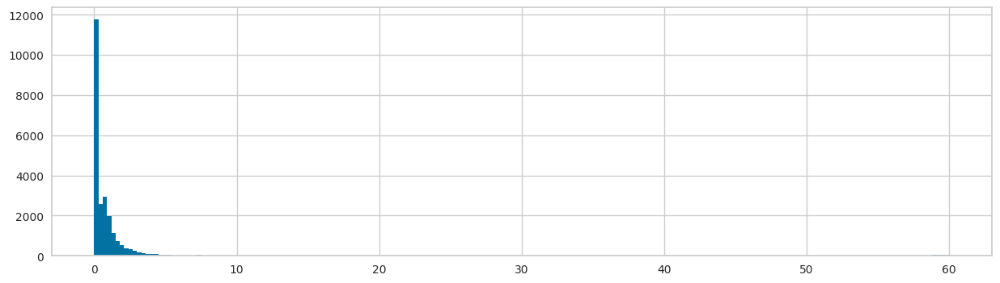

2023-07-06 08:07:12,900 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,901 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,902 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,903 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,904 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,905 - findfont: Generic family 'sans-serif' not found because none of the f

feature2


2023-07-06 08:07:12,992 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,993 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,994 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,995 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,996 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:12,997 - findfont: Generic family 'sans-serif' not found because none of the f

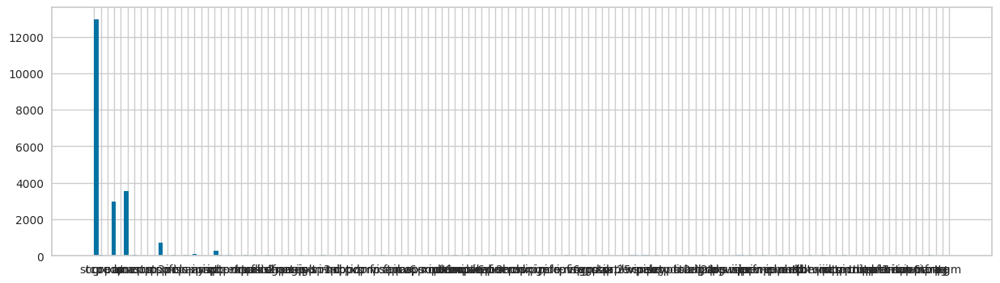

2023-07-06 08:07:13,805 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:13,806 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:13,807 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:13,808 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:13,809 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:13,810 - findfont: Generic family 'sans-serif' not found because none of the f

feature3


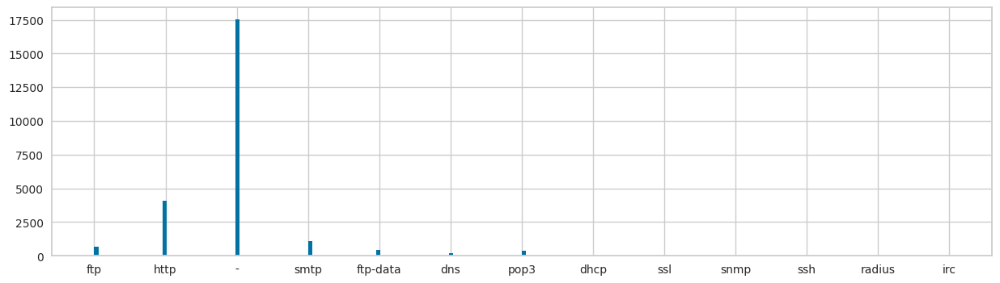

2023-07-06 08:07:14,183 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,184 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,185 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,186 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,187 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,188 - findfont: Generic family 'sans-serif' not found because none of the f

feature4


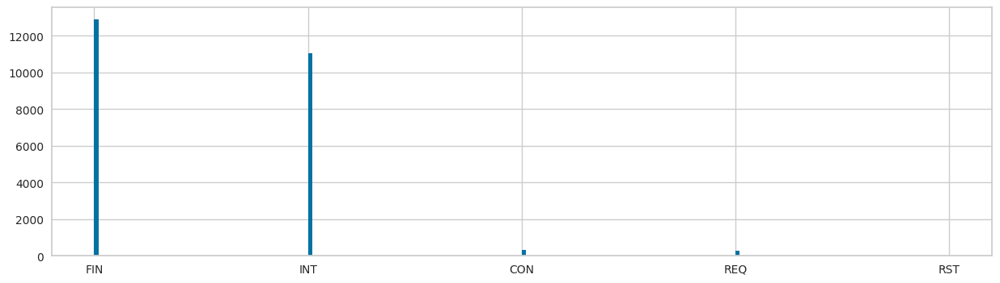

2023-07-06 08:07:14,517 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,518 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,519 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,519 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,520 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,521 - findfont: Generic family 'sans-serif' not found because none of the f

feature5


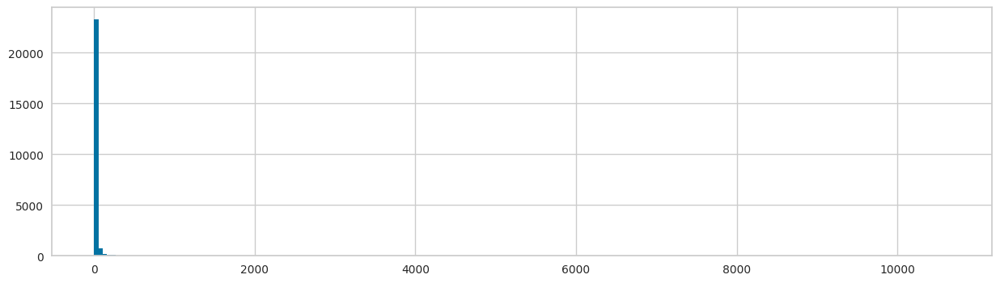

2023-07-06 08:07:14,883 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,884 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,885 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,887 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,888 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:14,890 - findfont: Generic family 'sans-serif' not found because none of the f

feature6


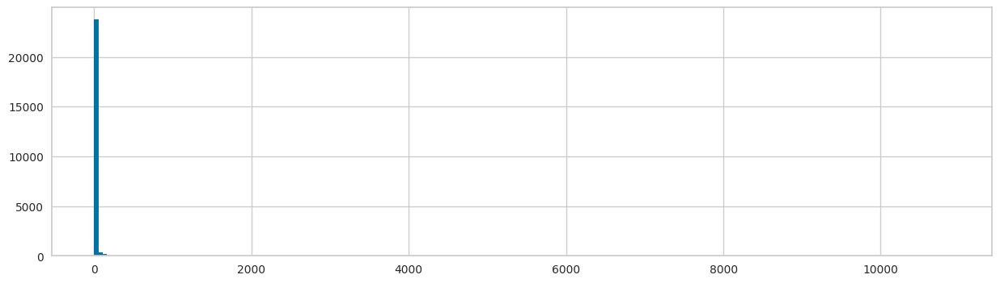

2023-07-06 08:07:15,238 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,239 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,240 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,241 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,242 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,243 - findfont: Generic family 'sans-serif' not found because none of the f

feature7


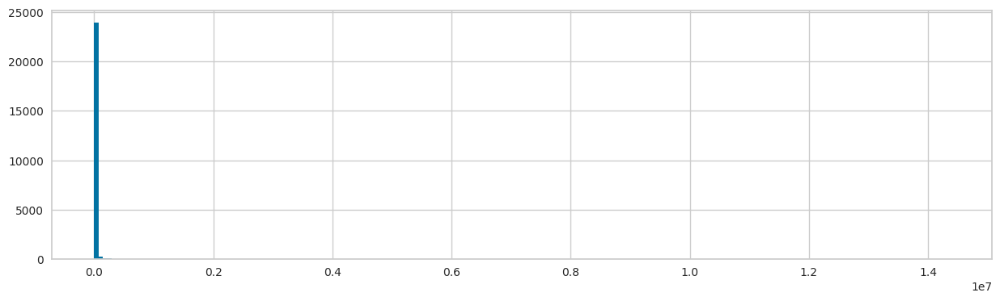

2023-07-06 08:07:15,588 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,589 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,590 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,591 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,592 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,593 - findfont: Generic family 'sans-serif' not found because none of the f

feature8


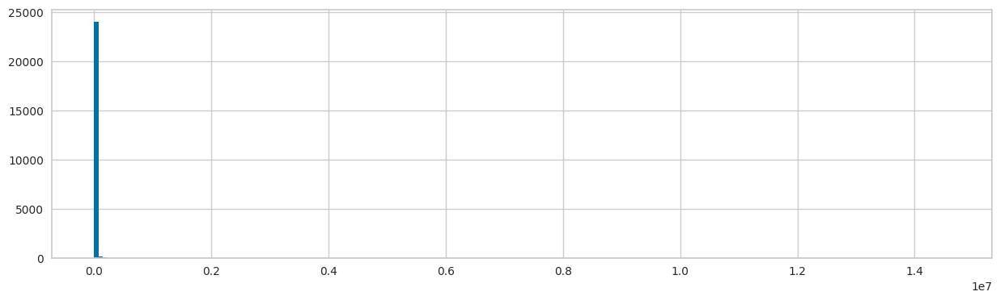

2023-07-06 08:07:15,951 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,952 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,953 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,954 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,955 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:15,956 - findfont: Generic family 'sans-serif' not found because none of the f

feature9


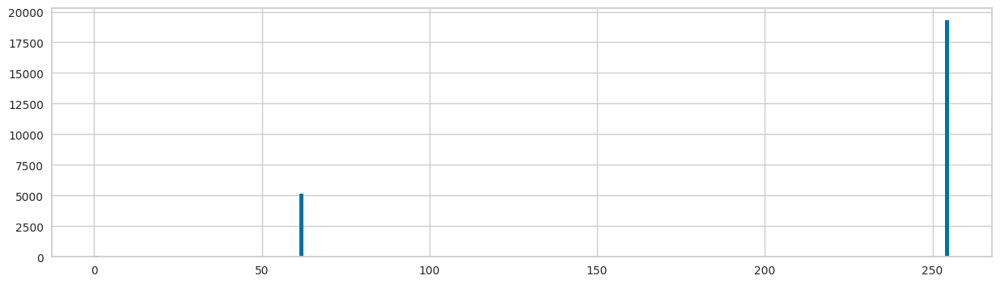

2023-07-06 08:07:16,324 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:16,324 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:16,325 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:16,327 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:16,328 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:16,329 - findfont: Generic family 'sans-serif' not found because none of the f

feature10


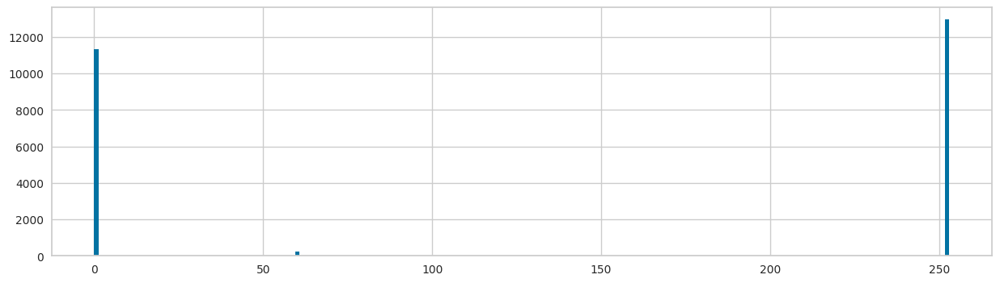

2023-07-06 08:07:16,675 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:16,676 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:16,677 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:16,678 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:16,679 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:16,680 - findfont: Generic family 'sans-serif' not found because none of the f

feature11


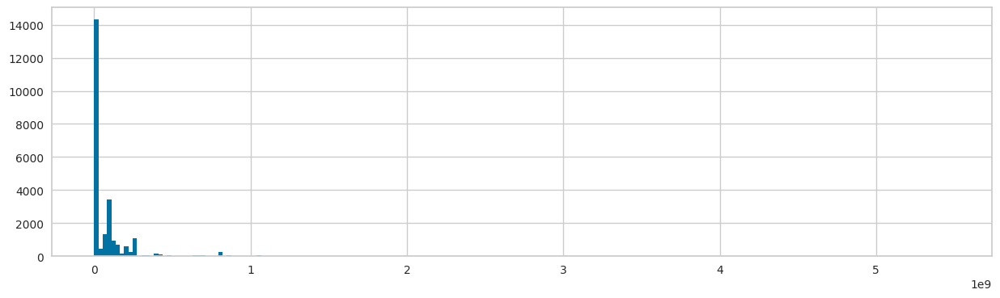

2023-07-06 08:07:17,022 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,023 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,024 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,025 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,026 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,027 - findfont: Generic family 'sans-serif' not found because none of the f

feature12


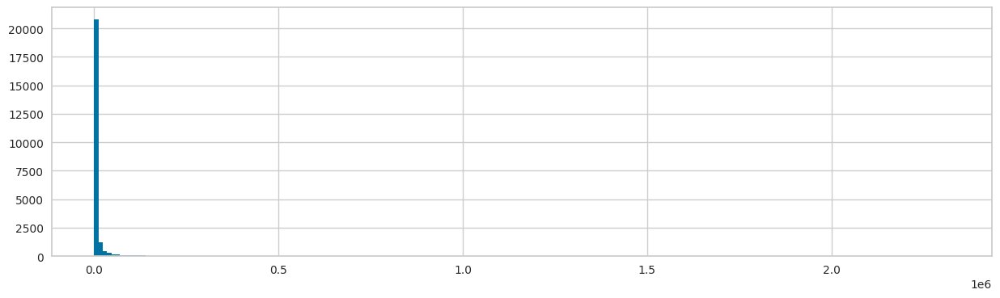

2023-07-06 08:07:17,373 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,374 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,375 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,377 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,378 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,379 - findfont: Generic family 'sans-serif' not found because none of the f

feature13


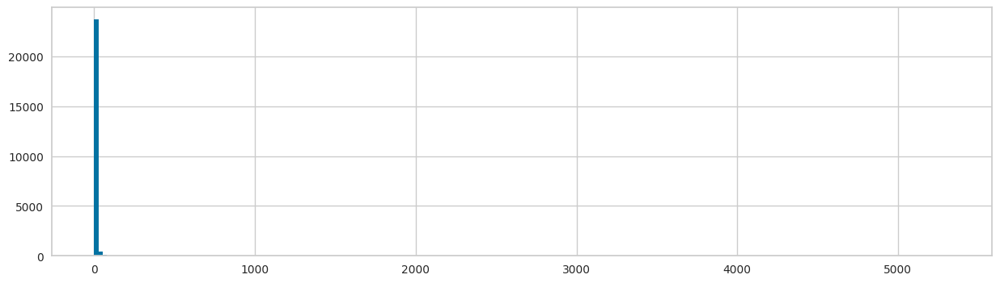

2023-07-06 08:07:17,700 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,701 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,702 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,703 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,704 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:17,705 - findfont: Generic family 'sans-serif' not found because none of the f

feature14


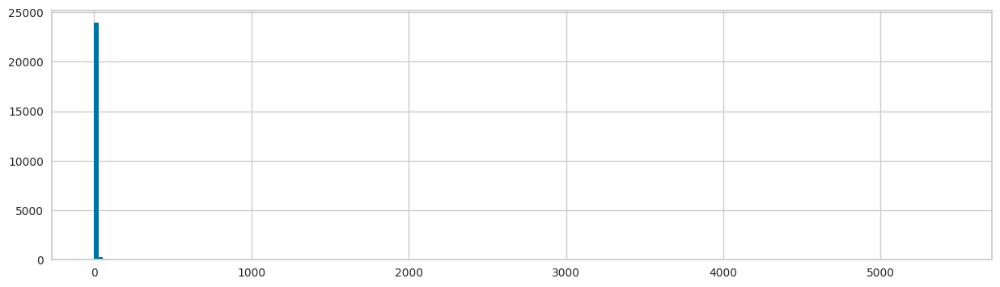

2023-07-06 08:07:18,058 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,059 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,060 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,062 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,063 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,064 - findfont: Generic family 'sans-serif' not found because none of the f

feature15


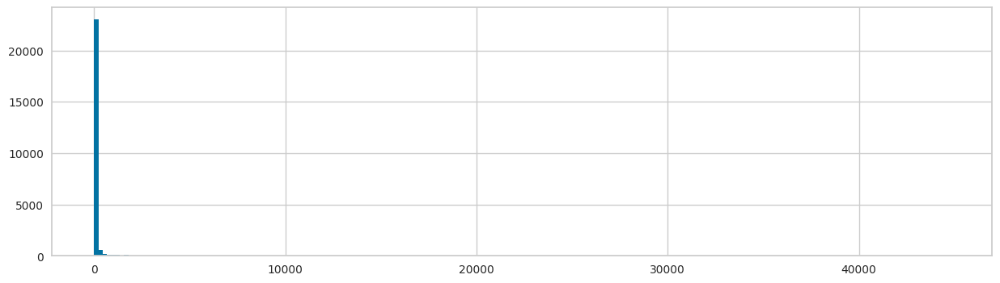

2023-07-06 08:07:18,380 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,381 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,382 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,383 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,384 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,385 - findfont: Generic family 'sans-serif' not found because none of the f

feature16


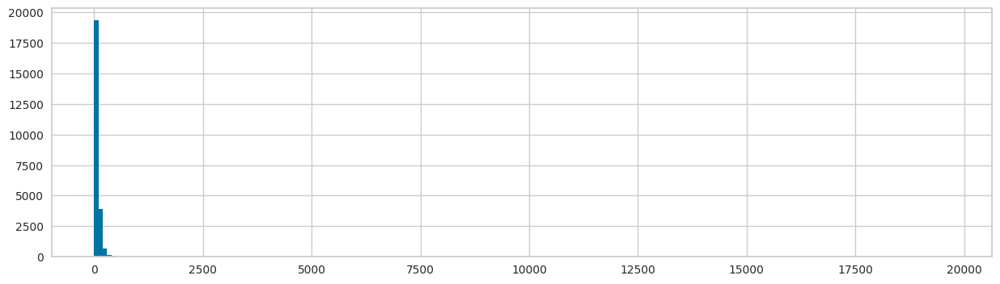

2023-07-06 08:07:18,735 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,736 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,737 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,738 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,739 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:18,740 - findfont: Generic family 'sans-serif' not found because none of the f

feature17


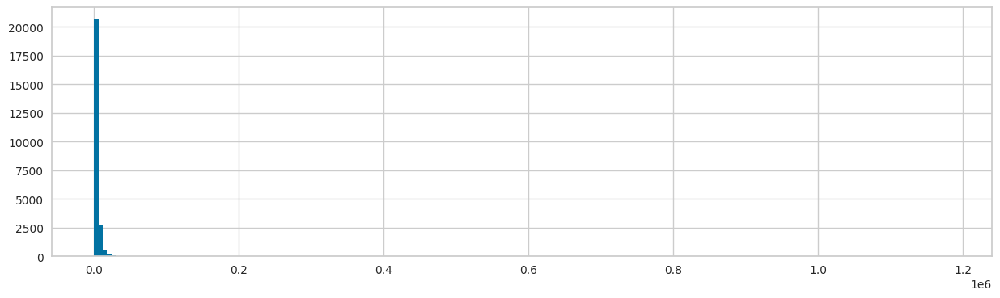

2023-07-06 08:07:19,107 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,108 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,109 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,110 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,111 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,112 - findfont: Generic family 'sans-serif' not found because none of the f

feature18


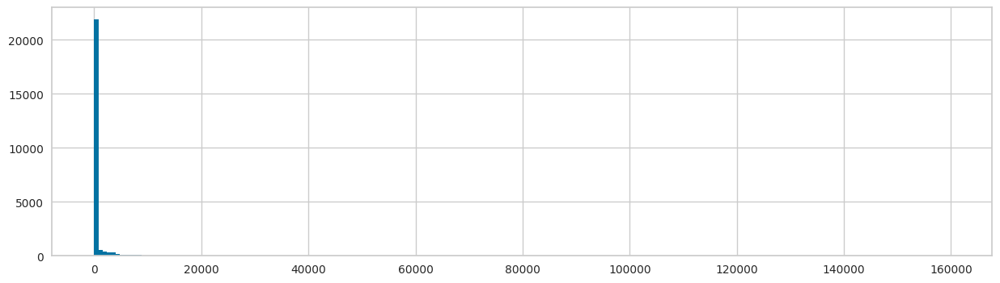

2023-07-06 08:07:19,449 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,450 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,451 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,452 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,453 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,454 - findfont: Generic family 'sans-serif' not found because none of the f

feature19


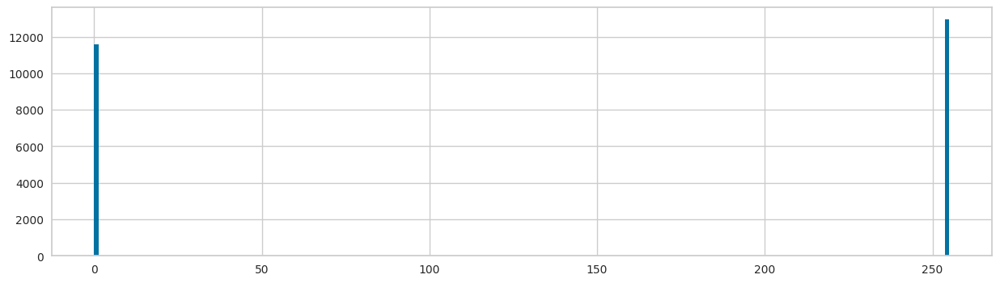

2023-07-06 08:07:19,781 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,782 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,783 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,784 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,785 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:19,785 - findfont: Generic family 'sans-serif' not found because none of the f

feature20


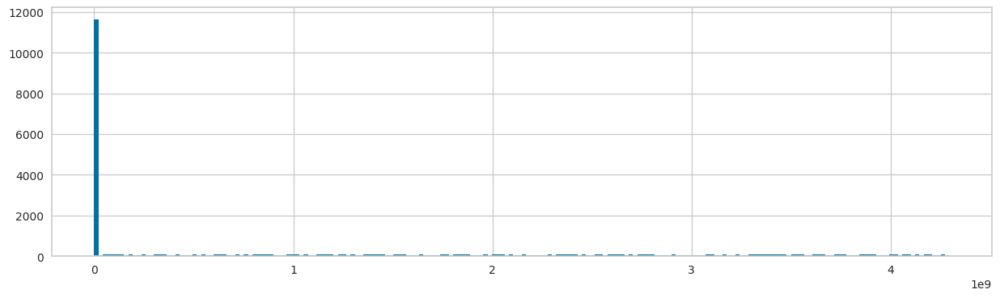

2023-07-06 08:07:20,120 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,122 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,123 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,124 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,125 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,126 - findfont: Generic family 'sans-serif' not found because none of the f

feature21


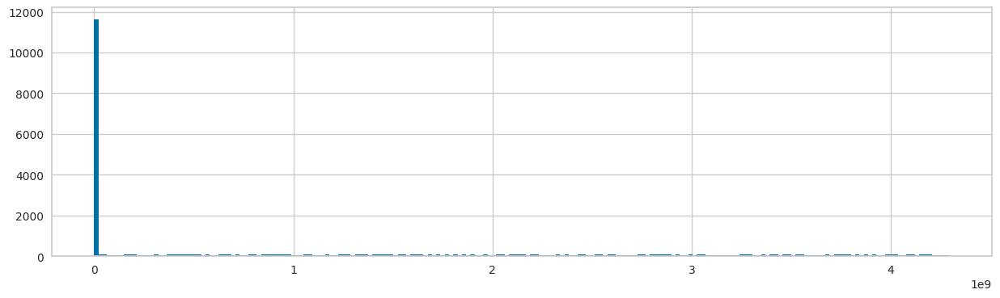

2023-07-06 08:07:20,456 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,457 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,458 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,459 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,460 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,461 - findfont: Generic family 'sans-serif' not found because none of the f

feature22


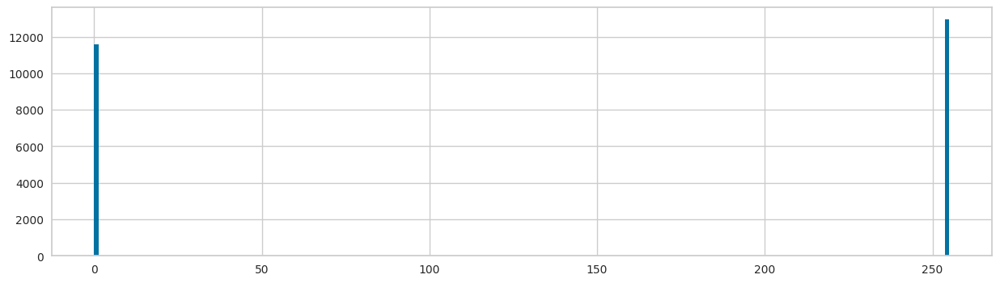

2023-07-06 08:07:20,791 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,792 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,793 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,794 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,795 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:20,796 - findfont: Generic family 'sans-serif' not found because none of the f

feature23


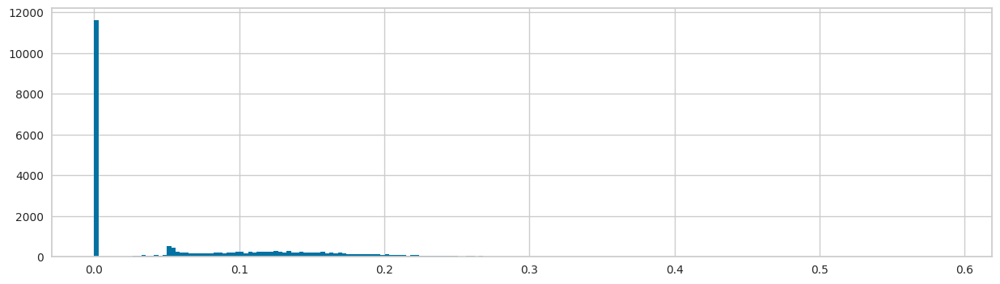

2023-07-06 08:07:21,134 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:21,135 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:21,137 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:21,138 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:21,139 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:21,140 - findfont: Generic family 'sans-serif' not found because none of the f

feature24


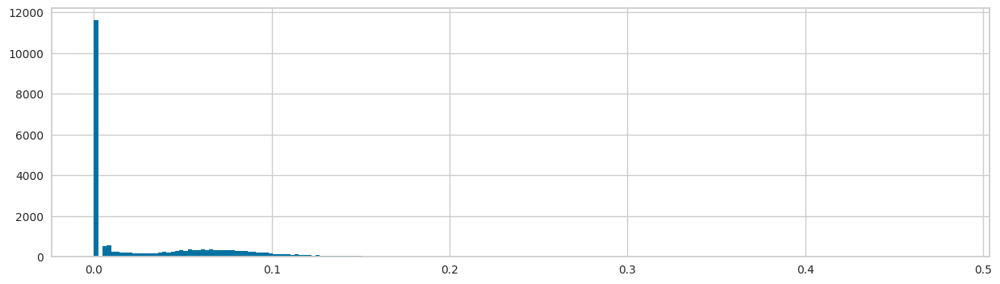

2023-07-06 08:07:22,889 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:22,890 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:22,892 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:22,893 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:22,895 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:22,896 - findfont: Generic family 'sans-serif' not found because none of the f

feature25


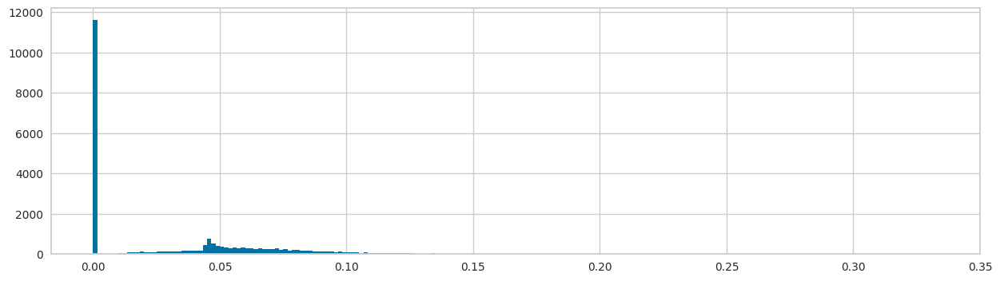

2023-07-06 08:07:23,239 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,240 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,241 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,242 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,243 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,244 - findfont: Generic family 'sans-serif' not found because none of the f

feature26


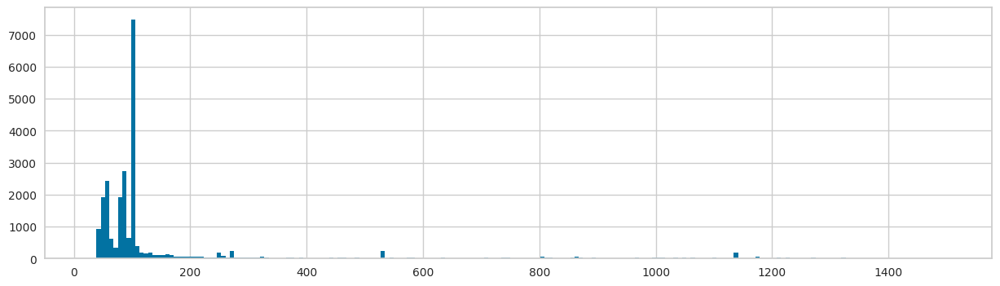

2023-07-06 08:07:23,583 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,585 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,586 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,587 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,588 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,589 - findfont: Generic family 'sans-serif' not found because none of the f

feature27


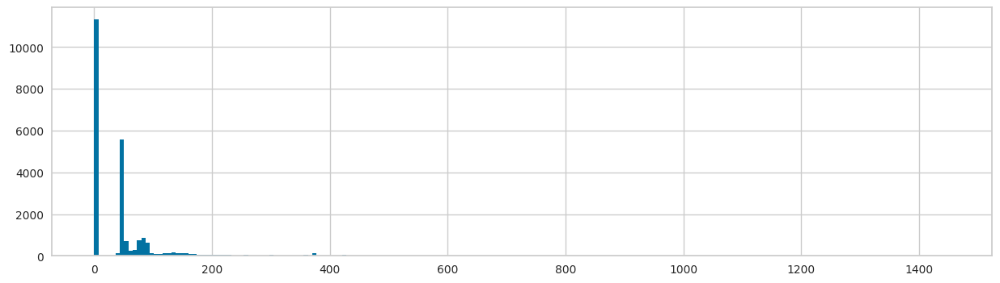

2023-07-06 08:07:23,923 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,924 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,925 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,925 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,926 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:23,927 - findfont: Generic family 'sans-serif' not found because none of the f

feature28


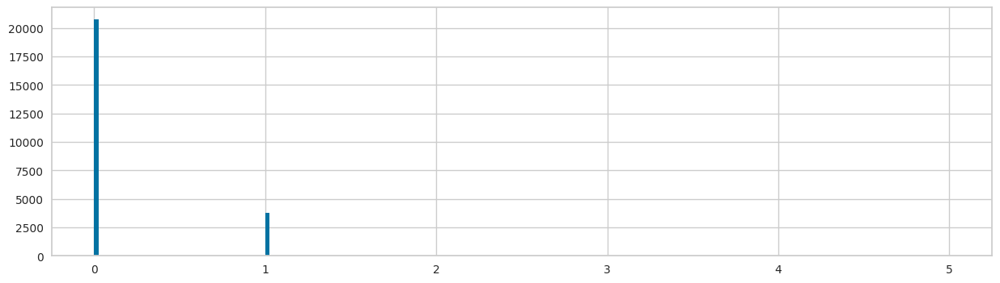

2023-07-06 08:07:24,272 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,273 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,274 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,275 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,277 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,278 - findfont: Generic family 'sans-serif' not found because none of the f

feature29


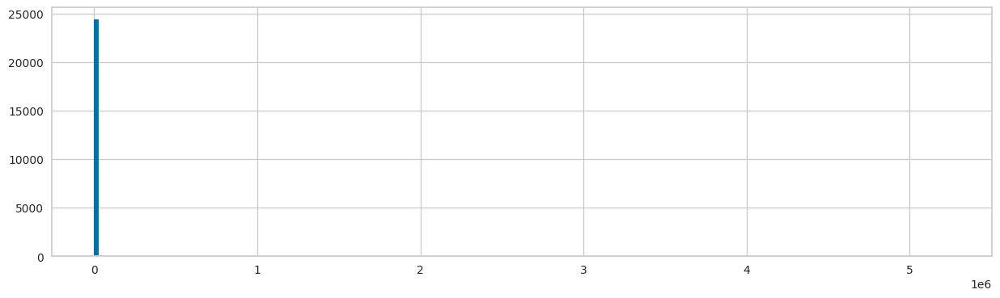

2023-07-06 08:07:24,618 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,619 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,620 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,621 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,622 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,623 - findfont: Generic family 'sans-serif' not found because none of the f

feature30


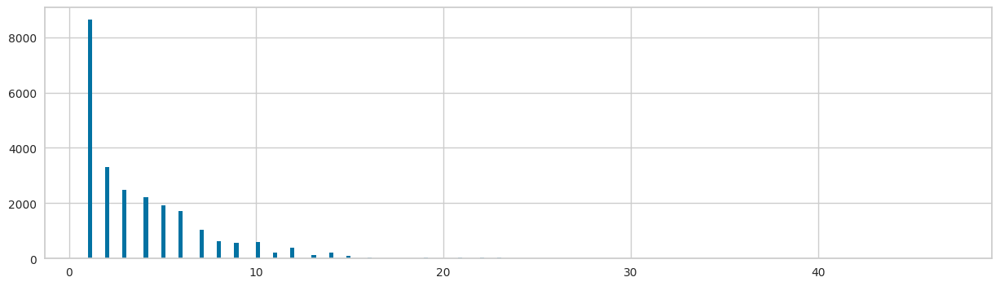

2023-07-06 08:07:24,955 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,956 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,957 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,958 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,958 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:24,959 - findfont: Generic family 'sans-serif' not found because none of the f

feature31


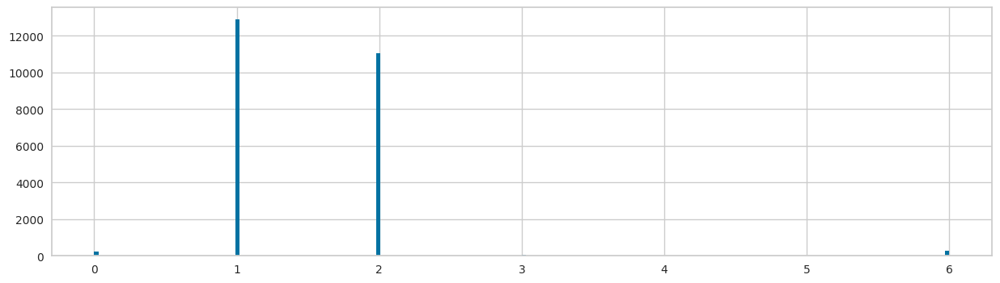

2023-07-06 08:07:25,294 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,295 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,296 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,297 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,298 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,299 - findfont: Generic family 'sans-serif' not found because none of the f

feature32


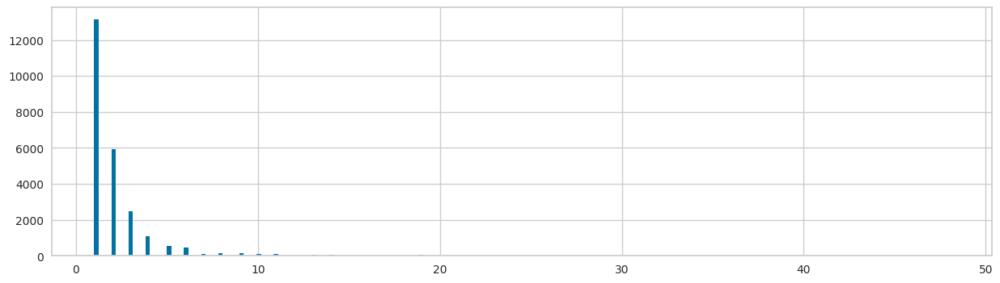

2023-07-06 08:07:25,627 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,628 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,629 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,630 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,631 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,632 - findfont: Generic family 'sans-serif' not found because none of the f

feature33


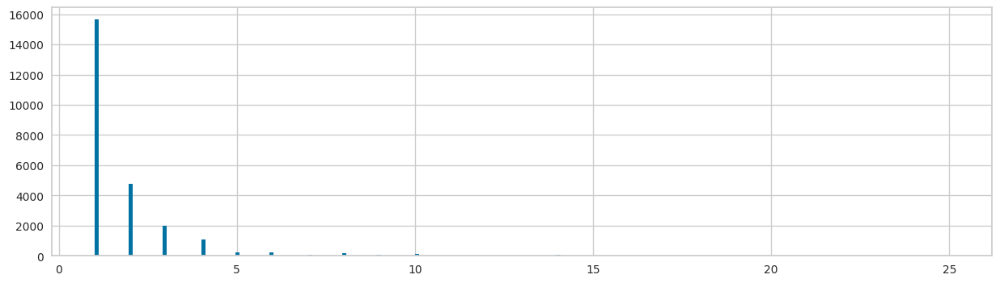

2023-07-06 08:07:25,978 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,979 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,981 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,982 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,983 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:25,984 - findfont: Generic family 'sans-serif' not found because none of the f

feature34


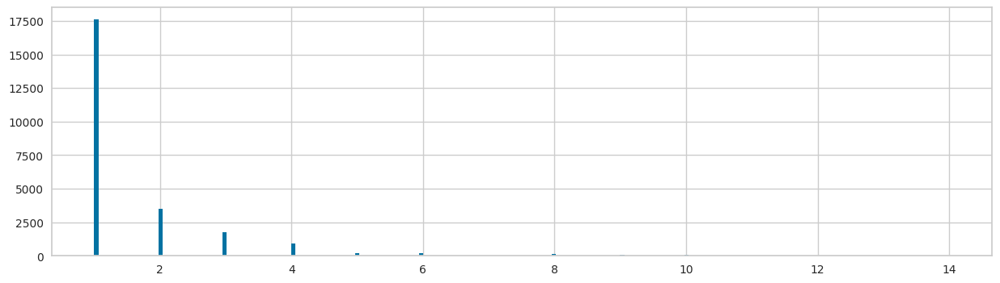

2023-07-06 08:07:26,322 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:26,323 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:26,325 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:26,326 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:26,327 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:26,328 - findfont: Generic family 'sans-serif' not found because none of the f

feature35


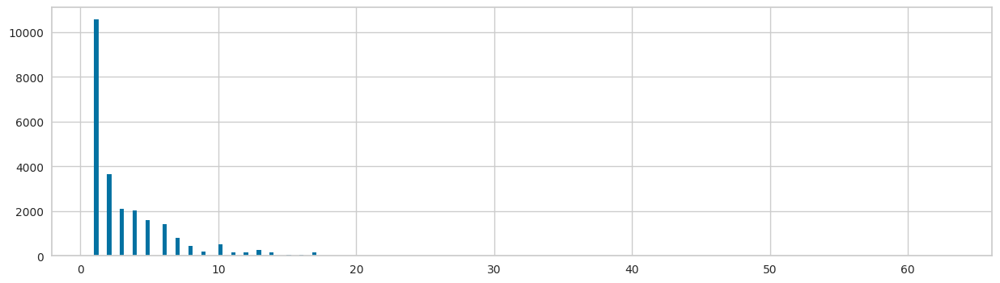

2023-07-06 08:07:26,673 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:26,674 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:26,677 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:26,678 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:26,679 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:26,681 - findfont: Generic family 'sans-serif' not found because none of the f

feature36


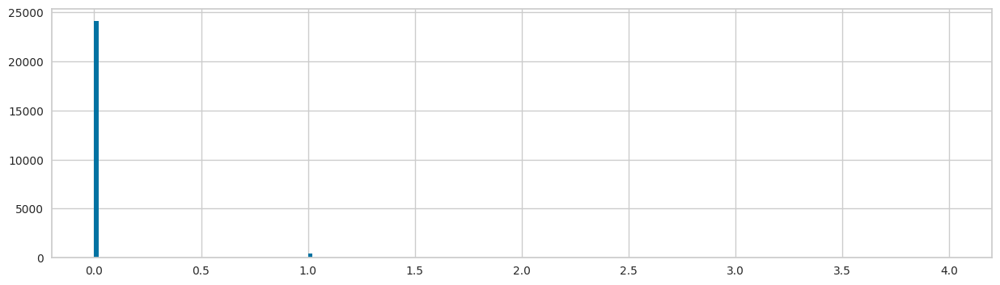

2023-07-06 08:07:27,055 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,056 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,058 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,059 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,060 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,061 - findfont: Generic family 'sans-serif' not found because none of the f

feature37


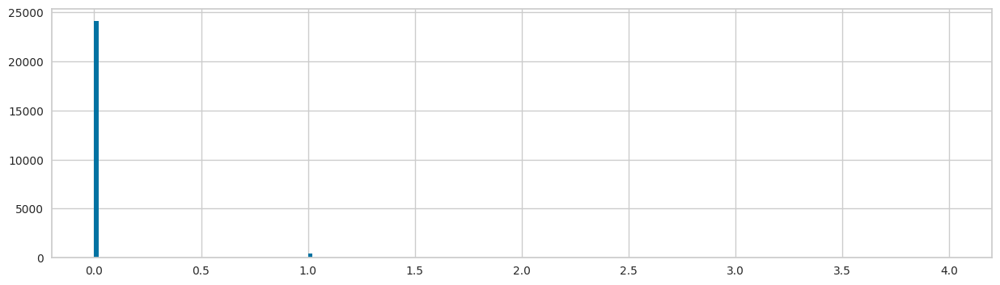

2023-07-06 08:07:27,408 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,408 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,409 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,410 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,411 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,412 - findfont: Generic family 'sans-serif' not found because none of the f

feature38


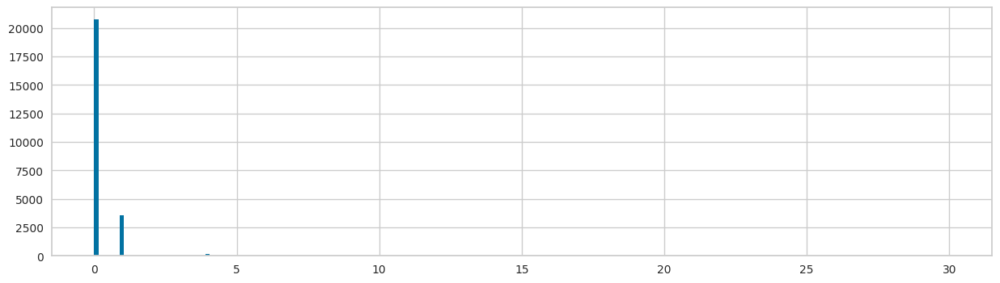

2023-07-06 08:07:27,765 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,766 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,767 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,768 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,769 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:27,770 - findfont: Generic family 'sans-serif' not found because none of the f

feature39


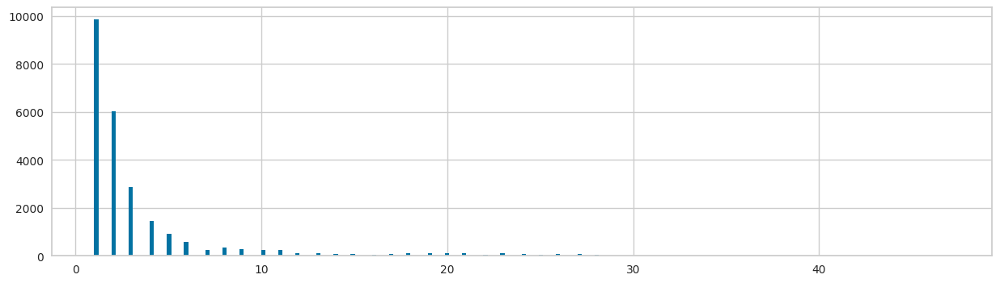

2023-07-06 08:07:28,103 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,104 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,105 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,106 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,107 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,108 - findfont: Generic family 'sans-serif' not found because none of the f

feature40


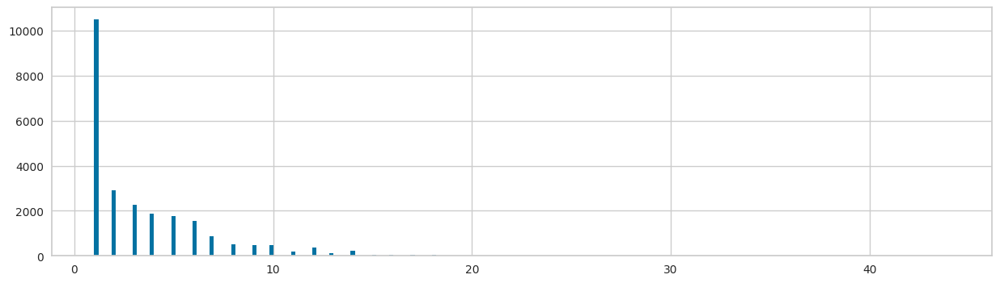

2023-07-06 08:07:28,445 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,446 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,447 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,448 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,450 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,451 - findfont: Generic family 'sans-serif' not found because none of the f

feature41


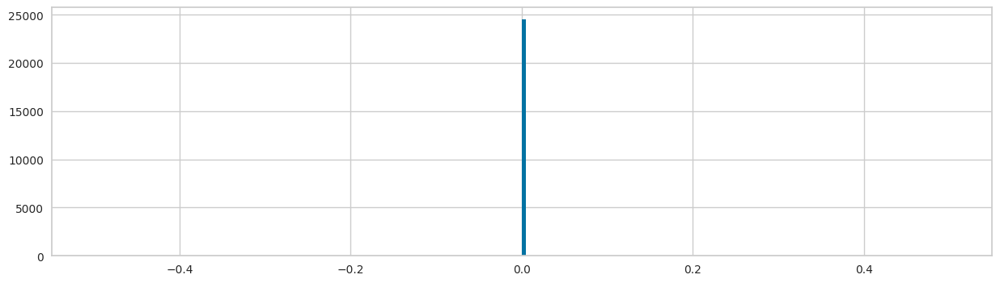

2023-07-06 08:07:28,814 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,815 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,816 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,817 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,826 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:07:28,827 - findfont: Generic family 'sans-serif' not found because none of the f

label


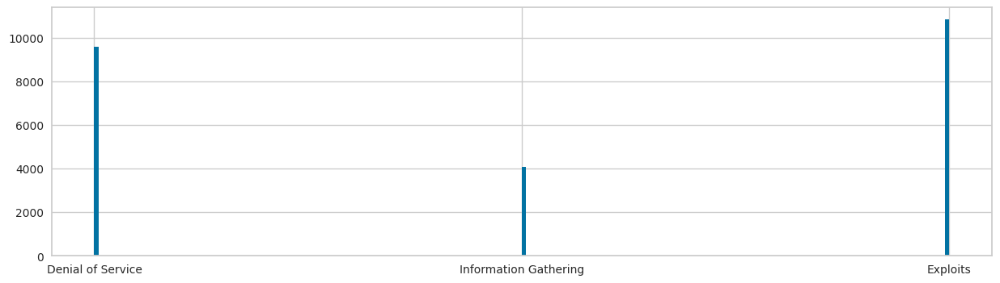

In [41]:
tmp = df_prob2[df_prob2.label.isin(test)]
for col in tmp.columns:
    fig = plt.figure(figsize=(15, 4))
    tmp[col].hist(bins=200)
    print(col)
    plt.show()

<Axes: >

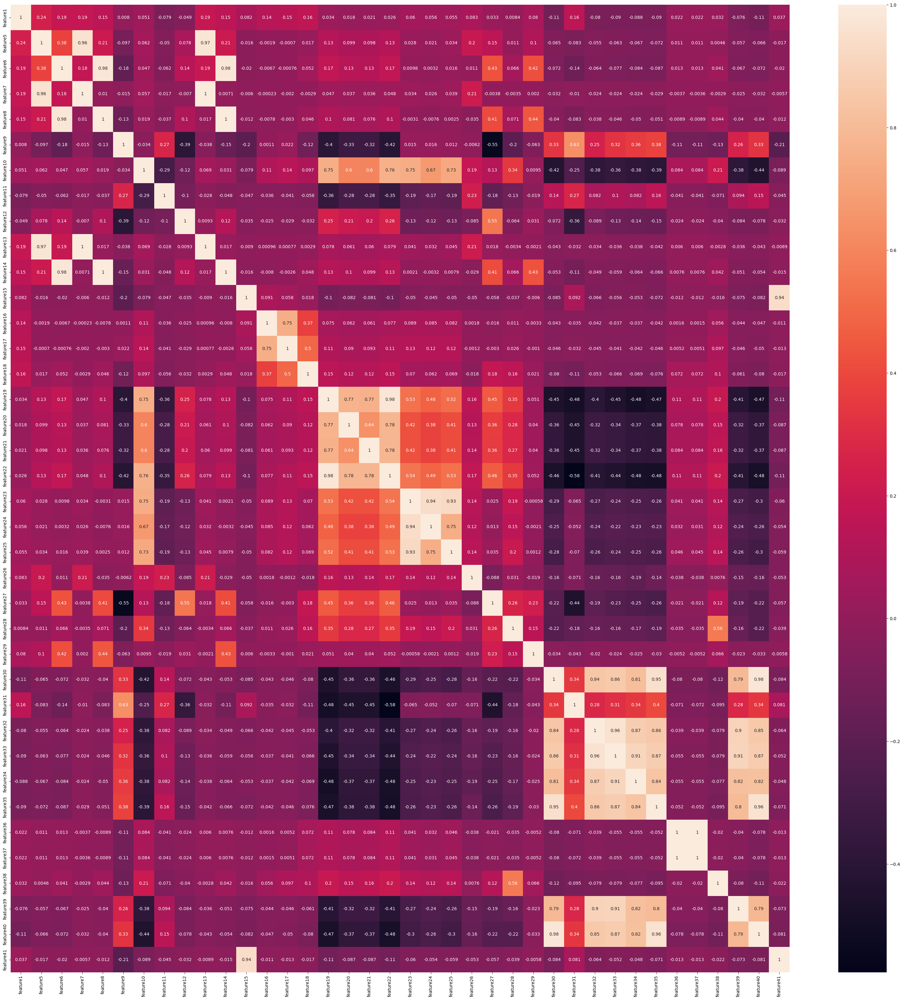

In [33]:
plt.figure(figsize=(40, 40))
sns.heatmap(df_num.corr(), annot=True)

In [15]:
df_num[['feature7', 'feature13']]

,feature7,feature13
0,2438.0,7.0
1,1684.0,3.0
2,114.0,0.0
3,2618.0,3.0
4,130.0,0.0
...,...,...
61836,37232.0,18.0
61837,608.0,1.0
61838,114.0,0.0
61839,200.0,0.0


In [31]:
df_prob2.label.unique()

array(['Normal', 'Other', 'Denial of Service', 'Information Gathering',
       'Exploits', 'Malware'], dtype=object)

In [15]:
test = ['Denial of Service', 'Exploits', 'Information Gathering']

In [16]:
df_prob2[df_prob2.label.isin(test)]

,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,feature10,...,feature33,feature34,feature35,feature36,feature37,feature38,feature39,feature40,feature41,label
3,1.467246,tcp,ftp,FIN,12.0,12.0,2618.0,682.0,254.0,252.0,...,1.0,1.0,3.0,0.0,0.0,0.0,2.0,3.0,0.0,Denial of Service
6,0.693530,tcp,http,FIN,10.0,6.0,996.0,268.0,254.0,252.0,...,1.0,1.0,7.0,0.0,0.0,1.0,3.0,1.0,0.0,Information Gathering
12,0.000009,gre,-,INT,2.0,0.0,156.0,0.0,254.0,0.0,...,1.0,1.0,63.0,0.0,0.0,0.0,1.0,1.0,0.0,Denial of Service
13,0.000007,sccopmce,-,INT,2.0,0.0,200.0,0.0,254.0,0.0,...,3.0,3.0,6.0,0.0,0.0,0.0,4.0,6.0,0.0,Exploits
14,0.000005,udp,-,INT,2.0,0.0,1064.0,0.0,254.0,0.0,...,1.0,1.0,2.0,0.0,0.0,0.0,1.0,2.0,0.0,Denial of Service
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61830,0.000008,pgm,-,INT,2.0,0.0,200.0,0.0,254.0,0.0,...,1.0,1.0,6.0,0.0,0.0,0.0,8.0,6.0,0.0,Exploits
61831,1.884518,tcp,http,FIN,10.0,10.0,848.0,1192.0,62.0,252.0,...,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,Information Gathering
61832,1.110327,tcp,-,FIN,14.0,10.0,774.0,556.0,254.0,252.0,...,1.0,1.0,1.0,0.0,0.0,0.0,2.0,2.0,0.0,Denial of Service
61837,0.929489,tcp,-,FIN,10.0,10.0,608.0,646.0,254.0,252.0,...,3.0,3.0,3.0,0.0,0.0,0.0,3.0,3.0,0.0,Exploits


In [17]:
import lightgbm as gbm

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df[df.columns[:-1]], df[df.columns[-1]],  test_size=0.2, random_state=42)


In [19]:
from sklearn.preprocessing import LabelEncoder
class MultiColumnLabelEncoder:
    def __init__(self,columns = None):
        self.columns = columns # array of column names to encode

    def fit(self,X,y=None):
        return self # not relevant here

    def transform(self,X):
        '''
        Transforms columns of X specified in self.columns using
        LabelEncoder(). If no columns specified, transforms all
        columns in X.
        '''
        output   = X.copy()
        if self.columns is not None:
            for col in self.columns:
                output[col] = LabelEncoder().fit_transform(output[col])
        else:
            for colname,col in output.iteritems():
                output[colname] = LabelEncoder().fit_transform(col)
        return output

    def fit_transform(self,X,y=None):
        return self.fit(X,y).transform(X)

In [20]:
df = MultiColumnLabelEncoder(columns = df_cat.columns).fit_transform(df_prob2)

In [21]:
X_train, X_test, y_train, y_test = train_test_split(df[df.columns[:-1]], df[df.columns[-1]],  test_size=0.2, random_state=42)


In [22]:
clf = gbm.LGBMClassifier()
clf.fit(X_train, y_train)

LGBMClassifier()

In [23]:
y_pred = clf.predict(X_test)

In [24]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_pred, y_test)
print('LightGBM Model accuracy score: {0:0.4f}'.format(accuracy_score(y_test, y_pred)))

LightGBM Model accuracy score: 0.8277


In [26]:
from pycaret.classification import *

s = setup(df, target = 'label', session_id = 123)
md = create_model('lightgbm')

,Description,Value
0,Session id,123
1,Target,label
2,Target type,Multiclass
3,Original data shape,"(61841, 42)"
4,Transformed data shape,"(61841, 42)"
5,Transformed train set shape,"(43288, 42)"
6,Transformed test set shape,"(18553, 42)"
7,Numeric features,41
8,Preprocess,True
9,Imputation type,simple


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8221,0.9721,0.8221,0.8229,0.8162,0.7634,0.7658
1,0.8196,0.9715,0.8196,0.8200,0.8117,0.7597,0.7631
2,0.8256,0.9723,0.8256,0.8218,0.8166,0.7674,0.7703
3,0.8212,0.9725,0.8212,0.8208,0.8164,0.7622,0.7635
4,0.8348,0.9748,0.8348,0.8310,0.8285,0.7800,0.7817
5,0.8217,0.9715,0.8217,0.8215,0.8162,0.7627,0.7647
6,0.8189,0.9713,0.8189,0.8170,0.8130,0.7587,0.7605
7,0.8284,0.9731,0.8284,0.8270,0.8226,0.7714,0.7733
8,0.8297,0.9734,0.8297,0.8276,0.8224,0.7734,0.7762


In [28]:

best = s.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8255,0.9727,0.8255,0.8243,0.8190,0.7677,0.7700,0.1730
xgboost,Extreme Gradient Boosting,0.8240,0.9724,0.8240,0.8240,0.8193,0.7659,0.7674,0.0740
catboost,CatBoost Classifier,0.8205,0.9714,0.8205,0.8196,0.8161,0.7613,0.7624,0.1120
gbc,Gradient Boosting Classifier,0.8154,0.9694,0.8154,0.8140,0.8086,0.7542,0.7564,0.1610
rf,Random Forest Classifier,0.8151,0.9618,0.8151,0.8132,0.8123,0.7547,0.7552,0.4350
et,Extra Trees Classifier,0.8142,0.9453,0.8142,0.8146,0.8122,0.7533,0.7537,1.2490
dt,Decision Tree Classifier,0.7909,0.8890,0.7909,0.7957,0.7919,0.7236,0.7240,0.0420
ada,Ada Boost Classifier,0.7306,0.8563,0.7306,0.7223,0.7239,0.6430,0.6437,0.0700
ridge,Ridge Classifier,0.7126,0.0000,0.7126,0.6889,0.6875,0.6151,0.6182,0.0570
lda,Linear Discriminant Analysis,0.6840,0.9326,0.6840,0.7663,0.6976,0.5932,0.6169,0.0520


2023-07-06 08:13:37,368 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:13:37,369 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:13:37,370 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:13:37,373 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:13:37,385 - findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
2023-07-06 08:13:37,386 - findfont: Generic family 'sans-serif' not found because none of the f

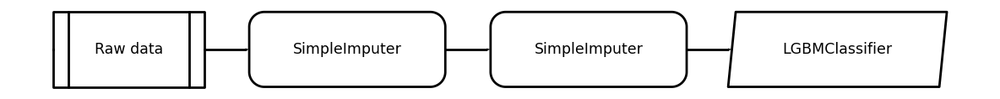

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [30]:
evaluate_model(best)

In [31]:
s.plot_model(best, plot = 'acc')

ValueError: Plot Not Available. Please see docstring for list of available Plots.

In [ ]:
s.plot_model(best, plot = 'confusion_matrix')



In [28]:
s.predict_model(best)



,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.8263,0.9723,0.8263,0.8248,0.8186,0.7684,0.7711


,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,feature10,...,feature35,feature36,feature37,feature38,feature39,feature40,feature41,label,prediction_label,prediction_score
17331,0.000009,118,2,4,2.0,0.0,114.0,0.0,254.0,0.0,...,38.0,0.0,0.0,0.0,16.0,38.0,0.0,5,5,0.9999
34279,2.110018,112,5,3,10.0,8.0,784.0,354.0,254.0,252.0,...,1.0,0.0,0.0,1.0,1.0,2.0,0.0,2,1,0.5342
5025,0.000009,118,2,4,2.0,0.0,114.0,0.0,254.0,0.0,...,26.0,0.0,0.0,0.0,26.0,26.0,0.0,5,5,1.0000
28342,0.000004,118,2,4,2.0,0.0,114.0,0.0,254.0,0.0,...,43.0,0.0,0.0,0.0,25.0,43.0,0.0,5,5,1.0000
30900,7.788106,112,5,3,334.0,746.0,17850.0,1087890.0,31.0,29.0,...,1.0,0.0,0.0,1.0,1.0,2.0,0.0,4,4,0.9999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59870,0.018126,112,0,3,16.0,18.0,1540.0,1644.0,31.0,29.0,...,2.0,0.0,0.0,0.0,3.0,6.0,0.0,4,4,0.9999
15995,1.124700,112,0,3,12.0,10.0,1104.0,842.0,254.0,252.0,...,2.0,0.0,0.0,0.0,2.0,3.0,0.0,0,0,0.6040
16236,0.001048,118,2,1,2.0,2.0,146.0,178.0,31.0,29.0,...,6.0,0.0,0.0,0.0,3.0,3.0,0.0,4,4,0.9999
37225,2.310376,112,3,3,14.0,12.0,756.0,682.0,254.0,252.0,...,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0,0,0.5320


In [ ]:

md = create_model('lightgbm')

tuned, tuner = tune_model(md, optimize = 'acc', n_iter =200, search_library = 'optuna', choose_better = True, return_tuner=True)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8221,0.9721,0.8221,0.8229,0.8162,0.7634,0.7658
1,0.8196,0.9715,0.8196,0.8200,0.8117,0.7597,0.7631
2,0.8256,0.9723,0.8256,0.8218,0.8166,0.7674,0.7703
3,0.8212,0.9725,0.8212,0.8208,0.8164,0.7622,0.7635
4,0.8348,0.9748,0.8348,0.8310,0.8285,0.7800,0.7817
5,0.8217,0.9715,0.8217,0.8215,0.8162,0.7627,0.7647
6,0.8189,0.9713,0.8189,0.8170,0.8130,0.7587,0.7605
7,0.8284,0.9731,0.8284,0.8270,0.8226,0.7714,0.7733
8,0.8297,0.9734,0.8297,0.8276,0.8224,0.7734,0.7762


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,08:07:56
Status,. . . . . . . . . . . . . . . . . .,Searching Hyperparameters
Estimator,. . . . . . . . . . . . . . . . . .,Light Gradient Boosting Machine


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

[I 2023-07-06 08:07:58,265] Searching the best hyperparameters using 43288 samples...


[LightGBM] [Warning] bagging_fraction is set=0.9971153681272829, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9971153681272829
[LightGBM] [Warning] feature_fraction is set=0.5657867174411171, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5657867174411171
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] bagging_fraction is set=0.4319493055434207, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4319493055434207
[LightGBM] [Warning] feature_fraction is set=0.9059656234873593, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9059656234873593
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.453453939317212, subsample=1.0 will be ignored. Current value: bagging_fraction=0.453453939317212
[LightGBM] [Warning] feature_fraction